# Feature Engineering for Cambridge UK Weather Forecasting

Feature engineering for time series analysis of Cambridge UK temperature measurements taken at the [University computer lab weather station](https://www.cl.cam.ac.uk/research/dtg/weather/).

This notebook is being developed on [Google Colab](https://colab.research.google.com), using [LightGBM](https://lightgbm.readthedocs.io/) and the [Darts](https://unit8co.github.io/darts/) time series package.  Initially I was most interested in short term temperature forecasts (less than 2 hours) but now mostly produce results up to 24 hours in the future for comparison with earlier [baselines](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/cammet_baselines_2021.ipynb).

See my previous notebooks, web apps etc:
 * [Cambridge UK temperature forecast python notebooks](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks)
 * [Cambridge UK temperature forecast R models](https://github.com/makeyourownmaker/CambridgeTemperatureModel)
 * [Bayesian optimisation of prophet temperature model](https://github.com/makeyourownmaker/BayesianProphet)
 * [Cambridge University Computer Laboratory weather station R shiny web app](https://github.com/makeyourownmaker/ComLabWeatherShiny)

The linked notebooks, web apps etc contain further details including:
 * data description
 * data cleaning and preparation
 * data exploration

In particular, see the notebooks:
 * [cammet_baselines_2021](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/cammet_baselines_2021.ipynb) including persistent, simple exponential smoothing, Holt Winter's exponential smoothing and vector autoregression
 * [keras_mlp_fcn_resnet_time_series](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/keras_mlp_fcn_resnet_time_series.ipynb), which uses a streamlined version of data preparation from [Tensorflow time series forecasting tutorial](https://www.tensorflow.org/tutorials/structured_data/time_series)
 * [lstm_time_series](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/lstm_time_series.ipynb) with stacked LSTMs, bidirectional LSTMs and ConvLSTM1D networks
 * [cnn_time_series](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/cnn_time_series.ipynb) with Conv1D, multi-head Conv1D, Conv2D and Inception-style models
 * [encoder_decoder](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/encoder_decoder.ipynb) which includes autoencoder with attention, encoder decoder with teacher forcing, transformer with teacher forcing and padding, encoder only with MultiHeadAttention
 * [gradient_boosting](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/gradient_boosting.ipynb) lightGBM models with darts time series framework and Borota-style shadow variables for feature selection
 * [tsfresh_feature_engineering](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/tsfresh_feature_engineering.ipynb) automated feature engineering and selection for time series analysis of Cambridge UK weather measurements

Most of the above repositories, notebooks, web apps etc were built on both less data and less thoroughly cleaned data.

---

## Table of Contents


**TODO** Add internal links before "final" commits

Some sections may get added/deleted during development.

Don't want any broken links, so finish later.


Gradient Boosted Trees Introduction

Code Setup
 * Library Imports
 * Environment Variables
 * Custom Functions

Data Setup
 * [Import ComLab Data](#import)
 * Solar Feature Calculations
 * Split Data
 * Seasonal Decomposition
    * prophet
    * statsmodels - unobserved componets model

Exploratory Data Analysis
 * Stationarity Tests
 * Correlation Calculations?
 * Correlogram
 * Granger Causality Tests

Feature Engineering
 * catch22
 * tsfeatures
 * Bivariate features
 * ...

Conclusion
 * What Worked
 * What Failed
 * Rejected Ideas
 * Future Work

Metadata


## Code Setup

### Install tsfeatures Library

Install [tsfeatures](https://github.com/Nixtla/tsfeatures) because it is currently not available on google colab.

**WARNING**: You may need to restart the google colab runtime after this install.

In [ ]:
!pip install tsfeatures

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.0/983.0 kB 17.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.8/233.8 kB 24.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 5.3 MB/s eta 0:00:00
  Created wheel for antropy: filename=antropy-0.1.6-py3-none-any.whl size=16880 sha256=b23392c4a644172f0b29f55a9523056773e1d1745a0de1d6d24b629ccf2878d5
  Stored in directory: /root/.cache/pip/wheels/98/22/06/e91d7bb213c7133d5e2eb34258623e1e19928d5f05e1ee6812
  Created wheel for supersmoother: filename=supersmoother-0.4-py3-none-any.whl size=16145 sha256=cd75b3ed540ebd56a53c12b34b62c7be661a61a4b2598312eab2ef4b5c150247
  Stored in directory: /root/.cache/pip/wheels/cf/6a/f2/3d545d90957029bf34179d21e077f84eeb96d7dfe668268494
Successfully built antropy supersmoother



### Load Libraries

Load most of the required packages.

In [ ]:
import re
import sys
import math
import timeit
import datetime
import itertools
import subprocess
import pkg_resources

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
from tqdm import tqdm
from scipy import stats, special
from prophet import Prophet
from itertools import product
import statsmodels.api as sm
from statsmodels.tsa.stattools import acf, pacf, lagmat, coint
from statsmodels.tsa.stattools import adfuller, kpss, grangercausalitytests
from statsmodels.nonparametric.smoothers_lowess import lowess
from sklearn.utils import check_X_y
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler, SplineTransformer
from sklearn.feature_selection import f_regression, mutual_info_regression, r_regression


# Reduces variance in results but won't eliminate it :-(
%env PYTHONHASHSEED=0
import random

# set seed to make all processes deterministic
seed = 0
random.seed(seed)
np.random.seed(seed)


%matplotlib inline

env: PYTHONHASHSEED=0



### Environment Variables

Set some environment variables:


In [ ]:
HORIZON = 48
Y_COL   = 'y_des' # 'y_des_fft' 'y_res' 'y'
CORE_FEATS = [Y_COL, 'dew.point_des', 'humidity', 'pressure']
FUT_FEATS  = ['irradiance', 'za_rad', 'azimuth_cos']

DAY  = 24 * 60 * 60
YEAR = 365.2425 * DAY

DAILY_OBS  = 48
YEARLY_OBS = int(365.2425 * DAILY_OBS)  # annual observations
DAY_SECS_STEP = int(DAY / DAILY_OBS)


### Custom Functions

Next, define some utility functions:
 * `rmse_`
 * `mse_`
 * `mae_`
 * `summarise_backtest`
 * `print_rmse_mae`
 * `drop_cols_correlated_with_feat_cols`
 * `drop_problem_cols`
 * `summarise_historic_comparison`
 * `plot_lagged_feat_imp_subplot`
 * `get_pastcov_features`
 * `get_pastcov_lags`
 * `plot_lagged_feature_importances`
 * `plot_feature_importances`
 * `get_feature_importances`
 * `expand_grid`
 * `keep_key`
 * `get_historic_comparison`
 * `_plot_xy_for_label`
 * `plot_multistep_obs_vs_preds`
 * `plot_multistep_obs_vs_mean_preds_by_step`
 * `plot_multistep_obs_preds_dists`
 * `plot_multistep_residuals`
 * `plot_multistep_residuals_dist`
 * `plot_multistep_residuals_vs_predicted`
 * `se_`
 * `metric_ci_vals`
 * `plot_horizon_metrics`
 * `plot_horizon_metrics_boxplots`
 * `plot_multistep_diagnostics`
 * `_filter_out_missing`
 * `plot_multistep_forecast_examples`
 * `get_rmse_mae_from_backtest`
 * `plot_catboost_learning_curve`
 * `plot_lgb_learning_curve`
 * `drop_correlated_cols`
 * `get_feature_selection_scores`
 * `plot_observation_examples`
 * `sanity_check_df_rows_cols_labels`
 * `sanity_check_before_after_dfs`
 * `sanity_check_train_valid_test`
 * `print_train_valid_test_shapes`
 * `plot_feature_history`
 * `plot_feature_history_separately`
 * `check_high_low_thresholds`
 * `get_features_filename`
 * `merge_data_and_aggs`
 * `get_rolling_features`
 * `finalise_rolling_features`
 * `print_null_columns`
 * `print_na_locations`
 * `get_features`
 * `get_darts_series`
 * `plot_short_term_acf`
 * `plot_long_term_acf`



In [ ]:
def _check_obs_preds_lens_eq(obs, preds):
    obs_preds_lens_eq = 1

    if len(obs) != len(preds):
        print("obs:  ", len(obs))
        print("preds:", len(preds))
        obs_preds_lens_eq = 0

    return obs_preds_lens_eq


def rmse_(obs, preds):
    if _check_obs_preds_lens_eq(obs, preds) == 0:
        stop()
    else:
        return np.sqrt(np.mean((obs - preds) ** 2))


def mse_(obs, preds):
    if _check_obs_preds_lens_eq(obs, preds) == 0:
        stop()
    else:
        return np.mean((obs - preds) ** 2)


def mae_(obs, preds):
    "mean absolute error - equivalent to the keras loss function"
    if _check_obs_preds_lens_eq(obs, preds) == 0:
        stop()
    else:
        return np.mean(np.abs(obs - preds))      # keras loss
        # return np.median(np.abs(obs - preds))  # earlier baselines


# TODO Remove me?
def summarise_backtest(backtest, df, horizon = HORIZON, digits = 6, y_col = Y_COL):

    if len(backtest[0]) == 1:
        print("\n# Backtest RMSE:", round(rmse_(val_ser[-len(backtest):].values(), backtest.values()), digits))
        print("# Backtest MAE: ",   round( mae_(val_ser[-len(backtest):].values(), backtest.values()), digits))

        print("\nbacktest[", y_col, "]:\n", sep='')
        backtest_stats = stats.describe(backtest[y_col].values())
        print("count\t", backtest_stats[0])
        print("mean\t",  round(backtest_stats[2][0], digits))
        print("std\t",   round(np.sqrt(backtest_stats[3][0]), digits))
        print("min\t",   round(np.min(backtest_stats[1]), digits))
        print("25%\t",   round(np.percentile(backtest[y_col].values(), 25), digits))
        print("50%\t",   round(np.median(backtest[y_col].values()), digits))
        print("75%\t",   round(np.percentile(backtest[y_col].values(), 75), digits))
        print("max\t",   round(np.max(backtest_stats[1]), digits))
    elif len(backtest[0]) == horizon:
        preds_df = pd.concat([backtest[i].pd_dataframe() for i in range(len(backtest))], axis=0)
        trues_df = df.loc[preds_df.index, [y_col]]
        hist_comp = pd.concat([trues_df, preds_df[y_col]], axis = 1)
        hist_comp.columns = [y_col, 'pred']
        list_int = [i for i in range(1, horizon + 1)]
        reps = len(hist_comp) // len(list_int)
        hist_comp['step'] = np.tile(list_int, reps)

        print("\nBacktest RMSE all:", round(rmse_(hist_comp[y_col], hist_comp['pred']), digits))
        print("Backtest MAE all: ",    round(mae_(hist_comp[y_col], hist_comp['pred']), digits))

        print("\n# Backtest RMSE 48th:", round(rmse_(hist_comp.loc[hist_comp['step'] == horizon, y_col], \
                                                     hist_comp.loc[hist_comp['step'] == horizon, 'pred']), digits))
        print("# Backtest MAE 48th: ",    round(mae_(hist_comp.loc[hist_comp['step'] == horizon, y_col], \
                                                     hist_comp.loc[hist_comp['step'] == horizon, 'pred']), digits))

        lasttest_stats = stats.describe(hist_comp['pred'])
        print("\nbacktest[", y_col, "]:\n", sep='')
        print("count\t", len(hist_comp['pred']))
        print("mean\t",  round(lasttest_stats[2], digits))
        print("std\t",   round(np.sqrt(lasttest_stats[3]), digits))
        print("min\t",   round(np.min(lasttest_stats[1]), digits))
        print("25%\t",   round(np.percentile(hist_comp['pred'], 25), digits))
        print("50%\t",   round(np.median(hist_comp['pred']), digits))
        print("75%\t",   round(np.percentile(hist_comp['pred'], 75), digits))
        print("max\t",   round(np.max(lasttest_stats[1]), digits))


def print_rmse_mae(obs, preds, postfix_str, prefix_str = '', digits = 6):
    print(prefix_str, "Backtest RMSE ", postfix_str, ": ",
          round(rmse_(obs, preds), digits),
          sep='')
    print(prefix_str, "Backtest MAE ",  postfix_str, ":  ",
          round( mae_(obs, preds), digits),
          sep='')
    print()


def drop_cols_correlated_with_feat_cols(df, feats_df, threshold=0.95):

  for feat_col in feats_df.columns:
    corrs = df.corrwith(feats_df[feat_col])
    drop_cols = corrs[(corrs > threshold) & (corrs != 1.0)]

    for i in range(len(drop_cols)):
      drop_col = drop_cols.index[i]
      if drop_col in df.columns:  # and drop_col not in feats_df.columns:
        del df[drop_col]

  return df


def drop_problem_cols(df, lag, drop_cor=True,
                      var_cutoff=0.05, cor_cutoff=0.95, na_cutoff=0.05,
                      verbose = False):

  if verbose:
    print('drop_problem_cols - start:', df.shape)


  # drop all NA columns
  df = df.dropna(axis = 1, how = 'all')

  if verbose:
    print('drop_problem_cols - after dropna:', df.shape)


  # drop single value columns
  df = df.loc[:, (df != df.iloc[lag]).any()]

  if verbose:
    print('drop_problem_cols - after drop single value cols:', df.shape)


  # drop low variance columns
  if 'ds' in df.columns:
    df = df.drop(['ds'], axis=1)
    df = df.loc[:, df.std() > var_cutoff]
    df['ds'] = df.index
  else:
    df = df.loc[:, df.std() > var_cutoff]

  if verbose:
    print('drop_problem_cols - after drop low var cols:', df.shape)


  # drop highly correlated columns
  if drop_cor:
    df = drop_correlated_cols(df, cor_cutoff)

  if verbose:
    print('drop_problem_cols - after drop correlated cols:', df.shape)


  # drop cols with high % of NA values
  pc_thresh = int(na_cutoff * df.shape[0])
  #print('five_pc_thresh:', five_pc_thresh)
  print('columns with null values:')
  display(df.isnull().sum())
  df = df.loc[:, df.isnull().sum() < pc_thresh]

  if verbose:
    print('drop_problem_cols - after drop high % of NAs:', df.shape)

  return df


def summarise_historic_comparison(hc, df, horizon = HORIZON,
                                  digits = 6,
                                  y_col = Y_COL,
                                  df_name = 'valid_df'):

    print('\n')
    print_rmse_mae(hc[y_col], hc['pred'], 'all')

    obs   = hc.loc[hc['step'] == horizon, y_col]
    preds = hc.loc[hc['step'] == horizon, 'pred']
    if horizon == 1:
      post_str = '1st'
    elif horizon == 2:
      post_str = '2nd'
    elif horizon == 3:
      post_str = '3rd'
    else:
      post_str = str(horizon) + 'th'
    print_rmse_mae(obs, preds, post_str, '# ')

    obs   = hc.loc[hc['missing'] == 0.0, y_col]
    preds = hc.loc[hc['missing'] == 0.0, 'pred']
    print_rmse_mae(obs, preds, 'miss==0')

    obs   = hc.loc[hc['missing'] == 1.0, y_col]
    preds = hc.loc[hc['missing'] == 1.0, 'pred']
    print_rmse_mae(obs, preds, 'miss==1')

    if y_col == 'y_des':
      # preds = hc['pred'] - hc['y_seasonal']
      preds = hc['pred'] - hc['y_yearly'] - hc['y_daily'] - hc['y_trend']
    elif y_col == 'y_des_fft':
      preds = hc['pred'] - hc['y_fft']
    elif y_col == 'y':
      preds = hc['pred']
    elif y_col == 'y_res':
      preds = hc['pred'] - hc['y_yearly'] - hc['y_daily']

    preds.dropna(inplace=True)
    lasttest_stats = stats.describe(preds)
    print("\nbacktest['", y_col, "']:", sep='')
    print("count\t", len(preds))
    print("mean\t",  round(lasttest_stats[2], digits))
    print("std\t",   round(np.sqrt(lasttest_stats[3]), digits))
    print("min\t",   round(np.min(lasttest_stats[1]), digits))
    print("25%\t",   round(np.percentile(preds, 25), digits))
    print("50%\t",   round(np.median(preds), digits))
    print("75%\t",   round(np.percentile(preds, 75), digits))
    print("max\t",   round(np.max(lasttest_stats[1]), digits))

    print("\n", df_name, "['", y_col, "']:\n", df[y_col].describe(), '\n', sep='')


def plot_lagged_feat_imp_subplot(fi_df, subset):
    bar_height = 0.25
    title = 'Feature importance'

    fi_max = fi_df['importance'].max()
    if fi_max > 100:
      xl_max = int(np.ceil(fi_max / 100.0)) * 100
    elif fi_max > 10:
      xl_max = int(np.ceil(fi_max / 10.0)) * 10
    else:
      xl_max = fi_max

    if subset is not None:
      fi_df = fi_df.loc[fi_df['feature'].str.contains(subset, regex=True), :]
      title += ' - ' + subset + ' features'
      plt.figure(figsize=(7, 3))
    else:
      title += ' - all features'
      plt.figure(figsize=(20, 10))

    plt.xlim(0, xl_max)
    plt.barh(width  = fi_df['importance'],
             y      = fi_df['feature'],
             height = bar_height)


    def plot_highlighted_lagged_feat_imp_subset(data, subset_str, hl_col, bar_height = 0.25):
        data_subset = data.loc[data['feature'].str.contains(subset_str, regex=True), :]

        plt.barh(width  = data_subset['importance'],
                 y      = data_subset['feature'],
                 height = bar_height,
                 color  = hl_col)


    plot_highlighted_lagged_feat_imp_subset(fi_df, 'shadow', 'red')

    yregex = '^' + Y_COL
    ytarg_str = yregex + '_target_'
    plot_highlighted_lagged_feat_imp_subset(fi_df, ytarg_str, 'green')

    ypcov_str = yregex + '_pastcov_'
    plot_highlighted_lagged_feat_imp_subset(fi_df, ypcov_str, 'blue')

    plt.title(title)
    plt.show()


def get_pastcov_features(fi_df):
    pcov_feats_long = fi_df.loc[fi_df['feature'].str.contains('_pastcov_'), 'feature'].to_list()

    r = re.compile('_pastcov_.*$')

    pcov_feats_dups = [r.sub('', pcov_feat_long) for pcov_feat_long in pcov_feats_long]
    pcov_feats = list(set(pcov_feats_dups))

    if Y_COL in pcov_feats:
      pcov_feats.remove(Y_COL)

    return pcov_feats


def get_pastcov_lags(fi_df):
    pcov_feats_long = fi_df.loc[fi_df['feature'].str.contains('_pastcov_'), 'feature'].to_list()

    r = re.compile('^.*_pastcov_')

    pcov_lags_dups = [r.sub('', pcov_feat_long) for pcov_feat_long in pcov_feats_long]
    pcov_lags = list(set(pcov_lags_dups))

    return pcov_lags


# TODO: Also, consider combining plot_feature_importances and
#       plot_lagged_feature_importances into a single function
def plot_lagged_feature_importances(model):
    '''Plot feature importance for models with multiple lags

    Should be easier to compare importance across features, lags, targets
    and past covariates

    No support for future covariates

    Use plot_feature_importances function for lags = 1, past_cov_lags = 1 models

    '''

    imp_thresh = 0
    if isinstance(model, CatBoostModel):
      imp_thresh = 0  # some catboost importance values below 1
    elif isinstance(model, LightGBMModel):
      imp_thresh = 1

    imp_df = pd.DataFrame({'feature':    model.lagged_feature_names,
                           'importance': model.model.feature_importances_})
    imp_df = imp_df.sort_values('importance')

    plot_lagged_feat_imp_subplot(imp_df, None)
    plot_lagged_feat_imp_subplot(imp_df, '^' + Y_COL)

    pcov_feats = get_pastcov_features(imp_df)
    for pcov_feat in pcov_feats:
        plot_lagged_feat_imp_subplot(imp_df, '^' + pcov_feat)

    pcov_lags = get_pastcov_lags(imp_df)
    for pcov_lag in pcov_lags:
        plot_lagged_feat_imp_subplot(imp_df, '_pastcov_' + pcov_lag + '$')


# TODO: Consider combining plot_feature_importances and
#       plot_lagged_feature_importances into a single function
def plot_feature_importances(model, \
                             y_col        = Y_COL, \
                             include_cols = None,  \
                             exclude_cols = None):
    '''Plot feature importances from lightGBM models

    WARNING: Only works with lags = 1 and lags_past_cov = 1
             Use plot_lagged_feature_importances for models with additional lags
    '''

    imp_thresh = 0
    if isinstance(model, CatBoostModel):
      imp_thresh = 0  # some catboost importance values below 1
    elif isinstance(model, LightGBMModel):
      imp_thresh = 1

    if include_cols is not None:
        col_names = include_cols
    else:
        col_names = model.lagged_feature_names

    cols_df = pd.DataFrame({'feature': col_names,
                            'importance': model.model.feature_importances_})
    cols_df = cols_df.sort_values('importance')
    cols_df = cols_df[cols_df.importance >= imp_thresh]

    if exclude_cols is not None:
      cols_df = cols_df[~cols_df['feature'].isin(exclude_cols)]

    # print("cols_df:", cols_df, sep='\n')

    plt.figure(figsize=(20, 10))
    plt.barh(width  = cols_df['importance'],
             y      = cols_df['feature'],
             height = 0.25);
    plt.barh(width  = cols_df.loc[cols_df['feature'].str.contains('shadow'),
                                  'importance'],
             y      = cols_df.loc[cols_df['feature'].str.contains('shadow'),
                                  'feature'],
             height = 0.25,
             color  = 'red')
    plt.title('Feature importance\nimportance threshold = ' + str(imp_thresh))
    plt.show()


def get_feature_importances(model,
                            y_col = Y_COL,
                            imp_thresh   = None,
                            include_cols = None,
                            exclude_cols = None,
                            verbose      = True):

    # imp_thresh = 0
    if imp_thresh is None and isinstance(model, CatBoostModel):
      imp_thresh = 0  # some catboost importance values below 1
    elif imp_thresh is None and isinstance(model, LightGBMModel):
      imp_thresh = 1

    if include_cols is not None:
        # col_names = pd.Series(include_cols)
        col_names = include_cols
    else:
        col_names = model.lagged_feature_names

    cols_df = pd.DataFrame({'feature': col_names,
                            'importance': model.model.feature_importances_})
    cols_df = cols_df.sort_values('importance')
    cols_df = cols_df[cols_df.importance >= imp_thresh]

    if exclude_cols is not None:
      cols_df = cols_df[~cols_df['feature'].isin(exclude_cols)]

    # print("cols_df:", cols_df, sep='\n')

    shadow_str = '_shadow_'
    if shadow_str in ''.join(cols_df['feature'].values):
        shad_thresh = cols_df.loc[cols_df['feature'].str.contains(shadow_str),
                                  'importance'].tail(1).values[0]
    else:
        shad_thresh = 0.0
    # print('shad_thresh:', shad_thresh)

    cols_df = cols_df[cols_df['importance'] > shad_thresh]

    if verbose:
      print(cols_df.to_string(index=False), sep='\n')

    inc_cols = []
    for feature in cols_df['feature'].values:
        inc_cols.append(re.sub('_(pastcov|target|futcov)_lag.*', '', feature))

    # remove duplicates from a list, while preserving order
    seen = set()
    inc_cols = [col for col in inc_cols if col not in seen and not seen.add(col)]

    if verbose:
      print('\ninc_cols:', inc_cols)

    return inc_cols


def expand_grid(dictionary):
   return pd.DataFrame([row for row in product(*dictionary.values())],
                       columns = dictionary.keys())


def keep_key(d, k):
  """ models = keep_key(models, 'datasets') """
  return {k: d[k]}


def get_historic_comparison(backtest, df, y_col = Y_COL, horizon = HORIZON):
    if horizon > 1:
      assert len(backtest[0]) > 1

    if y_col == 'y_des':
      # cols = ['y_des', 'y_seasonal']
      cols = ['y_des', 'y_yearly', 'y_daily', 'y_trend']
    elif y_col == 'y_des_fft':
      cols = ['y_des_fft', 'y_fft']
    elif y_col == 'y_res':
      cols = ['y_res', 'y_yearly', 'y_daily']
    elif y_col == 'y':
      cols = ['y']

    # cols.extend(['missing', 'mi_filled', 'isd_outlier', 'hist_average'])
    cols.extend(['missing', 'isd_outlier'])

    preds_df = pd.concat([backtest[i].pd_dataframe() for i in range(len(backtest))], axis=0)
    trues_df = df.loc[preds_df.index, cols]

    hist_comp = pd.concat([trues_df, preds_df[y_col]], axis = 1)
    cols.append('pred')
    hist_comp.columns = cols

    # re-seasonalise
    if y_col == 'y_des':
      hist_comp['y_des'] += hist_comp['y_yearly'] + hist_comp['y_daily'] + hist_comp['y_trend']
      hist_comp['pred']  += hist_comp['y_yearly'] + hist_comp['y_daily'] + hist_comp['y_trend']
    elif y_col == 'y_des_fft':
      hist_comp['y_des_fft'] += hist_comp['y_fft']
      hist_comp['pred']      += hist_comp['y_fft']
    elif y_col == 'y_res':
      hist_comp['y_res'] += hist_comp['y_yearly'] + hist_comp['y_daily']
      hist_comp['pred']  += hist_comp['y_yearly'] + hist_comp['y_daily']


    hist_comp['res']    = hist_comp[y_col] - hist_comp['pred']
    hist_comp['res^2']  = hist_comp['res'] * hist_comp['res']
    hist_comp['res_sign']  = np.sign(hist_comp['res'])
    hist_comp['missing']   = hist_comp['missing']#.astype(int)
    # hist_comp['mi_filled'] = hist_comp['mi_filled']#.astype(int)
    # hist_comp['hist_average'] = hist_comp['hist_average']#.astype(int)

    list_int = [i for i in range(1, horizon+1)]
    reps = len(hist_comp) // len(list_int)
    hist_comp['step'] = np.tile(list_int, reps)
    hist_comp['id']   = np.repeat([i for i in range(reps)], horizon)
    hist_comp['date'] = hist_comp.index.values

    return hist_comp


def plot_one_step_abs_err_boxplot(one_step, title):
  one_step['abs_err'] = np.abs(one_step['res'])
  one_step[['abs_err']].boxplot(meanline  = False,
                                showmeans = True,
                                showcaps  = True,
                                showbox   = True,
                                # showfliers = False,
                                )
  plt.title(title + '\nboxplot with mean and median')
  plt.suptitle('')
  plt.ylabel('absolute error')
  plt.show()


def plot_one_step_residuals_dist(one_step, title):
  plt.figure(figsize = (12, 16))
  plt.subplot(5, 1, 5)
  pd.Series(one_step['res']).plot(kind = 'density', label='residuals')
  plt.xlim(-10, 10)
  plt.title(title)
  plt.show()


def plot_one_step_residuals(one_step, title):
  x_miss = one_step.loc[one_step['missing'] == 1.0, 'obs'].index
  y_miss = one_step.loc[one_step['missing'] == 1.0, 'res']

  plt.figure(figsize = (12, 16))
  plt.subplot(5, 1, 4)
  plt.scatter(x = one_step.index, y = one_step['res'])
  plt.scatter(x_miss, y_miss, color='red', label='missing')
  plt.axhline(y = 0, color = 'grey')
  plt.xlabel('Index position')
  plt.ylabel('Residuals')
  plt.legend(loc='lower right')
  plt.title(title)
  plt.show()


def plot_one_step_obs_preds_dists(one_step, title):
  obs   = one_step['obs']
  preds = one_step['preds']
  r2score = r2_score(obs, preds)

  plt.figure(figsize = (12, 16))
  plt.subplot(5, 1, 3)
  pd.Series(obs).plot(kind = 'density', label='observations')
  pd.Series(preds).plot(kind = 'density', label='predictions')
  plt.xlim(-10, 40)
  plt.title(title)
  plt.legend()
  plt.annotate("$R^2$ = {:.3f}".format(r2score), (-7.5, 0.055))
  # plt.tight_layout()
  plt.show()


def plot_one_step_obs_vs_preds(one_step, title):

  obs   = one_step['obs']
  preds = one_step['preds']
  x_miss = one_step.loc[one_step['missing'] == 1.0, 'obs']
  y_miss = one_step.loc[one_step['missing'] == 1.0, 'preds']

  r2score = r2_score(obs, preds)

  plt.figure(figsize = (12, 16))
  plt.subplot(5, 1, 1)
  plt.scatter(x = obs, y = preds)
  plt.scatter(x_miss, y_miss, color='red', label='missing')
  plt.axline((0, 0), slope=1.0, color="grey")
  plt.xlabel('Observations')
  plt.ylabel('Predictions')
  plt.legend(loc='lower right')
  plt.annotate("$R^2$ = {:.3f}".format(r2score), (-9, 31))
  plt.title(title)
  plt.xlim((-10, 35))
  plt.ylim((-10, 35))
  plt.show()


def plot_one_step_diagnostics(model, data, val_series, val_pastcov_series, title, val_fut_cov=None):
  plot_feature_importances(model)

  # re-seasonalise observations
  if Y_COL == 'y_des':
    obs = data['y_des'] + data['y_yearly'] + data['y_daily'] + data['y_trend']
  elif Y_COL == 'y_des_fft':
    obs = data['y_des_fft'] + data['y_fft']
  else:
    obs = data[Y_COL]

  # print('data:', data.shape)
  # display(data[['y_des_fft', 'y_fft']])
  # print('obs:', obs.shape)
  # display(obs)

  if val_fut_cov is None:
    res = model.residuals(series = val_series,
                          past_covariates = val_pastcov_series,
                          retrain = False).pd_series()
  else:
    res = model.residuals(series = val_series,
                          past_covariates = val_pastcov_series,
                          future_covariates = val_fut_cov,
                          retrain = False).pd_series()

  preds = obs + res
  preds = preds.dropna()
  obs  = obs[preds.index]
  res  = res[preds.index]
  miss = data.loc[preds.index, 'missing']

  print_rmse_mae(obs, preds, '1st', '# ')

  one_step = pd.concat([obs, preds, res, miss], axis=1)
  one_step.columns = ['obs', 'preds', 'res', 'missing']

  title = 'step = 1 ' + title
  plot_one_step_obs_vs_preds(one_step, title)
  # plot_obs_vs_mean_preds_by_step(hist, title)
  plot_one_step_obs_preds_dists(one_step, title)
  plot_one_step_residuals(one_step, title + ' residuals')
  plot_one_step_residuals_dist(one_step, title + ' residuals density')
  plot_one_step_residuals_acf(one_step, title + ' residuals acf')
  plot_one_step_residuals_qq(one_step, title + ' residuals qq-plot')
  plot_one_step_abs_err_boxplot(one_step, title)


def plot_one_step_residuals_qq(one_step, title_):
  fig, axs = plt.subplots(figsize=(6, 6))
  sm.qqplot(one_step['res'], line='q', ax=axs)
  axs.set_title(title_)
  plt.show()


def plot_one_step_residuals_acf(one_step, title_, max_lags = 300):
  plt.figure(figsize = (6, 6))

  acf = pd.DataFrame()
  acf_feat = 'res'

  acf[acf_feat] = [one_step[acf_feat].autocorr(l) for l in range(1, max_lags)]
  plt.plot(acf[acf_feat], label='residual')

  plt.axhline(0, linestyle='--', c='black')
  plt.ylabel('autocorrelation')
  plt.xlabel('time lags')
  plt.title(title_)
  plt.show()



def _plot_xy_for_label(data, label, x_feat, y_feat, color):
    x = data.loc[data[label] == 1.0, x_feat]
    y = data.loc[data[label] == 1.0, y_feat]

    if len(x) > 0:
        plt.scatter(x = x, y = y, color=color, alpha=0.5, label=label)


def plot_multistep_obs_vs_preds(hist, title, y_col=Y_COL):
    plt.figure(figsize = (12, 16))
    plt.subplot(5, 1, 1)
    plt.scatter(x = hist[y_col], y = hist['pred'])
    _plot_xy_for_label(hist, 'missing',      y_col, 'pred', 'red')
    # _plot_xy_for_label(hist, 'hist_average', y_col, 'pred', 'yellow')
    # _plot_xy_for_label(hist, 'mi_filled',    y_col, 'pred', 'purple')
    plt.axline((0, 0), slope=1.0, color="grey")
    plt.xlabel('Observations')
    plt.ylabel('Predictions')
    plt.legend(loc='lower right')
    obs   = hist.loc[hist[[y_col, 'pred']].notnull().all(1), y_col]
    preds = hist.loc[hist[[y_col, 'pred']].notnull().all(1), 'pred']
    r2score = r2_score(obs, preds)
    plt.annotate("$R^2$ = {:.3f}".format(r2score), (-9, 31))
    plt.title(title)
    plt.xlim((-10, 35))
    plt.ylim((-10, 35))
    plt.show()


def plot_multistep_obs_vs_mean_preds_by_step(hist, title, y_col = Y_COL,
                                             step_ = HORIZON, ci = False):
    '''For specific step, plot mean prediction for each observation

    A 95 % confidence interval is plotted, but can be disabled
    '''

    mean_preds = hist.loc[hist['step'] == step_, [y_col, 'pred']].groupby(y_col).mean('pred')
    obs   = mean_preds.index.values
    preds = mean_preds['pred'].values

    plt.figure(figsize = (12, 16))
    ax = plt.subplot(5, 1, 2)
    plt.plot(obs, preds)

    if ci is True:
      ci = 1.96 * np.std(preds) / np.sqrt(len(obs))
      # print(ci)
      ax.fill_between(obs, (preds - ci), (preds + ci), color='b', alpha=.1)

    plt.axline((0, 0), slope=1.0, color="grey")
    r2score = r2_score(obs, preds)
    plt.annotate("$R^2$ = {:.3f} - step = {}".format(r2score, step_), (-9, 31))
    plt.title(title + ' step = ' + str(step_))
    plt.xlabel('Temperature')
    plt.ylabel('Mean prediction')
    plt.xlim((-10, 35))
    plt.ylim((-10, 35))
    plt.show()


def plot_multistep_obs_preds_dists(hist, title, y_col=Y_COL):
    obs   = hist.loc[hist[[y_col, 'pred']].notnull().all(1), y_col]
    preds = hist.loc[hist[[y_col, 'pred']].notnull().all(1), 'pred']
    r2score = r2_score(obs, preds)
    plt.figure(figsize = (12, 16))
    plt.subplot(5, 1, 3)
    pd.Series(obs).plot(kind = 'density', label='observations')
    pd.Series(preds).plot(kind = 'density', label='predictions')
    plt.xlim(-10, 40)
    plt.title(title)
    plt.legend()
    plt.annotate("$R^2$ = {:.3f}".format(r2score), (-7.5, 0.055))
    #plt.tight_layout()
    plt.show()


def plot_multistep_residuals(hist, title):
    plt.figure(figsize = (12, 16))
    plt.subplot(5, 1, 4)
    plt.scatter(x = range(len(hist)), y = hist['res'])
    hist['id.2'] = range(len(hist))
    _plot_xy_for_label(hist, 'missing',      'id.2', 'res', 'red')
    # _plot_xy_for_label(hist, 'hist_average', 'id.2', 'res', 'yellow')
    # _plot_xy_for_label(hist, 'mi_filled',    'id.2', 'res', 'purple')
    plt.axhline(y = 0, color = 'grey')
    plt.xlabel('Index position')
    plt.ylabel('Residuals')
    plt.legend(loc='lower right')
    plt.title(title)
    plt.show()


def plot_multistep_residuals_dist(hist, title):
    plt.figure(figsize = (12, 16))
    plt.subplot(5, 1, 5)
    pd.Series(hist['res']).plot(kind = 'density', label='residuals')
    plt.xlim(-10, 10)
    plt.title(title)
    plt.show()


# Unused?
# TODO Diagonal structure of these plots might need further consideration
#      Add lowess fit to check for problems
def plot_multistep_residuals_vs_predicted(hist, title):
    plt.subplot(5, 1, 5)
    plt.scatter(x = hist['pred'], y = hist['res'])
    _plot_xy_for_label(hist, 'missing',      'pred', 'res', 'red')
    # _plot_xy_for_label(hist, 'hist_average', 'pred', 'res', 'yellow')
    # _plot_xy_for_label(hist, 'mi_filled',    'pred', 'res', 'purple')
    plt.axhline(y = 0, color = 'grey')

    n = 24  # slow to run all points :-(
            # 12 takes approx 2 mins to run
            #  8 takes approx 4 mins to run
    xy = hist.iloc[::n, :]
    # x = hist.iloc[::n, :]
    y_l = lowess(xy['res'], xy['pred'])
    plt.plot(y_l[:, 0], y_l[:, 1], 'green', label='lowess fit')

    plt.xlabel('Predictions')
    plt.ylabel('Residuals')
    plt.legend(loc='upper right')
    plt.title(title);


def se_(obs, preds, metric):
    '''Standard error of sum of squared residuals or sum of absolute residuals'''

    if _check_obs_preds_lens_eq(obs, preds) == 0:
        stop()

    if metric == 'rmse':
        se = np.sqrt(np.sum((obs - preds) ** 2) / len(obs))
    elif metric == 'mae':
        se = np.sqrt(np.sum(np.abs(obs - preds)) / len(obs))
    else:
        print('Unrecognised metric:', metric)
        print("metric should be 'rmse' or 'mae'")
        stop()

    return se


def metric_ci_vals(test_val, se, z_val = 1.95996):
    cil = z_val * se
    # print('cil:', cil)
    metric_cil = test_val - cil
    metric_ciu = test_val + cil

    return metric_cil, metric_ciu


# TODO: Remove unused confidence intervals
# NOTE: VAR baseline metrics cvar_rmse and cvar_mae hardcoded to 48 steps
def plot_horizon_metrics(hist, title, y_col=Y_COL, horizon = HORIZON, ci=False):
    steps = [i for i in range(1, horizon+1)]

    # calculate metrics
    z_val_95 = 1.95996
    z_val_50 = 0.674
    rmse_h,   mae_h    = np.zeros(horizon), np.zeros(horizon)
    res_se_h, abs_se_h = np.zeros(horizon), np.zeros(horizon)
    rmse_ciu, rmse_cil = np.zeros(horizon), np.zeros(horizon)
    mae_ciu,  mae_cil  = np.zeros(horizon), np.zeros(horizon)

    for i in range(1, horizon+1):
      obs   = hist.loc[hist['step'] == i, y_col]
      preds = hist.loc[hist['step'] == i, 'pred']
      rmse_h[i-1] = rmse_(obs, preds)
      mae_h[i-1]  =  mae_(obs, preds)
      res_se_h[i-1] = se_(obs, preds, 'rmse')
      abs_se_h[i-1] = se_(obs, preds, 'mae')
      # mae_h[i]  = np.median(np.abs(obs - preds))  # for comparison with baselines
      rmse_cil[i-1], rmse_ciu[i-1] = metric_ci_vals(rmse_h[i-1], res_se_h[i-1], z_val_50)
      mae_cil[i-1],  mae_ciu[i-1]  = metric_ci_vals(mae_h[i-1],  abs_se_h[i-1], z_val_50)

    # print('rmse_h:', rmse_h)
    # print('mae_h:',  mae_h)

    # plot metrics for horizons
    fig, axs = plt.subplots(1, 2, figsize = (14, 7))
    fig.suptitle(title + ' forecast horizon errors')
    axs = axs.ravel()


    mean_val_lab = title + ' mean value'
    axs[0].plot(steps, rmse_h, color='green', label=title)

    if ci is True:
      axs[0].fill_between(steps, rmse_cil, rmse_ciu, color='green', alpha=0.25)

    # i - initial, u - updated, c - corrected
    #ivar_rmse = np.array([0.39, 0.52, 0.64, 0.75, 0.86, 0.96, 1.06, 1.15, 1.23,
    #                     1.31, 1.38, 1.45, 1.51, 1.57, 1.63, 1.68, 1.73, 1.77,
    #                     1.81, 1.85, 1.89, 1.92, 1.96, 1.99, 2.02, 2.05, 2.08,
    #                     2.1 , 2.13, 2.15, 2.18, 2.2 , 2.22, 2.24, 2.26, 2.28,
    #                     2.3 , 2.31, 2.33, 2.35, 2.36, 2.38, 2.39, 2.4 , 2.42,
    #                     2.43, 2.44, 2.45])
    # NOTE: uvar_rmse tested on test_df
    #uvar_rmse = np.array([0.36, 0.49, 0.6, 0.7, 0.8, 0.89, 0.98, 1.06, 1.14,
    #                      1.21, 1.28, 1.35, 1.41, 1.47, 1.52, 1.57, 1.62, 1.66,
    #                      1.7, 1.74, 1.78, 1.81, 1.84, 1.87, 1.9, 1.93, 1.96,
    #                      1.99, 2.01, 2.03, 2.06, 2.08, 2.1, 2.12, 2.14, 2.16,
    #                      2.18,  2.19, 2.21, 2.23, 2.24, 2.26, 2.27, 2.29, 2.3,
    #                      2.31, 2.33, 2.34])
    cvar_rmse = np.array([0.49318888, 0.70222546, 0.88570688, 1.05495349,
    1.21081157, 1.34945832, 1.46844034, 1.57779714, 1.67754323, 1.7665827,
    1.84567039, 1.91561743, 1.97899766, 2.03616174, 2.08661944, 2.13396441,
    2.17809725, 2.21946156, 2.25780078, 2.29370568, 2.3272055,  2.35760153,
    2.38520845, 2.41076185, 2.43404716, 2.45466806, 2.47361784, 2.49117761,
    2.50625606, 2.52023589, 2.53319205, 2.54566125, 2.55764924, 2.56870554,
    2.57976955, 2.59102429, 2.6018822, 2.61242356, 2.62280045, 2.63353767,
    2.64410312, 2.65458709, 2.66532837, 2.67609086, 2.68675178, 2.69745108,
    2.71002892, 2.72445726])
    #axs[0].plot(steps, ivar_rmse, color='black', label='Initial VAR')
    axs[0].plot(steps, cvar_rmse, color='blue', label='Updated VAR')
    axs[0].hlines(np.mean(rmse_h), xmin=1, xmax=horizon,
                  color='green', linestyles='dotted', label=mean_val_lab)
    axs[0].hlines(np.mean(cvar_rmse), xmin=1, xmax=horizon,
                  color='blue', linestyles='dotted', label='Updated VAR mean value')
    axs[0].set_xlabel("horizon - half hour steps")
    axs[0].set_ylabel("rmse")


    axs[1].plot(steps, mae_h, color='green', label=title)

    if ci is True:
      axs[1].fill_between(steps, mae_cil, mae_ciu, color='green', alpha=0.25)

    # NOTE: ivar_mae tested on test_df
    #ivar_mae = np.array([0.39, 0.49, 0.57, 0.66, 0.74, 0.83, 0.91, 0.98, 1.05,
    #                    1.12, 1.18, 1.24, 1.29, 1.34, 1.39, 1.43, 1.47, 1.5 ,
    #                    1.53, 1.56, 1.59, 1.62, 1.64, 1.66, 1.68, 1.7 , 1.72,
    #                    1.73, 1.75, 1.76, 1.77, 1.78, 1.8 , 1.81, 1.82, 1.83,
    #                    1.83, 1.84, 1.85, 1.85, 1.86, 1.86, 1.87, 1.87, 1.88,
    #                    1.88, 1.89, 1.89])
    #uvar_mae = np.array([0.36, 0.45, 0.53, 0.61, 0.69, 0.76, 0.83, 0.9, 0.97,
    #                     1.03, 1.09, 1.14, 1.19, 1.24, 1.28, 1.32, 1.36, 1.4,
    #                     1.43, 1.46, 1.49, 1.52, 1.54, 1.56, 1.58, 1.6, 1.62,
    #                     1.63, 1.65, 1.66, 1.68, 1.69, 1.7, 1.71, 1.72, 1.73,
    #                     1.74, 1.74, 1.75, 1.75, 1.76, 1.76, 1.77, 1.77, 1.78,
    #                     1.78, 1.78, 1.78])
    cvar_mae = np.array([0.34694645, 0.50765333, 0.65132003, 0.78584432,
    0.9077075,  1.01705088, 1.11113622, 1.19759807, 1.27696634, 1.34941444,
    1.4134705,  1.47180058, 1.52304802, 1.56961154, 1.60903759, 1.64763418,
    1.68391297, 1.71690735, 1.74787094, 1.77721642, 1.80442554, 1.82951782,
    1.85358226, 1.87488643, 1.89346337, 1.91069565, 1.92613218, 1.94071845,
    1.95245349, 1.96323923, 1.9736734,  1.98370815, 1.99367508, 2.00204077,
    2.00992601, 2.01796976, 2.02747736, 2.03477489, 2.04173317, 2.04985428,
    2.05843847, 2.06731348, 2.07606609, 2.08533656, 2.09560914, 2.10668272,
    2.1183637,  2.13164371])
    #axs[1].plot(steps, ivar_mae, color='black', label='Initial VAR')
    axs[1].plot(steps, cvar_mae, color='blue', label='Updated VAR')
    axs[1].hlines(np.mean(mae_h), xmin=1, xmax=horizon,
                  color='green', linestyles='dotted', label=mean_val_lab)
    axs[1].hlines(np.mean(cvar_mae), xmin=1, xmax=horizon,
                  color='blue', linestyles='dotted', label='Updated VAR mean value')
    axs[1].set_xlabel("horizon - half hour steps")
    axs[1].set_ylabel("mae")

    plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)
    plt.show()


def plot_horizon_metrics_boxplots(hist, title):

  hist['abs_err'] = np.abs(hist['res'])
  hist[['abs_err', 'step']].boxplot(by='step',
                                    meanline=False,
                                    showmeans=True,
                                    showcaps=True,
                                    showbox=True,
                                    showfliers=False,
                                    )
  plt.title(title + '\nboxplots with mean and median')
  plt.suptitle('')
  plt.xlabel("horizon - half hour steps")
  plt.ylabel("absolute error")
  x_step = 10.0
  x_max  = np.ceil(np.max(hist.step) / x_step) * int(x_step)
  plt.xticks(np.arange(0, x_max, int(x_step)))
  plt.show()


def plot_multistep_diagnostics(hist, title, y_col=Y_COL):
  title = 'Multi-step ' + title
  plot_multistep_obs_vs_preds(hist, title, y_col)
  plot_multistep_obs_vs_mean_preds_by_step(hist, title, y_col)
  plot_multistep_obs_preds_dists(hist, title, y_col)
  plot_multistep_residuals(hist, title + ' residuals')
  plot_multistep_residuals_dist(hist, title + ' residuals density')
  plot_horizon_metrics(hist, title, y_col)
  plot_horizon_metrics_boxplots(hist, title)
  # plot_multistep_forecast_examples(hist, title + ' forecast examples')


# TODO Refactor this
#      miss, preds, obs, res, err, dates etc "family" of variables
#      is a warning sign
#      try-catch around lagged_miss is clear indication of upsteam issues
#      Consider using a better data structure
#      See also: plot_forecast_examples immediately below
def _filter_out_missing(pos_neg_rmse_all, miss, lags, subplots):
    '''Check if obs (lags and horizon) missing == 1.0
    and
    Avoid contiguous indices'''

    # print("pos_neg_rmse_all:", pos_neg_rmse_all)

    pos_neg_rmse = pd.Series(subplots)
    subplot_count = j = 0

    while subplot_count < subplots:
      restart = False
      idx = pos_neg_rmse_all.index[j]
      # print(j, idx, pos_neg_rmse_all.loc[pos_neg_rmse_all.index[j]])

      # Avoid indices in the first few observations
      # Would be incomplete
      if idx < lags:
        # print('idx < lags:', idx)
        j += 1
        continue

      # Avoid contiguous indices - don't want 877, 878, 879
      if subplot_count > 0:
        for i in range(subplot_count):
          if abs(idx - pos_neg_rmse[i]) < lags:
            # print('contiguous indices - idx, pos_neg_rmse[i]:', idx, pos_neg_rmse[i])
            restart = True
            break

      if restart is False:
        try:
            lagged_miss = (miss.loc[idx - lags, :] == 1.0).any()
        except KeyError:
            lagged_miss = True

        horizon_miss = (miss.loc[idx, :] == 1.0).any()
        missing = lagged_miss or horizon_miss
        # print("\nlagged_miss:", lagged_miss)
        # print("horizon_miss:",  horizon_miss)
        # print("missing:", missing)

        if missing is False:
          pos_neg_rmse[subplot_count] = idx
          subplot_count += 1
        #else:
        #  print('missing')

      j += 1

    return pos_neg_rmse


# TODO Refactor this
#      miss, preds, obs, res, err, dates etc "family" of variables
#      is a warning sign
#      Consider using a better data structure
#      See also: _filter_out_missing immediately above
def plot_multistep_forecast_examples(hist, title, subplots = 3, horizon = HORIZON, lags = 48):
    """Plot example forecasts with observations and lagged temperatures.
       Ensure examples are non-contiguous.

       First row shows near zero rmse forecasts.
       Second row shows most positive rmse forecasts.
       Third row shows most negative rmse forecasts.

       missing == 0 - ie no imputation for missing data
    """

    assert subplots in [3, 4, 5]

    # hist = hist.dropna()

    col = 'step'
    id_col = 'id'
    miss  = hist.pivot_table(index=id_col, columns=col, values='missing')
    preds = hist.pivot_table(index=id_col, columns=col, values='pred')
    obs   = hist.pivot_table(index=id_col, columns=col, values='y_des')
    res   = hist.pivot_table(index=id_col, columns=col, values='res')
    err   = hist.pivot_table(index=id_col, columns=col, values='res^2')
    dates = hist.pivot_table(index=id_col, columns=col, values='date')

    miss.dropna(inplace=True)
    # print("miss:", miss.shape)
    preds.dropna(inplace=True)
    # print("preds:", preds.shape)
    # obs.dropna(inplace=True)
    # print("obs:", obs.shape)
    res.dropna(inplace=True)
    # print("res:", res.shape)
    err.dropna(inplace=True)
    # print("err:", err.shape)
    dates.dropna(inplace=True)
    # print("dates:", dates.shape)
    dates = dates.iloc[err.index, :]
    # print("dates indexed:", dates.shape)

    # res_sign = np.sign(-res.mean(axis = 1))
    # err_row_means = err.mean(axis = 1)
    # rmse_rows = res_sign * np.sqrt(err_row_means)
    err_row_means = np.sum(err, axis = 1) / horizon
    res_sum = np.sum(res, axis = 1)
    # print("res_sum:",  len(res_sum))
    # print(res_sum[0:5])
    res_sign  = np.sign(np.sum(res, axis = 1))
    rmse_rows = res_sign * np.sqrt(err_row_means)
    # print("rmse_rows:", len(rmse_rows))
    # print("res_sign:",  len(res_sign))
    # print(res_sign[0:5])

    # choose forecasts - check for missing == 0
    # neg_rmse_all = np.argsort(rmse_rows)
    ##pos_rmse_all = np.flip(np.argsort(rmse_rows))
    # pos_rmse_all = np.argsort(-rmse_rows)
    neg_rmse_all = rmse_rows.sort_values()
    # print(rmse_rows.loc[neg_rmse_all.index])
    pos_rmse_all = neg_rmse_all[::-1]
    # print(rmse_rows.loc[pos_rmse_all.index])
    nz_rmse_all  = rmse_rows.abs().sort_values()
    # print(rmse_rows.loc[nz_rmse_all.index])
    # nz_rmse_all  = np.argsort(np.abs(rmse_rows))  # nz near zero
    # print("\nneg_rmse_all:", len(neg_rmse_all))
    # print(rmse_rows[neg_rmse_all[0:5]])
    # print("pos_rmse_all:", len(pos_rmse_all))
    # print(rmse_rows[pos_rmse_all[0:5]])
    # print("nz_rmse_all: ", len(nz_rmse_all))
    # print(rmse_rows[nz_rmse_all[0:5]])

    nz_rmse  = _filter_out_missing(nz_rmse_all,  miss, lags, subplots)
    pos_rmse = _filter_out_missing(pos_rmse_all, miss, lags, subplots)
    neg_rmse = _filter_out_missing(neg_rmse_all, miss, lags, subplots)

    plot_idx = np.concatenate((nz_rmse, pos_rmse, neg_rmse))
    # print("\nplot_idx:", len(plot_idx))
    # print("\nplot_idx:", plot_idx)

    # plot forecasts
    fig, axs = plt.subplots(3, subplots, sharey = True, figsize = (15, 10))
    fig.tight_layout()
    fig.subplots_adjust(hspace = 0.3, top = 0.87)
    axs = axs.ravel()

    myFmt = mdates.DateFormatter('%H:%M')

    for i in range(3 * subplots):
      # print("plot_idx[i] - lags:",plot_idx[i],  plot_idx[i] - lags)
      axs[i].plot(dates.iloc[plot_idx[i] - lags, :],
                  obs.loc[plot_idx[i] - lags, :],
                  'blue',
                  label='lagged observations')

      axs[i].plot(dates.iloc[plot_idx[i], :],
                  obs.loc[plot_idx[i], :],
                  'green',
                  label='observations')

      axs[i].plot(dates.iloc[plot_idx[i], :],
                  preds.loc[plot_idx[i], :],
                  'orange',
                  label='forecast')

      axs[i].xaxis.set_major_formatter(myFmt)
      obs_dates = dates.iloc[plot_idx[i] - lags, :]
      sub_title = "{0}, {1:d}, {2:.3f}".format(obs_dates.iloc[0],
                                               plot_idx[i],
                                               rmse_rows.loc[plot_idx[i]])
      axs[i].title.set_text(sub_title)

    fig.suptitle(title + "\ninit date, period idx, signed rmse")
    fig.text(0.5, 0.04, 'hour', ha='center')
    fig.text(0.04, 0.5, 'Temperature - $^\circ$C', va='center', rotation='vertical')
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc="center left", borderaxespad=0)
    plt.show();


# WARN This function probably has too many arguments - consider refactoring
def get_rmse_mae_from_backtest(model, param_df, i, series, past_cov, data, prefix, horizon=HORIZON, digits=6):
    backtest = model.historical_forecasts(series = series,
                                          past_covariates = past_cov,
                                          start   = 0.01,
                                          retrain = False,
                                          verbose = True,
                                          forecast_horizon = horizon,
                                          last_points_only = False)
    hc = get_historic_comparison(backtest, data)
    obs   = hc.loc[hc['step'] == horizon, Y_COL]
    preds = hc.loc[hc['step'] == horizon, 'pred']
    param_df.at[i, prefix + '_rmse'] = round(rmse_(obs, preds), digits)
    param_df.at[i, prefix + '_mae']  = round(mae_(obs,  preds), digits)

    return param_df


# TODO Consider merging with plot_lgb_learning_curve directly below
def plot_catboost_learning_curve(model, title = None, metric = 'RMSE', margin = None):
    '''Plot learning curve for catboost model using the lightgbm plot_metric function

    Training and validation curves are plotted when model.fit is called with
    both training and validation data:
    model.fit(series,
              past_covariates = past_cov,
              val_series = val_ser,
              val_past_covariates = val_past_cov)

    Primarily tested with catboost
    '''

    assert hasattr(model, 'model')
    assert hasattr(model.model, 'evals_result_')

    final_rmse = []

    for k in model.model.evals_result_:
        final_rmse.append(model.model.evals_result_[k][metric][-1])

    if margin is None:
      lgb.plot_metric(model.model.evals_result_)
    else:
      assert margin > 0.0
      y_lim_min = min(final_rmse) - margin
      y_lim_max = max(final_rmse) + margin

      if y_lim_min < 0.0:
        y_lim_min = 0.0

      y_lim = (y_lim_min, y_lim_max)

      lgb.plot_metric(model.model.evals_result_, ylim = y_lim)

    plt.gca().get_lines()[0].set_color('blue')

    labels_ = ['train']
    if len(plt.gca().get_lines()) == 1 and plt.gca().get_label() == 'valid_0':
      labels_ = ['valid']

    if len(plt.gca().get_lines()) > 1:
      plt.gca().get_lines()[1].set_color('orange')
      labels_.append('valid')

    if title is not None:
      plt.title(title)

    plt.legend(labels = labels_)
    plt.show()


# TODO Consider merging with plot_catboost_learning_curve directly above
def plot_lgb_learning_curve(models, title = None, metric = 'l2', margin = None):
    '''Plot learning curve for lightgbm models using the lightgbm plot_metric function

    evals_results_ for validation data missing in action
    So, build 2 models - first with training data for validation
                       - second with validation data for validation
                       - pass both models in as a list
                       - order of models is important

    Training and validation curves are plotted when model.fit is called with
    both training and validation data:
    model.fit(series,
              past_covariates = past_cov,
              val_series = val_ser,
              val_past_covariates = val_past_cov)

    Primarily tested with catboost
    '''

    assert len(models) == 2

    final_rmse = []

    for model in models:
      assert hasattr(model, 'model')
      assert hasattr(model.model, 'evals_result_')

      final_rmse.append(model.model.evals_result_['valid_0'][metric][-1])

    if margin is None:
      lgb.plot_metric(models[0].model.evals_result_)
    else:
      assert margin > 0.0
      y_lim_min = min(final_rmse) - margin
      y_lim_max = max(final_rmse) + margin

      if y_lim_min < 0.0:
        y_lim_min = 0.0

      y_lim = (y_lim_min, y_lim_max)

      lgb.plot_metric(models[0].model.evals_result_, ylim = y_lim)

    plt.plot(models[1].model.evals_result_['valid_0']['l2'])
    plt.gca().get_lines()[0].set_color('blue')

    labels_ = ['train']
    if len(plt.gca().get_lines()) == 1 and plt.gca().get_label() == 'valid_0':
      labels_ = ['valid']

    if len(plt.gca().get_lines()) > 1:
      plt.gca().get_lines()[1].set_color('orange')
      labels_.append('valid')

    if title is not None:
      plt.title(title)

    plt.legend(labels = labels_)
    plt.show()


def plot_learning_curves(models, title, margin=0.05):
  print("\n")

  if type(models) is list and len(models) == 2:
    plot_lgb_learning_curve(models, title)
    plot_lgb_learning_curve(models, title, margin = margin)
  elif type(models) is not list and hasattr(models, 'model'):
    plot_catboost_learning_curve(models, title)
    plot_catboost_learning_curve(models, title, margin = margin)
  else:
    print('Unsupported number of models: ', len(models))
    print('models should have length 1 or 2!')

  print("\n")

  return None


def get_main_plot_title(pre_str, lag_params, mod_params):
  lag_params_str = ', '.join([f"{' '.join(map(str, v))}" for v in lag_params.items()])
  mod_params_str = ', '.join([f"{' '.join(map(str, v))}" for v in mod_params.items()])
  plot_title = pre_str + lag_params_str + '\n' + mod_params_str

  return plot_title


def build_two_lgbm_models(mod_params, data_params, train, valid):
  '''lgbm only for now ...'''

  series, past_cov, fut_cov = get_darts_series(train.loc['2016-01-12':,], data_params)
  val_ser, val_past_cov, val_fut_cov = get_darts_series(valid, data_params)

  # add_encoders3 = {'cyclic': {'future': ['minute', 'hour', 'dayofyear']}}
  #                           #'past':   ['minute', 'hour', 'dayofyear']}}
  # model_tr1 = LightGBMModel(**mod_params, add_encoders=add_encoders3)
  # model1    = LightGBMModel(**mod_params, add_encoders=add_encoders3)
  model_tr1 = LightGBMModel(**mod_params)
  model1    = LightGBMModel(**mod_params)

  if data_params['fut_cov_cols'] is not None:
    model_tr1.fit(series,
                  past_covariates = past_cov,
                  future_covariates = fut_cov,
                  val_series = series,
                  val_past_covariates = past_cov,
                  val_future_covariates = fut_cov,
                  callbacks = [lgb.log_evaluation(0)]
                 )
  else:
    model_tr1.fit(series,
                  past_covariates = past_cov,
                  val_series = series,
                  val_past_covariates = past_cov,
                  callbacks = [lgb.log_evaluation(0)]
                 )

  if data_params['fut_cov_cols'] is not None:
    model1.fit(series,
               past_covariates = past_cov,
               future_covariates = fut_cov,
               val_series = val_ser,
               val_past_covariates = val_past_cov,
               val_future_covariates = val_fut_cov,
               callbacks = [lgb.log_evaluation(0)]
              )
  else:
    model1.fit(series,
               past_covariates = past_cov,
               val_series = val_ser,
               val_past_covariates = val_past_cov,
               callbacks = [lgb.log_evaluation(0)]
              )

  return model_tr1, model1


def drop_correlated_cols(dataset, threshold=0.95):
  '''Adapted from https://stackoverflow.com/a/44674459/100129'''

  col_corr = set()  # Set of all the names of deleted columns
  corr_matrix = dataset.corr(numeric_only=True).abs()

  for i in range(len(corr_matrix.columns)):
    for j in range(i):
      if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
        colname = corr_matrix.columns[i]
        col_corr.add(colname)
        if colname in dataset.columns:
          del dataset[colname]

  return dataset


def get_feature_selection_scores(df, sel_cols, y_col=Y_COL, sort_col='f_test'):
  '''WARNING: These tests assume a linear model.  This may not be optimal.

     Don't draw any hasty conclusions from these scores.
  '''

  dfcols  = df.columns
  matches = ['_window_', '_zscore_', '_scaled_']
  feat_cols = [dfcol for dfcol in dfcols if any([x in dfcol for x in matches])]
  # feat_cols = [df_col for df_col in df_cols if '_window_' in df_col ]
  feat_cols.extend(sel_cols)

  cols = [*feat_cols, y_col]
  # df_nona = df.dropna()
  # df_nona = df.loc[:, cols].dropna()
  df_nona = df[cols].dropna()
  X_df = df_nona[feat_cols]
  y_df = df_nona[y_col]

  mi_feats = mutual_info_regression(X_df, y_df)
  mi_feats /= np.sum(mi_feats)

  f_tests, _ = f_regression(X_df, y_df)
  f_tests /= np.sum(f_tests)

  r_tests = r_regression(X_df, y_df)
  r_tests /= np.sum(r_tests)

  # Correlations with Y_COL
  # corrs = []
  # for feat in feat_cols:
  #   corrs.append(X_df[feat].corr(y_df))

  fs_df = pd.DataFrame({#'correlation': corrs,
                        'r_test': r_tests.round(6),
                        'f_test': f_tests.round(6),
                        'mi':     mi_feats,
                       })
  fs_df.index = feat_cols

  if sort_col == 'f_test':
    fs_df = fs_df.sort_values('f_test', ascending=False)
  elif sort_col == 'r_test':
    fs_df = fs_df.sort_values('r_test', ascending=False)
  elif sort_col == 'mi':
    fs_df = fs_df.sort_values('mi', ascending=False)

  return fs_df


def plot_observation_examples(df, cols, num_plots = 9):
    """Plot 9 sets of observations in 3 * 3 matrix"""

    num_plots_sqrt = int(np.sqrt(num_plots))
    assert num_plots_sqrt ** 2 == num_plots

    days = df.ds.dt.date.sample(n = num_plots).sort_values()
    p_data = [df[df.ds.dt.date.eq(days[i])] for i in range(num_plots)]

    fig, axs = plt.subplots(num_plots_sqrt, num_plots_sqrt, figsize = (15, 10))
    axs = axs.ravel()  # apl for the win :-)

    for i in range(num_plots):
        for col in cols:
            axs[i].plot(p_data[i]['ds'], p_data[i][col])
            axs[i].xaxis.set_tick_params(rotation = 20, labelsize = 10)

    fig.suptitle('Observation examples')
    fig.legend(cols, loc = 'lower center',  ncol = len(cols))

    return None


def sanity_check_df_rows_cols_labels(before, after,
                                     row_var_cutoff=0.005, col_var_cutoff=0.05,
                                     col_corr_cutoff=0.,
                                     fast=True, verbose=False):
  '''Sanity check dataframes before and after modifications

  WARN: default row_var_cutoff, col_var_cutoff, col_corr_cutoff are fairly arbitrary
        there is some redundancy between these tests

  '''

  print_v = print if verbose else lambda *a, **k: None

  df = pd.DataFrame(columns = ['before', 'after', 'diff'])
  df_labels = []

  label = 'rows'
  # start_time = timeit.default_timer()
  i = 0
  df.loc[len(df), df.columns] = before.shape[i], after.shape[i], 0
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'cols'
  # start_time = timeit.default_timer()
  i = 1
  df.loc[len(df), df.columns] = before.shape[i], after.shape[i], 0
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'missing_rows'
  # start_time = timeit.default_timer()
  i = 0
  before_after = pd.merge(before, after, left_index=True, right_index=True, how='outer', indicator=True)
  missing_rows = before_after.loc[before_after['_merge'] == 'left_only', :]
  df.loc[len(df), df.columns] = 0, missing_rows.shape[i], 0
  if missing_rows.shape[i] > 0:
    print_v('\n', label, ':')
    print_v(missing_rows)
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'missing_cols'
  # start_time = timeit.default_timer()
  i = 1
  common_cols = before.columns.intersection(after.columns)
  missing_cols = before.shape[i] - len(common_cols)
  df.loc[len(df), df.columns] = 0, missing_cols, 0
  if missing_cols > 0:
    print_v('\n', label, ':')
    print_v(set(before.columns) - set(common_cols))
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'total_nas'
  # start_time = timeit.default_timer()
  df.loc[len(df), df.columns] = before.isna().sum().sum(), \
                                after.isna().sum().sum(), 0
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'rows_with_nas'
  # start_time = timeit.default_timer()
  before_rows_nas = before.isnull().any(axis=1).sum()
  after_rows_nas  = after.isnull().any(axis=1).sum()
  df.loc[len(df), df.columns] = before_rows_nas, after_rows_nas, 0
  if before_rows_nas != after_rows_nas:
    print_v('\n', label, ':')
    print_v(before[before.isnull().any(axis=1)])
    print_v(after[after.isnull().any(axis=1)])
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'cols_with_nas'
  # start_time = timeit.default_timer()
  before_cols_nas = before.isnull().any().sum()
  after_cols_nas  = after.isnull().any().sum()
  df.loc[len(df), df.columns] = before_cols_nas, after_cols_nas, 0
  if before_cols_nas != after_cols_nas:
    print_v('\n', label, ':')
    print_v(before.isnull().any().index.values)
    print_v(after.isnull().any().index.values)
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'single_value_rows'
  if not fast:
    # start_time = timeit.default_timer()
    before_single_value_rows = np.sum(before.nunique(axis=1) <= 1)
    after_single_value_rows  = np.sum(after.nunique(axis=1) <= 1)
    df.loc[len(df), df.columns] = before_single_value_rows, \
                                  after_single_value_rows, 0
    if before_single_value_rows != after_single_value_rows:
      print_v('\n', label, ':')
      print_v(before[before.nunique(axis=1) <= 1])
      print_v(after[after.nunique(axis=1) <= 1])
    df_labels.append(label)
    # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'single_value_cols'
  # start_time = timeit.default_timer()
  before_single_value_cols = np.sum(before.nunique() <= 1)
  after_single_value_cols  = np.sum(after.nunique() <= 1)
  df.loc[len(df), df.columns] = before_single_value_cols, \
                                after_single_value_cols, 0
  if before_single_value_cols != after_single_value_cols:
    print_v('\n', label, ':')
    print_v(before.columns[before.nunique() <= 1].values)
    print_v(after.columns[after.nunique() <= 1].values)
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  # warnings.resetwarnings()

  with warnings.catch_warnings():
    warnings.simplefilter('ignore')

    label = 'low_var_rows'
    # start_time = timeit.default_timer()
    before_low_var_rows = (before.select_dtypes(include=[np.number]).std(axis=1) <= row_var_cutoff).sum()
    after_low_var_rows  = (after.select_dtypes(include=[np.number]).std(axis=1) <= row_var_cutoff).sum()
    df.loc[len(df), df.columns] = before_low_var_rows, after_low_var_rows, 0
    if before_low_var_rows != after_low_var_rows:
      print_v('\n', label, ':')
      print_v(before.select_dtypes(include=[np.number]).std(axis=1) <= row_var_cutoff)
      print_v(after.select_dtypes(include=[np.number]).std(axis=1)  <= row_var_cutoff)
    df_labels.append(label)
    # print('\t', label, round(timeit.default_timer() - start_time, 2))

    label = 'low_var_cols'
    # start_time = timeit.default_timer()
    before_low_var_cols = (before.select_dtypes(include=[np.number]).std() <= col_var_cutoff).sum()
    after_low_var_cols  = (after.select_dtypes(include=[np.number]).std() <= col_var_cutoff).sum()
    df.loc[len(df), df.columns] = before_low_var_cols, after_low_var_cols, 0
    if before_low_var_cols != after_low_var_cols:
      print_v('\n', label, ':')
      s = before.select_dtypes(include=[np.number]).std() <= col_var_cutoff
      t = after.select_dtypes(include=[np.number]).std()  <= col_var_cutoff
      print_v(s[s].index.values)
      print_v(t[t].index.values)
    df_labels.append(label)
    # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'duplicate_rows'
  # start_time = timeit.default_timer()
  before_dup_rows = before.shape[0] - before.drop_duplicates().shape[0]
  after_dup_rows  = after.shape[0]  - after.drop_duplicates().shape[0]
  df.loc[len(df), df.columns] = before_dup_rows, after_dup_rows, 0
  if before_dup_rows != after_dup_rows:
    print_v('\n', label, ':')
    print_v(before[before.duplicated(keep=False)])
    print_v(after[after.duplicated(keep=False)])
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'highly_correlated_cols'
  # .copy() so we don't modify the original dataframe
  if not fast:
    # start_time = timeit.default_timer()
    before_high_corr_cols = before.shape[1] - drop_correlated_cols(before.copy(), col_corr_cutoff).shape[1]
    after_high_corr_cols  = after.shape[1]  - drop_correlated_cols(after.copy(), col_corr_cutoff).shape[1]
    df.loc[len(df), df.columns] = before_high_corr_cols, after_high_corr_cols, 0
    if before_high_corr_cols != after_high_corr_cols:
      print_v('\n', label, ':')
      print_v(set(before.columns) - set(drop_correlated_cols(before.copy(), col_corr_cutoff).columns))
      print_v(set(after.columns) - set(drop_correlated_cols(after.copy(), col_corr_cutoff).columns))
    df_labels.append(label)
    # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'duplicate_index_labels'
  # start_time = timeit.default_timer()
  before_idx_labels = before.index.duplicated().sum()
  after_idx_labels  = after.index.duplicated().sum()
  df.loc[len(df), df.columns] = before_idx_labels, after_idx_labels, 0
  if before_idx_labels != after_idx_labels:
    print_v('\n', label, ':')
    print_v(before.index.duplicated())
    print_v(after.index.duplicated())
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  label = 'duplicate_col_labels'
  # start_time = timeit.default_timer()
  before_dup_col_labels = before.columns.duplicated().sum()
  after_dup_col_labels  = after.columns.duplicated().sum()
  df.loc[len(df), df.columns] = before_dup_col_labels, after_dup_col_labels, 0
  if before_dup_col_labels != after_dup_col_labels:
    print_v('\n', label, ':')
    print_v(before.columns.duplicated())
    print_v(after.columns.duplicated())
  df_labels.append(label)
  # print('\t', label, round(timeit.default_timer() - start_time, 2))

  # TODO Find renamed columns from before in after?


  df['diff'] = df['after'] - df['before']
  df.index = df_labels

  return df


def sanity_check_before_after_dfs(before_, after_, ds_name, fast=True, verbose=False):

  print('\n', ds_name, sep='')

  # Reasons I HATE pandas number Inf a neverending series:
  # PerformanceWarning: DataFrame is highly fragmented.  This is usually the
  # result of calling `frame.insert` many times, which has poor performance.
  # Consider joining all columns at once using pd.concat(axis=1) instead. To
  # get a de-fragmented frame, use `newframe = frame.copy()`
  before = before_.copy()
  after  = after_.copy()

  # start_time = timeit.default_timer()
  sanity_df = sanity_check_df_rows_cols_labels(before, after, fast=fast, verbose=verbose)
  # print('\t sanity_check_df_rows_cols_labels', round(timeit.default_timer() - start_time, 2))


  # start_time = timeit.default_timer()
  print('before.index.equals(after.index):', before.index.equals(after.index))

  # check index freq is set and are equal
  print('before.index.freq == after.index.freq:', before.index.freq == after.index.freq)
  if verbose:
    print('before.index.freq:', before.index.freq)
    print('after.index.freq:',  after.index.freq)


  # check if common column dtypes have changed
  common_cols = before.columns.intersection(after.columns)
  print('before[common_cols].dtypes == after[common_cols].dtypes:',
        (before[common_cols].dtypes == after[common_cols].dtypes).all())
  if verbose:
    print('before[common_cols].dtypes:', before[common_cols].dtypes)
    print('after[common_cols].dtypes:',  after[common_cols].dtypes)

  # check if describe() summaries are equal
  print('before[common_cols].describe() == after[common_cols].describe():',
        (before[common_cols].describe() == after[common_cols].describe()).all().all())
  if verbose:
    print(before[common_cols].describe() == after[common_cols].describe())

  # check after subsetted by before equals before
  print('\nbefore[common_cols].equals(after[common_cols]):',
  before[common_cols].dropna().drop_duplicates().equals(after[common_cols].dropna().drop_duplicates())
  )
  if verbose:
    print('before.isin(after):',
    before[common_cols].dropna().drop_duplicates().isin(after[common_cols].dropna().drop_duplicates()).all().all()
    )
    print(before.dropna().drop_duplicates().isin(after.dropna().drop_duplicates()).all())
    print(before.dropna().drop_duplicates().isin(after.dropna().drop_duplicates()))


  # Reasons I HATE pandas number Inf a neverending series:
  # PerformanceWarning: DataFrame is highly fragmented.  This is usually the
  # result of calling `frame.insert` many times, which has poor performance.
  # Consider joining all columns at once using pd.concat(axis=1) instead. To
  # get a de-fragmented frame, use `newframe = frame.copy()`
  # calculate duplicate row counts then find mean duplicate count
  # for each column and finally find mean of means aka redundancy
  # warnings.resetwarnings()
  with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    before_red = before.groupby(before.select_dtypes(include=np.number).columns.tolist(), as_index=False).size().mean().mean()
    after_red  = after.groupby(after.select_dtypes(include=np.number).columns.tolist(), as_index=False).size().mean().mean()
    print('redundancy before > after:', before_red > after_red)
    print('mean before feature redundancy:', round(before_red, 3))
    print('mean after feature redundancy: ', round(after_red,  3))

  # Check all data is numeric, finite (but allow NAs) and reasonably shaped
  # If any problems then this will error out
  # Only checking 'after' dataframe
  # https://scikit-learn.org/stable/modules/generated/sklearn.utils.check_X_y.html
  if Y_COL in after.columns:
    _, _ = check_X_y(after.drop(columns=[Y_COL, 'ds']),
                     after[Y_COL],
                     y_numeric = True,
                     force_all_finite = 'allow-nan')

  print()
  # print('\t end sanity_check_before_after_dfs', round(timeit.default_timer() - start_time, 2))

  display(sanity_df)

  return sanity_df


def compare_train_valid_test_sanity_dfs(train_sanity, valid_sanity, test_sanity, ex_labels=None):
  '''...'''

  if ex_labels is None:
    ex_labels = ['rows']

  train_sanity = train_sanity.loc[~train_sanity.index.isin(ex_labels)]
  valid_sanity = valid_sanity.loc[~valid_sanity.index.isin(ex_labels)]
  test_sanity  =  test_sanity.loc[~test_sanity.index.isin(ex_labels)]

  if not train_sanity.equals(valid_sanity):
    print('WARN: train_sanity != valid_sanity')
    display(pd.concat([train_sanity, valid_sanity]).drop_duplicates(keep=False))

  if not train_sanity.equals(test_sanity):
    print('WARN: train_sanity != test_sanity')
    display(pd.concat([train_sanity, test_sanity]).drop_duplicates(keep=False))

  if not test_sanity.equals(valid_sanity):
    print('WARN: test_sanity != valid_sanity')
    display(pd.concat([test_sanity, valid_sanity]).drop_duplicates(keep=False))

  return None


def sanity_check_train_valid_test(train_df, valid_df, test_df):

  # Check number of columns is equal
  if (train_df.shape[1] != valid_df.shape[1]) or \
     (train_df.shape[1] != test_df.shape[1])  or \
     (valid_df.shape[1] != test_df.shape[1]):
    print('ERROR: Inconsistent number of columns!')
    print('train_df.shape[1]:', train_df.shape[1])
    print('valid_df.shape[1]:', valid_df.shape[1])
    print('test_df.shape[1]:',  test_df.shape[1])


  # Check column names are equal
  if not (train_df.columns == valid_df.columns).all():
    print('ERROR: Inconsistent train_df, valid_df column names!')
    print('train_df.columns:', train_df.columns)
    print('valid_df.columns:', valid_df.columns)

  if not (train_df.columns == test_df.columns).all():
    print('ERROR: Inconsistent train_df, test_df column names!')
    print('train_df.columns:', train_df.columns)
    print('test_df.columns:',  test_df.columns)

  if not (valid_df.columns == test_df.columns).all():
    print('ERROR: Inconsistent valid_df, test_df column names!')
    print('valid_df.columns:', valid_df.columns)
    print('test_df.columns:',  test_df.columns)


  # Check column dtypes are equal
  if not (train_df.dtypes == valid_df.dtypes).all():
    print('ERROR: Inconsistent train_df, valid_df dtypes!')
    print('train_df.dtypes:', train_df.dtypes)
    print('valid_df.dtypes:', valid_df.dtypes)

  if not (train_df.dtypes == test_df.dtypes).all():
    print('ERROR: Inconsistent train_df, test_df dtypes!')
    print('train_df.dtypes:', train_df.dtypes)
    print('test_df.dtypes:',  test_df.dtypes)

  if not (valid_df.dtypes == test_df.dtypes).all():
    print('ERROR: Inconsistent valid_df, test_df dtypes!')
    print('valid_df.dtypes:', valid_df.dtypes)
    print('test_df.dtypes:',  test_df.dtypes)


  # Check index freqs are equal
  if train_df.index.freq != valid_df.index.freq:
    print('ERROR: Inconsistent train_df, valid_df index frequencies!')
    print('train_df.index.freq:', train_df.index.freq)
    print('valid_df.index.freq:', valid_df.index.freq)

  if train_df.index.freq != test_df.index.freq:
    print('ERROR: Inconsistent train_df, test_df index frequencies!')
    print('train_df.index.freq:', train_df.index.freq)
    print('test_df.index.freq:',   test_df.index.freq)

  if valid_df.index.freq != test_df.index.freq:
    print('ERROR: Inconsistent valid_df, test_df index frequencies!')
    print('valid_df.index.freq:', valid_df.index.freq)
    print('test_df.index.freq:',   test_df.index.freq)


  # Verify dataframes are different!
  if train_df.equals(valid_df):
    print('ERROR: train_df == valid_df!')

  if train_df.equals(test_df):
    print('ERROR: train_df == test_df!')

  if valid_df.equals(test_df):
    print('ERROR: valid_df == test_df!')


  # Check no overlap between train_df.index and valid_df.index
  # train_df.index strictly before valid_df.index and test_df.index
  if max(train_df.index) >= min(valid_df.index):
    print('ERROR: Overlap between train_df, valid_df indices!')
    print('max(train_df.index):', max(train_df.index))
    print('min(valid_df.index):', max(valid_df.index))

  # Check no overlap between train_df.index and test_df.index
  # train_df.index strictly before valid_df.index and test_df.index
  if max(train_df.index) >= min(test_df.index):
    print('ERROR: Overlap between train_df, test_df indices!')
    print('max(train_df.index):', max(train_df.index))
    print('min(test_df.index):',  max(test_df.index))


  # Check no overlap between valid_df.index and test_df.index
  # valid_df.index can be before or after test_df.index
  if (max(valid_df.index) >= min(test_df.index)) and \
     (max(valid_df.index) <= max(test_df.index)):
    print('ERROR: Overlap between valid_df, test_df indices!')
    print('valid_df.index:', max(valid_df.index), '-', max(valid_df.index))
    print('test_df.index:',  max(test_df.index),  '-', max(test_df.index))

  if (min(valid_df.index) >= min(test_df.index)) and \
     (min(valid_df.index) <= max(test_df.index)):
    print('ERROR: Overlap between valid_df, test_df indices!')
    print('valid_df.index:', max(valid_df.index), '-', max(valid_df.index))
    print('test_df.index:',  max(test_df.index),  '-', max(test_df.index))


  # TODO: Consider enforcing a gap of 1 day to 1 week between
  #       train_df.index and {valid_df,test_df}.index to avoid data leakage?


  # Check train_df has more observations than valid_df and test_df
  if valid_df.shape[0] > train_df.shape[0]:
    print('ERROR: valid_df more observations than train_df!')
    print('train_df observations:', train_df.shape[0])
    print('valid_df observations:', valid_df.shape[0])

  if test_df.shape[0] > train_df.shape[0]:
    print('ERROR: test_df more observations than train_df!')
    print('train_df observations:', train_df.shape[0])
    print('test_df observations:',  test_df.shape[0])


  # Check valid_df and test_df have equal number of observations
  # valid_df and test_df may be different sizes but
  # large size difference may indicate an issue
  # TODO: Use calendar.isleap() to check if leap year
  if valid_df.shape[0] != test_df.shape[0]:
    print('WARN: Inconsistent number of valid_df, test_df rows.  Leap year?')


  # Check valid_df and test_df are each 1 year long
  YEAR_OBS_MIN = 48 * 365
  YEAR_OBS_MAX = 48 * 366
  if (valid_df.shape[0] < YEAR_OBS_MIN) or \
     (valid_df.shape[0] > YEAR_OBS_MAX):
    print('ERROR: valid_df should be 1 year long [',
          YEAR_OBS_MIN, ',', YEAR_OBS_MAX, ']!')
    print('valid_df observations:', valid_df.shape[0])

  if (test_df.shape[0] < YEAR_OBS_MIN) or \
     (test_df.shape[0] > YEAR_OBS_MAX):
    print('ERROR: test_df should be 1 year long [',
          YEAR_OBS_MIN, ',', YEAR_OBS_MAX, ']!')
    print('test_df observations:', test_df.shape[0])

  return None


def print_train_valid_test_shapes(df, train_df, valid_df, test_df):
  print("df shape: ",            df.shape)
  print("train shape:   ", train_df.shape)
  print("valid shape:   ", valid_df.shape)
  print("test shape:    ",  test_df.shape)

  return None


def plot_feature_history_single_df(data, var, missing=False):
    plt.figure(figsize = (12, 6))
    plt.scatter(data.index, data[var],
                label='train', color='black', s=3)
    if missing:
      label = 'missing'
      x_lab = data.loc[data[label] == 1.0, 'ds']
      y_lab = data.loc[data[label] == 1.0, var]
      plt.scatter(x_lab, y_lab, color='red', label=label, s=3)

    plt.title(var)
    plt.show()


def plot_feature_history(train, valid, test, var, missing=False):
    label = 'missing'

    plt.figure(figsize = (12, 6))
    plt.scatter(train.index, train[var],
                label='train', color='black', s=3)
    if missing:
      x_lab = train.loc[train[label] == 1.0, 'ds']
      y_lab = train.loc[train[label] == 1.0, var]
      plt.scatter(x_lab, y_lab, color='red', label=label, s=3)

    plt.scatter(valid.index, valid[var],
                label='valid', color='blue', s=3)
    if missing:
      x_lab = valid.loc[valid[label] == 1.0, 'ds']
      y_lab = valid.loc[valid[label] == 1.0, var]
      plt.scatter(x_lab, y_lab, color='red', label=label, s=3)

    plt.scatter(test.index,  test[var],
                label='test', color='purple', s=3)
    if missing:
      x_lab = test.loc[test[label] == 1.0, 'ds']
      y_lab = test.loc[test[label] == 1.0, var]
      plt.scatter(x_lab, y_lab, color='red', label=label, s=3)

    plt.title(var)
    #ax = plt.gca()
    #leg = ax.get_legend()
    #leg.legendHandles[0].set_color('black')
    #leg.legendHandles[1].set_color('red')
    #leg.legendHandles[2].set_color('blue')
    #leg.legendHandles[3].set_color('red')
    #leg.legendHandles[4].set_color('purple')
    #leg.legendHandles[5].set_color('red')
    #hl_dict = {handle.get_label(): handle for handle in leg.legendHandles}
    #hl_dict['train'].set_color('black')
    #hl_dict['valid'].set_color('blue')
    #hl_dict['test'].set_color('purple')
    #hl_dict[label].set_color('red')
    #plt.legend(['train', 'valid', 'test', label])
    plt.show()


def plot_feature_history_separately(train, valid, test, var):
    fig, axs = plt.subplots(1, 3, figsize = (14, 7))

    axs[0].plot(train.index, train[var])
    axs[0].set_title('train')

    axs[1].plot(valid.index, valid[var])
    axs[1].set_title('valid')
    axs[1].set_xticks(axs[1].get_xticks(), axs[1].get_xticklabels(), rotation=45, ha='right')

    axs[2].plot(test.index,  test[var])
    axs[2].set_title('test')
    axs[2].set_xticks(axs[2].get_xticks(), axs[2].get_xticklabels(), rotation=45, ha='right')

    fig.suptitle(var)
    plt.show()


def check_high_low_thresholds(df):
  '''Check main features from dataframe are within reasonable thresholds'''

  all_ok = True
  feats = ['y', 'dew.point', 'humidity', 'pressure',
           'wind.speed.mean', 'wind.speed.max']
  highs = [ 45,  25, 100, 1060, 35, 70]
  lows  = [-20, -20,   5,  950,  0,  0]

  thresh = pd.DataFrame({'feat': feats,
                         'high': highs,
                         'low':  lows,})
  thresh.index = feats

  for feat in feats:
    feat_high = thresh.loc[feat, 'high']
    feat_low  = thresh.loc[feat, 'low']

    if not df[feat].between(feat_low, feat_high).all():
      all_ok = False
      print('%15s [%3d, %3d] - % 7.3f, % 7.3f' %
            (feat, feat_low, feat_high,
            round(min(df[feat]), 3), round(max(df[feat]), 3)))

  # check if dew.point ever greater than temperature
  if df.loc[df['dew.point'] > df['y'], ['y', 'dew.point']].shape[0] != 0:
    all_ok = False
    print('dew.point > y:')
    display(df.loc[df['dew.point'] > df['y'], ['y', 'dew.point']])

  return None


def get_features_filename(feat_name, data_name, date_str, file_ext='.csv.xz'):
    return feat_name + data_name + date_str + file_ext


def merge_data_and_aggs(data, aggs):
  data = pd.concat((data, aggs), axis=1)
  # data = data.join(aggs)

  # data.set_index('ds', drop = False, inplace = True)
  data['ds'] = data.index
  data = data[~data.index.duplicated(keep = 'first')]
  data = data.asfreq(freq = '30min')

  # Reasons I HATE pandas number Inf a neverending series:
  # PerformanceWarning: DataFrame is highly fragmented.  This is usually the
  # result of calling `frame.insert` many times, which has poor performance.
  # Consider joining all columns at once using pd.concat(axis=1) instead. To
  # get a de-fragmented frame, use `newframe = frame.copy()`
  # data_ = data.copy()

  return data


def get_rolling_features(data, params):
  agg_func = params['agg_func']
  # aggs = pd.DataFrame()

  print('dataset:', params['dataset'])

  if params['regenerate']:
    if params['agg_func'].__name__ == 'get_bivariate_dists_kerns':
      aggs = agg_func(data,
                      params['feat_cols'],
                      params['aggs'],
                      scale   = params['scale'],
                      z_score = params['z_score'],
                      verbose = params['verbose'],)
    elif params['agg_func'].__name__ == 'get_rolling_tsfeatures':
      aggs = agg_func(data,
                      params['feat_cols'],
                      params['windows'],
                      params['aggs'],
                      params['shifts'],
                      params['verbose'])
    else:
      aggs = agg_func(data,
                      params['feat_cols'],
                      params['windows'],
                      params['aggs'],
                      params['verbose'])

    # save new aggs to file ...
    fn = get_features_filename(params['feat_name'],
                               params['dataset'],
                               params['date_str'])
    # aggs.to_csv(fn)
    # files.download(fn)
  else:
    print('load aggs from file ...')
    fn = get_features_filename(params['feat_name'],
                               params['dataset'],
                               params['date_str'])
    fn = 'data/' + fn
    # aggs = pd.read_csv(fn, parse_dates=['ds'], compression='xz')
    # aggs.set_index('ds', drop=False, inplace=True)
    ## aggs = aggs[~aggs.index.duplicated(keep='first')]
    # aggs = aggs.asfreq(freq='30min')

  # merge data and aggs ...
  data_plus_aggs = merge_data_and_aggs(data, aggs)

  print('before:', data.shape)
  print('after: ', data_plus_aggs.shape)
  display(data_plus_aggs)
  display(data_plus_aggs.describe())

  return data_plus_aggs


def finalise_rolling_features(df, train_df_aggs, valid_df_aggs, test_df_aggs):
  print_train_valid_test_shapes(df, train_df_aggs, valid_df_aggs, test_df_aggs)

  common_cols = train_df_aggs.columns.intersection(valid_df_aggs.columns).intersection(test_df_aggs.columns)
  train_df_aggs = train_df_aggs[common_cols].copy()
  valid_df_aggs = valid_df_aggs[common_cols].copy()
  test_df_aggs  =  test_df_aggs[common_cols].copy()

  print_train_valid_test_shapes(df, train_df_aggs, valid_df_aggs, test_df_aggs)
  sanity_check_train_valid_test(train_df_aggs, valid_df_aggs, test_df_aggs)

  return train_df_aggs, valid_df_aggs, test_df_aggs


def print_null_columns(df, df_name):
  print('\n', df_name, 'null columns:')
  display(df[df.columns[df.isnull().any()]].isnull().sum())


def print_na_locations(df):
  '''Print index row and column labels for NA in dataframe'''

  for index, row in df[df.isna().any(axis=1)].items():
    for col_name, row_item in row.items():
      if pd.isnull(df.loc[index, col_name]):
        print(index, col_name)

  return None


def get_features(train, valid, test, params):
  params.update({'dataset': 'valid'})
  valid_feats = get_rolling_features(valid, params)

  # WARN: Temporarily disabling this to speed up feature engineering
  # params.update({'dataset': 'test'})
  # test_feats = get_rolling_features(test, params)
  test_feats = valid_feats

  params.update({'dataset': 'train'})
  train_feats = get_rolling_features(train, params)

  # 2016 is an arbitrary selection
  sel_cols = ['pressure', 'humidity', 'dew.point_des', 'irradiance',
              'za_rad', 'azimuth']
  train_feats['year'] = train_feats['ds'].dt.year
  train_feats_2016 = train_feats.loc[train_feats.year == 2016, :]
  fs_df = get_feature_selection_scores(train_feats_2016, sel_cols)
  display(fs_df.head(40))

  # SLOW - approx 5 mins :-(
  # fs_df = get_feature_selection_scores(train_df_pair, sel_cols)
  # display(fs_df.head(40))

  # Make train, valid and test columns consistent
  print_train_valid_test_shapes(df, train, valid, test)
  train_feats, valid_feats, test_feats = finalise_rolling_features(df,
                                                                   train_feats,
                                                                   valid_feats,
                                                                   test_feats)

  sanity_check_train_valid_test(train_feats, valid_feats, test_feats)

  train_sanity = sanity_check_before_after_dfs(train, train_feats, 'train_df')
  valid_sanity = sanity_check_before_after_dfs(valid, valid_feats, 'valid_df')
  test_sanity  = sanity_check_before_after_dfs(test,  test_feats,  'test_df')

  compare_train_valid_test_sanity_dfs(train_sanity, valid_sanity, test_sanity)

  check_high_low_thresholds(train_feats)
  check_high_low_thresholds(valid_feats)
  check_high_low_thresholds(test_feats)

  return train_feats, valid_feats, test_feats


def get_darts_series(data, data_params):
  series   = TimeSeries.from_dataframe(data, value_cols=data_params['y_col'])
  past_cov = TimeSeries.from_dataframe(data, value_cols=data_params['past_cov_cols'])

  if data_params['fut_cov_cols'] is not None:
    fut_cov = TimeSeries.from_dataframe(data, value_cols=data_params['fut_cov_cols'])
  else:
    fut_cov = None

  return series, past_cov, fut_cov


def plot_short_term_acf(data, acf_feats, acf_cols, title_,
                        mean_feat = False, max_lags = 300):
  plt.figure(figsize = (12, 6))

  acf = pd.DataFrame()

  for acf_feat, acf_col in zip(acf_feats, acf_cols):
    acf[acf_feat] = [data[acf_feat].autocorr(l) for l in range(1, max_lags)]
    plt.plot(acf[acf_feat], label=acf_feat, c=acf_col)

  if mean_feat:
    acf['mean_acf'] = acf.mean(axis=1)
    plt.plot(acf['mean_acf'], label='mean_acf', c='black')

  plt.axhline(0, linestyle='--', c='black')
  plt.axhline(0.875, linestyle=':', c='lightgrey')
  plt.ylabel('autocorrelation')
  plt.xlabel('time lags')
  plt.title(title_)
  plt.legend()
  plt.show()


def plot_long_term_acf(data, var, num_years=3):
  # WARN: Slow function :-(
  #       Results are more useful when displaying more years of data
  pd.plotting.autocorrelation_plot(data[var].head(17532 * num_years))
  plt.title(var)
  plt.show()


## Data Setup

<a name='import'></a>

### Import ComLab Data

The measurements are relatively noisy and there are usually several hundred missing values every year; often across multiple variables.
Observations have been extensively cleaned but may still have issues.  Interpolation and missing value imputation have been used to fill all missing values.  See the [cleaning section](https://github.com/makeyourownmaker/CambridgeTemperatureModel#Cleaning) in the [Cambridge Temperature Model repository](https://github.com/makeyourownmaker/CambridgeTemperatureModel) for details.  Observations start in August 2008 and end in August 2023 and occur every 30 mins.

**TODO** This code has grown to the point where moving more of it into functions makes sense.

Shape:


(252768, 59)


Info:
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 252768 entries, 2008-08-01 00:00:00 to 2022-12-31 23:30:00
Freq: 30T
Data columns (total 59 columns):
 #   Column                            Non-Null Count   Dtype         
---  ------                            --------------   -----         
 0   ds                                252768 non-null  datetime64[ns]
 1   y                                 252768 non-null  float64       
 2   humidity                          252768 non-null  float64       
 3   dew.point                         252768 non-null  float64       
 4   pressure                          252768 non-null  float64       
 5   pressure.log                      252768 non-null  float64       
 6   wind.speed.mean.sqrt              252768 non-null  float64       
 7   wind.speed.mean                   252768 non-null  float64       
 8   wind.bearing.mean                 252768 non-null  float64       
 9   wind.speed.mean.x                 252768 non-null  f

None


Summary stats:


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,isd_filled,tsclean_filled,tsclean_filled_temperature,tsclean_filled_dew.point,tsclean_filled_humidity,tsclean_filled_pressure,tsclean_filled_wind.speed.mean,tsclean_filled_wind.speed.max,tsclean_filled_wind.bearing.mean,tsclean_filled_rainfall
count,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,2.527680e+05,2.527680e+05,...,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000,252768.000000
mean,10.109653,78.171399,5.842545,1014.440231,6.922023,1.794449,4.306087,194.589722,-1.681244e+00,-1.212221e+00,...,0.021308,0.033022,0.014353,0.011580,0.013827,0.020343,0.010587,0.010591,0.014266,0.021890
std,6.516515,17.554887,5.154348,11.916806,0.011785,1.042134,3.985675,83.714277,4.046023e+00,3.709674e+00,...,0.144410,0.178695,0.118942,0.106985,0.116772,0.141170,0.102346,0.102365,0.118586,0.146323
min,-7.144690,5.000000,-11.164754,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-2.920000e+01,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,5.200000,68.000000,1.900000,1008.000000,6.915723,1.046436,1.095028,135.000000,-3.747666e+00,-3.181981e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,9.600000,82.000000,5.900000,1016.000000,6.923629,1.843909,3.400000,225.000000,-2.000000e-01,-0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,14.500000,92.000000,9.700000,1023.000000,6.930495,2.549510,6.500000,270.000000,1.722160e-16,2.388061e-15,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,37.200000,100.000000,20.900000,1060.000000,6.966024,5.630275,31.700000,360.000000,2.050610e+01,2.240720e+01,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000



Raw data:


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,isd_filled,tsclean_filled,tsclean_filled_temperature,tsclean_filled_dew.point,tsclean_filled_humidity,tsclean_filled_pressure,tsclean_filled_wind.speed.mean,tsclean_filled_wind.speed.max,tsclean_filled_wind.bearing.mean,tsclean_filled_rainfall
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584,...,0,1,0,1,1,1,1,1,0,0
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584,...,0,1,0,1,1,1,1,1,0,0
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584,...,0,1,0,1,1,1,1,1,0,0
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584,...,0,1,0,1,1,1,1,1,0,0
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584,...,0,1,0,1,1,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 21:30:00,2022-12-31 21:30:00,9.6,80.000000,6.300000,998.000000,6.905753,3.255764,10.6,225.0,-7.495332,...,0,0,0,0,0,0,0,0,0,0
2022-12-31 22:00:00,2022-12-31 22:00:00,10.0,88.000000,8.100000,998.000000,6.905753,2.792848,7.8,225.0,-5.515433,...,0,0,0,0,0,0,0,0,0,0
2022-12-31 22:30:00,2022-12-31 22:30:00,10.0,80.000000,6.700000,999.000000,6.906755,2.792848,7.8,225.0,-5.515433,...,0,0,0,0,0,0,0,0,0,0





df
before.index.equals(after.index): False
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): False

before[common_cols].equals(after[common_cols]): False
redundancy before > after: True
mean before feature redundancy: 616.985
mean after feature redundancy:  44.184



,before,after,diff
rows,263284,252768,-10516
cols,29,59,30
missing_rows,0,10516,10516
missing_cols,0,4,4
total_nas,438360,3,-438357
rows_with_nas,227103,1,-227102
cols_with_nas,3,3,0
single_value_cols,0,0,0
low_var_rows,0,0,0
low_var_cols,3,6,3


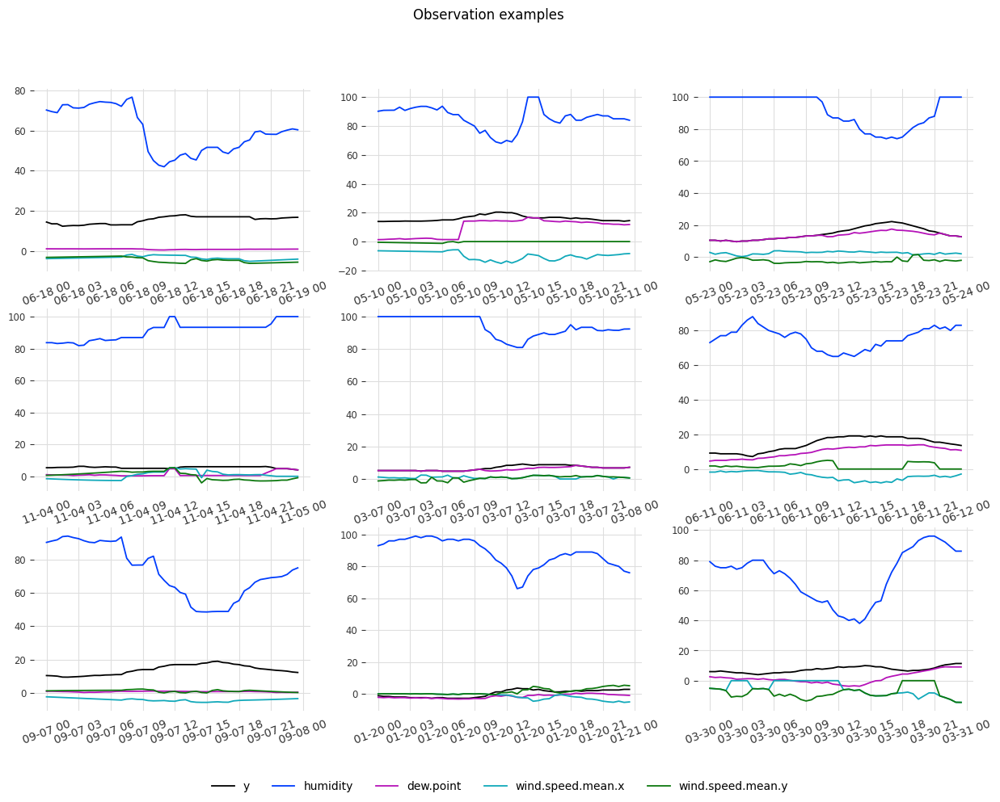

In [ ]:
url_date_filex = "2023.08.08.csv"
if 'google.colab' in str(get_ipython()):
    data_url = "https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/data/CamMetCleanishMissAnnotated" + \
                url_date_filex + ".xz?raw=true"
else:
    data_url = "../data/CamMetCleanishMissAnnotated" + url_date_filex + '.xz'

df = pd.read_csv(data_url, parse_dates=['ds'], compression='xz')
df.set_index('ds', drop=False, inplace=True)
df = df[~df.index.duplicated(keep='first')]
df = df.asfreq(freq='30min')
df_orig = df.copy()

# Unusable - Mostly NAs
drop_cols = ['sunshine', 'ceil_hgt', 'visibility']
df.drop(drop_cols, axis=1, inplace=True)


# Data reformating - https://www.cl.cam.ac.uk/research/dtg/weather/weather-raw-format.txt
df['rainfall'] /= 1000
for column in ['temperature', 'dew.point', 'wind.speed.mean', 'wind.speed.max']:
    df[column] /= 10

df['y'] = df['temperature']


df['rain_prev_6_hours']  = df['rainfall'].rolling(12, min_periods=1).sum()
df['rain_prev_12_hours'] = df['rainfall'].rolling(24, min_periods=1).sum()
df['rain_prev_24_hours'] = df['rainfall'].rolling(48, min_periods=1).sum()
df['rain_prev_48_hours'] = df['rainfall'].rolling(96, min_periods=1).sum()
df['rain_prev_24_hours_binary'] = (df['rain_prev_24_hours'] > 0.0) * 1
df['rain_prev_48_hours_binary'] = (df['rain_prev_48_hours'] > 0.0) * 1


def add_transmit_heuristic_feature(data):
  '''Add atmospheric transmittance heuristic feature (tau)
  See Table 1 and Equation 10 from:
  Estimating Hourly Incoming Solar Radiation from Limited Meteorological Data
  Kurt Spokas, Frank Forcella
  Weed Science, Vol. 54, No. 1 (Jan. - Feb., 2006), pp. 182-189
  https://www.jstor.org/stable/4539375?seq=2
  '''

  data['tau'] = 0.7  # 1.0

  # No rainfall at delta_temperature > 10C
  data.loc[(data['rainfall'] == 0.0) & (data['y_window_48_min_max_diff'] > 10.0), 'tau'] = 0.7

  # No rainfall today, but rainfall the previous day
  data.loc[(data['rain_prev_24_hours_binary'] == 0) & (data['rain_prev_48_hours_binary'] == 1), 'tau'] = 0.6

  # Rainfall occuring on present day
  data.loc[data['rain_prev_24_hours_binary'] == 1, 'tau'] = 0.4

  # Rainfall today and also the previous day
  data.loc[(data['rain_prev_24_hours_binary'] == 1) & (data['rain_prev_48_hours_binary'] == 1), 'tau'] = 0.3

  # Tau was modified if delta_temperature <= 10C (from Equation 10)
  data.loc[data['y_window_48_min_max_diff'] <= 10.0, 'tau'] = data['tau'] / (11.0 - data['y_window_48_min_max_diff'])

  return data


# Faster than np.ptp - https://stackoverflow.com/a/40184053/100129
df['y_window_48_min_max_diff'] = df['y'].rolling(48, min_periods=1).agg(['min', 'max']).diff(axis=1)['max']
df = add_transmit_heuristic_feature(df)

# Deep copy avoids SettingWithCopyWarning
df = df.loc['2008-08-01 00:00:00':'2022-12-31 23:30:00', :].copy(deep=True)


# Remove extreme outliers
humidity_min = 5.00
df.loc[df['humidity'] < humidity_min, 'humidity'] = humidity_min

pressure_min = 950
pressure_max = 1060
df.loc[df['pressure'] < pressure_min, 'pressure'] = pressure_min
df.loc[df['pressure'] > pressure_max, 'pressure'] = pressure_max


# Remove obviously bad temperature spike in '2016-01-08 23:00:00':'2016-01-09 07:30:00'
# display(df.loc['2016-01-08 21:00:00':'2016-01-09 12:00:00', ['y', 'missing']])
# display(df.loc['2016-01-08 23:00:00':'2016-01-09 07:30:00', 'y'])
df.loc['2016-01-08 23:00:00':'2016-01-09 07:30:00', 'y'] = np.linspace(3.7, 5.9, 18)


# Convert wind direction and speed to x and y vectors, so the model can more easily interpret them
#wv = df['wind.speed.mean']
#wd_rad = df['wind.bearing.mean'] * np.pi / 180  # Convert to radians
#
# Calculate the wind x and y components
#df['wind.x'] = wv * np.cos(wd_rad)
#df['wind.y'] = wv * np.sin(wd_rad)


def convert_wind_to_xy(data, speed, bearing, var = ''):
  # Convert wind direction and speed to x and y vectors, so the model can more easily interpret them
  wd_rad = data[bearing] * np.pi / 180  # Convert to radians
  wv = data[speed + var]

  # Calculate the wind x and y components
  data[speed + var + '.x'] = wv * np.cos(wd_rad)
  data[speed + var + '.y'] = wv * np.sin(wd_rad)

  return data


df['pressure.log'] = np.log(df['pressure'])
df['wind.speed.mean.sqrt'] = np.sqrt(df['wind.speed.mean'])
df['wind.speed.max.sqrt']  = np.sqrt(df['wind.speed.max'])
df = convert_wind_to_xy(df, 'wind.speed.mean', 'wind.bearing.mean')
df = convert_wind_to_xy(df, 'wind.speed.mean.sqrt', 'wind.bearing.mean')
df = convert_wind_to_xy(df, 'wind.speed.max', 'wind.bearing.mean')
df = convert_wind_to_xy(df, 'wind.speed.max.sqrt', 'wind.bearing.mean')


def c_to_k(c):
    '''
    Convert temperature in Celsius to Kelvin
    '''

    if c is not None:
        k = c + 273.15
    else:
        k = None

    return k


def mbar_to_pa(mbar):
    '''
    Convert pressure in mBar to Pa
    '''
    return mbar * 100.0


def relative_humidity(dp, temperature):
    '''From https://carnotcycle.wordpress.com/2012/08/04/how-to-convert-relative-humidity-to-absolute-humidity/
       Neither ah (absolute humidity) nor rh (relative humidity) proved useful
       for forecasting but they may have utility for imputation.
       See also: https://carnotcycle.wordpress.com/2017/08/01/compute-dewpoint-temperature-from-rh-t/
                 https://carnotcycle.wordpress.com/tag/formula/
    '''
    rh = 100 * (np.exp((18.678 * dp) / (257.14 + dp)) / np.exp((18.678 * temperature) / (257.14 + temperature)))
    rh = 100.0 if rh > 100.0 else rh
    rh =  15.0 if rh <  15.0 else rh
    return rh
# df['rh'] = relative_humidity(df['dew.point'], df['y'])


def absolute_humidity(humidity, temperature):
    '''Absolute humidity in g / m^3
    From https://carnotcycle.wordpress.com/2012/08/04/how-to-convert-relative-humidity-to-absolute-humidity/
    '''
    ah = 13.24715 * humidity * (np.exp((17.67 * temperature / (243.5 + temperature))) / (273.15 + temperature))
    return ah

df['ah'] = absolute_humidity(df['humidity'], df['y'])


def mixing_ratio(humidity, temperature, pressure):
    '''Mixing ratio in g / Kg dry air
    From https://carnotcycle.wordpress.com/2020/06/01/how-to-calculate-mixing-ratio-and-specific-humidity/
    '''
    mr = 6.112 * 6.2218 * humidity * np.exp(17.67 * temperature / (temperature + 243.5)) / \
          (pressure - 0.06112 * humidity * np.exp(17.67 * temperature / (temperature + 243.5)))
    return mr

df['mixing_ratio'] = mixing_ratio(df['humidity'], df['temperature'], df['pressure'])


def saturation_vapour_pressure(temperature):
    '''Saturation vapour pressure in KPa using Teten's equation
    See also https://en.wikipedia.org/wiki/Vapour_pressure_of_water#Approximation_formulas
             Eqn 1 from https://cran.r-project.org/web/packages/humidity/vignettes/humidity-measures.html
    '''
    # svp = 6.1078 * np.exp(21.8745584 * (temperature - 273.16) / (temperature - 35.86) )
    # temp = (1 / 273.15) - (1 / temperature)
    # svp = 6.11 * np.exp( 2.5e6 * temp / 461.52 )

    # Teten's eqn from https://en.wikipedia.org/wiki/Vapour_pressure_of_water#Approximation_formulas
    svp = 0.61078 * np.exp( 17.27 * temperature / (temperature + 237.3) )
    return svp

df['svp'] = saturation_vapour_pressure(df['temperature'])

# actual water vapour pressure
df['vapour_pressure'] = saturation_vapour_pressure(df['dew.point'])

# vapour pressure deficit
#   https://en.wikipedia.org/wiki/Vapour-pressure_deficit
#   https://physics.stackexchange.com/a/4553/243807
#   TODO Check alt. vp_def calculation methods in above stackexchange question
df['vp_def'] = df['vapour_pressure'] - df['svp']


def air_density(temperature, pressure, p_v):
    '''Air density in Kg / m^3
    For humid air, not dry air
    p_v actual vapour pressure Pa
    https://en.wikipedia.org/wiki/Density_of_air#Humid_air
    '''
    t_k    = c_to_k(temperature)
    p_pa   = mbar_to_pa(pressure)
    p_v_pa = mbar_to_pa(p_v)
    R_d = 287.058  # specific gas constant for dry air J/(kg·K)
    R_v = 461.495  # specific gas constant for water vapor J/(kg·K)
    p_d_pa = p_pa - p_v_pa  # partial pressure of dry air Pa
    rho = p_d_pa / (R_d * t_k) + p_v_pa / (R_v * t_k)
    return rho

df['air_density'] = air_density(df['y'], df['pressure'], df['vapour_pressure'])


def water_vapour_concentration(rh, p_s, p_a):
    '''Atmospheric water vapour concentration in ppmv
    ppmv is parts per million by volume which I beleive is equivalent to mole
    fraction - mmol mol^{−1} (micromole per mole).
    From: Equation 3 in Gregory J. McRae (1980)
          A Simple Procedure for Calculating Atmospheric Water Vapor Concentration,
          Journal of the Air Pollution Control Association, 30:4, 394-394,
          DOI:10.1080/00022470.1980.10464362
    '''
    ppmv = rh * 10 ** 4 * p_s / p_a
    return ppmv

df['H2OC'] = water_vapour_concentration(df['humidity'], df['svp'], df['pressure'])


def specific_humidity(pressure, vapour_pressure):
    '''Specific humidity
    Eqn 5 from https://cran.r-project.org/web/packages/humidity/vignettes/humidity-measures.html
    '''
    q = 0.622 * vapour_pressure / (pressure - 0.378 * vapour_pressure)
    return q

df['specific_humidity'] = specific_humidity(df['pressure'], df['vapour_pressure'])


def potential_temperature(temperature, pressure):
    '''Potential temperature in K
    https://en.wikipedia.org/wiki/Potential_temperature
    '''
    p_0 = 1000
    t_k = c_to_k(temperature)
    theta = t_k * (p_0 / pressure) ** 0.286
    return theta

df['t_pot'] = potential_temperature(df['y'], df['pressure'])


def dew_point_approx(T, RH):
    '''https://carnotcycle.wordpress.com/2017/08/01/compute-dewpoint-temperature-from-rh-t/'''
    frac = 17.67 * T / (243.5 + T)
    numer = 243.5 * (np.log(RH / 100.0) + frac)
    denom = 17.67 - np.log(RH / 100.0) - frac
    dp_approx = numer / denom
    return dp_approx

# df['dew.point_approx'] = dew_point_approx(df['y'], df['humidity'])


def temperature_approx(TD, RH):
    '''https://earthscience.stackexchange.com/q/14899/18379'''
    frac = 17.625 * TD / (243.04 + TD)
    numer = 243.04 * (frac - np.log(RH / 100.0))
    denom = 17.625 + np.log(RH / 100.0) - frac
    temp_approx = numer / denom
    return temp_approx

# df['y_approx'] = temperature_approx(df['dew.point'], df['humidity'])


def humidity_approx(TD, T):
    '''https://earthscience.stackexchange.com/q/16570/18379'''
    numer = 243.04 * 17.625 * (TD - T)
    denom = (243.04 + T) * (243.04 + TD)
    frac  = numer / denom
    return 100 * np.exp(frac)

# df['humidity_approx'] = humidity_approx(df['dew.point'], df['y'])


def ground_heat_flux(surface_temp):
    '''
    Calculate ground heat flux

    This is an approximation based on last term in only equation in question 6
    Page 61 of Parameterization Schemes: Keys to Understanding Numerical
    Weather Prediction Models by David J. Stensrud.
    '''

    # "Constants"
    K = 11            # J m^-2 K^-1 s^-1 - Thermal diffusivity of air
    ground_temp = 10  # Celcius - strictly speaking will vary seasonally

    T_g = c_to_k(ground_temp)   # K - Ground reservoir temperature
    T_s = c_to_k(surface_temp)  # K - Surface air temperature

    Q_G = K * (T_s - T_g)

    return Q_G

df['ground_hf'] = ground_heat_flux(df['y'])


# Convert to secs and add daily and yearly sinusoidal time terms
date_time   = pd.to_datetime(df['ds'], format = '%Y.%m.%d %H:%M:%S')
timestamp_s = date_time.map(datetime.datetime.timestamp)


def sinusoidal_arg(timestamp_s, denominator):
    return 2 * np.pi * timestamp_s / denominator


# df['day.sin']  = np.sin(sinusoidal_arg(timestamp_s, day))
# df['day.cos']  = np.cos(sinusoidal_arg(timestamp_s, day))
# df['year.sin'] = np.sin(timestamp_s * (2 * np.pi / year))
# df['year.cos'] = np.cos(timestamp_s * (2 * np.pi / year))

#for i in [1, 2, 3]:
#    df['day.sin.'  + str(i)] = np.sin(sinusoidal_arg(timestamp_s, i * day))
#    df['day.cos.'  + str(i)] = np.cos(sinusoidal_arg(timestamp_s, i * day))
#    df['year.sin.' + str(i)] = np.sin(sinusoidal_arg(timestamp_s, i * year))
#    df['year.cos.' + str(i)] = np.cos(sinusoidal_arg(timestamp_s, i * year))

# ps - phase shift
for i, ps in enumerate([0, np.pi], start=1):
    df['day.sin.'  + str(i)] = np.sin(sinusoidal_arg(timestamp_s, DAY)  + ps)
    df['day.cos.'  + str(i)] = np.cos(sinusoidal_arg(timestamp_s, DAY)  + ps)
    df['year.sin.' + str(i)] = np.sin(sinusoidal_arg(timestamp_s, YEAR) + ps)
    df['year.cos.' + str(i)] = np.cos(sinusoidal_arg(timestamp_s, YEAR) + ps)


# Add daily spline-based time terms
def periodic_spline_transformer(period, n_splines=None, degree=3):
    if n_splines is None:
        n_splines = period
    n_knots = n_splines + 1  # periodic and include_bias is True
    return SplineTransformer(
        degree  = degree,
        n_knots = n_knots,
        knots   = np.linspace(0, period, n_knots).reshape(n_knots, 1),
        extrapolation = "periodic",
        include_bias  = True,
    )


hour_df = pd.DataFrame(
    np.linspace(0, DAY, DAILY_OBS + 1).reshape(-1, 1),
    columns=["secs"],
)

month_df = pd.DataFrame(
    np.linspace(0, YEAR, YEARLY_OBS + 1).reshape(-1, 1),
    columns=["secs"],
)

# 12 splines approximating 12 month-like time components
day_splines = periodic_spline_transformer(DAY, n_splines=12).fit_transform(hour_df)
day_splines_df = pd.DataFrame(
    day_splines,
    columns=[f"day_spline_{i}" for i in range(day_splines.shape[1])],
)
day_splines_df['secs_since_midnight'] = range(0, DAY + DAY_SECS_STEP, DAY_SECS_STEP)

# pd.concat([hour_df, day_splines_df], axis="columns").plot(x="secs", cmap=plt.cm.tab20b)
# plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

year_splines = periodic_spline_transformer(YEAR, n_splines=12).fit_transform(month_df)
year_splines_df = pd.DataFrame(
    year_splines,
    columns=[f"year_spline_{i}" for i in range(year_splines.shape[1])],
)
year_splines_df['secs_elapsed'] = range(0, int(YEAR), DAY_SECS_STEP)



# Add seasonal mean temperature (y_seasonal), humidity and dew.point
df['secs_since_midnight'] = ((df['ds'] - df['ds'].dt.normalize()) / pd.Timedelta('1 second')).astype(int)
df['doy'] = df['ds'].apply(lambda x: x.dayofyear - 1)
df['secs_elapsed'] = df['secs_since_midnight'] + df['doy'] * DAY

# NOTE: Potential data leak here
#       Seasonality should be calculated on train data only
#for var in ['y', 'humidity', 'dew.point', 'pressure', 'wind.speed.mean']:
#  df_seasonal_var = df[[var, 'secs_elapsed']].groupby('secs_elapsed').mean(var)
#  df_seasonal_var.rename(columns={var: var + '_seasonal'}, inplace=True)
#  df = pd.merge(df, df_seasonal_var,   on='secs_elapsed')
#  df[var + '_des'] = df[var] - df[var + '_seasonal']  # des - deseasonal

#df = pd.merge(df, day_splines_df,  on='secs_since_midnight')
#df = pd.merge(df, year_splines_df, on='secs_elapsed')


def simple_daily_yearly_res_decomp(data, var):
  # NOTE: Potential data leak here
  #       Seasonality should be calculated on train data only

  df_des = data[[var, 'ds', 'secs_since_midnight', 'doy', 'secs_elapsed']].dropna()
  df_des.set_index('ds', drop=False, inplace=True)
  data.set_index('ds', drop=False, inplace=True)

  # df_des['secs_since_midnight'] = ((df_des['ds'] - df_des['ds'].dt.normalize()) / pd.Timedelta('1 second')).astype(int)
  # df_des['doy'] = df_des['ds'].apply(lambda x: x.dayofyear - 1)
  # display(df_des.info())
  # df_des['secs_elapsed'] = df_des['secs_since_midnight'] + df_des['doy'] * DAY
  # df_des['y_det'] = df_des.y - df_des.y.mean()

  df_yearly = df_des[[var, 'doy']].groupby('doy').mean(var)
  df_yearly = df_yearly.rename(columns={var: var+'_yearly'})
  df_des = pd.merge(df_des, df_yearly, on='doy')
  df_des.set_index('ds', drop=False, inplace=True)
  # display(df_des)

  df_des[var+'_des_1'] = df_des[var] - df_des[var+'_yearly']

  df_daily = df_des[[var+'_des_1', 'secs_since_midnight']].groupby('secs_since_midnight').mean(var+'_des_1')
  df_daily = df_daily.rename(columns={var+'_des_1': var+'_daily'})
  df_des = pd.merge(df_des, df_daily, on='secs_since_midnight')
  df_des.set_index('ds', drop=False, inplace=True)

  df_des[var+'_res'] = df[var] - df_des[var+'_yearly'] - df_des[var+'_daily']

  del df_des[var+'_des_1']
  df_des_cols = [var+'_yearly', var+'_daily', var+'_res']
  data = pd.merge(data, df_des[df_des_cols], right_index=True, left_index=True)
  # display(data)
  data.set_index('ds', drop=False, inplace=True)

  return data


# for var in ['y', 'humidity', 'dew.point', 'pressure', 'wind.speed.mean']:
#   df = simple_daily_yearly_res_decomp(df, var)
#   # display(df.info())


# TODO: Potential data leak here?
# df['y_diff_1']  = df['y'].diff(1)
# df['dew.point_diff_1']  = df['dew.point'].diff(1)
# df['humidity_diff_1']   = df['humidity'].diff(1)
# df['pressure_diff_1'] = df['pressure'].diff(1)  # unusable

df['dT_dH'] = df['y'].diff(1) / df['humidity'].diff(1)
df['dT_dP'] = df['y'].diff(1) / df['pressure'].diff(1)
df['dT_dTdp'] = df['y'].diff(1) / df['dew.point'].diff(1)

# WARNING WARNING Danger Will Robinson! Definite data leak here :-(
# inf introduced due to diff(1) == 0 when no change
df = df.replace([np.inf, -np.inf], np.nan)
df['dT_dH']   = df['dT_dH'].interpolate(method='linear')
df['dT_dP']   = df['dT_dP'].interpolate(method='linear')
df['dT_dTdp'] = df['dT_dTdp'].interpolate(method='linear')



df.set_index('ds', drop=False, inplace=True)
df = df.asfreq(freq='30min')


# Reorder and drop temporary calculation columns
inc_cols = ['ds', 'y', #'y_daily', 'y_yearly', 'y_res',
            'humidity', #'humidity_daily', 'humidity_yearly', 'humidity_res',
            'dew.point', #'dew.point_daily', 'dew.point_yearly', 'dew.point_res',
            'pressure', #'pressure_daily', 'pressure_yearly', 'pressure_res',
            'pressure.log', 'wind.speed.mean.sqrt', 'wind.speed.mean',
           #'humidity_diff_1',
           #'humidity_diff_48', 'pressure_diff_48', 'humidity_diff_1_48',
           #'wind.speed.mean_daily', 'wind.speed.mean_yearly', 'wind.speed.mean_res',
            'wind.bearing.mean', 'wind.speed.mean.x', 'wind.speed.mean.y',
            'wind.speed.mean.sqrt.x', 'wind.speed.mean.sqrt.y',
            'wind.speed.max', 'wind.speed.max.sqrt',
            'wind.speed.max.sqrt.x', 'wind.speed.max.sqrt.y',
            'ground_hf', 'rainfall',
            'tau', 'rain_prev_6_hours', 'rain_prev_12_hours',
            'rain_prev_24_hours', 'rain_prev_24_hours_binary',
            'rain_prev_48_hours', 'rain_prev_48_hours_binary',
            'mixing_ratio', 'ah', 'specific_humidity', 'svp', 'vapour_pressure',
            'vp_def', 't_pot', 'air_density', 'H2OC',
            'dT_dH', 'dT_dP', 'dT_dTdp',
           #'y_approx', 'humidity_approx', 'dew.point_approx',
           #'y_seasonal', 'y_des',
           #'humidity_seasonal', 'humidity_des',
           #'dew.point_seasonal', 'dew.point_des',
           #'pressure_seasonal', 'pressure_des',
           #'wind.speed.mean_seasonal', 'wind.speed.mean_des',
            'day.sin.1', 'day.cos.1', 'year.sin.1', 'year.cos.1',
           #'y_shadow', 'humidity_shadow', 'pressure_shadow', 'dew.point_shadow',
            'missing', 'known_inaccuracy', 'isd_outlier', 'long_run', 'spike',
            'cooksd_out', 'isd_3_sigma', 'isd_filled', 'tsclean_filled',
            'tsclean_filled_temperature', 'tsclean_filled_dew.point',
            'tsclean_filled_humidity', 'tsclean_filled_pressure',
            'tsclean_filled_wind.speed.mean', 'tsclean_filled_wind.speed.max',
            'tsclean_filled_wind.bearing.mean', 'tsclean_filled_rainfall',
           #'hist_average', 'mi_filled', 'mi_spike_interp', 'lin_interp'
           ]
df = df[inc_cols]

# df = df.loc[df['missing'] == 0.0, :]
# df = df.loc[(df['mi_filled'] != 1.0) & (df['hist_average'] != 1.0), :]



# For use in other notebooks
if not 'google.colab' in str(get_ipython()):
    data_loc = "../data/CamMetPrepped" + url_date_filex
    df.to_csv(data_loc)


print("Shape:")
display(df.shape)
print("\nInfo:")
display(df.info())
print("\nSummary stats:")
display(df.describe())
print("\nRaw data:")
display(df)
print("\n")


plot_cols = ['y', 'humidity', 'dew.point', 'wind.speed.mean.x',
             'wind.speed.mean.y']  # 'pressure',
plot_observation_examples(df, plot_cols)


df_sanity = sanity_check_before_after_dfs(df_orig, df, 'df')
check_high_low_thresholds(df)

I didn't include `pressure` in example observation plots because those values are an order of magnitude higher than the other features.

A few other things to note:
 * features which did not prove useful this time
    * absolute humidity
    * mixing ratio
    * spline-based time components
    * higher frequency sinusoidal time components
    * phase-shifted sinusoidal time components
    * I leave the code for generating these features incase it is useful later
       * for example with the inclusion of the rainfall feature
 * `y_des` was an initial attempt at deseasonalising temperature `y`

---

### Calculate Solar Features

Irradiance, zenith angle and declination:

[Solar irradiance](https://en.wikipedia.org/wiki/Solar_irradiance) is the power per unit area (surface power density) received from the Sun.  Irradiance plays a part in weather forecasting.  I calculate solar irradiance for Cambridge using the python [solarpy](https://github.com/aqreed/solarpy) module.  I suspect forecasts could be substantially improved if solar irradiance could be combined with a measure of cloud cover.  It could also be used as a future covariate with models built with the darts package.

The [solar zenith angle](https://en.wikipedia.org/wiki/Solar_zenith_angle) is the angle between the sun’s rays and the vertical direction.  I use the [pysolar](https://github.com/pingswept/pysolar) python package for zenith angle calculations.  Similarly to irradiance, it could be used as a future covariate.  See this [stackoverflow question](https://stackoverflow.com/questions/45238223/how-to-get-solar-zenith-angle-using-pysolar) and the [source code](https://github.com/pingswept/pysolar/blob/master/pysolar/solar.py) for calculation details.  There is a refraction correction term which assumes 'standard' pressure and temperature values.  Zenith angle is used to calculate solar irradiance.

[Solar declination](https://www.sciencedirect.com/topics/engineering/solar-declination) is the angle between the equator and a line drawn from the centre of the Earth to the centre of the sun.  It can be calculated with the solarpy module.  It did not prove useful in the lightgbm models.
I've commented it out for now.

Calculations:
  * just calculate irradiance for a single year (arbitrarily 2020)
  * then repeat values for the other years
  * **TODO** integrate into main data transformations above

Installing {'pysolar', 'solarpy'} ... Done
Zenith


Calculating zenith: 100%|██████████| 17568/17568 [00:17<00:00, 1006.90it/s]


count    17568.000000
mean        89.672425
std         29.857274
min         28.767886
25%         67.803213
50%         89.235373
75%        111.449144
max        151.223633
Name: za, dtype: float64

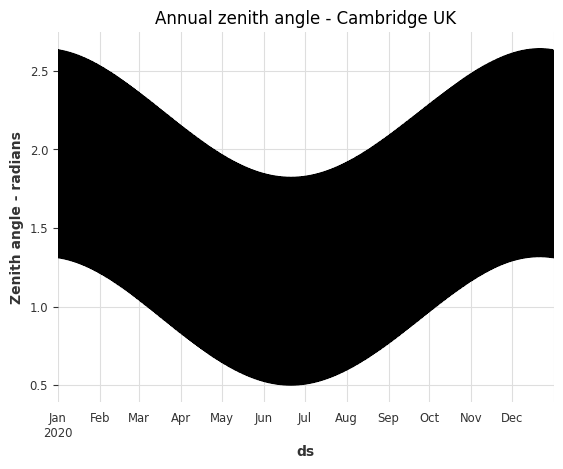

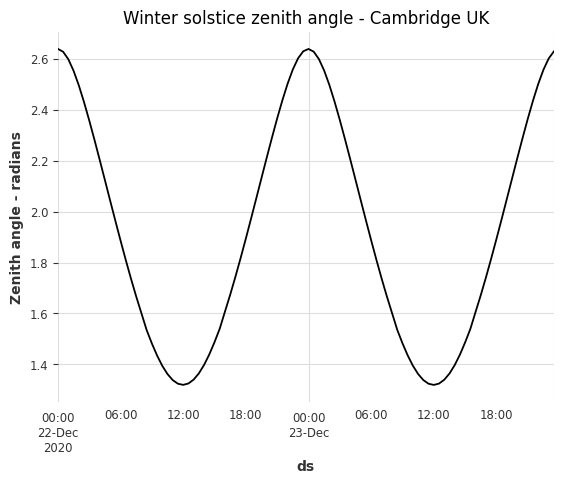

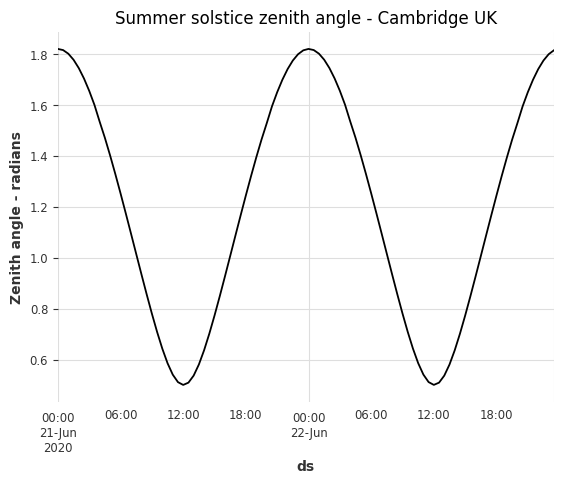

Irradiance


Calculating irradiance: 100%|██████████| 17568/17568 [00:04<00:00, 4306.23it/s]


count    17568.000000
mean       142.940765
std        226.586194
min          0.000000
25%          0.000000
50%          0.000137
75%        220.386913
max        805.382014
Name: irradiance, dtype: float64

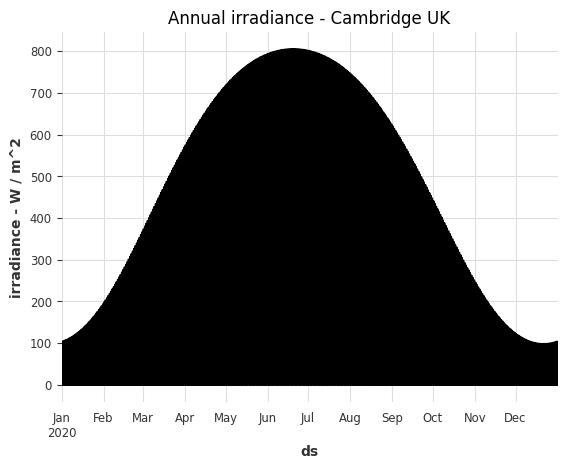

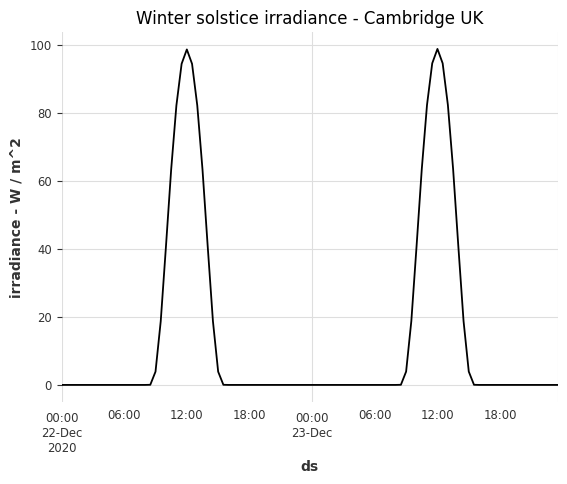

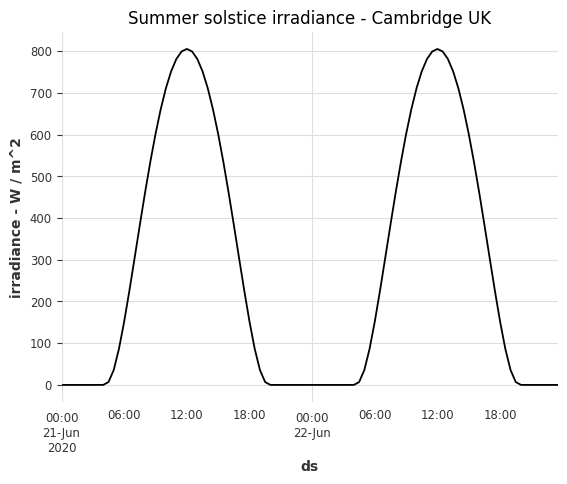

Azimuth


Calculating azimuth: 100%|██████████| 17568/17568 [00:16<00:00, 1062.98it/s]


count    17568.000000
mean         0.001957
std          0.588445
min         -0.841471
25%         -0.579791
50%          0.006409
75%          0.582247
max          0.841471
Name: azimuth, dtype: float64

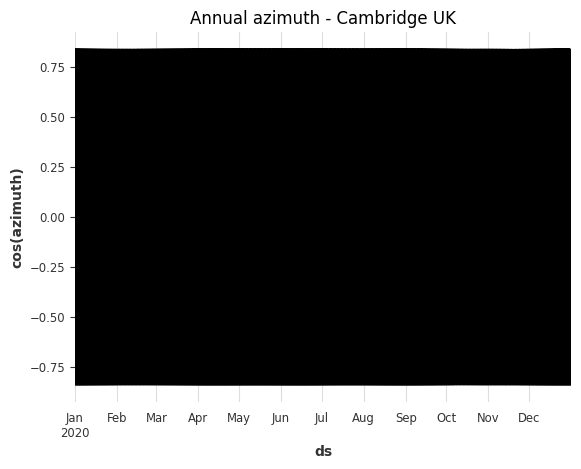

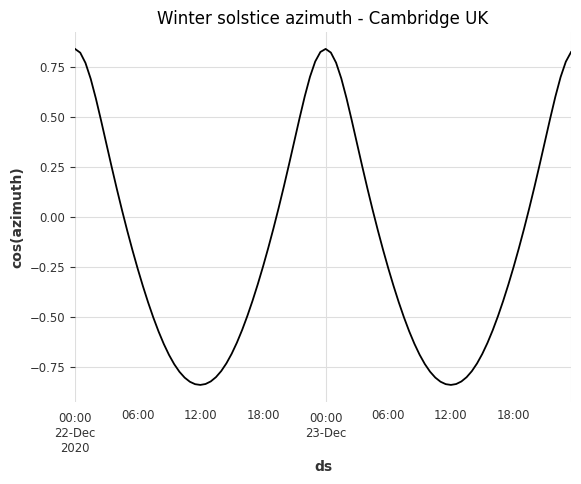

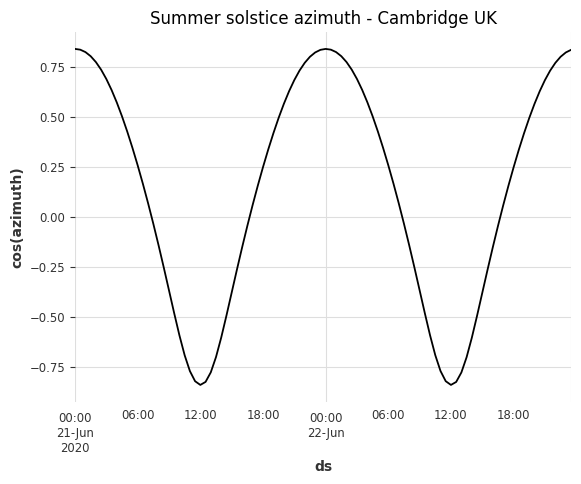

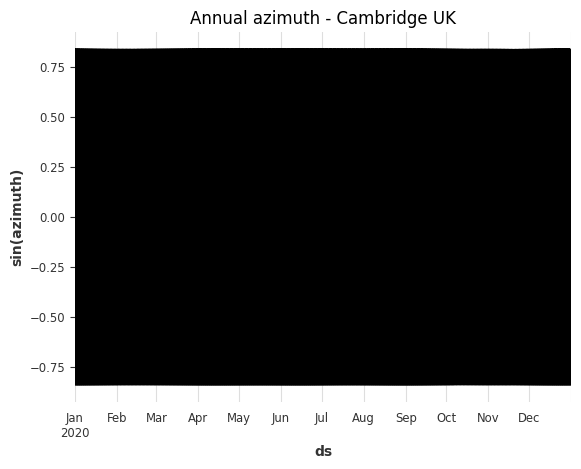

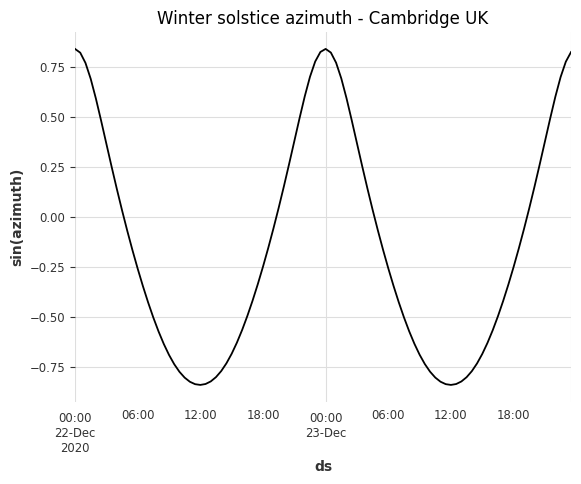

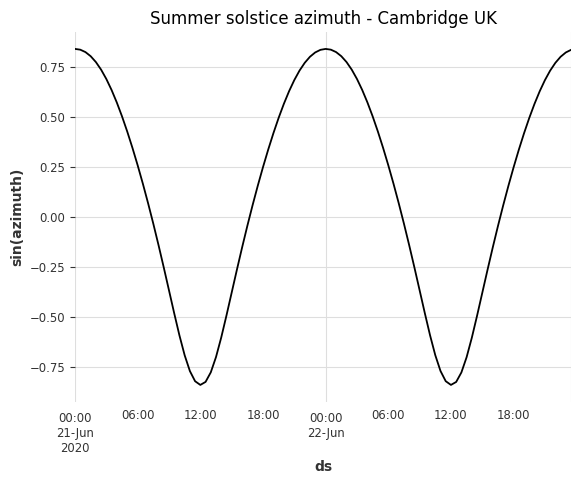

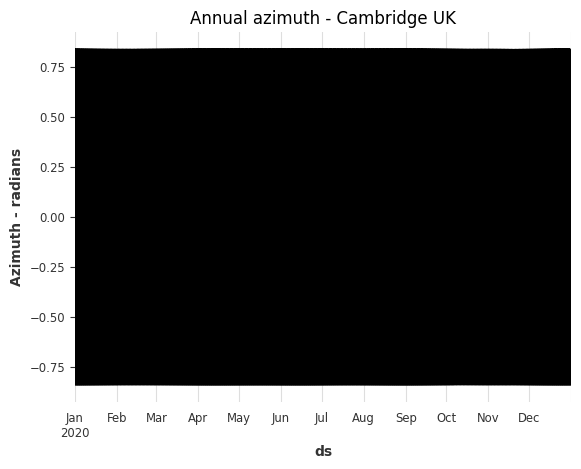

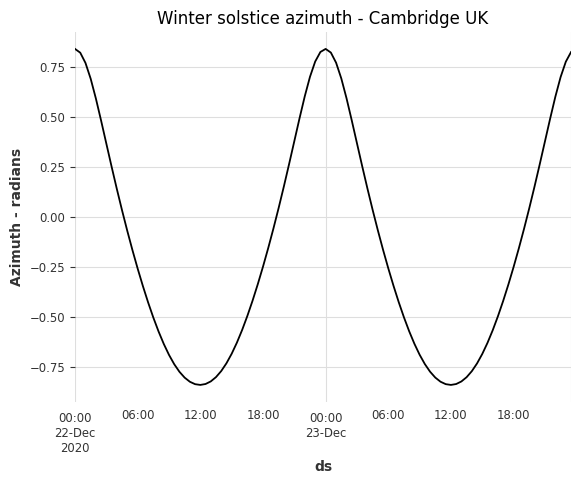

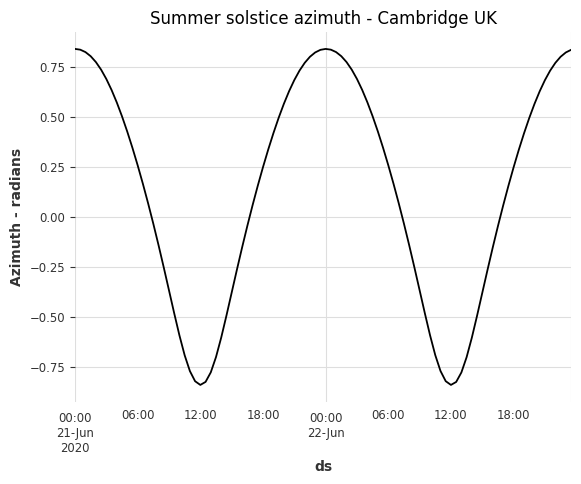

Declination


Calculating declination: 100%|██████████| 17568/17568 [00:00<00:00, 88067.80it/s]


count    17568.000000
mean         0.005800
std          0.287570
min         -0.408846
25%         -0.280364
50%          0.011877
75%          0.290560
max          0.409361
Name: declination, dtype: float64

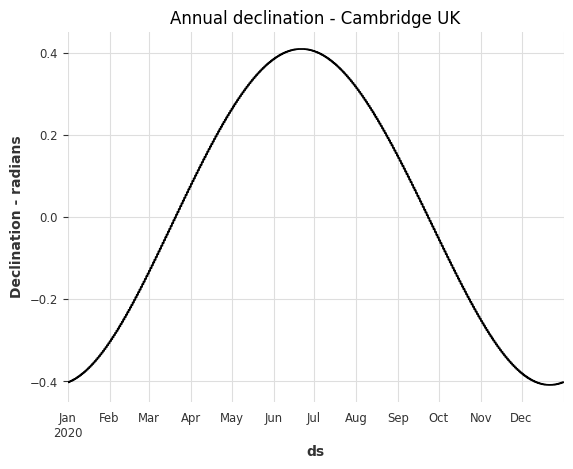

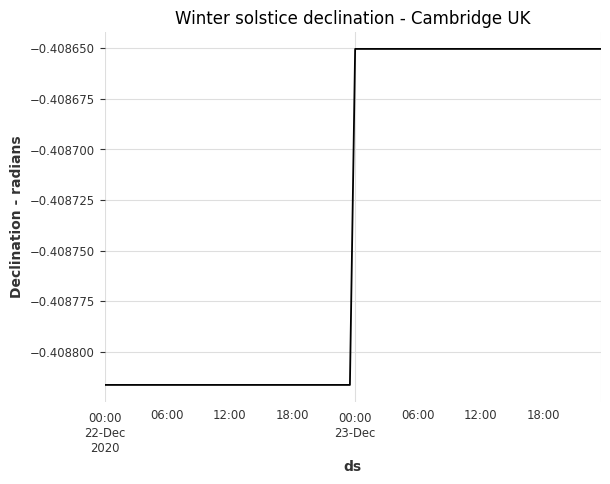

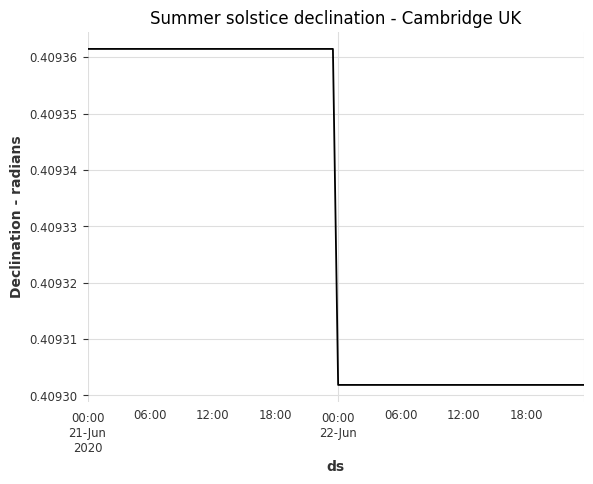


df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: False
mean before feature redundancy: 44.184
mean after feature redundancy:  63.886



,before,after,diff
rows,252768,252768,0
cols,59,76,17
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,3,11,8
rows_with_nas,1,1,0
cols_with_nas,3,11,8
single_value_cols,0,0,0
low_var_rows,0,0,0
low_var_cols,6,7,1


In [ ]:
required  = {'pysolar', 'solarpy'}
installed = {pkg.key for pkg in pkg_resources.working_set}
missing   = required - installed

if missing == required:
    print('Installing', missing, '...', sep=' ', end='')
    python = sys.executable
    subprocess.check_call([python, '-m', 'pip', 'install', *missing])  #, stdout=subprocess.DEVNULL)
    print(' Done')


from pysolar.solar import get_altitude, get_azimuth
from solarpy import irradiance_on_plane, declination


def calc_solar_data(df, solar_calc):
  IYEAR = 2020  # arbitrary year
  LAT   = 52.210922
  LON   =  0.091964

  df['year'] = df['ds'].dt.year
  data = pd.DataFrame()
  data.index = df.loc[df['year'] == IYEAR, 'ds']
  data.index = pd.to_datetime(data.index)

  print(solar_calc.title())

  if solar_calc == 'declination':
    declinations = [0] * len(data)
    i = 0

    for d in tqdm(data.index, desc='Calculating ' + solar_calc):
      declinations[i] = declination(d)
      i += 1

    data['declination'] = declinations
    display(data['declination'].describe())
  elif solar_calc == 'irradiance':
    HEIGHT = 6  # height above sea level
    VNORM  = np.array([0, 0, -1])  # plane pointing zenith
    irradiances  = [0] * len(data)
    i = 0

    for d in tqdm(data.index, desc='Calculating ' + solar_calc):
      irradiances[i] = irradiance_on_plane(VNORM, HEIGHT, d, LAT)
      i += 1

    data['irradiance'] = irradiances
    display(data['irradiance'].describe())
  elif solar_calc == 'zenith':
    za = [0] * len(data)
    za_rad = [0] * len(data)
    i = 0

    for d in tqdm(data.index, desc='Calculating ' + solar_calc):
      ts = pd.Timestamp(d, tz='UTC').to_pydatetime()
      za[i] = float(90) - get_altitude(LAT, LON, ts)
      za_rad[i] = np.radians(za[i])
      i += 1

    # TODO rename za to zenith
    data['za'] = za
    data['za_rad'] = za_rad
    display(data['za'].describe())
  elif solar_calc == 'azimuth':
    az = [0] * len(data)
    az_rad = az
    az_rad_cos = az
    az_rad_sin = az
    i = 0

    for d in tqdm(data.index, desc='Calculating ' + solar_calc):
      ts = pd.Timestamp(d, tz='UTC').to_pydatetime()
      az[i] = get_azimuth(LAT, LON, ts)
      az_rad[i] = np.radians(az[i])
      az_rad_cos[i] = np.cos(az_rad[i])
      az_rad_sin[i] = np.sin(az_rad[i])
      i += 1

    data['azimuth'] = az
    data['azimuth_rad'] = az_rad
    data['azimuth_cos'] = az_rad_cos
    data['azimuth_sin'] = az_rad_sin
    display(data['azimuth'].describe())
  else:
    print("Unknown solar_calc parameter:", solar_calc,
          "\nUse 'declination', 'irradiance' or 'zenith'")

  print()
  data['month']  = data.index.month
  data['day']    = data.index.day
  data['hour']   = data.index.hour
  data['minute'] = data.index.minute

  df['month']  = df.index.month
  df['day']    = df.index.day
  df['hour']   = df.index.hour
  df['minute'] = df.index.minute

  merge_cols = ['month', 'day', 'hour', 'minute']
  df = df.merge(data, on=merge_cols)
  df.drop(merge_cols, inplace=True, axis=1)
  df.set_index('ds', drop=False, inplace=True)
  df = df[~df.index.duplicated(keep='first')]
  df = df.asfreq(freq='30min')

  if solar_calc == 'declination':
    df['declination_diff_1'] = df['declination'].diff(1)
  elif solar_calc == 'irradiance':
    df['irradiance_diff_1'] = df['irradiance'].diff(1)
  elif solar_calc == 'zenith':
    df['za_diff_1'] = df['za'].diff(1)
    df['za_rad_diff_1'] = df['za_rad'].diff(1)
  elif solar_calc == 'azimuth':
    df['azimuth_diff_1'] = df['azimuth'].diff(1)
    df['azimuth_rad_diff_1'] = df['azimuth_rad'].diff(1)
    df['azimuth_cos_diff_1'] = df['azimuth_cos'].diff(1)
    df['azimuth_sin_diff_1'] = df['azimuth_sin'].diff(1)

  return df


def plot_solar(solar, title, ylab):
  solar.plot()
  plt.ylabel(ylab)
  plt.title(title)
  plt.show()


def plot_solar_annual_and_solstice(solar, var, title_var, ylab):
  title = 'Annual ' + title_var + ' - Cambridge UK'
  plot_solar(solar.loc['2020-01-01':'2020-12-31', var], title, ylab)

  title = 'Winter solstice ' + title_var + ' - Cambridge UK'
  plot_solar(solar.loc['2020-12-22':'2020-12-23', var], title, ylab)

  title = 'Summer solstice ' + title_var + ' - Cambridge UK'
  plot_solar(solar.loc['2020-06-21':'2020-06-22', var], title, ylab)


df_before_solar = df.copy()

za_lab = 'Zenith angle - radians'
za_title = 'zenith angle'
df = calc_solar_data(df, 'zenith')
plot_solar_annual_and_solstice(df, 'za_rad', za_title, za_lab)

irr_ylab = 'irradiance - W / m^2'
irr_title = 'irradiance'
df = calc_solar_data(df, irr_title)
plot_solar_annual_and_solstice(df, irr_title, irr_title, irr_ylab)

az_lab = 'Azimuth - radians'
az_title = 'azimuth'
df = calc_solar_data(df, az_title)
plot_solar_annual_and_solstice(df, 'azimuth_cos', az_title, 'cos(azimuth)')
plot_solar_annual_and_solstice(df, 'azimuth_sin', az_title, 'sin(azimuth)')
plot_solar_annual_and_solstice(df, 'azimuth_rad', az_title, az_lab)

dec_ylab = 'Declination - radians'
dec_title = 'declination'
df = calc_solar_data(df, dec_title)
plot_solar_annual_and_solstice(df, dec_title, dec_title, dec_ylab)

df_solar_sanity = sanity_check_before_after_dfs(df_before_solar, df, 'df')
check_high_low_thresholds(df)

There is zero solar irradiance between sunset and sunrise.  Hence the near zero median value for irradiance.

---

Plot short term autocorrelations

Compare main features
 * past covariates
 * future covariates

...

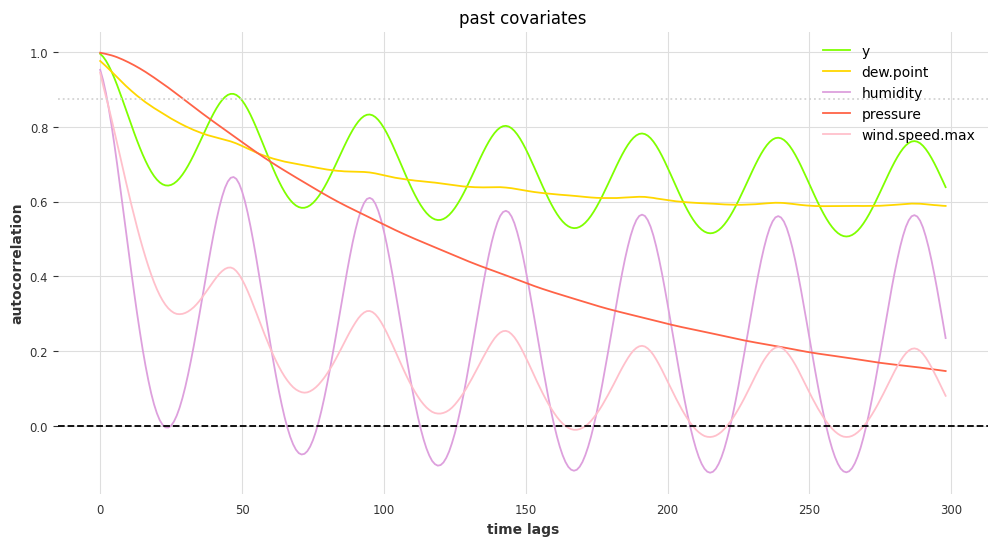

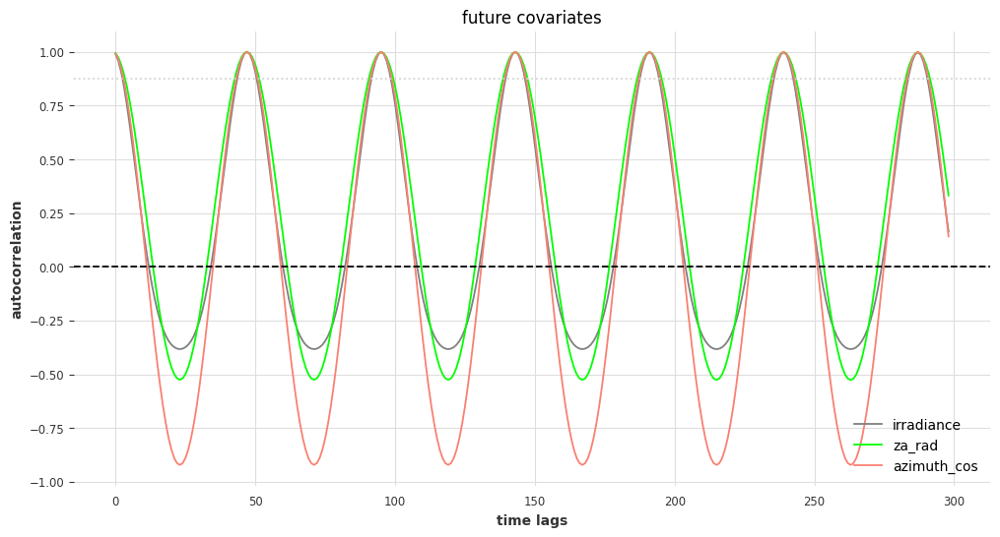

In [ ]:
pc_feats = ['y', 'dew.point', 'humidity', 'pressure', 'wind.speed.max']
pc_cols  = ['chartreuse', 'gold', 'plum', 'tomato', 'pink']
plot_short_term_acf(df, pc_feats, pc_cols, 'past covariates')

fc_feats = ['irradiance', 'za_rad', 'azimuth_cos']
fc_cols  = ['grey', 'lime', 'salmon']
plot_short_term_acf(df, fc_feats, fc_cols, 'future covariates')

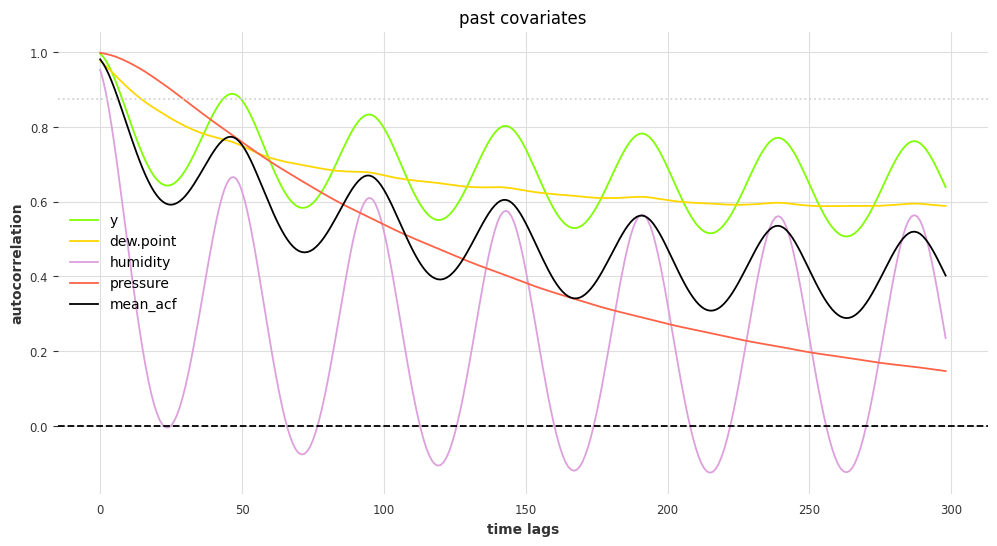

In [ ]:
pc_feats = ['y', 'dew.point', 'humidity', 'pressure']
pc_cols  = ['chartreuse', 'gold', 'plum', 'tomato']
plot_short_term_acf(df, pc_feats, pc_cols, 'past covariates', mean_feat=True)

...

---

Plot long term autocorrelations

Compare main features

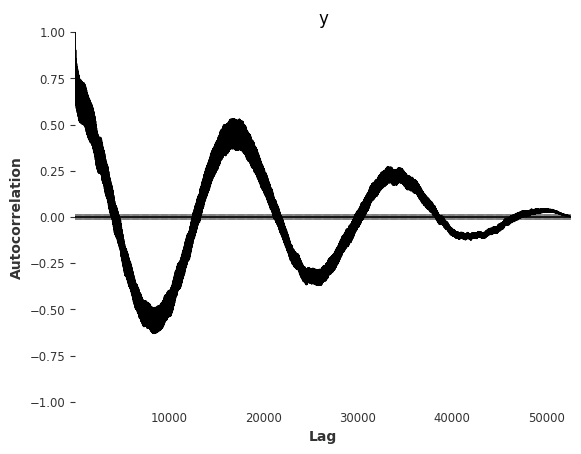

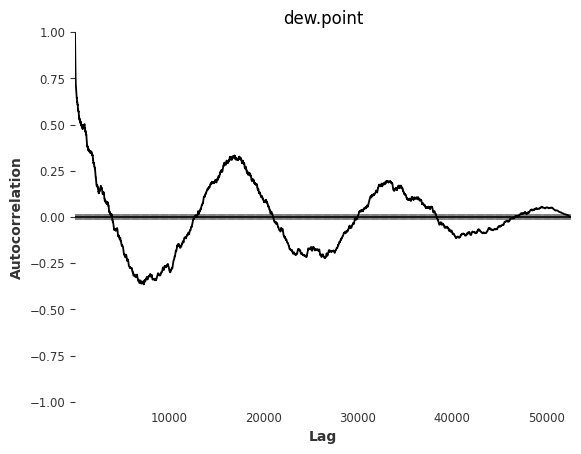

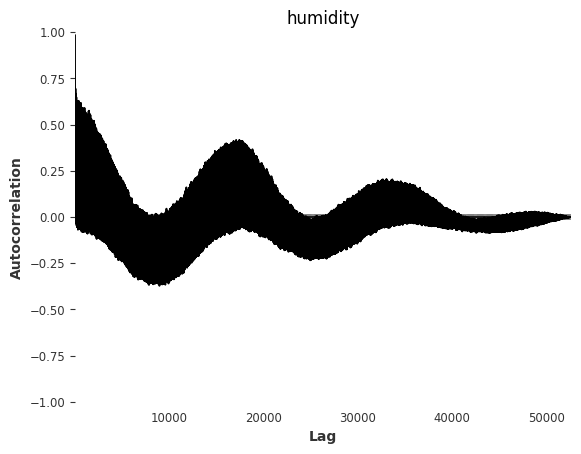

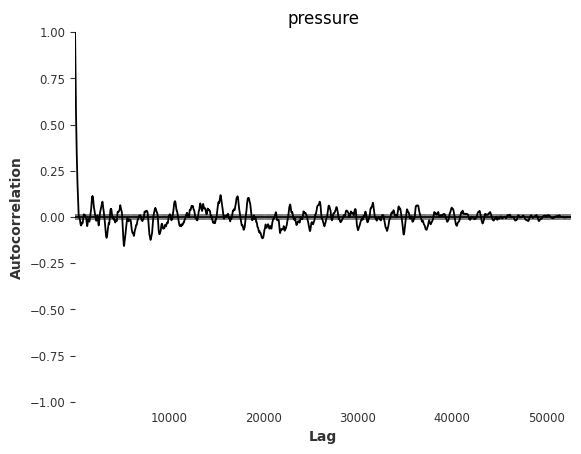

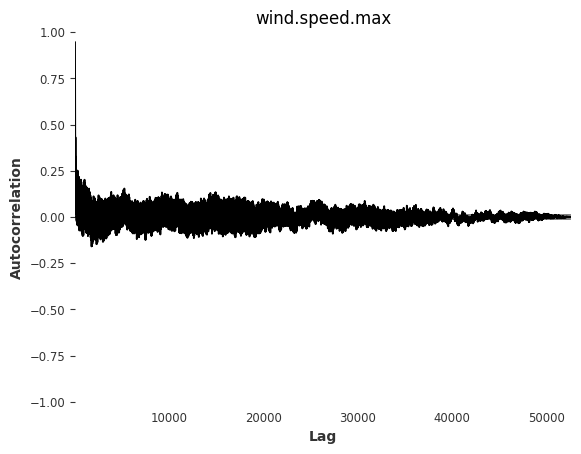

In [ ]:
plot_long_term_acf(df, 'y')
plot_long_term_acf(df, 'dew.point')
plot_long_term_acf(df, 'humidity')
plot_long_term_acf(df, 'pressure')
plot_long_term_acf(df, 'wind.speed.max')

...

---

Compare long term autocorrelations for wind speed features

...

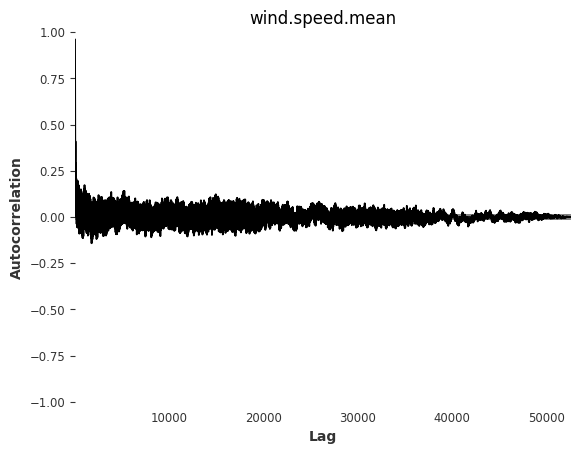

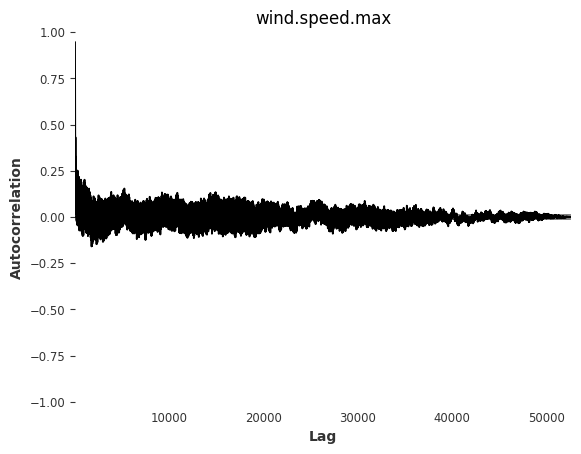

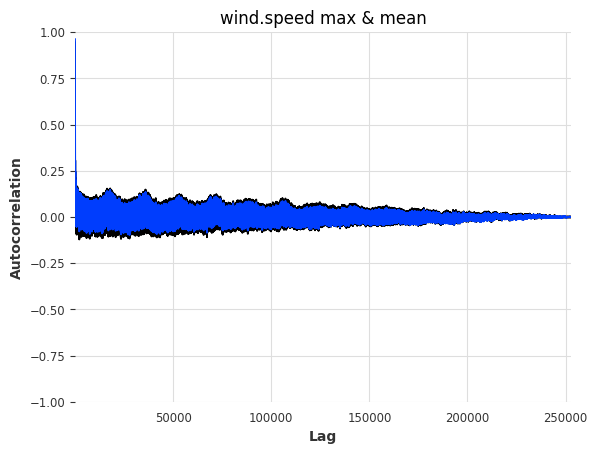

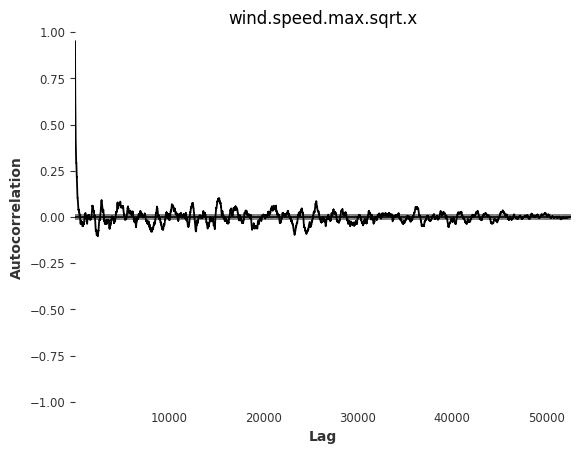

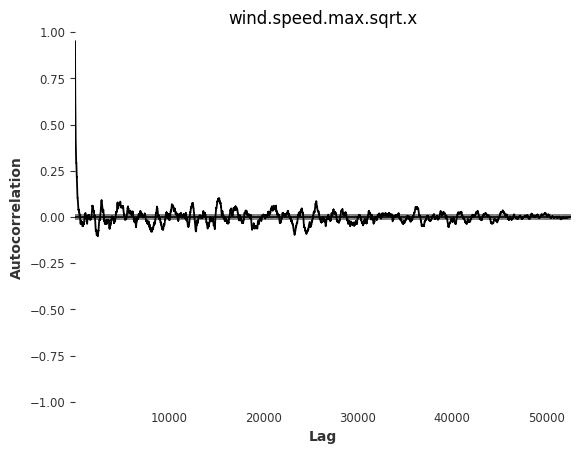

In [ ]:
plot_long_term_acf(df, 'wind.speed.mean')
plot_long_term_acf(df, 'wind.speed.max')

# overlay 'wind.speed.main' on 'wind.speed.max'
pd.plotting.autocorrelation_plot(df['wind.speed.max'])
pd.plotting.autocorrelation_plot(df['wind.speed.mean'])
plt.title('wind.speed max & mean')
plt.show()

plot_long_term_acf(df, 'wind.speed.max.sqrt.x')
plot_long_term_acf(df, 'wind.speed.max.sqrt.x')

...

---

### Download climate oscillations

Download climate indices from [NOAA](https://www.noaa.gov/).

Climate indices are irregular periodic variations in pressure, winds and temperatures which vary from year to year.  They tend to remain in one phase for several years.

 * monthly data
 * may act as a leading indicator but by how much and when is unclear
 * complicated non-linear interactions with other regional climate effects
 * SOI - [El Nino Southern Oscillation](https://en.wikipedia.org/wiki/El_Ni%C3%B1o%E2%80%93Southern_Oscillation)
   * [Norther European winters are drier and colder during El Nino periods](https://climate.leeds.ac.uk/four-possible-consequences-of-el-nino-returning-in-2023/)
 * MEI - [Multivariate ENSO index](https://en.wikipedia.org/wiki/Multivariate_ENSO_index)
   * regarded as the most comprehensive index for monitoring ENSO since it combines multiple meteorological and oceanographic components
   * [NOAA MEI](https://psl.noaa.gov/enso/mei/)
 * NAO - [North Atlantic Oscillation](https://en.wikipedia.org/wiki/North_Atlantic_oscillation)
   * [Positive NAO is associated with warm and wet winters in Europe](https://www.ldeo.columbia.edu/res/pi/NAO/)
 * Other [climate oscillations](https://en.wikipedia.org/wiki/Category:Climate_oscillations) are available and may be relevant

Based on [code](https://github.com/wy2136/climate_index) from [Wenchang Yang](https://wy2136.github.io/).



In [ ]:
# Download and plot climate indices from the NOAA website.
# Code from: https://github.com/wy2136/climate_index


database = {
    'mei': {
        'long_name': 'Multivariate ENSO Index',
        'url': 'https://psl.noaa.gov/enso/mei/data/meiv2.data',
        'invalid_value': -999.0,
    },
    'soi': {
        'long_name': 'Southern Oscillation Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/soi.long.data',
        'invalid_value': -10.0,
    },
    'soi-cpc': {
        'long_name': 'Southern Oscillation Index - CPC',
        'url': 'https://www.cpc.ncep.noaa.gov/data/indices/soi',
        'invalid_value': -999.9,
    },
    'nao': {
        'long_name': 'North Atlantic Oscillation',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nao.long.data',
        'invalid_value': -99.99,
    },
    'nao-cpc': {
        'long_name': 'North Atlantic Oscillation - CPC',
        'url': 'https://www.cpc.ncep.noaa.gov/products/precip/CWlink/pna/norm.nao.monthly.b5001.current.ascii.table',
        'invalid_value': -99.99,
    },
    'nao-daily': {
        'long_name': 'North Atlantic Oscillation - Daily',
        'url': 'https://ftp.cpc.ncep.noaa.gov/cwlinks/norm.daily.nao.index.b500101.current.ascii',
        'invalid_value': -10.0,
    },
    'rnao': {
        'long_name': 'Reconstructed monthly NAO index back to December 1658',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/rnao.long.data',
        'invalid_value': -99.90,
    },
    'ao':{
        'long_name': 'Arctic Oscillation Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/ao.long.data',
        'invalid_value': -9.990,
    },
    'ao20r': {
        'long_name': 'Arctic Oscillation Index from the 20thC Reanalysis',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/ao20thc.long.data',
        'invalid_value': -999.0,
    },
    'pdo': {
        'long_name': 'Pacific Decadal Oscillation',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/pdo.long.data',
        'invalid_value': -9.90,
    },
    'np': {
        'long_name': 'North Pacific Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/np.long.data',
        'invalid_value': -999.0,
    },
    'tp': {
        'long_name': 'Trans Polar Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/tpi.long.data',
        'invalid_value': -9.99,
    },
    'ip': {
        'long_name': 'Iceland SLP',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nao_ice.long.data',
        'invalid_value': -10,
    },
    'ap': {
        'long_name': 'Ponta Delgada, Azores SLP',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nao_azo.long.data',
        'invalid_value': -10,
    },
    'gp': {
        'long_name': 'Gibraltar SLP',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nao_gib.long.data',
        'invalid_value': -10,
    },
    'nslp': {
        'long_name': 'Nagasaki SLP',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nagasakipres.long.data',
        'invalid_value': -10,
    },
    'mp': {
        'long_name': 'Madras SLP',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/madrasslp.long.data',
        'invalid_value': -10,
    },
    'nino12': {
        'long_name': 'Nino 1+2 SST Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nino12.long.anom.data',
        'invalid_value': -99.99,
    },
    'nino3': {
        'long_name': 'Nino 3 SST Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nino3.long.anom.data',
        'invalid_value': -99.99,
    },
    'nino34': {
        'long_name': 'Nino 3.4 SST Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nino34.long.anom.data',
        'invalid_value': -99.99,
    },
    'nino4': {
        'long_name': 'Nino 4 SST Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/nino4.long.anom.data',
        'invalid_value': -99.99,
    },
    'amo': {
        'long_name': 'Atlantic multidecadal oscillation SST Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/amo.long.data',
        'invalid_value': -99.99,
    },
    'amo_sm': {
        'long_name': 'Atlantic multidecadal oscillation SST Index (smoothed)',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/amo.sm.long.data',
        'invalid_value': -99.990,
    },
    'amo_detrend': {
        'long_name': 'Atlantic multidecadal oscillation SST Index (detrended)',
        'url': 'http://www.esrl.noaa.gov/psd/data/correlation/amon.us.long.data',
        'invalid_value': -99.99,
    },
    'amo_detrend_sm': {
        'long_name': 'Atlantic multidecadal oscillation SST Index (detrended, smoothed)',
        'url': 'http://www.esrl.noaa.gov/psd/data/correlation/amon.sm.long.data',
        'invalid_value': -99.990,
    },
    'global_t_station': {
        'long_name': 'Global Average Temperature Anomalies (Station Only)',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/GLBTS.long.data',
        'invalid_value': -999,
    },
    'global_t_sst': {
        'long_name': 'Global Average Temperature & SST Anomalies (Station + SST)',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/GLBTSSST.long.data',
        'invalid_value': -999,
    },
    'global_t_cru': {
        'long_name': 'Global Average Temperature Anomaly (CRU)',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/taveglhc4.long.data',
        'invalid_value': -99.99,
    },
    'sunspot': {
        'long_name': 'Sunspot Index',
        'url': 'http://www.esrl.noaa.gov/psd/gcos_wgsp/Timeseries/Data/sunspot.long.data',
        'invalid_value': -99.9,
    },
}


def print_database():
    for name in sorted(database.keys()):
        print(name.upper())
        print(' ' * 4, database[name]['long_name'])
        print(' ' * 4, database[name]['url'])


def _get_year_start_end(climate_index_name):
    '''Get the start and end years as a tuple.'''

    if climate_index_name == 'soi-cpc':
        year_start = 1951
        year_end = 2030
    elif climate_index_name == 'nao-cpc' or climate_index_name == 'nao-daily':
        year_start = 1950
        today = str(datetime.date.today())
        year_end = int(today[:4])
    else:
        url = database[climate_index_name.lower()]['url']
        df = pd.read_csv(url, header=None, nrows=1, sep=r'\s+')
        year_start = df.iloc[0, 0]
        year_end = df.iloc[0, 1]

    return year_start, year_end


def _get_number_of_years(year_start, year_end):
    return len(range(year_start, year_end)) + 1


def _read_csv(climate_index_name):
    url = database[climate_index_name.lower()]['url']
    year_start, year_end = _get_year_start_end(climate_index_name)
    Nyears = _get_number_of_years(year_start, year_end)

    # ignore records before 1678 since pandas is not able to handle this
    if year_start < 1678:
        Nskiprecords = 1678 - year_start
    else:
        Nskiprecords = 0

    if climate_index_name == 'soi-cpc':
        skip_rows = 4
    elif climate_index_name == 'nao-cpc':
        skip_rows = 1
    else:
        skip_rows = 1 + Nskiprecords

    if climate_index_name == 'nao-daily':
      df = pd.read_csv(url,
                       header = None,
                       #skiprows = skip_rows,
                       #nrows = Nyears - Nskiprecords,
                       sep = r'\s+',
                       #index_col = 0,
          na_values = database[climate_index_name.lower()]['invalid_value'])
    else:
      df = pd.read_csv(url,
                       header = None,
                       skiprows = skip_rows,
                       nrows = Nyears - Nskiprecords,
                       sep = r'\s+',
                       index_col = 0,
          na_values = database[climate_index_name.lower()]['invalid_value'])

    return df


def _get_year_month_index(year_start, year_end):
    if year_start < 1678:  # pandas is not able to handle date before 1678
        year_start = 1678

    Nyears = _get_number_of_years(year_start, year_end)
    year_month_index = pd.date_range(str(year_start) + '-01',
                                     periods = Nyears * 12,
                                     freq = 'M').to_period()

    return year_month_index


def get_climate_index(climate_index_name, year_start_, year_end_):
    year_start, year_end = _get_year_start_end(climate_index_name)

    if climate_index_name == 'nao-daily':
      df = _read_csv(climate_index_name)
      df.columns = ['year', 'month', 'day', 'nao']

      year_month_day_index = pd.date_range(str(year_start) + '-01-01',
                                           periods = df.shape[0],
                                           freq = 'D').to_period()

      climate_index = pd.Series(df['nao'].values,
                                index = year_month_day_index,
                                name  = climate_index_name.upper())
    else:
      year_month_index = _get_year_month_index(year_start, year_end)
      df = _read_csv(climate_index_name).iloc[:, 0:12]
      climate_index = pd.Series(df.values.ravel(),
                                index = year_month_index,
                                name  = climate_index_name.upper())

    climate_index = pd.to_numeric(climate_index, errors='coerce')

    mask = (climate_index.index.year >= year_start_) & \
           (climate_index.index.year <= year_end_)
    ci = climate_index.loc[mask]

    return ci


def plot_climate_index(climate_index_name, year_start, year_end):
    ci = get_climate_index(climate_index_name, year_start, year_end)
    ci.plot()
    plt.legend()
    plt.show()

...

North Atlantic Oscillation - Daily


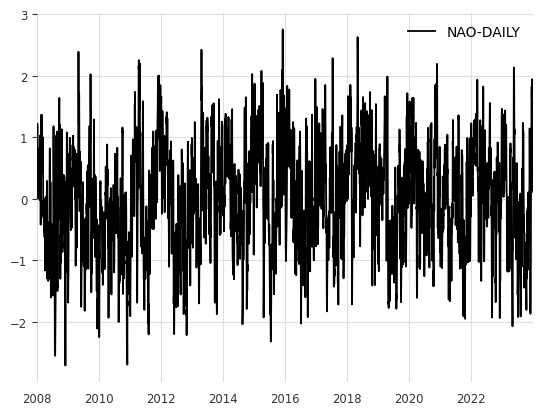

2008-01-01    0.161
2008-01-02    0.329
2008-01-03    0.184
2008-01-04    0.836
2008-01-05    1.222
              ...  
2023-12-27    0.984
2023-12-28    0.956
2023-12-29    0.855
2023-12-30    0.467
2023-12-31    0.114
Freq: D, Name: NAO-DAILY, Length: 5844, dtype: float64

Multivariate ENSO Index


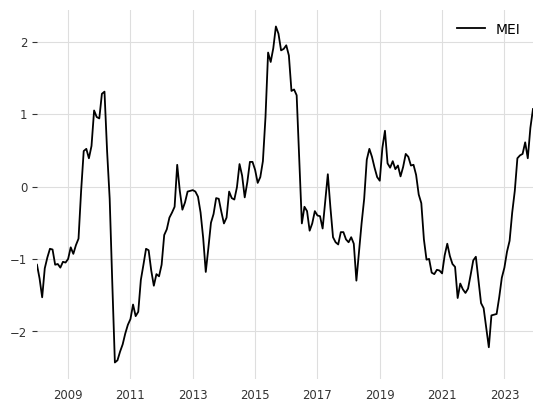

Southern Oscillation Index - CPC


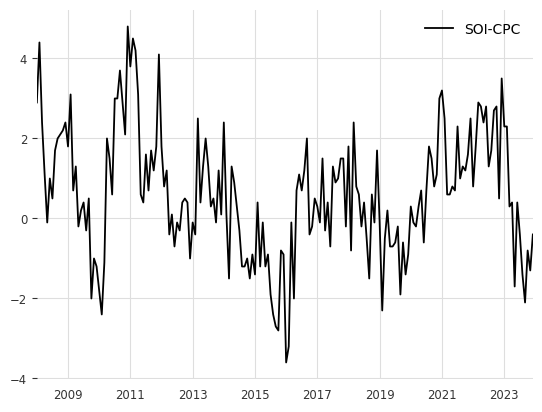


df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 63.886
mean after feature redundancy:  61.463



,before,after,diff
rows,252768,252768,0
cols,76,79,3
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,11,11,0
rows_with_nas,1,1,0
cols_with_nas,11,11,0
single_value_cols,0,0,0
low_var_rows,0,0,0
low_var_cols,7,7,0


In [ ]:
ci_name = 'nao-daily'
print(database[ci_name]['long_name'])
plot_climate_index(ci_name, 2008, 2023)
nao_daily = get_climate_index(ci_name, 2008, 2023)
display(nao_daily)
nao_daily = nao_daily.dropna()
nao_daily_df = pd.DataFrame({'nao_daily': nao_daily.values}, index=nao_daily.index)
nao_daily_df['year']  = nao_daily_df.index.year
nao_daily_df['month'] = nao_daily_df.index.month
nao_daily_df['day'] = nao_daily_df.index.day

#ci_name = 'nao-cpc'
#print(database[ci_name]['long_name'])
#plot_climate_index(ci_name, 2008, 2023)
#nao_cpc = get_climate_index(ci_name, 2008, 2023)
#nao_cpc = nao_cpc.dropna()
#nao_df = pd.DataFrame({'nao': nao_cpc.values}, index=nao_cpc.index)
#nao_df['year']  = nao_df.index.year
#nao_df['month'] = nao_df.index.month

ci_name = 'mei'
print(database[ci_name]['long_name'])
plot_climate_index(ci_name, 2008, 2023)
mei = get_climate_index(ci_name, 2008, 2023)
mei = mei.dropna()
mei_df = pd.DataFrame({'mei': mei.values}, index=mei.index)
mei_df['year']  = mei_df.index.year
mei_df['month'] = mei_df.index.month

ci_name = 'soi-cpc'
print(database[ci_name]['long_name'])
plot_climate_index(ci_name, 2008, 2023)
soi_cpc = get_climate_index(ci_name, 2008, 2023)
soi_cpc = soi_cpc.dropna()
soi_df = pd.DataFrame({'soi': soi_cpc.values}, index=soi_cpc.index)
soi_df['year']  = soi_df.index.year
soi_df['month'] = soi_df.index.month


df_before_ci = df.copy()
df['month'] = df.index.month
df['day']   = df.index.day
merge_cols = ['year', 'month']
df = pd.merge(df, soi_df, left_on=merge_cols, right_on=merge_cols)
# df = pd.merge(df, nao_df, left_on=merge_cols, right_on=merge_cols)
df = pd.merge(df, mei_df, left_on=merge_cols, right_on=merge_cols)

merge_cols = ['year', 'month', 'day']
df = pd.merge(df, nao_daily_df, left_on=merge_cols, right_on=merge_cols)

df.set_index('ds', drop=False, inplace=True)
df = df[~df.index.duplicated(keep='first')]
df = df.asfreq(freq='30min')
df.drop(['month', 'day'], axis=1, inplace=True)


df_ci_sanity = sanity_check_before_after_dfs(df_before_ci, df, 'df')
check_high_low_thresholds(df)


**TODO** some smoothing of the monthly data may be justified

The `nao-daily` feature is available for all training, validation and testing datasets but is missing the last couple of weeks of data.  It will not be available for making actual 'live' forecasts.  It is included as an experiment to check if it is better than the monthly `nao` feature.


---

### Split Data

I use data from 2018 for validation, 2019 for testing and the remaining data for training. These are entirely arbitrary choices. This results in an approximate 88%, 6%, 6% split for the training, validation, and test sets respectively.

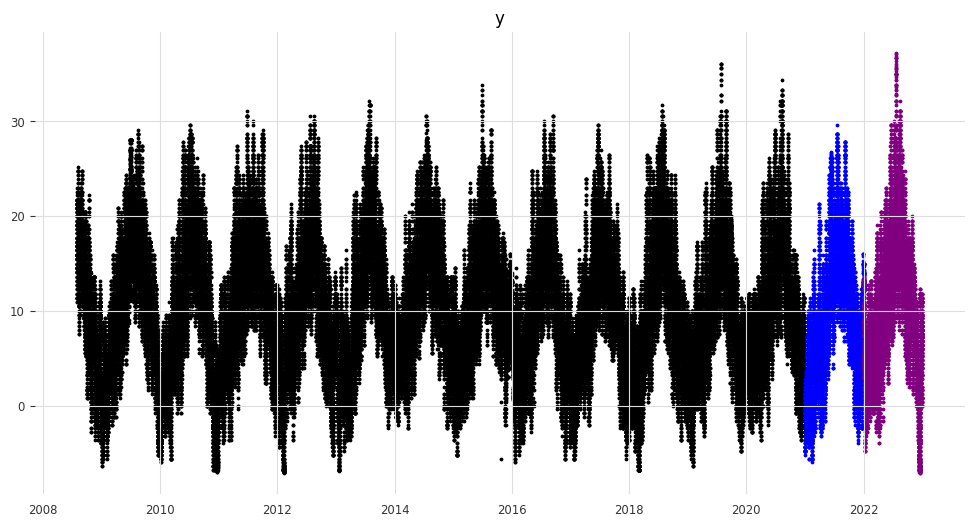

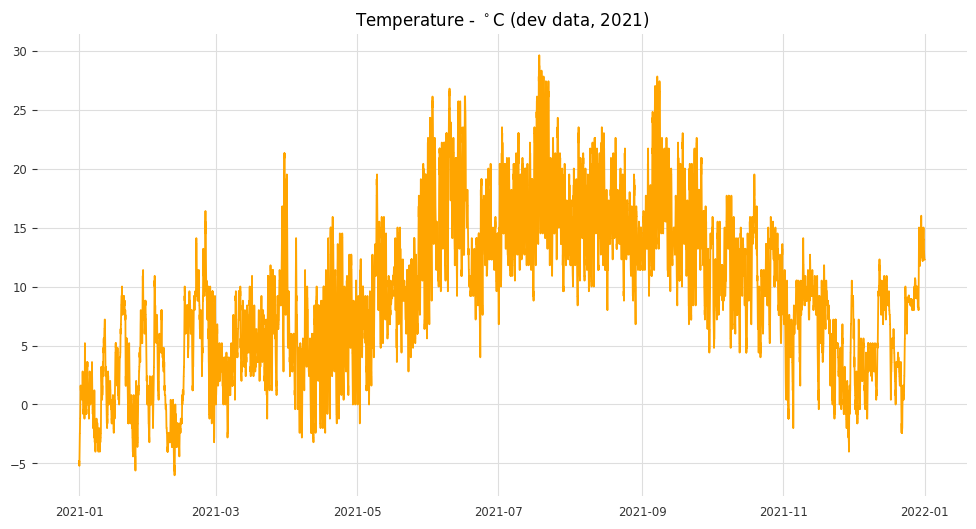

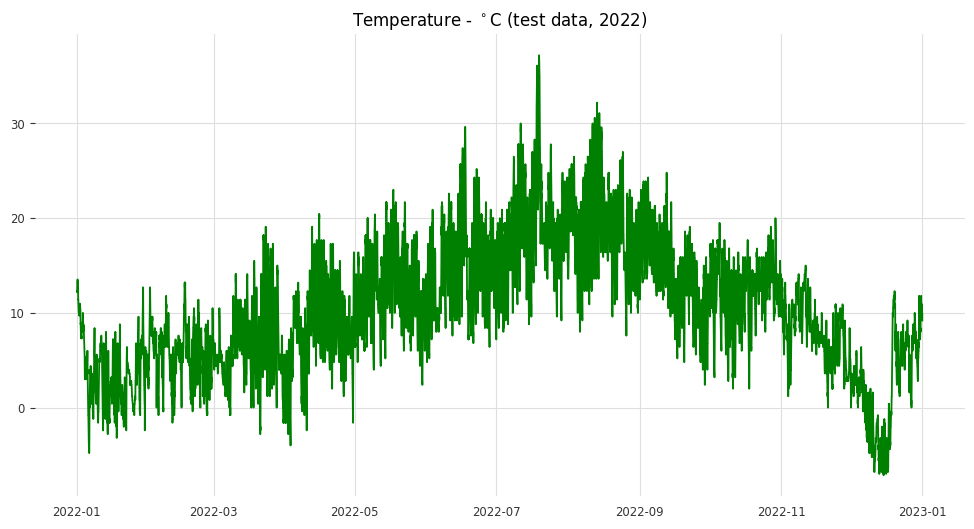

df shape:  (252768, 78)
train shape:    (217728, 78)
valid shape:    (17520, 78)
test shape:     (17520, 78)

 train_df null columns:


dT_dH                 1
dT_dP                 1
dT_dTdp               1
za_diff_1             1
za_rad_diff_1         1
irradiance_diff_1     1
azimuth_diff_1        1
azimuth_rad_diff_1    1
azimuth_cos_diff_1    1
azimuth_sin_diff_1    1
declination_diff_1    1
dtype: int64


 valid_df null columns:


Series([], dtype: float64)


 test_df null columns:


Series([], dtype: float64)

In [ ]:
# df['year'] = df['ds'].dt.year
# WARN: Crucially important valid & test data are both after train data to
#       avoid data leakage
VALID_YEAR = 2021
TEST_YEAR  = 2022
# train_df = df.loc[(df['year'] != VALID_YEAR) & (df['year'] != TEST_YEAR)]
train_df = df.loc[df['year'] < min(VALID_YEAR, TEST_YEAR)]
valid_df = df.loc[df['year'] == VALID_YEAR]
test_df  = df.loc[df['year'] == TEST_YEAR]

#train_df.loc[train_df['ds'].dt.year >= 2018, 'ds'] = train_df.loc[train_df['ds'].dt.year >= 2018, 'ds'] - pd.DateOffset(years=2)
#train_df.set_index('ds', drop=False, inplace=True)
#train_df = train_df[~train_df.index.duplicated(keep='first')]


plot_feature_history(train_df, valid_df, test_df, 'y')

plt.figure(figsize = (12, 6))
plt.plot(valid_df.ds, valid_df.y, color='orange')
plt_title = 'Temperature - $^\circ$C (dev data, ' + str(VALID_YEAR) + ')'
plt.title(plt_title)
plt.show()

plt.figure(figsize = (12, 6))
plt.plot(test_df.ds, test_df.y, color='green')
plt_title = 'Temperature - $^\circ$C (test data, ' + str(TEST_YEAR) + ')'
plt.title(plt_title)
plt.show()


del_cols = ['year']
train_df = train_df.drop(del_cols, axis = 1)
valid_df = valid_df.drop(del_cols, axis = 1)
test_df  = test_df.drop(del_cols,  axis = 1)
df = df.drop(['year'], axis = 1)

# DO NOT USE ffill with train_df - ffills 2018 & 2019!
# train_df = train_df.asfreq(freq='30min', method='ffill')
train_df = train_df.asfreq(freq='30min', fill_value=np.nan)

# DO USE ffill with valid_df, test_df
# avoids missing value errors when calculating metrics etc
valid_df = valid_df.asfreq(freq='30min', fill_value=np.nan)
test_df  =  test_df.asfreq(freq='30min', fill_value=np.nan)
# valid_df = valid_df.asfreq(freq='30min', method='ffill')
# test_df  =  test_df.asfreq(freq='30min', method='ffill')

print_train_valid_test_shapes(df, train_df, valid_df, test_df)
sanity_check_train_valid_test(train_df, valid_df, test_df)
print_null_columns(train_df, 'train_df')
print_null_columns(valid_df, 'valid_df')
print_null_columns(test_df,  'test_df')


**TODO** Use 2021 for validation set and 2022 for test set to avoid possible data leakage.


---

### Seasonal Decomposition

Time series decomposition with prophet

Decomposition transforms time series into trend, seasonal and noise (residual) components.  These components are combined either additively or multiplicatively.  It is important to understand the time series components to better model and forecast future values.  Later on, I forecast the residual temperature components using lightgbm and add the trend and seasonal components to these forecasts to make the final predictions.

[Prophet](https://facebook.github.io/prophet/) is a python and R package for forecasting.  It is based on a model where non-linear trends are fit with yearly and daily seasonality but is quite flexible.  It works best with time series that have strong seasonal effects and several seasons of historical data.  In my experience it does not produce the best forecasts but I like its API and it can produce both additive and multiplicative multi-seasonal harmonic-based decompositions.  Like loess-based decompositions, a little parameter tuning is beneficial.  The details of how Prophet calculates multiplicative seasonality is outlined [here](https://github.com/facebook/prophet/issues/1245) and [here](https://www.kaggle.com/code/smakarychev/what-is-facebook-prophet-forecasting-model#Multiplicative-and-additive-terms).

The [Season-Trend decomposition using LOESS for multiple seasonalities](https://www.statsmodels.org/dev/generated/statsmodels.tsa.seasonal.MSTL.html) from statsmodels is *currently* additive only.

DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/lgk6zjh5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/l2ucf2jd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83818', 'data', 'file=/tmp/tmp9p36u98h/lgk6zjh5.json', 'init=/tmp/tmp9p36u98h/l2ucf2jd.json', 'output', 'file=/tmp/tmp9p36u98h/prophet_modelhm0pmbbv/prophet_model-20240112095150.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:51:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:51:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


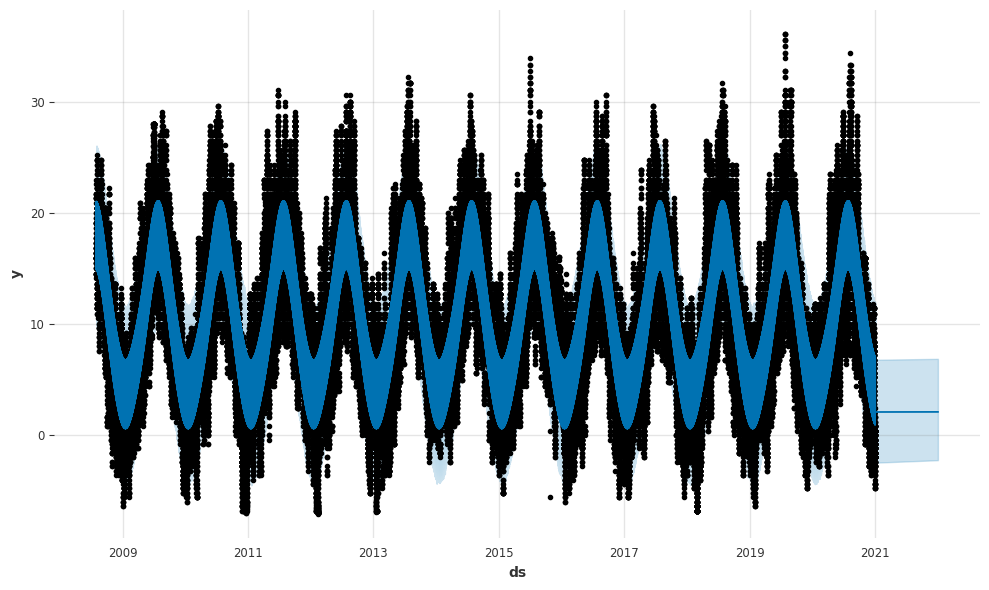

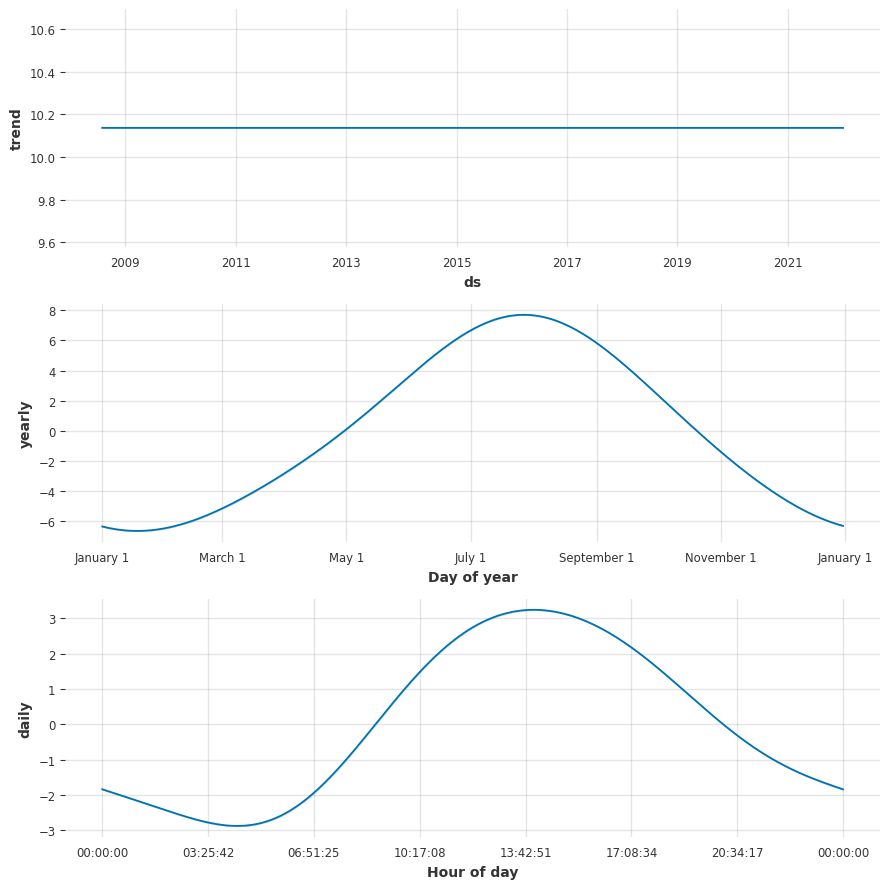

,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,azimuth_diff_1,azimuth_rad_diff_1,azimuth_cos_diff_1,azimuth_sin_diff_1,declination,declination_diff_1,soi,mei,nao_daily,y_orig
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,0.313682,NaN,1.7,-1.08,-2.477,20.0
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,-0.002866,-0.002866,-0.002866,-0.002866,0.313682,0.0,1.7,-1.08,-2.477,19.5
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,-0.012409,-0.012409,-0.012409,-0.012409,0.313682,0.0,1.7,-1.08,-2.477,19.1
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,-0.022129,-0.022129,-0.022129,-0.022129,0.313682,0.0,1.7,-1.08,-2.477,19.1
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,-0.032003,-0.032003,-0.032003,-0.032003,0.313682,0.0,1.7,-1.08,-2.477,19.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,0.114333,0.114333,0.114333,0.114333,-0.402431,0.0,3.0,-1.16,-0.741,-2.8
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.110035,0.110035,0.110035,0.110035,-0.402431,0.0,3.0,-1.16,-0.741,-3.2
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.098809,0.098809,0.098809,0.098809,-0.402431,0.0,3.0,-1.16,-0.741,-3.6


<ipython-input-15-aff1763ae617>:63: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['y'] = df[col_name]
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/pf1vs7_x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/k326g18m.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=59759', 'data', 'file=/tmp/tmp9p36u98h/pf1vs7_x.json', 'init=/tmp/tmp9p36u98h/k326g18m.json', 'output', 'file=/tmp/tmp9p36u98h/prophet_model0mtlx1y7/prophet_model-20240112095306.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:53:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start p

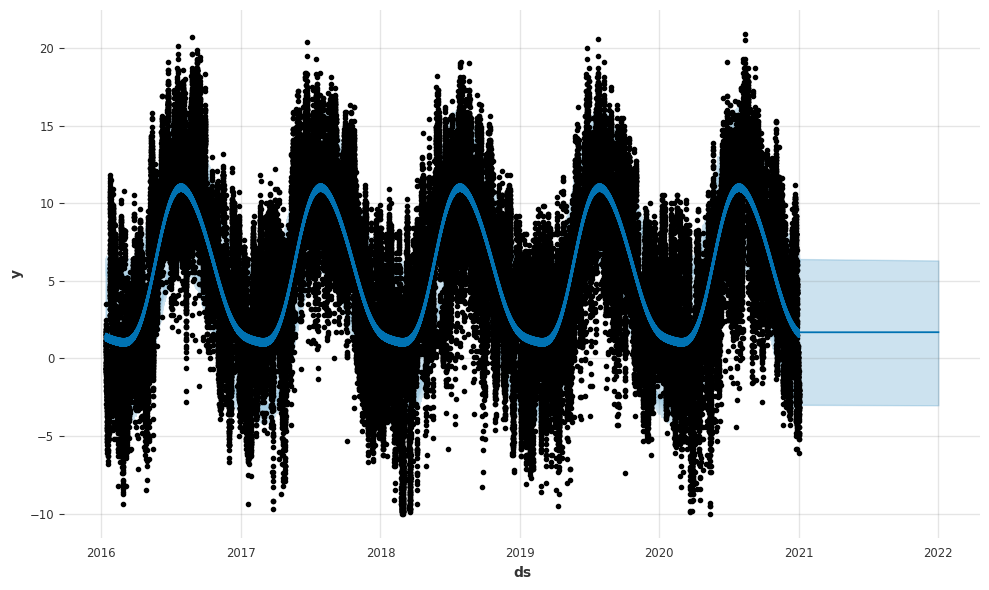

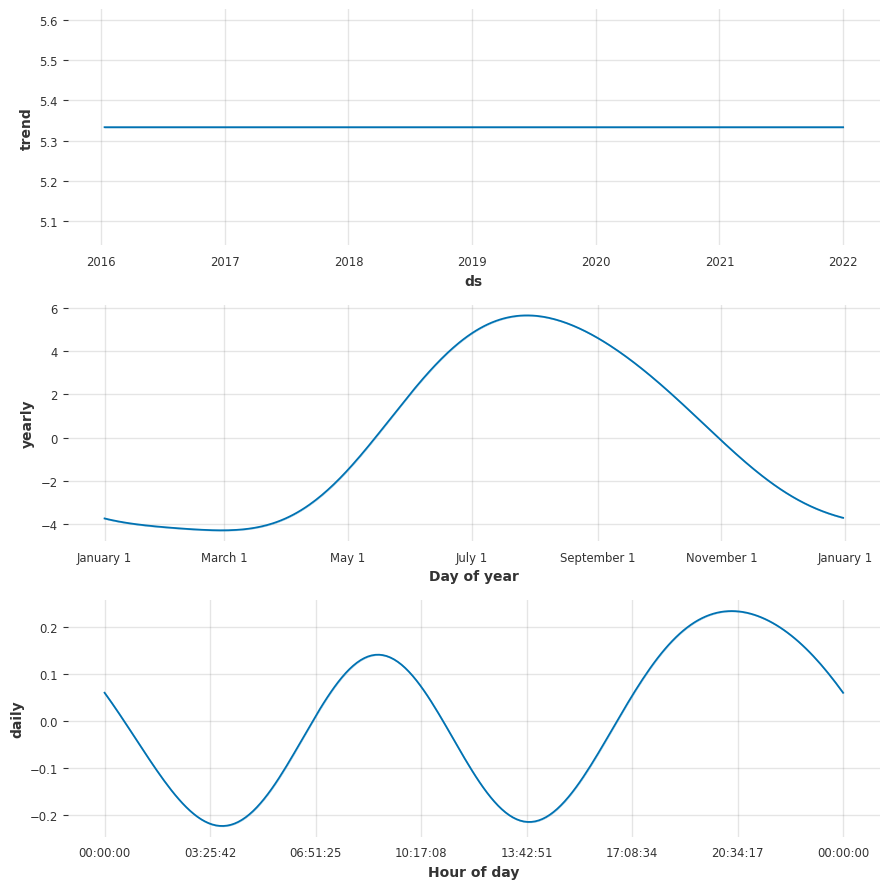

,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,azimuth_diff_1,azimuth_rad_diff_1,azimuth_cos_diff_1,azimuth_sin_diff_1,declination,declination_diff_1,soi,mei,nao_daily,y_orig
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,0.313682,NaN,1.7,-1.08,-2.477,20.0
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,-0.002866,-0.002866,-0.002866,-0.002866,0.313682,0.0,1.7,-1.08,-2.477,19.5
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,-0.012409,-0.012409,-0.012409,-0.012409,0.313682,0.0,1.7,-1.08,-2.477,19.1
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,-0.022129,-0.022129,-0.022129,-0.022129,0.313682,0.0,1.7,-1.08,-2.477,19.1
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,-0.032003,-0.032003,-0.032003,-0.032003,0.313682,0.0,1.7,-1.08,-2.477,19.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,0.114333,0.114333,0.114333,0.114333,-0.402431,0.0,3.0,-1.16,-0.741,-2.8
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.110035,0.110035,0.110035,0.110035,-0.402431,0.0,3.0,-1.16,-0.741,-3.2
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.098809,0.098809,0.098809,0.098809,-0.402431,0.0,3.0,-1.16,-0.741,-3.6


<ipython-input-15-aff1763ae617>:69: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['y'] = df[col_name]
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/6upwwg7m.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/egs__jmw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3573', 'data', 'file=/tmp/tmp9p36u98h/6upwwg7m.json', 'init=/tmp/tmp9p36u98h/egs__jmw.json', 'output', 'file=/tmp/tmp9p36u98h/prophet_modelp3vdahxc/prophet_model-20240112095334.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:53:34 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start pr

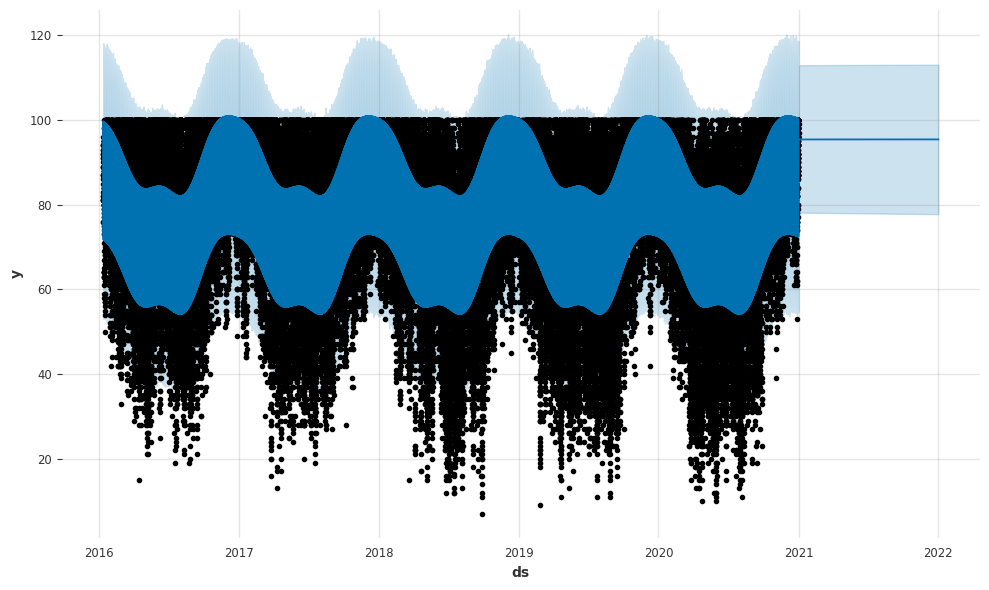

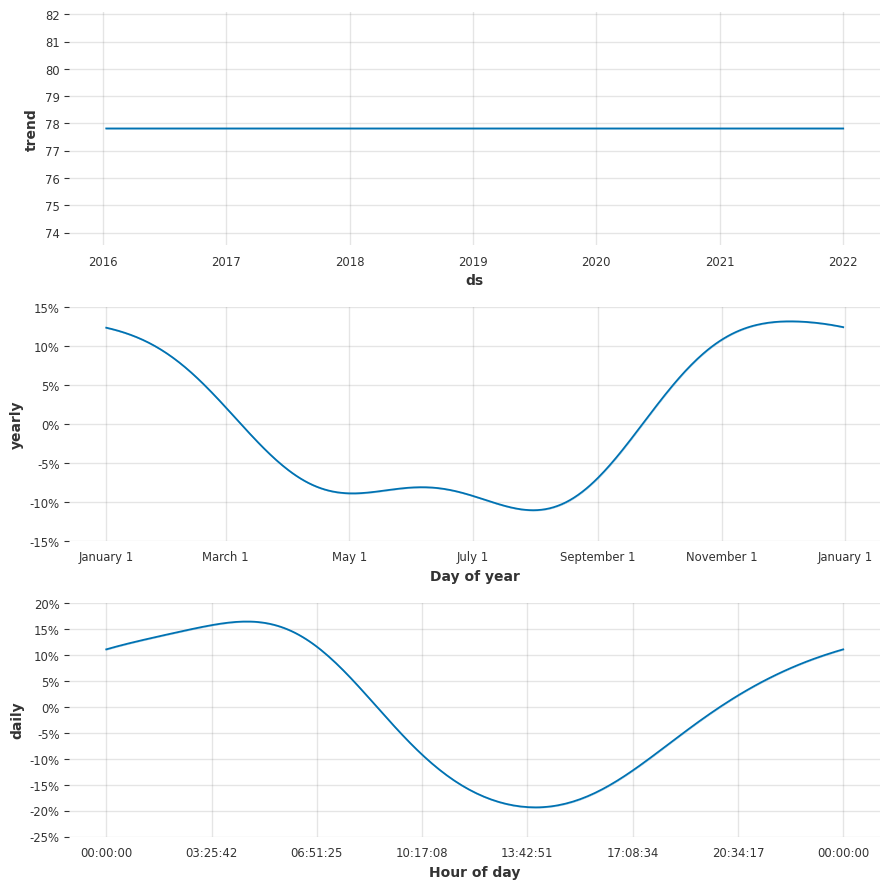

,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,azimuth_diff_1,azimuth_rad_diff_1,azimuth_cos_diff_1,azimuth_sin_diff_1,declination,declination_diff_1,soi,mei,nao_daily,y_orig
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,0.313682,NaN,1.7,-1.08,-2.477,20.0
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,-0.002866,-0.002866,-0.002866,-0.002866,0.313682,0.0,1.7,-1.08,-2.477,19.5
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,-0.012409,-0.012409,-0.012409,-0.012409,0.313682,0.0,1.7,-1.08,-2.477,19.1
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,-0.022129,-0.022129,-0.022129,-0.022129,0.313682,0.0,1.7,-1.08,-2.477,19.1
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,-0.032003,-0.032003,-0.032003,-0.032003,0.313682,0.0,1.7,-1.08,-2.477,19.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,0.114333,0.114333,0.114333,0.114333,-0.402431,0.0,3.0,-1.16,-0.741,-2.8
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.110035,0.110035,0.110035,0.110035,-0.402431,0.0,3.0,-1.16,-0.741,-3.2
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.098809,0.098809,0.098809,0.098809,-0.402431,0.0,3.0,-1.16,-0.741,-3.6


DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/zwvr9rlq.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmp9p36u98h/ong0ma6x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=46198', 'data', 'file=/tmp/tmp9p36u98h/zwvr9rlq.json', 'init=/tmp/tmp9p36u98h/ong0ma6x.json', 'output', 'file=/tmp/tmp9p36u98h/prophet_modeleqod_ukr/prophet_model-20240112095406.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
09:54:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
09:54:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


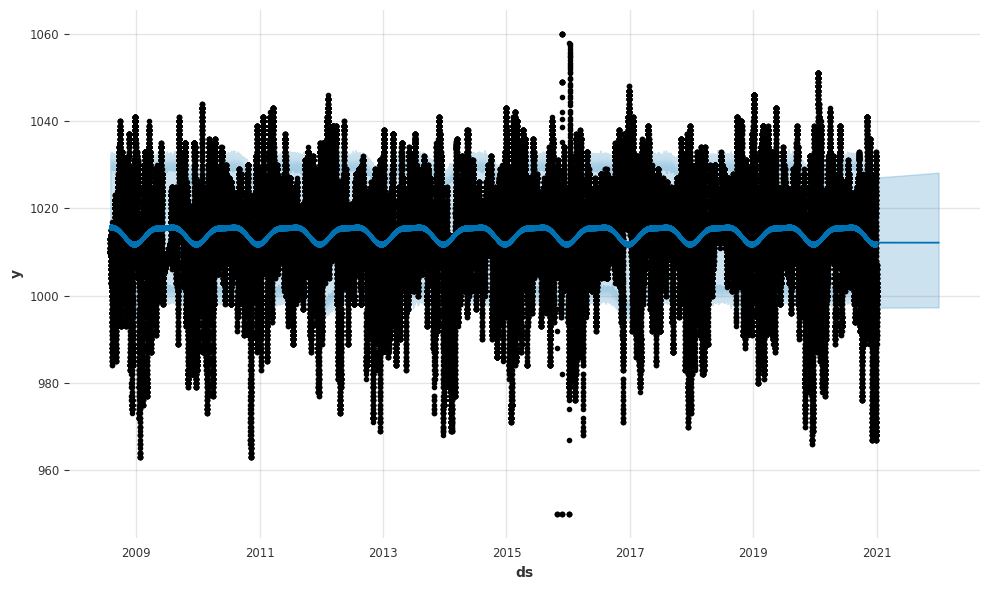

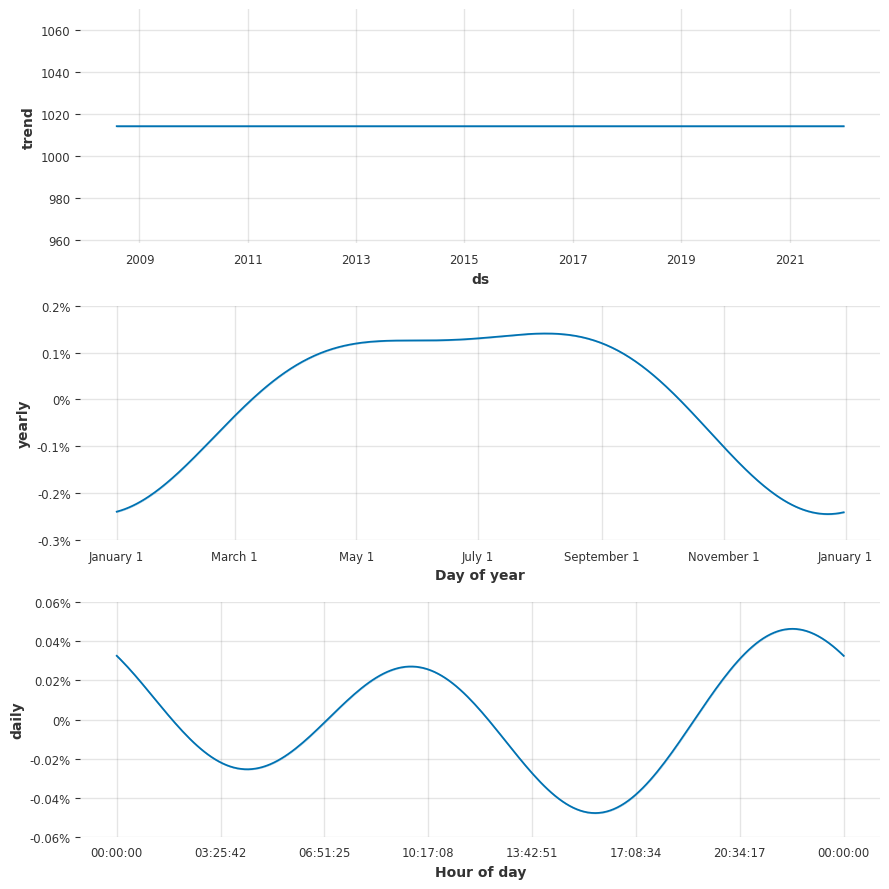

f_all:


,y_trend,y_daily,y_yearly,y_yhat,y_des,dew.point_trend,dew.point_daily,dew.point_yearly,dew.point_yhat,dew.point_des,humidity_trend,humidity_daily,humidity_yearly,humidity_yhat,humidity_des,pressure_trend,pressure_daily,pressure_yearly,pressure_yhat,pressure_des
key_0,,,,,,,,,,,,,,,,,,,,
2016-01-12 00:00:00,10.136808,-1.843996,-6.607021,1.685791,-0.085791,5.333283,0.060370,-3.945941,1.447712,-0.447712,77.8159,0.111100,0.116510,95.527529,1.004946,1014.18468,0.000326,-0.002219,1012.264694,0.974054
2016-01-12 00:30:00,10.136808,-1.987274,-6.607307,1.542227,0.457773,5.333283,0.013359,-3.946258,1.400384,-0.300384,77.8159,0.119144,0.116491,96.152057,0.977618,1014.18468,0.000245,-0.002219,1012.182259,0.974133
2016-01-12 01:00:00,10.136808,-2.129682,-6.607593,1.399533,1.400467,5.333283,-0.036143,-3.946576,1.350564,-0.450564,77.8159,0.126462,0.116473,96.720031,0.899503,1014.18468,0.000153,-0.002218,1012.090423,0.975209
2016-01-12 01:30:00,10.136808,-2.274232,-6.607878,1.254698,0.745302,5.333283,-0.085645,-3.946893,1.300745,-0.300745,77.8159,0.133337,0.116454,97.253634,0.956262,1014.18468,0.000060,-0.002218,1011.995624,0.975301
2016-01-12 02:00:00,10.136808,-2.420156,-6.608162,1.108490,1.291510,5.333283,-0.132068,-3.947210,1.254005,-0.454005,77.8159,0.140003,0.116435,97.770871,0.910292,1014.18468,-0.000031,-0.002218,1011.904373,0.975389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 22:00:00,10.136808,-1.125864,-6.358769,2.652175,-5.852175,5.333283,0.196876,-3.748773,1.781385,-4.981385,77.8159,0.067262,0.124059,92.703760,1.078705,1014.18468,0.000459,-0.002395,1012.221113,0.994842
2020-12-31 22:30:00,10.136808,-1.342326,-6.359480,2.435002,-6.035002,5.333283,0.171743,-3.749262,1.755764,-5.355764,77.8159,0.080249,0.124047,93.713368,1.067084,1014.18468,0.000462,-0.002395,1012.224442,0.994839
2020-12-31 23:00:00,10.136808,-1.529351,-6.360190,2.247266,-6.647266,5.333283,0.140407,-3.749750,1.723939,-6.523939,77.8159,0.091823,0.124035,94.613064,1.025228,1014.18468,0.000440,-0.002395,1012.201496,0.994861


valid_df:


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_yearly,pressure_yhat,y_des,y_des_diff_1,dew.point_des,dew.point_des_diff_1,humidity_des,humidity_des_diff_1,pressure_des,pressure_des_diff_1
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,-0.002394,1012.087130,-6.731203,NaN,-6.742927,NaN,1.019652,NaN,0.994974,NaN
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,-0.002394,1012.004451,-6.587217,0.143986,-7.195429,-0.452503,0.971715,-0.047938,0.996043,0.001069
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,-0.002394,1011.912372,-6.444102,0.143115,-6.345440,0.849989,1.027700,0.055985,0.995145,-0.000898
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,-0.002394,1011.817330,-6.298846,0.145256,-6.295452,0.049988,1.022090,-0.005610,0.995239,0.000093
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,-0.002394,1011.725835,-6.152216,0.146630,-6.348543,-0.053091,1.006542,-0.015547,0.996317,0.001078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,-0.002396,1012.190999,9.535192,0.215547,-0.386544,0.005366,0.838865,-0.009643,0.997884,-0.000040
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,-0.002395,1012.221113,9.821263,0.286070,-0.417539,-0.030995,0.822141,-0.016724,0.997870,-0.000015
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,-0.002395,1012.224442,10.005328,0.184065,-0.394589,0.022950,0.813510,-0.008630,0.997884,0.000014


test_df:


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_yearly,pressure_yhat,y_des,y_des_diff_1,dew.point_des,dew.point_des_diff_1,humidity_des,humidity_des_diff_1,pressure_des,pressure_des_diff_1
ds,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2022-01-01 00:00:00,12.264746,77.723545,1.101641,1010.123241,6.917828,2.586705,6.691045,228.358209,-4.446008,...,-0.002394,1012.087130,10.333543,NaN,-0.541285,NaN,0.808684,NaN,0.998060,NaN
2022-01-01 00:30:00,2022-01-01 00:30:00,12.243743,77.701246,1.087427,1010.134727,6.917839,2.582230,6.667910,228.283582,-4.437123,...,-0.002394,1012.004451,10.456526,0.122983,-0.508002,0.033283,0.803228,-0.005456,0.998152,0.000093
2022-01-01 01:00:00,2022-01-01 01:00:00,12.179704,77.643168,0.997640,1010.139485,6.917844,2.577746,6.644776,228.208955,-4.428185,...,-0.002394,1011.912372,10.535602,0.079076,-0.547800,-0.039798,0.797939,-0.005289,0.998248,0.000096
2022-01-01 01:30:00,2022-01-01 01:30:00,12.183168,77.707848,0.985036,1010.145117,6.917849,2.573255,6.621642,228.134328,-4.419194,...,-0.002394,1011.817330,10.684322,0.148720,-0.510416,0.037384,0.794244,-0.003695,0.998347,0.000099
2022-01-01 02:00:00,2022-01-01 02:00:00,12.486018,78.047152,0.994765,1010.154533,6.917859,2.568756,6.598507,228.059701,-4.410151,...,-0.002394,1011.725835,11.133802,0.449480,-0.453778,0.056638,0.793513,-0.000731,0.998447,0.000100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 21:30:00,2022-12-31 21:30:00,9.600000,80.000000,6.300000,998.000000,6.905753,3.255764,10.600000,225.000000,-7.495332,...,-0.002396,1012.190999,6.696449,0.287320,4.499303,-2.187178,0.873544,-0.155867,0.985980,-0.000054
2022-12-31 22:00:00,2022-12-31 22:00:00,10.000000,88.000000,8.100000,998.000000,6.905753,2.792848,7.800000,225.000000,-5.515433,...,-0.002395,1012.221113,7.347825,0.651376,6.318615,1.819312,0.949260,0.075716,0.985951,-0.000029
2022-12-31 22:30:00,2022-12-31 22:30:00,10.000000,80.000000,6.700000,999.000000,6.906755,2.792848,7.800000,225.000000,-5.515433,...,-0.002395,1012.224442,7.564998,0.217173,4.944236,-1.374379,0.853667,-0.095593,0.986935,0.000985


train_df:


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_yearly,pressure_yhat,y_des,y_des_diff_1,dew.point_des,dew.point_des_diff_1,humidity_des,humidity_des_diff_1,pressure_des,pressure_des_diff_1
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,0.001405,1015.940620,4.048311,NaN,-9.431299,NaN,1.145805,NaN,0.994081,NaN
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,0.001405,1015.857724,3.691924,0.143613,-9.336274,-15.694974,1.124802,-0.005310,0.994166,-0.002939
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,0.001405,1015.765425,3.434669,0.142745,-9.511575,-15.917454,1.084636,-0.061941,0.994415,-0.002771
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,0.001405,1015.670164,3.579557,0.144888,-9.497366,-14.252919,1.075039,0.050554,0.994321,-0.002956
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,0.001405,1015.578450,3.725821,0.646264,-9.569960,-14.875185,1.052765,-0.027646,0.994639,-0.002732
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,-0.002396,1012.190999,-5.703551,-7.600000,-5.100697,-7.200000,1.048253,0.021839,0.993884,-0.026675
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,-0.002395,1012.221113,-5.852175,-8.400000,-4.981385,-7.200000,1.078705,0.086296,0.994842,-0.025686
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,-0.002395,1012.224442,-6.035002,-9.600000,-5.355764,-7.900000,1.067084,0.117379,0.994839,-0.025686


df shape:  (252768, 78)
train shape:    (217728, 103)
valid shape:    (17520, 103)
test shape:     (17520, 103)

train_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: False
mean before feature redundancy: 36.56
mean after feature redundancy:  49.218



,before,after,diff
rows,217728,217728,0
cols,78,103,25
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,11,15,4
rows_with_nas,1,1,0
cols_with_nas,11,15,4
single_value_cols,0,4,4
low_var_rows,0,0,0
low_var_cols,8,16,8



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: False
mean before feature redundancy: 35.568
mean after feature redundancy:  48.438



,before,after,diff
rows,17520,17520,0
cols,78,103,25
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,0,4,4
rows_with_nas,0,1,1
cols_with_nas,0,4,4
single_value_cols,0,4,4
low_var_rows,0,0,0
low_var_cols,8,16,8



test_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: False
mean before feature redundancy: 35.452
mean after feature redundancy:  48.37



,before,after,diff
rows,17520,17520,0
cols,78,103,25
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,0,4,4
rows_with_nas,0,1,1
cols_with_nas,0,4,4
single_value_cols,1,5,4
low_var_rows,0,0,0
low_var_cols,7,15,8


WARN: train_sanity != valid_sanity


,before,after,diff
rows_with_nas,1,1,0
rows_with_nas,0,1,1


WARN: train_sanity != test_sanity


,before,after,diff
rows_with_nas,1,1,0
low_var_cols,8,16,8
rows_with_nas,0,1,1
single_value_cols,1,5,4
low_var_cols,7,15,8


WARN: test_sanity != valid_sanity


,before,after,diff
single_value_cols,1,5,4
low_var_cols,7,15,8
low_var_cols,8,16,8


In [ ]:
def merge_decompositions(df, decomps):
  '''NOTE: changes made here may also need to be made in add_prophet_components function'''

  decomp_cols  = ['y', 'dew.point', 'humidity', 'pressure']#, 'wind.speed.mean']
  decomp_terms = ['daily', 'yearly', 'des']

  # df_drop_cols = [j + '_' + i for i in decomp_terms for j in decomp_cols]
  # df.drop(df_drop_cols, axis=1, inplace=True)

  # decomps_drop_cols = [j + '_des' for j in decomp_cols]
  # decomps.drop(decomps_drop_cols, axis=1, inplace=True)

  df = df[~df.index.duplicated(keep='first')]
  decomps = decomps[~decomps.index.duplicated(keep='first')]

  # Merge on month, day, time

  df['month']  = df.index.month
  df['day']    = df.index.day
  df['hour']   = df.index.hour
  df['minute'] = df.index.minute
  decomps['month']  = decomps.index.month
  decomps['day']    = decomps.index.day
  decomps['hour']   = decomps.index.hour
  decomps['minute'] = decomps.index.minute

  merge_cols = ['month','day','hour','minute']
  df = df.merge(decomps, on=merge_cols)
  # df = pd.merge(df, decomps, left_on=df.index, right_on=decomps.index)
  df.set_index('ds', drop=False, inplace=True)
  df = df[~df.index.duplicated(keep='first')]
  # df.drop('key_0', axis=1, inplace=True)
  df.drop(merge_cols, axis=1, inplace=True)

  for j in decomp_cols:
    if j in ['y', 'dew.point']:
      df[j + '_des'] = df[j] - df[j + '_yhat']
    elif j in ['humidity', 'pressure']:
      df[j + '_des'] = df[j] / df[j + '_yhat']
      # df[j + '_des'] = df[j] - df[j + '_yhat']
      # df[j + '_des'] = np.log(df[j]) / df[j + '_yhat']
    #elif j in ['wind.speed.mean']:
    #  df[j + '_des'] = np.sqrt(df[j]) / df[j + '_yhat']
    #
    #  for var in ['_daily', '_yearly', '_des', '_yhat']:
    #    df = convert_wind_to_xy(df, 'wind.speed.mean', 'wind.bearing.mean', var)
    df[j + '_des_diff_1'] = df[j + '_des'].diff(1)

  # df = df.dropna()
  df = df.asfreq(freq='30min', fill_value=np.nan)

  return df


def add_prophet_components(df, m, col_name):  #, l_frac = 3000):
  '''NOTE: changes made here may also need to be made in merge_decompositions function'''

  # lmbda = 0.0

  if col_name == 'y':
    df['y'] = df['y_orig']
  elif col_name == 'dew.point':
    df['y'] = df[col_name]
  elif col_name == 'pressure':
    df['y'] = df[col_name]
    # x = np.log(df[col_name])
    # df['y'] = x
  elif col_name ==  'humidity':
    df['y'] = df[col_name]
    # x = np.log(df[col_name])
    # df['y'] = x
    # x, lmbda = stats.boxcox(df[col_name])
    # df['y'] = x
    # print('lambda:', lmbda)
  elif col_name == 'wind.speed.mean':
    x = np.sqrt(df[col_name])
    df['y'] = x

  m.fit(df)
  future = m.make_future_dataframe(periods=1, freq='Y').dropna()
  forecast = m.predict(future)
  m.plot(forecast)
  m.plot_components(forecast)
  plt.show()

  # year_ex = 2018
  # n = YEARLY_OBS
  # df['year'] = df['ds'].dt.year
  # y_l = lowess(df.loc[df.year == year_ex, col_name + '_yearly'], df.loc[df.year == year_ex, 'ds'], frac=l_frac / YEARLY_OBS)
  # df.loc[df.year == year_ex, col_name + '_yearly'].head(n).plot()
  # plt.plot(df.loc[df.year == year_ex, 'ds'].head(n), y_l[:n, 1], 'blue', label='lowess fit')
  # plt.title(col_name + ' yearly')
  # plt.show()

  # n = DAILY_OBS * 2 + 1
  # n = DAILY_OBS + 1
  # df.loc[df.year == year_ex, col_name + '_daily'].head(n).plot()
  # plt.axvline(x=pd.to_datetime('2018-01-01 00:00:00'), color='black', lw=1)  # why did this line suddenly stop working!
  # plt.axvline(x=pd.to_datetime('00:00 02-Jan-2018'), color='black', lw=1)
  # plt.axvline(x=pd.Timestamp('00:00 02-Jan-2018'), color='black', lw=1)
  # plt.axvline(x=df.index.values[48], color='black', lw=1)
  # somewhere someone is watching the world burn
  # plt.title(col_name + ' daily')
  # plt.show()

  forecast.set_index('ds', drop=False, inplace=True)
  f_cols_old = ['trend', 'daily', 'yearly', 'yhat']
  forecast.rename(columns={f_col: col_name + '_' + f_col for f_col in f_cols_old},
                  inplace=True)

  if col_name in ['y', 'dew.point']:
    forecast[col_name + '_des'] = df['y'] - forecast[col_name + '_yhat']
  elif col_name in ['humidity', 'pressure', 'wind.speed.mean']:
    # forecast[col_name + '_des'] = df['y'] - forecast[col_name + '_yhat']
    forecast[col_name + '_des'] = df['y'] / forecast[col_name + '_yhat']
  #if col_name in ['y', 'dew.point', 'wind.speed.mean']:
  #  forecast[col_name + '_des'] = df['y'] - forecast['yhat']
  #else:
  #  forecast[col_name + '_des'] = df['y'] - special.inv_boxcox(forecast['yhat'], lmbda)

  f_cols_new = [col_name + '_' + f_col for f_col in f_cols_old]
  f_cols_new.append(col_name + '_des')

  forecast = forecast[f_cols_new]
  # print('df:', df.shape)
  # print('forecast:', forecast.shape)

  ## drop_cols = [col_name + '_' + i for i in ['daily', 'yearly', 'des']]
  ## df.drop(drop_cols, axis=1, inplace=True)
  # df = pd.merge(df, forecast, left_on=df.index, right_on=forecast.index)
  # df.set_index('ds', drop=False, inplace=True)
  # df.drop(['key_0'], axis=1, inplace=True)
  ## df = df.dropna()
  # df = df.asfreq(freq='30min', fill_value=np.nan)
  # return df, forecast

  return forecast


train_df_orig = train_df.copy()
valid_df_orig = valid_df.copy()
test_df_orig  = test_df.copy()

train_df['y_orig'] = train_df['y']
col_name = 'y'
m1 = Prophet(yearly_seasonality = 3,
             daily_seasonality  = 3,
             weekly_seasonality = False,
             growth = 'flat')
f1 = add_prophet_components(train_df, m1, col_name)
display(train_df)

col_name = 'dew.point'
m2 = Prophet(yearly_seasonality = 3,
             daily_seasonality  = 3,
             weekly_seasonality = False,
             growth = 'flat')
f2 = add_prophet_components(train_df.loc['2016-01-12':,], m2, col_name)
display(train_df)

col_name = 'humidity'
m3 = Prophet(yearly_seasonality = 3,
             weekly_seasonality = False,
             seasonality_mode   = 'multiplicative',
             seasonality_prior_scale = 100,
             growth = 'flat')
f3 = add_prophet_components(train_df.loc['2016-01-12':,], m3, col_name)
display(train_df)

col_name = 'pressure'
m4 = Prophet(yearly_seasonality = 2,
             daily_seasonality  = 2,
             weekly_seasonality = False,
             seasonality_mode   = 'multiplicative',
             seasonality_prior_scale = 100,
             growth = 'flat')
f4 = add_prophet_components(train_df, m4, col_name)

#col_name = 'wind.speed.mean'
#m5 = Prophet(yearly_seasonality = 2,
#             daily_seasonality  = True,
#             weekly_seasonality = False,
#             seasonality_mode   = 'multiplicative',
#             growth = 'flat')
#train_df, f5 = add_prophet_components(train_df, m5, col_name, 6000)


# Convert wind direction and speed to x and y vectors, so the model can more easily interpret them
#wd_rad = train_df['wind.bearing.mean'] * np.pi / 180  # Convert to radians
#
#for var in ['_daily', '_yearly', '_des', '_yhat']:
#  wv = train_df['wind.speed.mean' + var]
#
#  # Calculate the wind x and y components
#  train_df['wind.speed.mean.x' + var] = wv * np.cos(wd_rad)
#  train_df['wind.speed.mean.y' + var] = wv * np.sin(wd_rad)

#for var in ['_daily', '_yearly', '_des', '_yhat']:
#  train_df = convert_wind_to_xy(train_df, 'wind.speed.mean', 'wind.bearing.mean', var)

train_df['y'] = train_df['y_orig']
train_df.drop('y_orig', inplace=True, axis=1)
# display(train_df)


f_all = pd.merge(f1, f2, left_on=f1.index, right_on=f2.index)
f_all.set_index('key_0', inplace=True)
f_all = pd.merge(f_all, f3, left_on=f_all.index, right_on=f3.index)
f_all.set_index('key_0', inplace=True)
f_all = pd.merge(f_all, f4, left_on=f_all.index, right_on=f4.index)
f_all.set_index('key_0', inplace=True)
#f_all = pd.merge(f_all, f5, left_on=f_all.index, right_on=f5.index)
#f_all.set_index('key_0', inplace=True)
print('f_all:')
display(f_all)


decomps_drop_cols = [j + '_des' for j in ['y', 'dew.point', 'humidity', 'pressure']]
f_all.drop(decomps_drop_cols, axis=1, inplace=True)

valid_df = merge_decompositions(valid_df, f_all)
print('valid_df:')
display(valid_df)

test_df  = merge_decompositions(test_df,  f_all)
print('test_df:')
display(test_df)

train_df  = merge_decompositions(train_df,  f_all)
print('train_df:')
display(train_df)

# Add Boruta-style "shadow" variables for feature selection
train_df['y_des_shadow'] = np.random.permutation(train_df['y_des'])
valid_df['y_des_shadow'] = np.random.permutation(valid_df['y_des'])
test_df['y_des_shadow']  = np.random.permutation( test_df['y_des'])


#merge_cols = ['month', 'day', 'hour', 'minute']
#train_df.drop(merge_cols, inplace=True, axis=1)

#del_cols = ['ds']
#train_df = train_df.drop(del_cols, axis = 1)
#valid_df = valid_df.drop(del_cols, axis = 1)
#test_df  = test_df.drop(del_cols,  axis = 1)
print_train_valid_test_shapes(df, train_df, valid_df, test_df)
sanity_check_train_valid_test(train_df, valid_df, test_df)

train_des_sanity = sanity_check_before_after_dfs(train_df_orig, train_df, 'train_df')
valid_des_sanity = sanity_check_before_after_dfs(valid_df_orig, valid_df, 'valid_df')
test_des_sanity  = sanity_check_before_after_dfs(test_df_orig,  test_df,  'test_df')
compare_train_valid_test_sanity_dfs(train_des_sanity, valid_des_sanity, test_des_sanity)
check_high_low_thresholds(train_df)
check_high_low_thresholds(valid_df)
check_high_low_thresholds(test_df)

In [ ]:
# sanity_check_before_after_dfs(valid_df_orig, valid_df, 'valid_df')

# valid_df.columns.to_series()[np.isinf(valid_df).any()]

# valid_df.index[np.isinf(valid_df).any(1)]

display(valid_df['dT_dTdp'].describe())

valid_df = valid_df.replace([np.inf, -np.inf], np.nan)
valid_df['dT_dH'] = valid_df['dT_dH'].interpolate(method='linear')
valid_df['dT_dP'] = valid_df['dT_dP'].interpolate(method='linear')
valid_df['dT_dTdp'] = valid_df['dT_dTdp'].interpolate(method='linear')

display(valid_df['dT_dTdp'].describe())

count    17520.000000
mean         0.099705
std          5.667447
min       -522.226639
25%         -0.173913
50%          0.000000
75%          0.666667
max         76.646674
Name: dT_dTdp, dtype: float64

count    17520.000000
mean         0.099705
std          5.667447
min       -522.226639
25%         -0.173913
50%          0.000000
75%          0.666667
max         76.646674
Name: dT_dTdp, dtype: float64

...

---

#### Calculate simple rolling statistics

Add rolling simple and fast to calculate rolling statistics.

Features:
 * `y`
 * `dew.point`
 * `y_des`
 * `dew.point_des`
 * `pressure`
 * `humidity`

Functions:
 * minimum
 * maximum
 * standard deviation
 * mean
 * skew
 * kurtosis

Windows:
 * 48


In [ ]:
def get_rolling_stat_features(data, feat_cols, windows, aggs, verbose=False, shift_=1):

  aggs = pd.DataFrame()

  for feat_col in feat_cols:
    for window in windows:
      rol = data[feat_col].shift(shift_).rolling(window=window, min_periods=1,)
      new_col_name = feat_col + '_window_' + str(window) + '_'

      aggs[new_col_name + 'min']  = rol.min()
      aggs[new_col_name + 'max']  = rol.max()
      aggs[new_col_name + 'std']  = rol.std()
      aggs[new_col_name + 'mean'] = rol.mean()
      aggs[new_col_name + 'skew'] = rol.skew()
      aggs[new_col_name + 'kurt'] = rol.kurt()

    # From https://stackoverflow.com/a/43748653/100129
    #data[new_col_name + 'autocorr'] = data[feat_col].rolling(window=window, min_periods=1,).corr(data[feat_col].shift(1))
    # data[new_col_name + 'autocorr'] = rol.corr(data[feat_col].shift(1)) # NOPE
    if feat_col in ['humidity', 'pressure']:
      # inf values with window = 48 - probably long sequences of equal values
      window = 96
    else:
      window = 48

    aggs[new_col_name + 'autocorr'] = data[feat_col].rolling(window=window, min_periods=1,).corr(data[feat_col].shift(1))

  return aggs


windows = [12, 24, 48, 96]
roll_cols = ['y', 'dew.point', 'y_des', 'dew.point_des', 'humidity', 'pressure']
stat_aggs = ['min', 'max', 'mean', 'std', 'skew', 'kurt', 'nunique', 'corr']
params_stat = {'windows':    windows,
               'feat_cols':  roll_cols,
               'aggs':       stat_aggs,
               'agg_func':   get_rolling_stat_features,
               'verbose':    True,
               'dataset':    'valid',
               'regenerate': True,
               'feat_name':  'df_stats_',
               'date_str':   '.2022.09.20',
              }

train_df_stat, valid_df_stat, test_df_stat = get_features(train_df,
                                                          valid_df,
                                                          test_df,
                                                          params_stat)


###############################################################################
# approx. 1 min - mostly dataframe checks
#           for dataframe statistics functions on valid_df, test_df & train_df
# 150 features added - approx. 400 NAs
#
# windows = [12, 24, 48, 96]
# roll_cols = ['y', 'dew.point', 'y_des', 'dew.point_des', 'humidity', 'pressure']
# stat_aggs = ['min', 'max', 'mean', 'std', 'skew', 'kurt', 'corr']
# params_stat = {'windows':    windows,
#                'feat_cols':  roll_cols,
#                'aggs':       stat_aggs,
#                'agg_func':   get_rolling_stat_features,
#                'verbose':    True,
#                'dataset':    'valid',
#                'regenerate': True,
#                'feat_name':  'df_stats_',
#                'date_str':   '.2022.09.20',
#               }

dataset: valid
before: (17520, 103)
after:  (17520, 253)


<ipython-input-17-9800de57edba>:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  aggs[new_col_name + 'min']  = rol.min()
<ipython-input-17-9800de57edba>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  aggs[new_col_name + 'max']  = rol.max()
<ipython-input-17-9800de57edba>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `ne

,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_window_48_mean,pressure_window_48_skew,pressure_window_48_kurt,pressure_window_96_min,pressure_window_96_max,pressure_window_96_std,pressure_window_96_mean,pressure_window_96_skew,pressure_window_96_kurt,pressure_window_96_autocorr
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,1007.000000,NaN,NaN,1007.000000,1007.000000,NaN,1007.000000,NaN,NaN,NaN
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,1007.500000,NaN,NaN,1007.000000,1008.000000,0.707107,1007.500000,NaN,NaN,-1.000000
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,1007.333333,1.732051,NaN,1007.000000,1008.000000,0.577350,1007.333333,1.732051,NaN,-0.500000
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,1007.250000,2.000000,4.000000,1007.000000,1008.000000,0.500000,1007.250000,2.000000,4.000000,-0.577350
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,1009.675293,0.126808,-1.036262,1008.550284,1010.034567,0.428500,1009.303195,-0.068246,-1.201140,0.999929
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,1009.690126,0.149724,-1.056094,1008.565460,1010.049436,0.428090,1009.318811,-0.064827,-1.196248,0.999928
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,1009.704875,0.166875,-1.077534,1008.580332,1010.064737,0.427665,1009.334429,-0.061151,-1.192084,0.999928


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_window_48_mean,pressure_window_48_skew,pressure_window_48_kurt,pressure_window_96_min,pressure_window_96_max,pressure_window_96_std,pressure_window_96_mean,pressure_window_96_skew,pressure_window_96_kurt,pressure_window_96_autocorr
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17519.000000,17517.000000,17516.000000,17519.000000,17519.000000,17518.000000,17519.000000,17517.000000,17516.000000,17518.000000
mean,9.281890,77.230799,4.846913,1015.876169,6.923438,1.504128,3.407074,188.993795,-1.135328e+00,-8.490206e-01,...,1015.873854,-0.063054,-0.631822,1009.769407,1021.273195,3.457123,1015.874044,-0.128967,-0.720880,0.966924
std,6.502144,17.352865,5.696639,11.912355,0.011765,1.069925,3.632411,92.104902,3.718511e+00,2.994325e+00,...,11.624665,0.606999,1.077129,13.171186,10.023664,2.349754,11.165192,0.596863,0.813178,0.058845
min,-6.000000,6.000000,-11.164754,968.000000,6.875232,0.000000,0.000000,0.000000,-2.030000e+01,-1.670000e+01,...,977.250000,-2.396417,-3.333333,968.000000,987.000000,0.364866,980.166667,-2.431871,-3.333333,-1.000000
25%,4.400000,67.000000,0.500000,1008.000000,6.915723,0.547723,0.300000,135.000000,-2.474874e+00,-2.192031e+00,...,1008.187500,-0.447758,-1.209923,1002.000000,1015.000000,1.698191,1007.723045,-0.532553,-1.263917,0.965448
50%,9.200000,81.000000,5.042608,1017.000000,6.924612,1.516575,2.300000,225.000000,-2.204364e-16,0.000000e+00,...,1017.229167,-0.062437,-0.863131,1012.000000,1022.000000,2.894493,1017.135417,-0.127187,-0.911787,0.986347
75%,13.600000,90.000000,9.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,1.086381e-01,1.200154e-15,...,1024.250000,0.300375,-0.327180,1019.000000,1029.000000,4.624271,1023.958333,0.250272,-0.414974,0.993808
max,29.600000,100.000000,19.100000,1044.000000,6.950815,4.857983,23.600000,360.000000,1.393000e+01,1.336432e+01,...,1043.083333,6.928203,48.000000,1041.000000,1044.000000,14.994370,1042.520833,2.438676,8.176654,0.999931


dataset: train


<ipython-input-17-9800de57edba>:10: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  aggs[new_col_name + 'min']  = rol.min()
<ipython-input-17-9800de57edba>:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  aggs[new_col_name + 'max']  = rol.max()
<ipython-input-17-9800de57edba>:12: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `ne

before: (217728, 103)
after:  (217728, 253)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_window_48_mean,pressure_window_48_skew,pressure_window_48_kurt,pressure_window_96_min,pressure_window_96_max,pressure_window_96_std,pressure_window_96_mean,pressure_window_96_skew,pressure_window_96_kurt,pressure_window_96_autocorr
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,1009.926805,NaN,NaN,1009.926805,1009.926805,NaN,1009.926805,NaN,NaN,NaN
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,1009.929150,NaN,NaN,1009.926805,1009.931495,0.003316,1009.929150,NaN,NaN,1.000000
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,1009.983720,1.727258,NaN,1009.926805,1010.092861,0.094548,1009.983720,1.727258,NaN,-0.598251
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,1009.963376,1.868327,3.618566,1009.902342,1010.092861,0.087265,1009.963376,1.868327,3.618566,-0.704942
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,1002.833333,0.550941,-0.658474,995.000000,1006.000000,2.613645,1000.895833,-0.259567,-0.099325,0.989362
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,1002.937500,0.504897,-0.765203,995.000000,1006.000000,2.593493,1001.010417,-0.192870,-0.113239,0.988639
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,1003.062500,0.542417,-0.646638,995.000000,1007.000000,2.589939,1001.135417,-0.074329,-0.101240,0.988587


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_window_48_mean,pressure_window_48_skew,pressure_window_48_kurt,pressure_window_96_min,pressure_window_96_max,pressure_window_96_std,pressure_window_96_mean,pressure_window_96_skew,pressure_window_96_kurt,pressure_window_96_autocorr
count,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,...,217727.000000,217725.000000,217724.000000,217727.000000,217727.000000,217726.000000,217727.000000,217725.000000,217724.000000,217726.000000
mean,10.156650,78.661830,5.994144,1014.171124,6.921757,1.844258,4.456375,195.205732,-1.735383e+00,-1.281071,...,1014.171777,-0.072544,-0.648434,1007.665320,1020.065329,3.724027,1014.172824,-0.107247,-0.694601,0.971696
std,6.480187,17.333778,5.109794,11.959898,0.011831,1.027176,4.017316,83.012687,4.105561e+00,3.806552,...,11.611826,0.602876,0.994393,12.938508,10.081757,2.511419,11.092708,0.616446,1.001342,0.046896
min,-7.073291,5.000000,-10.000000,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-29.200000,...,966.312500,-6.928203,-3.000000,950.000000,979.000000,0.003316,971.072917,-7.241013,-2.787607,-0.720293
25%,5.200000,68.000000,2.100000,1007.000000,6.914731,1.095445,1.200000,135.000000,-3.889087e+00,-3.394113,...,1007.354167,-0.464944,-1.223505,1000.000000,1014.000000,1.915980,1007.583333,-0.508656,-1.265511,0.970405
50%,9.600000,83.000000,6.100000,1015.000000,6.922644,1.870829,3.500000,225.000000,-2.828427e-01,0.000000,...,1015.291667,-0.074831,-0.876773,1009.000000,1021.000000,3.141963,1015.228449,-0.107673,-0.930753,0.987477
75%,14.500000,92.000000,9.800000,1022.000000,6.929517,2.569047,6.600000,270.000000,1.836970e-16,0.070711,...,1022.104167,0.309779,-0.342369,1016.000000,1027.000000,4.916331,1021.708333,0.287404,-0.400434,0.994238
max,36.100000,100.000000,20.900000,1060.000000,6.966024,5.403702,29.200000,360.000000,2.050610e+01,22.407196,...,1050.125000,6.928203,48.000000,1044.000000,1060.000000,29.137051,1048.187500,4.872682,63.749448,1.000000


,r_test,f_test,mi
y_des_window_12_mean,0.033344,0.113973,0.029058
y_des_window_12_max,0.033266,0.111096,0.034778
y_des_window_12_min,0.032489,0.088146,0.034467
y_des_window_24_max,0.030483,0.054796,0.027616
y_des_window_24_mean,0.030266,0.052405,0.019905
y_des_window_48_mean,0.028988,0.041057,0.018213
y_des_window_24_min,0.028914,0.040517,0.026271
y_des_window_48_max,0.028763,0.039436,0.024304
y_des_window_48_min,0.026861,0.028686,0.022062
dew.point_des_window_12_max,0.026550,0.027311,0.016797


df shape:  (252768, 78)
train shape:    (217728, 103)
valid shape:    (17520, 103)
test shape:     (17520, 103)
df shape:  (252768, 78)
train shape:    (217728, 254)
valid shape:    (17520, 253)
test shape:     (17520, 253)
df shape:  (252768, 78)
train shape:    (217728, 253)
valid shape:    (17520, 253)
test shape:     (17520, 253)
ERROR: valid_df == test_df!
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: valid_df == test_df!
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_

,before,after,diff
rows,217728,217728,0
cols,103,253,150
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,15,404,389
rows_with_nas,1,93,92
cols_with_nas,15,165,150
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,18,2



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: False
mean before feature redundancy: 48.438
mean after feature redundancy:  72.38



,before,after,diff
rows,17520,17520,0
cols,103,253,150
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,308,304
rows_with_nas,1,6,5
cols_with_nas,4,154,150
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,17,1



test_df
before.index.equals(after.index): False
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): False

before[common_cols].equals(after[common_cols]): False
redundancy before > after: False
mean before feature redundancy: 48.37
mean after feature redundancy:  72.38



,before,after,diff
rows,17520,17520,0
cols,103,253,150
missing_rows,0,17520,17520
missing_cols,0,0,0
total_nas,4,308,304
rows_with_nas,1,6,5
cols_with_nas,4,154,150
single_value_cols,5,4,-1
low_var_rows,0,0,0
low_var_cols,15,17,2


WARN: train_sanity != valid_sanity


,before,after,diff
total_nas,15,404,389
rows_with_nas,1,93,92
cols_with_nas,15,165,150
low_var_cols,16,18,2
total_nas,4,308,304
rows_with_nas,1,6,5
cols_with_nas,4,154,150
low_var_cols,16,17,1


WARN: train_sanity != test_sanity


,before,after,diff
total_nas,15,404,389
rows_with_nas,1,93,92
cols_with_nas,15,165,150
single_value_cols,4,4,0
low_var_cols,16,18,2
missing_rows,0,17520,17520
total_nas,4,308,304
rows_with_nas,1,6,5
cols_with_nas,4,154,150
single_value_cols,5,4,-1


WARN: test_sanity != valid_sanity


,before,after,diff
missing_rows,0,17520,17520
single_value_cols,5,4,-1
low_var_cols,15,17,2
single_value_cols,4,4,0
low_var_cols,16,17,1


In [ ]:
from statsmodels.tsa.stattools import ccf, ccovf


def get_rolling_cross_corr_stats(data, feat_cols, windows, aggs, verbose=False, shift_=1):
  '''Cross-correlation between features'''

  aggs = pd.DataFrame()

  inf_val_cols = ['humidity', 'pressure']

  for feat1, feat2 in feat_cols:
    # print('feats:', feat1, feat2)
    if feat1 in inf_val_cols or feat2 in inf_val_cols:
      # inf values with window = 48 - probably long sequences of equal values
      window = 96
    else:
      window = 48
    # print('window:', window)

    # rol = data[feat1].shift(shift_).rolling(window=window, min_periods=1,)
    new_col_name_12 = feat1 + '_' + feat2 + '_window_' + str(window) + '_ccorr'
    new_col_name_21 = feat2 + '_' + feat1 + '_window_' + str(window) + '_ccorr'

    # From https://stackoverflow.com/a/43748653/100129
    #data[new_col_name + 'autocorr'] = data[feat_col].rolling(window=window, min_periods=1,).corr(data[feat_col].shift(1))
    # data[new_col_name + 'autocorr'] = rol.corr(data[feat_col].shift(1)) # NOPE
    aggs[new_col_name_12] = data[feat1].rolling(window=window, min_periods=window,).corr(data[feat2].shift(1))
    aggs[new_col_name_21] = data[feat2].rolling(window=window, min_periods=window,).corr(data[feat1].shift(1))

  return aggs


windows = [48, 96]
ccor_cols = [['y', 'dew.point'],
             ['y', 'pressure'],
            #['y', 'humidity'],  # inf values
             ['y_des', 'dew.point_des'],
            #['y_des', 'humidity'],  # inf values
            #['y_des', 'humidity_diff_48'],
            #['y_des', 'pressure_diff_48'],
            #['humidity', 'dew.point'],  # inf values
             ['humidity', 'pressure'],
            #['humidity_diff_48', 'dew.point_des'],
            #['humidity_diff_48', 'pressure_diff_48'],
             ['pressure', 'dew.point'],
            #['pressure_diff_48', 'dew.point_des']
            ]
ccor_aggs = ['corr']
params_stat = {'windows':    windows,
               'feat_cols':  ccor_cols,
               'aggs':       ccor_aggs,
               'agg_func':   get_rolling_cross_corr_stats,
               'verbose':    True,
               'dataset':    'valid',
               'regenerate': True,
               'feat_name':  'corr_stats_',
               'date_str':   '.2022.09.20',
              }

train_df_ccor, valid_df_ccor, test_df_ccor = get_features(train_df,
                                                          valid_df,
                                                          test_df,
                                                          params_stat)


###############################################################################
# 30 secs - mostly dataframe checks
#           for dataframe statistics functions on valid_df, test_df & train_df
# 20 features added - approx. 2,600 NAs
#
# windows = [48, 96]
# ccor_cols = [['y', 'dew.point'],
#              ['y', 'pressure'],
#             #['y', 'humidity'],  # inf values
#              ['y_des', 'dew.point_des'],
#             #['y_des', 'humidity'],  # inf values
#              ['y_des', 'humidity_diff_48'],
#              ['y_des', 'pressure_diff_48'],
#             #['humidity', 'dew.point'],  # inf values
#              ['humidity', 'pressure'],
#              ['humidity_diff_48', 'dew.point_des'],
#              ['humidity_diff_48', 'pressure_diff_48'],
#              ['pressure', 'dew.point'],
#              ['pressure_diff_48', 'dew.point_des'],]
# ccor_aggs = ['corr']
# params_stat = {'windows':    windows,
#                'feat_cols':  ccor_cols,
#                'aggs':       ccor_aggs,
#                'agg_func':   get_rolling_cross_corr_stats,
#                'verbose':    True,
#                'dataset':    'valid',
#                'regenerate': True,
#                'feat_name':  'corr_stats_',
#                'date_str':   '.2022.09.20', }

dataset: valid
before: (17520, 103)
after:  (17520, 113)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,y_dew.point_window_48_ccorr,dew.point_y_window_48_ccorr,y_pressure_window_96_ccorr,pressure_y_window_96_ccorr,y_des_dew.point_des_window_48_ccorr,dew.point_des_y_des_window_48_ccorr,humidity_pressure_window_96_ccorr,pressure_humidity_window_96_ccorr,pressure_dew.point_window_96_ccorr,dew.point_pressure_window_96_ccorr
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,-0.598470,-0.468950,-0.005259,0.038601,0.599451,0.519707,-0.322742,-0.298306,-0.621621,-0.609205
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,-0.607780,-0.480373,-0.046892,-0.003730,0.584420,0.506182,-0.354386,-0.329264,-0.609491,-0.597554
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,-0.614985,-0.494909,-0.088851,-0.045501,0.562296,0.487526,-0.384391,-0.360962,-0.597776,-0.584955


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,y_dew.point_window_48_ccorr,dew.point_y_window_48_ccorr,y_pressure_window_96_ccorr,pressure_y_window_96_ccorr,y_des_dew.point_des_window_48_ccorr,dew.point_des_y_des_window_48_ccorr,humidity_pressure_window_96_ccorr,pressure_humidity_window_96_ccorr,pressure_dew.point_window_96_ccorr,dew.point_pressure_window_96_ccorr
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17472.000000,17472.000000,17424.000000,17424.000000,17472.000000,17472.000000,17424.000000,17424.000000,17424.000000,17424.000000
mean,9.281890,77.230799,4.846913,1015.876169,6.923438,1.504128,3.407074,188.993795,-1.135328e+00,-8.490206e-01,...,0.153171,0.136405,-0.128771,-0.148491,0.154024,0.125154,-0.021654,-0.007027,-0.182247,-0.186218
std,6.502144,17.352865,5.696639,11.912355,0.011765,1.069925,3.632411,92.104902,3.718511e+00,2.994325e+00,...,0.494185,0.489589,0.388438,0.386064,0.436811,0.442005,0.340777,0.343996,0.436440,0.431094
min,-6.000000,6.000000,-11.164754,968.000000,6.875232,0.000000,0.000000,0.000000,-2.030000e+01,-1.670000e+01,...,-0.955100,-0.941039,-0.962272,-0.961235,-0.929277,-0.923245,-0.893582,-0.898860,-0.971323,-0.964736
25%,4.400000,67.000000,0.500000,1008.000000,6.915723,0.547723,0.300000,135.000000,-2.474874e+00,-2.192031e+00,...,-0.261584,-0.268888,-0.411565,-0.431319,-0.191382,-0.222576,-0.267322,-0.253697,-0.538330,-0.535519
50%,9.200000,81.000000,5.042608,1017.000000,6.924612,1.516575,2.300000,225.000000,-2.204364e-16,0.000000e+00,...,0.175757,0.144844,-0.140172,-0.167435,0.159830,0.124344,-0.023620,-0.008331,-0.232263,-0.232554
75%,13.600000,90.000000,9.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,1.086381e-01,1.200154e-15,...,0.586507,0.551689,0.130146,0.108211,0.523486,0.506484,0.217672,0.236954,0.154255,0.135161
max,29.600000,100.000000,19.100000,1044.000000,6.950815,4.857983,23.600000,360.000000,1.393000e+01,1.336432e+01,...,0.985429,0.986218,0.910612,0.905553,0.979362,0.968884,0.934884,0.931916,0.882077,0.876020


dataset: train
before: (217728, 103)
after:  (217728, 113)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,y_dew.point_window_48_ccorr,dew.point_y_window_48_ccorr,y_pressure_window_96_ccorr,pressure_y_window_96_ccorr,y_des_dew.point_des_window_48_ccorr,dew.point_des_y_des_window_48_ccorr,humidity_pressure_window_96_ccorr,pressure_humidity_window_96_ccorr,pressure_dew.point_window_96_ccorr,dew.point_pressure_window_96_ccorr
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,0.891140,0.870378,-0.399543,-0.415826,-0.206660,-0.401574,0.483180,0.490776,-0.214031,-0.197963
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.890063,0.896890,-0.401751,-0.414001,-0.224917,-0.391022,0.509824,0.502899,-0.202949,-0.183344
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.915438,0.896119,-0.403344,-0.416803,-0.205003,-0.414167,0.527367,0.530890,-0.188248,-0.172025


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,y_dew.point_window_48_ccorr,dew.point_y_window_48_ccorr,y_pressure_window_96_ccorr,pressure_y_window_96_ccorr,y_des_dew.point_des_window_48_ccorr,dew.point_des_y_des_window_48_ccorr,humidity_pressure_window_96_ccorr,pressure_humidity_window_96_ccorr,pressure_dew.point_window_96_ccorr,dew.point_pressure_window_96_ccorr
count,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,...,217680.000000,217680.000000,217632.000000,217632.000000,217680.000000,217680.000000,217544.000000,217544.000000,217632.000000,217632.000000
mean,10.156650,78.661830,5.994144,1014.171124,6.921757,1.844258,4.456375,195.205732,-1.735383e+00,-1.281071,...,0.268199,0.241731,-0.166064,-0.183370,0.194962,0.158403,-0.030606,-0.020041,-0.236825,-0.236344
std,6.480187,17.333778,5.109794,11.959898,0.011831,1.027176,4.017316,83.012687,4.105561e+00,3.806552,...,0.526026,0.528542,0.384469,0.383903,0.460047,0.467047,0.353847,0.358427,0.464222,0.460121
min,-7.073291,5.000000,-10.000000,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-29.200000,...,-0.968682,-0.969008,-0.983849,-0.980638,-0.961787,-0.950325,-0.961557,-0.957644,-0.983999,-0.985081
25%,5.200000,68.000000,2.100000,1007.000000,6.914731,1.095445,1.200000,135.000000,-3.889087e+00,-3.394113,...,-0.168054,-0.201170,-0.452470,-0.471576,-0.165399,-0.215484,-0.295377,-0.289111,-0.631731,-0.626033
50%,9.600000,83.000000,6.100000,1015.000000,6.922644,1.870829,3.500000,225.000000,-2.828427e-01,0.000000,...,0.361454,0.324690,-0.189707,-0.209901,0.224939,0.180637,-0.029702,-0.018312,-0.303148,-0.300866
75%,14.500000,92.000000,9.800000,1022.000000,6.929517,2.569047,6.600000,270.000000,1.836970e-16,0.070711,...,0.745268,0.721130,0.098557,0.079193,0.589666,0.559120,0.230395,0.248064,0.107183,0.101806
max,36.100000,100.000000,20.900000,1060.000000,6.966024,5.403702,29.200000,360.000000,2.050610e+01,22.407196,...,0.996566,0.994611,0.956378,0.954118,0.987720,0.988139,0.955452,0.955164,0.961590,0.958753


,r_test,f_test,mi
dew.point_des,2.492620,0.872849,0.282811
humidity,-0.939126,0.074176,0.050267
pressure_y_window_96_ccorr,-0.348427,0.009657,0.061505
y_pressure_window_96_ccorr,-0.337324,0.009047,0.059032
pressure,-0.332606,0.008794,0.100782
dew.point_pressure_window_96_ccorr,-0.251898,0.005027,0.068647
irradiance,0.241535,0.004620,0.008317
pressure_dew.point_window_96_ccorr,-0.232191,0.004268,0.069680
y_dew.point_window_48_ccorr,0.219509,0.003813,0.058693
dew.point_y_window_48_ccorr,0.215844,0.003686,0.060584


df shape:  (252768, 78)
train shape:    (217728, 103)
valid shape:    (17520, 103)
test shape:     (17520, 103)
df shape:  (252768, 78)
train shape:    (217728, 114)
valid shape:    (17520, 113)
test shape:     (17520, 113)
df shape:  (252768, 78)
train shape:    (217728, 113)
valid shape:    (17520, 113)
test shape:     (17520, 113)
ERROR: valid_df == test_df!
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: valid_df == test_df!
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_

,before,after,diff
rows,217728,217728,0
cols,103,113,10
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,15,959,944
rows_with_nas,1,185,184
cols_with_nas,15,25,10
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 48.438
mean after feature redundancy:  44.176



,before,after,diff
rows,17520,17520,0
cols,103,113,10
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,772,768
rows_with_nas,1,96,95
cols_with_nas,4,14,10
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



test_df
before.index.equals(after.index): False
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): False

before[common_cols].equals(after[common_cols]): False
redundancy before > after: True
mean before feature redundancy: 48.37
mean after feature redundancy:  44.176



,before,after,diff
rows,17520,17520,0
cols,103,113,10
missing_rows,0,17520,17520
missing_cols,0,0,0
total_nas,4,772,768
rows_with_nas,1,96,95
cols_with_nas,4,14,10
single_value_cols,5,4,-1
low_var_rows,0,0,0
low_var_cols,15,16,1


WARN: train_sanity != valid_sanity


,before,after,diff
total_nas,15,959,944
rows_with_nas,1,185,184
cols_with_nas,15,25,10
total_nas,4,772,768
rows_with_nas,1,96,95
cols_with_nas,4,14,10


WARN: train_sanity != test_sanity


,before,after,diff
total_nas,15,959,944
rows_with_nas,1,185,184
cols_with_nas,15,25,10
single_value_cols,4,4,0
low_var_cols,16,16,0
missing_rows,0,17520,17520
total_nas,4,772,768
rows_with_nas,1,96,95
cols_with_nas,4,14,10
single_value_cols,5,4,-1


WARN: test_sanity != valid_sanity


,before,after,diff
missing_rows,0,17520,17520
single_value_cols,5,4,-1
low_var_cols,15,16,1
single_value_cols,4,4,0
low_var_cols,16,16,0


...

---

Plot short term autocorrelations

Compare base and deseasonalised features

...

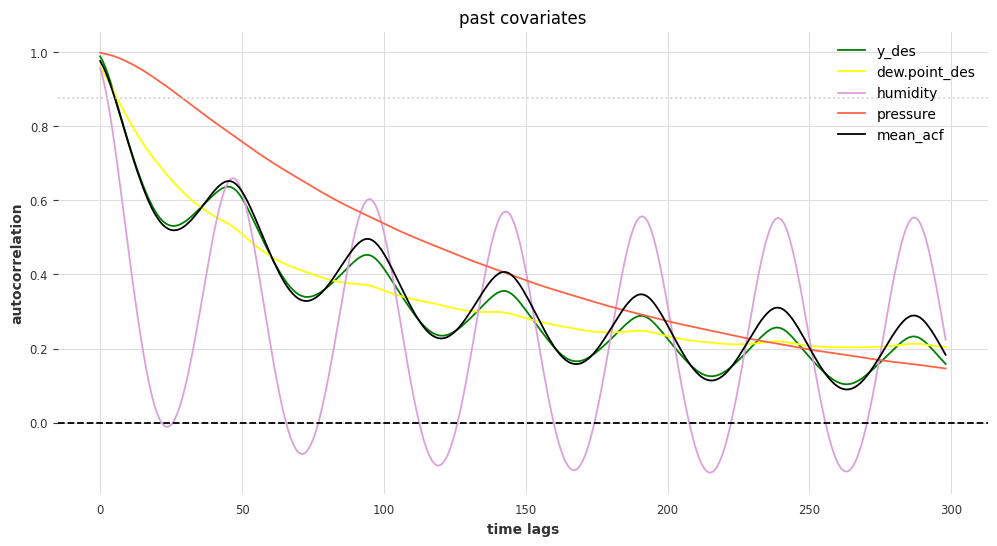

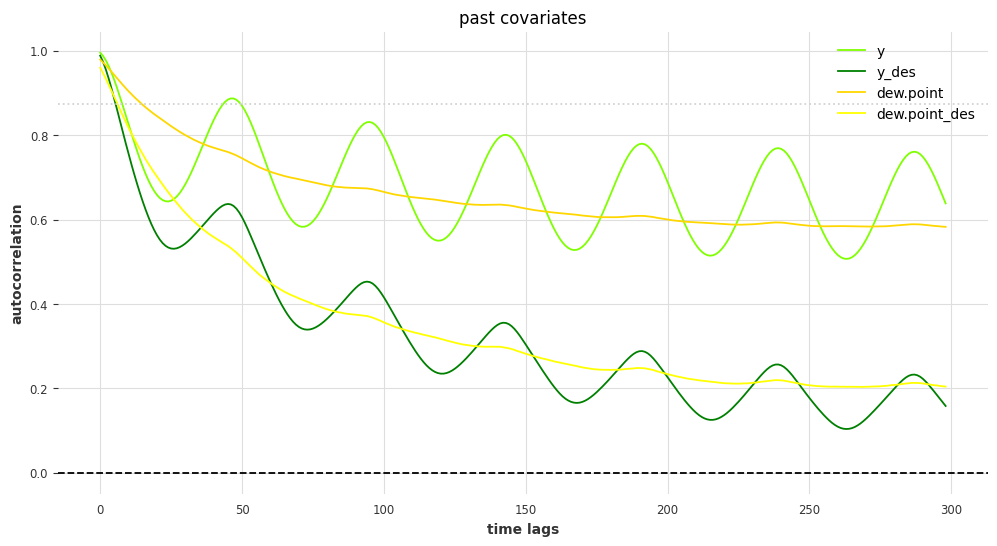

In [ ]:
pc_feats = ['y_des', 'dew.point_des', 'humidity', 'pressure']
pc_cols  = ['green', 'yellow', 'plum', 'tomato']
plot_short_term_acf(train_df, pc_feats, pc_cols, 'past covariates', mean_feat=True)

pc_feats = ['y', 'y_des', 'dew.point', 'dew.point_des']
pc_cols  = ['chartreuse', 'green', 'gold', 'yellow']
plot_short_term_acf(train_df, pc_feats, pc_cols, 'past covariates')

...

---

Plot partial autocorrelations

...

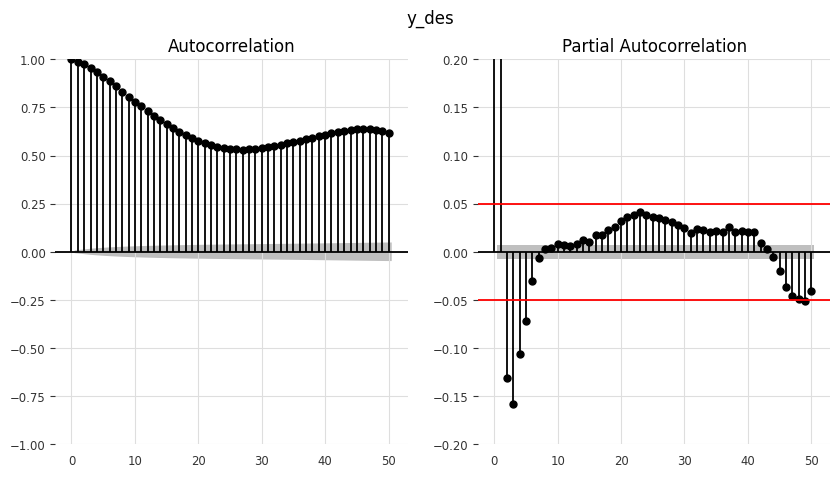

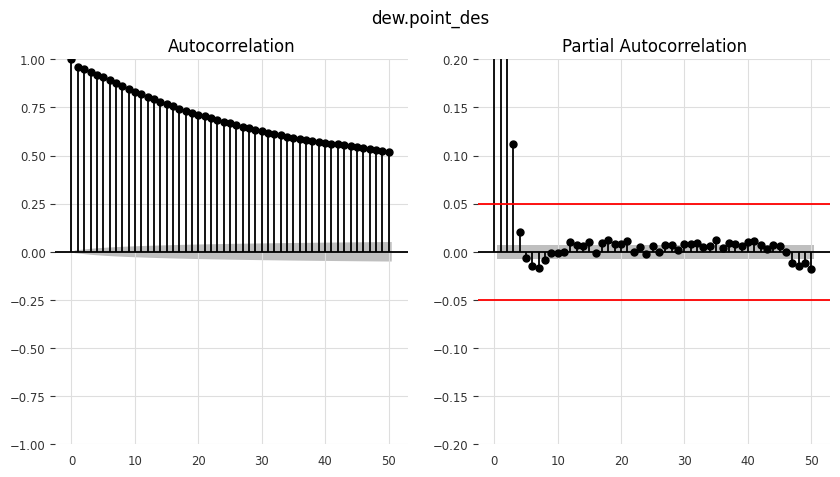

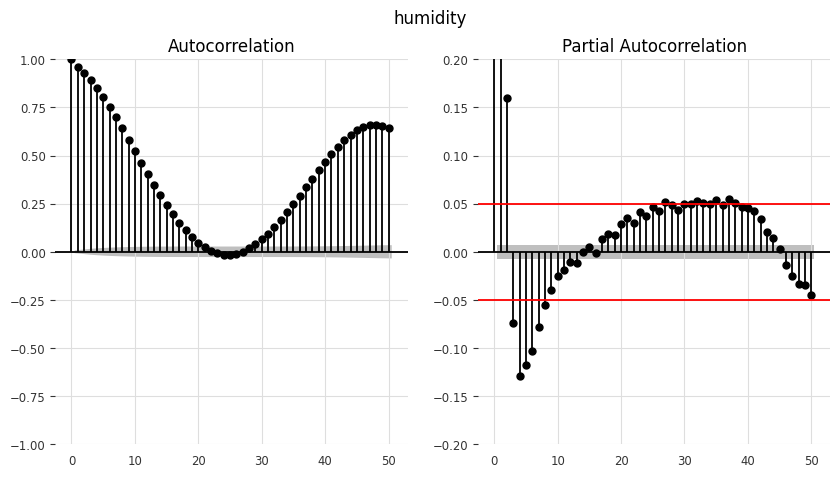

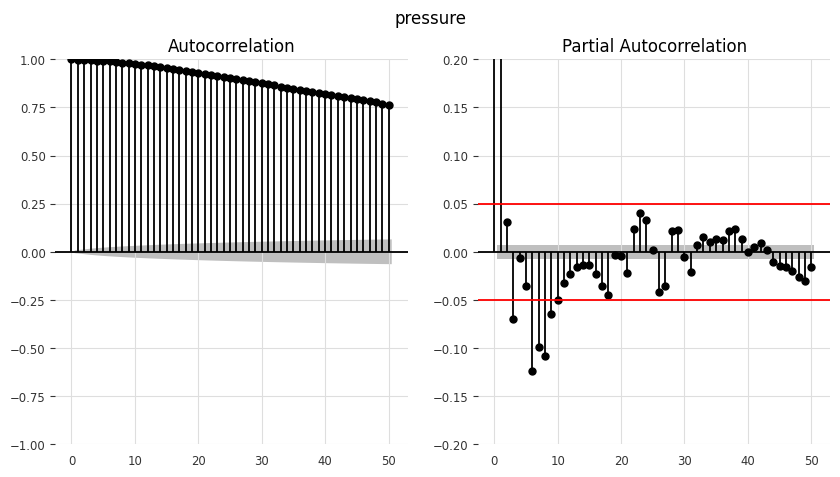

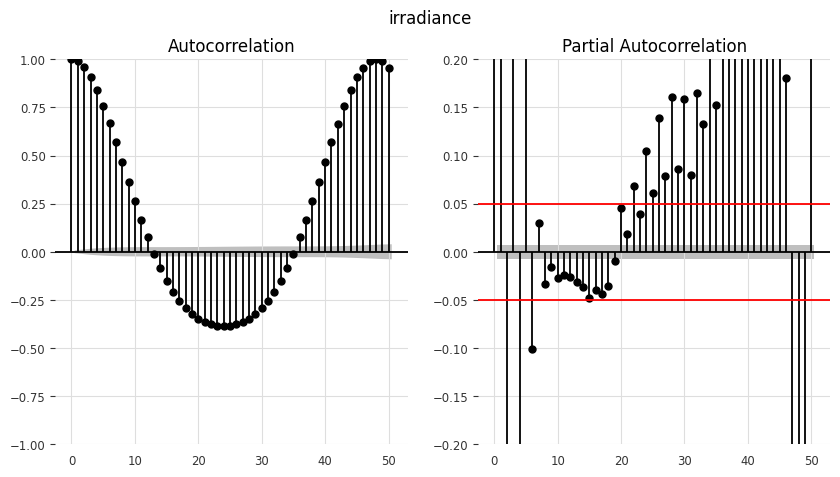

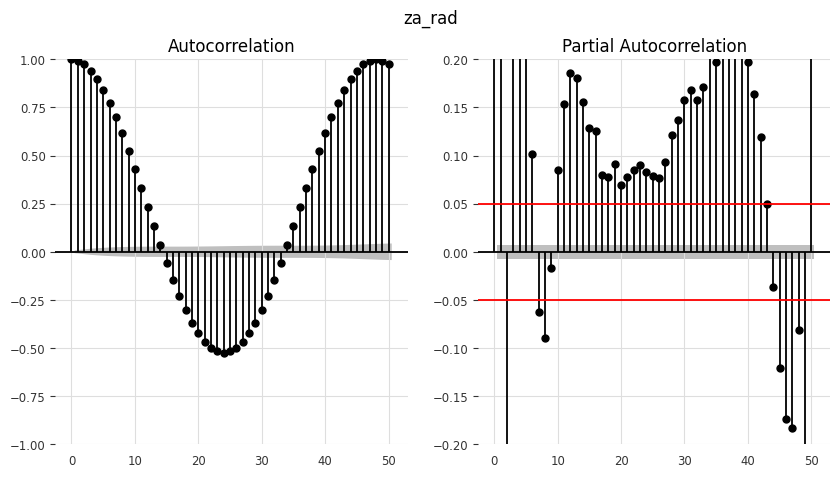

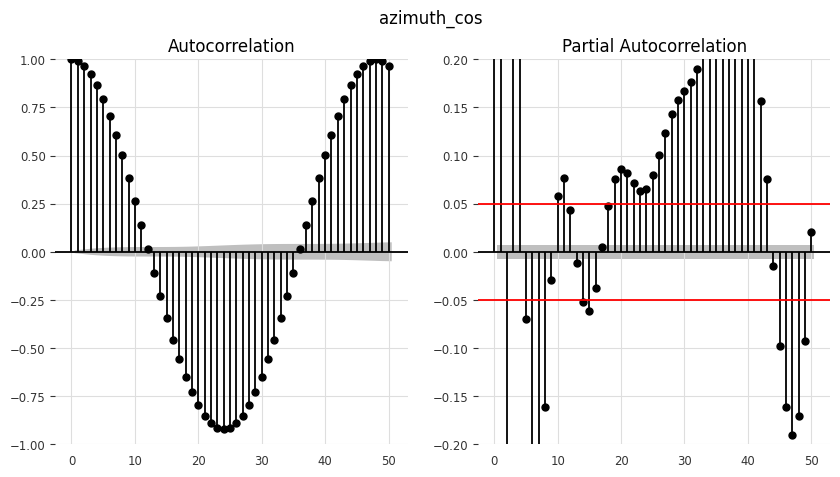

In [ ]:
n = int(365.2425 * 48) * 12
max_lag = 50
pc_feats = ['y_des', 'dew.point_des', 'humidity', 'pressure',
            'irradiance', 'za_rad', 'azimuth_cos']
pacf_lim = 0.05
alpha = 0.001

for pc_feat in pc_feats:
  fig, ax = plt.subplots(1, 2, figsize=(10, 5))
  sm.graphics.tsa.plot_acf(train_df[pc_feat].head(n),  alpha=alpha, lags=max_lag, ax=ax[0])
  sm.graphics.tsa.plot_pacf(train_df[pc_feat].head(n), alpha=alpha, lags=max_lag, ax=ax[1])
  plt.axhline(y=pacf_lim,  color='r', linestyle='-')
  plt.axhline(y=-pacf_lim, color='r', linestyle='-')
  ax[1].set_ylim((-0.2, 0.2))
  plt.suptitle(pc_feat)
  plt.show()

...

---

Get feature-specific lags based on pacf

...

In [ ]:
def get_feature_specific_lags(data, feat, threshold = 0.05, nlags = 50):
  pacf_ = pacf(data[feat])
  pacf_ = np.abs(pacf_)

  pacf_indices = np.where(pacf_ >= threshold)[0][1:]

  return pacf_indices


pc_feats = ['y_des', 'dew.point_des', 'humidity', 'pressure',
            'irradiance', 'za_rad', 'azimuth_cos']
thresholds = {'y_des': 0.05, 'dew.point_des': 0.15, 'humidity': 0.15,
              'pressure': 0.15, 'irradiance': 0.2, 'za_rad': 0.2,
              'azimuth_cos': 0.2,}

for pc_feat in pc_feats:
  lags_ = get_feature_specific_lags(train_df, pc_feat, thresholds[pc_feat])
  print(pc_feat, '\t', lags_)

y_des 	 [ 1  2  3  4  5 49]
dew.point_des 	 [1 2]
humidity 	 [1 2]
pressure 	 [1]
irradiance 	 [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48
 49 50 51 52 53]
za_rad 	 [ 1  2  3  4  5 34 36 37 38 39 40 41 42 43 49]
azimuth_cos 	 [ 1  2  3  4  6  7 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50
 51 52 53]


...

---

Plot longer term autocorrelations

Compare base and deseasonalised features

...

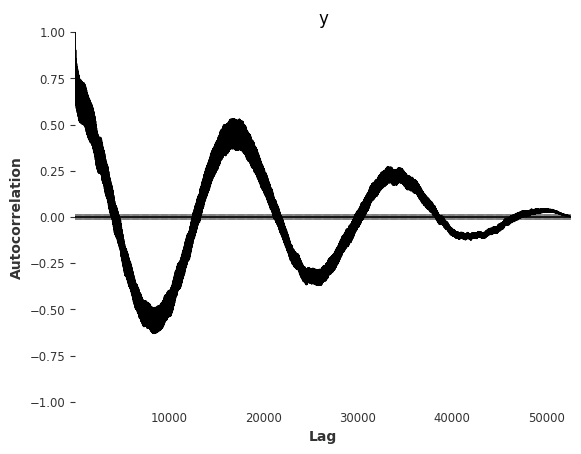

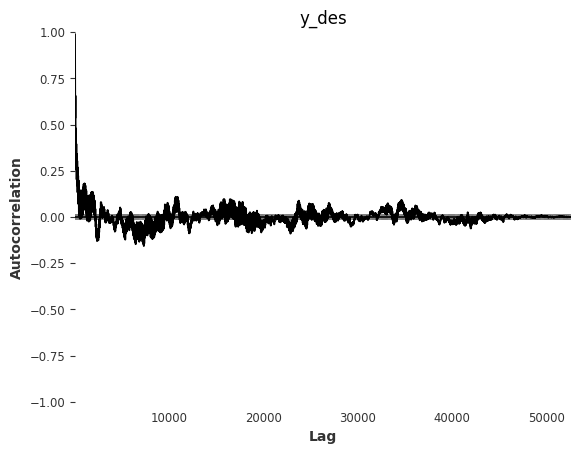

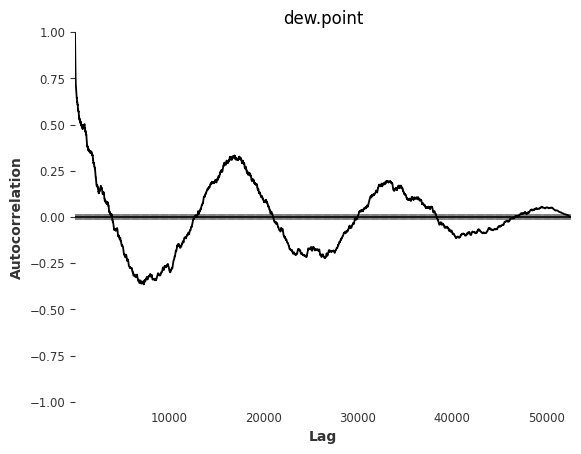

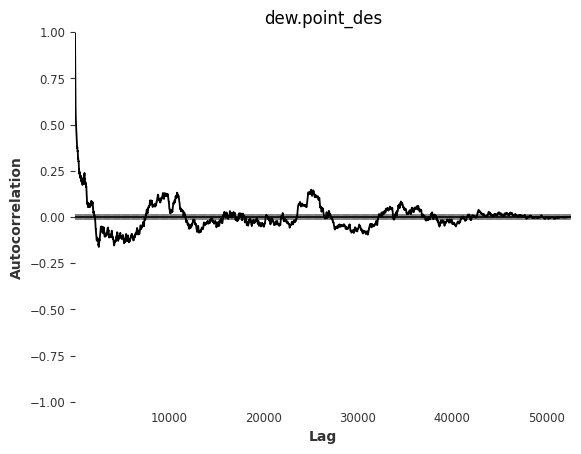

In [ ]:
plot_long_term_acf(train_df, 'y')
plot_long_term_acf(train_df, 'y_des')
plot_long_term_acf(train_df, 'dew.point')
plot_long_term_acf(train_df, 'dew.point_des')

...

---

#### Permutation importance experiments

...

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.inspection import permutation_importance


def get_pi_data(train_df, valid_df, pi_cols, pred_step, lags, y_col=Y_COL):
  train = train_df[pi_cols + [y_col]].dropna()
  valid = valid_df[pi_cols + [y_col]].dropna()

  # Add lagged features
  train.assign(**{
    f'{col}_lag_{lag}': train[col].shift(lag)
    for lag in lags
    for col in pi_cols
  })
  valid.assign(**{
    f'{col}_lag_{lag}': valid[col].shift(lag)
    for lag in lags
    for col in pi_cols
  })

  train = train.dropna()
  valid = valid.dropna()

  y_train = train[y_col].shift(-pred_step).dropna()
  X_train = train.tail(y_train.shape[0])
  # X_train = train[pi_cols + [y_col]].tail(y_train.shape[0])

  y_val = valid[y_col].shift(-pred_step).dropna()
  X_val = valid.tail(y_val.shape[0])
  # X_val = valid[pi_cols + [y_col]].tail(y_val.shape[0])

  return X_train, y_train, X_val, y_val


def print_permuation_importances(model, train, X_val, y_val):
  scoring = ['r2', 'neg_mean_absolute_error', 'neg_root_mean_squared_error']
  r_multi = permutation_importance(model, X_val, y_val,
                                 n_repeats=30, random_state=0, scoring=scoring)

  for metric in r_multi:
    print(f"\n{metric}")
    r = r_multi[metric]
    for i in r.importances_mean.argsort()[::-1]:
      if r.importances_mean[i] - 2 * r.importances_std[i] > 0:
        print(f"    {train.columns[i]:<8}"
              f"\t{r.importances_mean[i]:.3f}"
              f" +/- {r.importances_std[i]:.3f}")


pred_step = 48
pi_cols = ['dew.point_des', 'humidity', 'pressure', 'irradiance',
          #'wind.speed.mean.sqrt.x', 'wind.speed.mean.sqrt.y',
          #'dT_dH', 'dT_dP', 'dT_dTdp', 'y_des_shadow'
          ]

for pred_step in range(44, 48):
  X_train, y_train, X_val, y_val = get_pi_data(train_df, valid_df, pi_cols, pred_step)

  model = Ridge(alpha=1e-4).fit(X_train, y_train)
  r2s = round(model.score(X_val, y_val), 6)
  print('\n\n', pred_step, r2s)

  print_permuation_importances(model, X_train, X_val, y_val)



 44 0.429598

r2
    y_des   	0.900 +/- 0.010
    humidity	0.033 +/- 0.001
    irradiance	0.017 +/- 0.001

neg_mean_absolute_error
    y_des   	1.366 +/- 0.012
    humidity	0.071 +/- 0.003
    irradiance	0.030 +/- 0.003

neg_root_mean_squared_error
    y_des   	1.656 +/- 0.015
    humidity	0.078 +/- 0.003
    irradiance	0.040 +/- 0.003


 45 0.431159

r2
    y_des   	0.915 +/- 0.011
    humidity	0.029 +/- 0.001
    irradiance	0.015 +/- 0.001

neg_mean_absolute_error
    y_des   	1.384 +/- 0.014
    humidity	0.063 +/- 0.003
    irradiance	0.026 +/- 0.003

neg_root_mean_squared_error
    y_des   	1.679 +/- 0.016
    humidity	0.070 +/- 0.003
    irradiance	0.036 +/- 0.003


 46 0.430698

r2
    y_des   	0.915 +/- 0.011
    humidity	0.025 +/- 0.001
    irradiance	0.012 +/- 0.001

neg_mean_absolute_error
    y_des   	1.385 +/- 0.014
    humidity	0.055 +/- 0.002
    irradiance	0.020 +/- 0.002

neg_root_mean_squared_error
    y_des   	1.678 +/- 0.017
    humidity	0.060 +/- 0.002
    irradia

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import cross_validate
from sklearn.model_selection import TimeSeriesSplit


tscv = TimeSeriesSplit(n_splits = int(48 * 365.2425),  # X_train.shape[0]-1,
                       max_train_size = 4,
                       test_size = 1,
                       gap = 48,
                      )
#for i, (train_index, test_index) in enumerate(tscv.split(X_train)):
#  print(f"Fold {i}:")
#  print(f"  Train: index={train_index}")
#  print(f"  Test:  index={test_index}")
#stop()

pi_cols = [Y_COL, 'dew.point_des', 'humidity', 'pressure', 'irradiance',
          #'wind.speed.mean.sqrt.x', 'wind.speed.mean.sqrt.y',
          #'dT_dH', 'dT_dP', 'dT_dTdp',
          #'y_des_shadow',
          ]
train = train_df[pi_cols + [Y_COL]].dropna()
valid = valid_df[pi_cols + [Y_COL]].dropna()


def evaluate(model, X, y, cv):
  scoring = ['neg_mean_absolute_error', 'neg_root_mean_squared_error']
  cv_results = cross_validate(model, X, y, cv = cv, scoring = scoring)

  mae  = -cv_results['test_neg_mean_absolute_error']
  rmse = -cv_results['test_neg_root_mean_squared_error']
  print('mae:', mae)
  print('rmse:', rmse)

  print(f'Mean Absolute Error:     {mae.mean():.3f} +/- {mae.std():.3f}\n'
        f'Root Mean Squared Error: {rmse.mean():.3f} +/- {rmse.std():.3f}'
  )


ridge_model = Ridge(alpha=1e-2)
evaluate(ridge_model, train[pi_cols], train[Y_COL], cv=tscv)


# X_train, y_train = train[pi_cols], train[Y_COL]
# X_val,   y_val   = valid[pi_cols], valid[Y_COL]
# model = Ridge(alpha=1e-2).fit(X_train, y_train)
# model.score(X_val, y_val)

mae: [0.18479883 0.1258476  0.07404511 ... 0.08994229 0.0516331  0.08858395]
rmse: [0.18479883 0.1258476  0.07404511 ... 0.08994229 0.0516331  0.08858395]
Mean Absolute Error:     1.257 +/- 1.658
Root Mean Squared Error: 1.257 +/- 1.658



yyy

The prophet seasonal decompositions take quite a while to run.
The decomposition for `pressure` is questionable and the `wind.speed.mean` decomposition is unusable.

**TODO** Avoid time spent building prophet models. Save and commit prophet decompositions (`f_all` above).  Then simply download from repo, merge with train, valid, test data and calculate deseasonalised features.

---

#### Plot and check prophet components

The yearly components have `_yearly` appended to feature names.  Similarly, `_daily` is used for daily components and `_des` (for deseasonalised) is used for residuals.

I used flat trends for simplicity and tweaked the transformation, seasonality mode, daily harmonics and yearly harmonics.

The final decomposition parameters:

|  Feature   |       Mode     | Transform | Daily | Yearly |
|------------|----------------|-----------|-------|--------|
| y          | Additive       | None      |   3   |   3    |
| dew.point  | Additive       | None      |   3   |   3    |
| humidity   | Multiplicative | log       |   2   |  Auto  |
| pressure   | Multiplicative | log       |   2   |   2    |

The mode and transforms agree with [work elsewhere](https://www.researchgate.net/figure/Time-series-decomposition-A-Sea-surface-temperature-C-additive-decomposition_fig2_332292752).

I tried log, square root and Box-Cox transformations and tried to keep the daily and yearly harmonics reasonably low.

Using a flat trend may not be appropriate for humidity.

The daily seasonalities for `dew.point` and `pressure` each have two peaks.
There is some [supporting evidence for two daily peaks for atmospheric pressure](https://www.sciencedaily.com/releases/2008/12/081203092437.htm), but I'm not aware of any similar evidence for dew point.

The `pressure` decomposition would benefit from further attention.  The daily and yearly components are hundreths of a percent!

The `wind.speed.mean` and `irradiance` decompositions were unacceptible.
It should be possible to find daily and yearly decompositions for `irradiance` without any noise component.  An additive loess decomposition may be worth trying.  The wind speed may require more sophisticated decomposition techniques like [wavelets](https://en.wikipedia.org/wiki/Wavelet) for example.  Others have successfully used [multiplicative decomposition with smoothed wind speed data](https://files.core.ac.uk/pdf/2612/81865532.pdf).

We now have a richer set of features for lightgbm to choose from.  Also, we can model the deseasonalised temperatures, `y_des`, instead of the more complicated multi-seasonal temperatures `y`.  To make forecasts for `y`, `y_yearly` and `y_daily` must be added to the `y_des` predictions.


---

Finally, plot the historic values for the original and decomposed residual features:

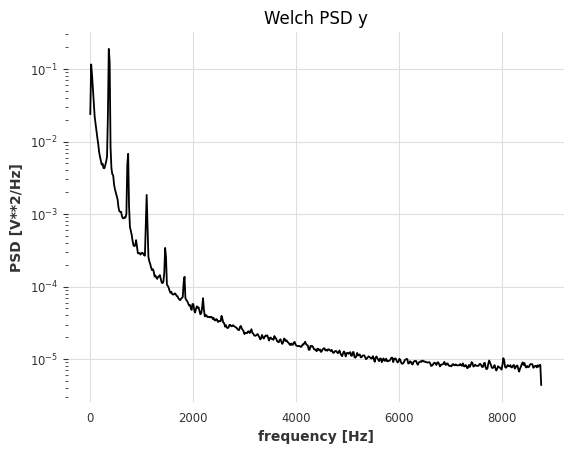

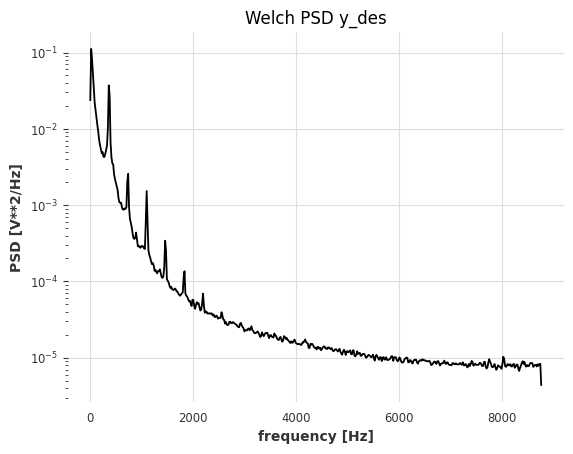

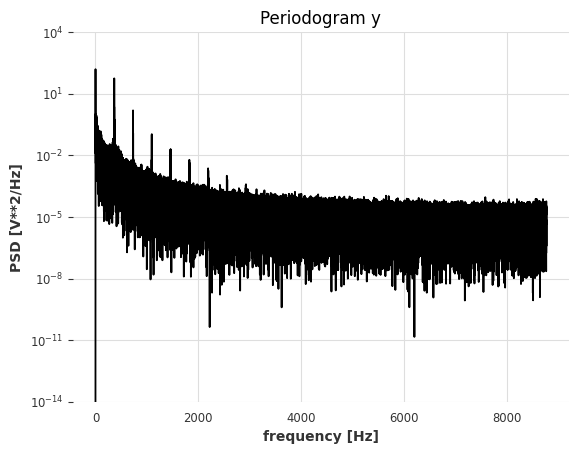

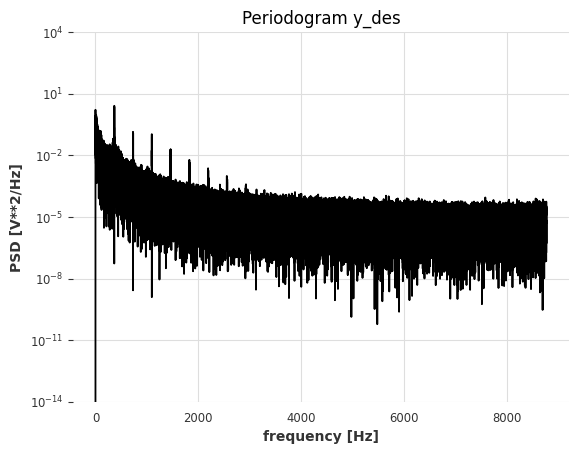

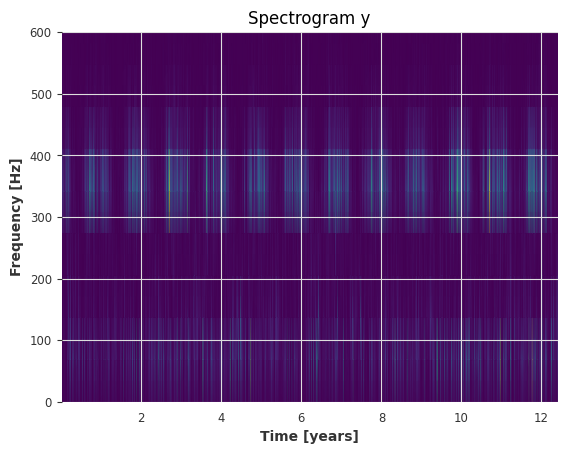

...

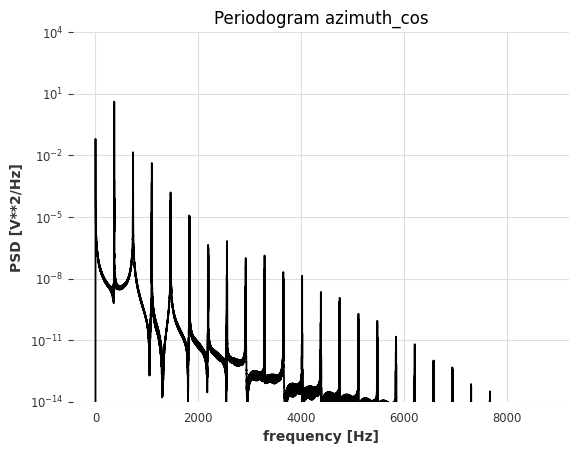

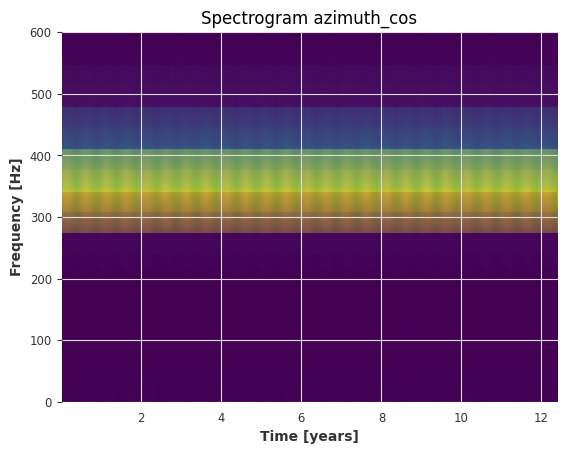

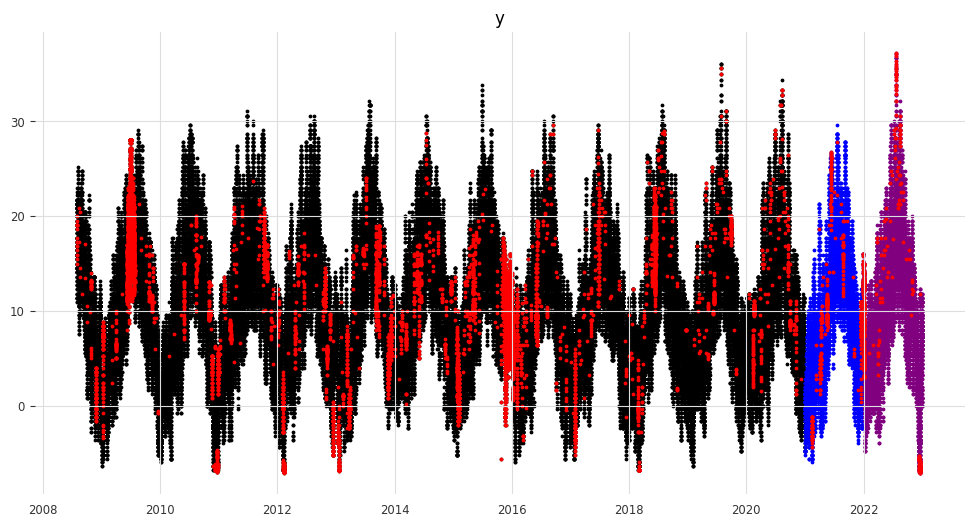

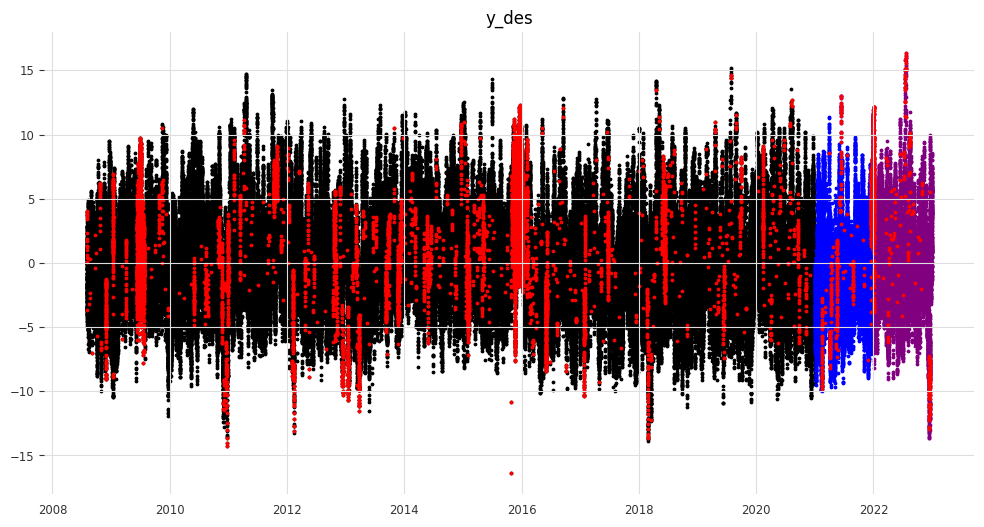

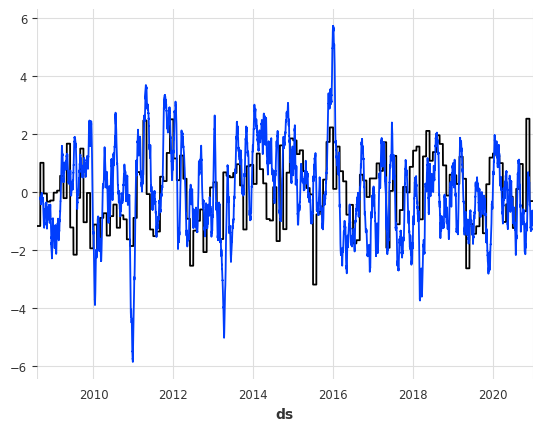

y y_des 0.5533888962624417


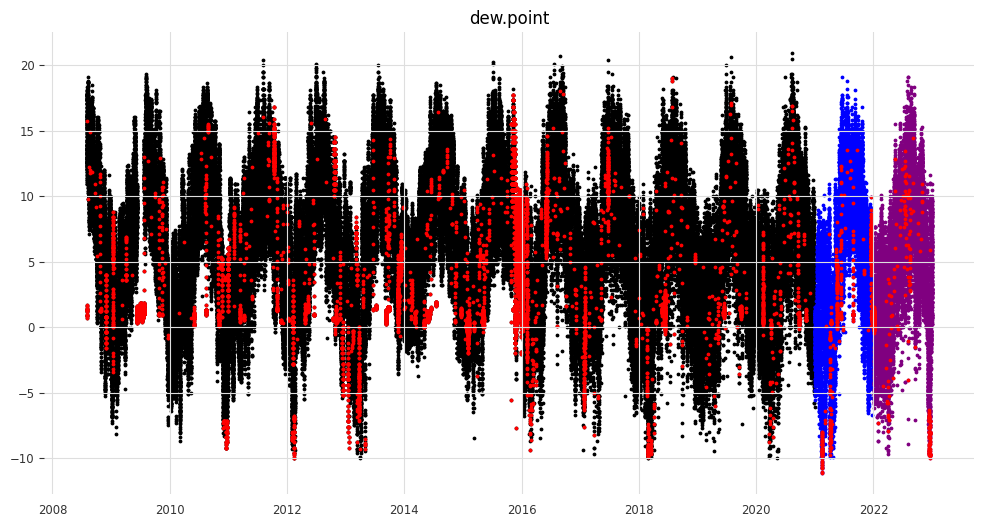

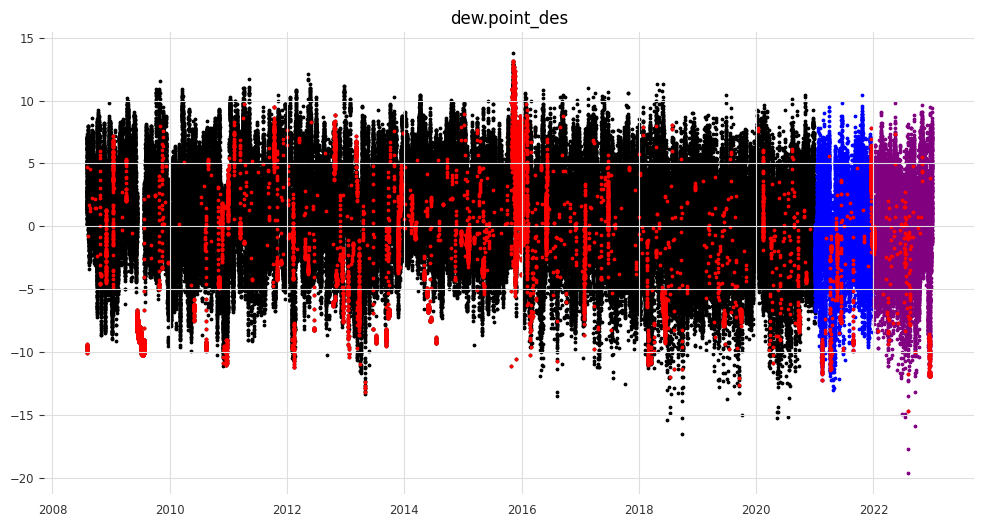

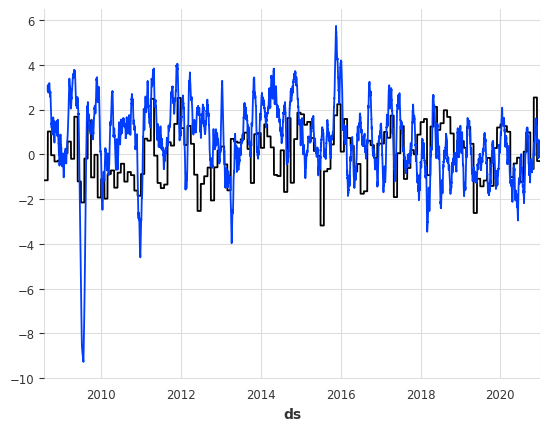

dew.point dew.point_des 0.7025201824834594


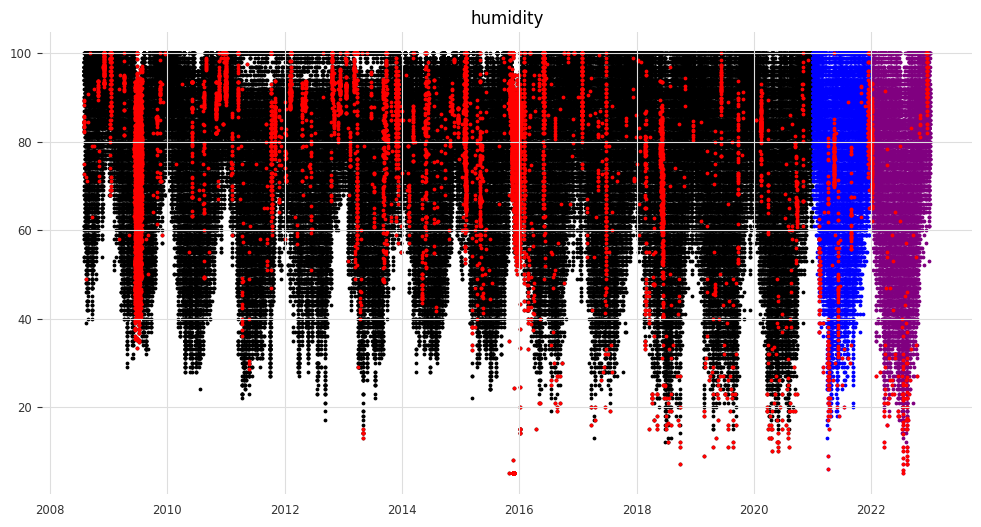

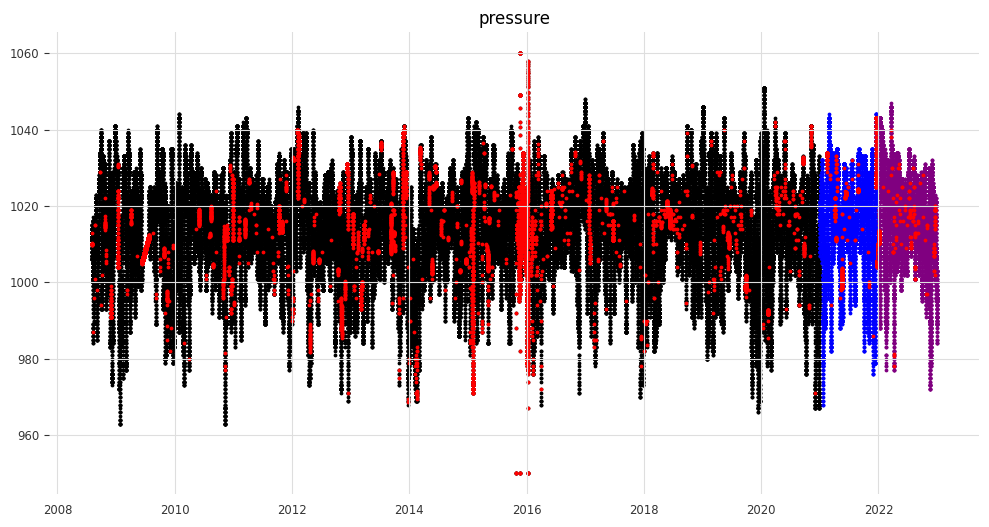

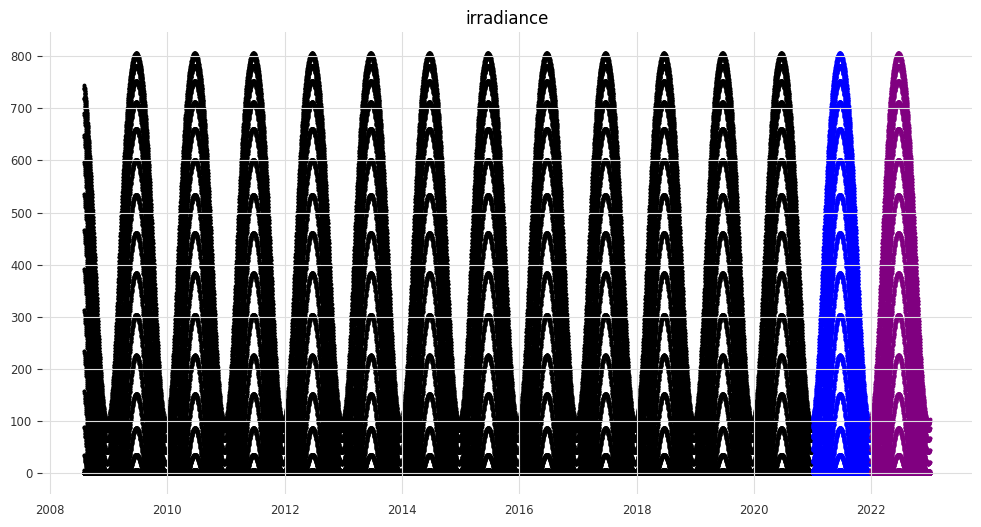

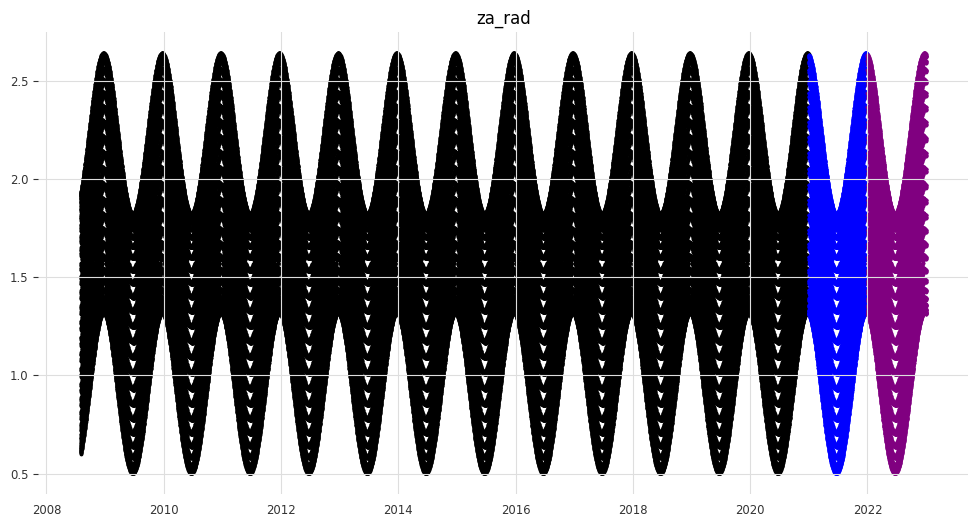

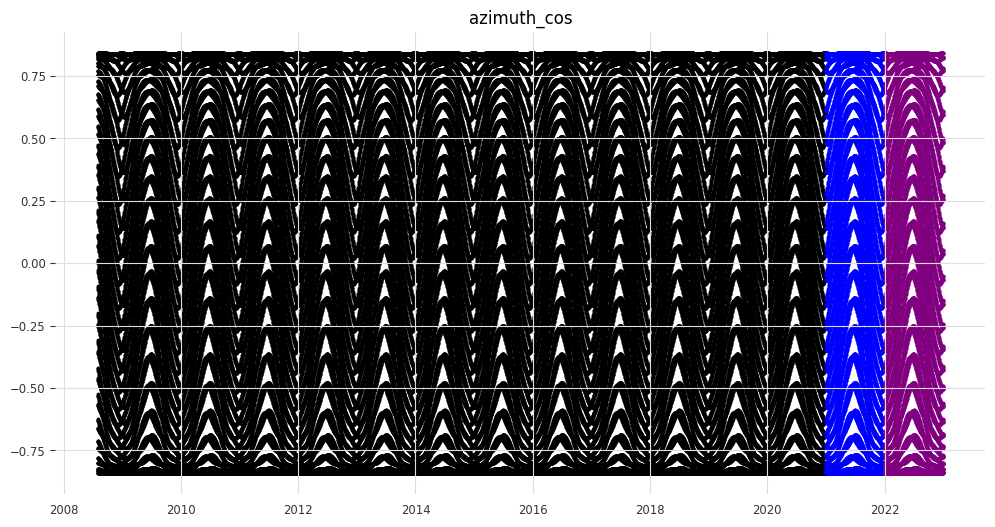

In [ ]:
from scipy.signal import periodogram, spectrogram, welch


def plot_periodogram(data, var, fs = int(48 * 365.2425)):
  '''Compute and plot a power spectral density using a periodogram.

  From https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.periodogram.html
  '''

  f, Pxx_den = periodogram(data[var], fs)

  # fig, ax = plt.subplots()
  # ax.plot(f, Pxx_den, color='r')
  # ax.grid(color='k', alpha=0.3, linestyle=':')
  plt.semilogy(f, Pxx_den)
  plt.ylim([1e-14, 1e4])
  plt.xlabel('frequency [Hz]')
  plt.ylabel('PSD [V**2/Hz]')
  plt.title('Periodogram ' + var)
  plt.show()


def plot_spectrogram(data, var, fs = int(48 * 365.2425)):
  '''Compute and plot a spectrogram with consecutive Fourier transforms.

  From https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.spectrogram.html
  '''

  f, t, Sxx = spectrogram(data[var], fs)

  plt.pcolormesh(t, f, Sxx, shading='gouraud')
  plt.ylim(0, 600)
  plt.ylabel('Frequency [Hz]')
  plt.xlabel('Time [years]')
  plt.title('Spectrogram ' + var)
  plt.show()


def plot_welch_psd(data, var, fs = int(48 * 365.2425)):
  '''Compute and plot the power spectral density using Welch’s method.

  From https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.welch.html
  '''

  f, Pxx_den = welch(data[var], fs, nperseg=1024)

  plt.semilogy(f, Pxx_den)
  # plt.ylim([0.5e-3, 1])
  plt.xlabel('frequency [Hz]')
  plt.ylabel('PSD [V**2/Hz]')
  plt.title('Welch PSD ' + var)
  plt.show()


vars = ['y', 'dew.point', 'humidity', 'pressure',
        'irradiance', 'za_rad', 'azimuth_cos',
       ]

for var in vars:
  var_des = var + '_des'
  plot_welch_psd(train_df, var)
  if var in ['y', 'dew.point']:
    plot_welch_psd(train_df, var_des)
  plot_periodogram(train_df, var)
  if var in ['y', 'dew.point']:
    plot_periodogram(train_df, var_des)
  plot_spectrogram(train_df, var)
  if var in ['y', 'dew.point']:
    plot_spectrogram(train_df, var_des)
    # print(var, var_des, round(train_df[var].corr(train_df[var_des]), 3))


# stop()


for var in vars:
  var_des = var + '_des'
  if var in ['irradiance', 'za_rad', 'azimuth_cos']:
    plot_feature_history(train_df, valid_df, test_df, var)
  else:
    plot_feature_history(train_df, valid_df, test_df, var, missing=True)

  if var in ['y', 'dew.point']:
    plot_feature_history(train_df, valid_df, test_df, var_des, missing=True)

    win = int(48 * 30.5)
    train_df['nao'].plot()
    train_df.loc[:, var_des].rolling(window=win).mean().plot()
    plt.show()
    print(var, var_des, train_df[var].corr(train_df[var_des]))

nao - y_des 0.3568982681282083
nao - dew.point_des 0.20869936088276
nao_daily - y_des 0.24460301948882077
nao_daily - dew.point_des 0.14725950429016094


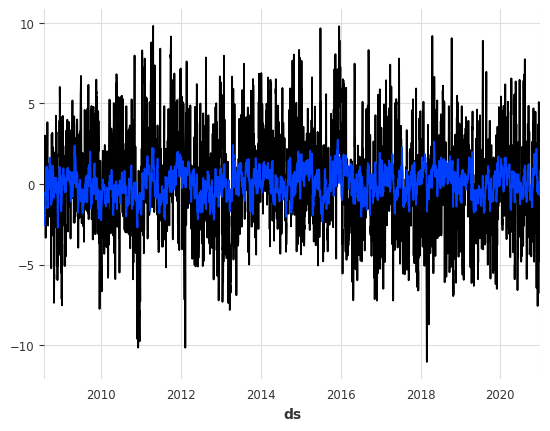

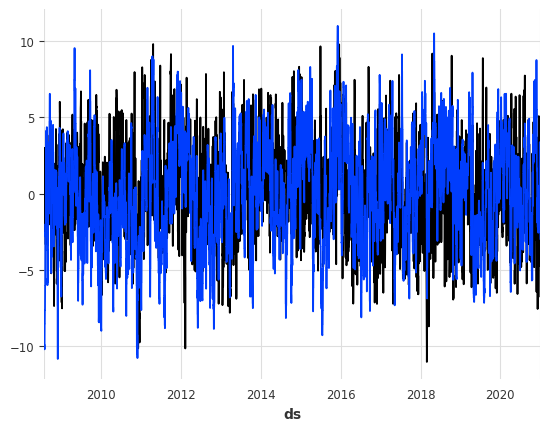

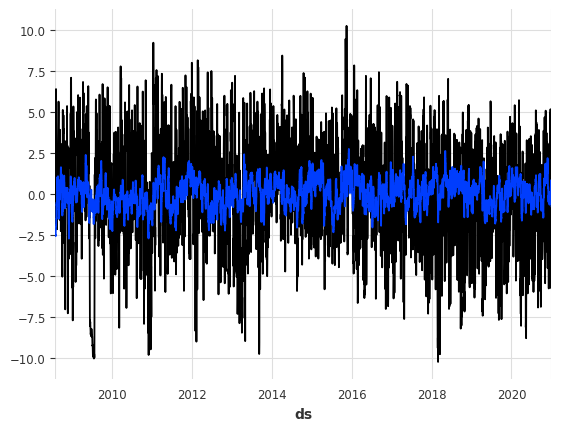

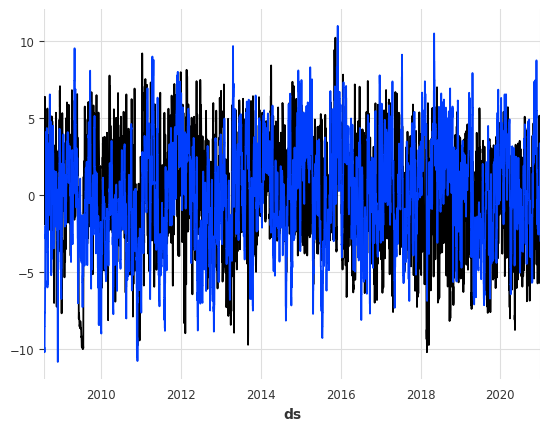

In [ ]:
#win = int(48 * 30.5)
#train_df['y_des_ma'] = train_df['y_des'].rolling(win).mean()
#train_df['dew.point_des_ma'] = train_df['dew.point_des'].rolling(win).mean()
#display(train_df['y_des_ma'].corr(train_df['nao']))
#display(train_df['dew.point_des_ma'].corr(train_df['nao']))

y_des_mon_mean  = train_df['y_des'].groupby(pd.Grouper(freq='M')).mean()
dp_des_mon_mean = train_df['dew.point_des'].groupby(pd.Grouper(freq='M')).mean()

y_des_day_mean  = train_df['y_des'].groupby(pd.Grouper(freq='D')).mean()
dp_des_day_mean = train_df['dew.point_des'].groupby(pd.Grouper(freq='D')).mean()

print('nao - y_des',         train_df['nao'].corr(y_des_mon_mean))
print('nao - dew.point_des', train_df['nao'].corr(dp_des_mon_mean))

print('nao_daily - y_des',         train_df['nao_daily'].corr(y_des_day_mean))
print('nao_daily - dew.point_des', train_df['nao_daily'].corr(dp_des_day_mean))

y_des_day_mean.plot()
train_df['nao_daily'].plot()
plt.show()

# y_des_day_mean.plot()
# foo = train_df['nao_daily'] * 4
# foo.plot()
# plt.show()

dp_des_day_mean.plot()
train_df['nao_daily'].plot()
plt.show()

# dp_des_day_mean.plot()
# foo.plot()
# plt.show()

A visual comparison of the original and residual features indicates:
  * unfortunately `missing` label is not feature specific
  * possible longer than annual signal in `y_des`
  * possible annual signal remaining in `dew.point_des`
  * increasing heteroscadicity in `humidity` and `humidity_des`
  * decreasing trend in `humidity` and `humidity_des`
  * possible annual signal remaining in `humidity_des`
  * `pressure` and `pressure_des` appear similar
  * possible annual signal remaining in `pressure_des`

---

#### Unobserved components model

The unobserved components model (UCM) is an alternative to prophet decomposition.  It produces trend, cyclic, seasonal and residual terms which can be stochastic or deterministic.  The cyclic component of the unobserved components model can model the relatively long annual seasonality (48 * 365.2425 = 17,532 steps) using harmonic terms.

 * [statsmodels - unobserved components](https://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.structural.UnobservedComponents.html)
 * [statsmodels - Detrending, Stylized Facts and the Business Cycle](https://www.statsmodels.org/devel/examples/notebooks/generated/statespace_structural_harvey_jaeger.html)
 * [Daniel Toth - Multi seasonal time series analysis: decomposition and forecasting with Python](https://medium.com/analytics-vidhya/multi-seasonal-time-series-analysis-decomposition-and-forecasting-with-python-609409570007)


 Here, I run a few experiments using UCM for decomposition.

In [ ]:
def get_uc_model(data, params, y_col='y'):
  ucm = sm.tsa.UnobservedComponents(data[y_col], #.dropna().values,
                                    **params)
  res_f = ucm.fit(method='powell', disp=False)

  return res_f


def check_uc_model(ucmodel, valid_data):
  print(ucmodel.summary())

  ucmodel.plot_components(figsize=(12, 12))
  plt.show()

  ucmodel.plot_diagnostics(figsize=(12, 12), lags=96)
  plt.show()

  # model forecast
  steps_ = len(valid_data) #int(48 * 365.2425)
  test_df = valid_data[['y']].interpolate(method='linear')  #.head(steps_)
  forecast_ucm = ucmodel.forecast(steps=steps_, exog=test_df)

  # calculating mean absolute error and root mean squared error for out-of-sample prediction for model evaluation
  RMSE_ucm = np.sqrt(np.mean([(test_df.iloc[x, 0] - forecast_ucm[x]) ** 2 for x in range(len(test_df))]))
  MAE_ucm  = np.mean([np.abs(test_df.iloc[x, 0] - forecast_ucm[x]) for x in range(len(test_df))])

  print(f"\nOut-of-sample mean absolute error (MAE): {'%.2f' % MAE_ucm}")
  print(f"Out-of-sample root mean squared error (RMSE): {'%.2f' % RMSE_ucm}")

                          Unobserved Components Results                           
Dep. Variable:                          y   No. Observations:               217728
Model:                deterministic trend   Log Likelihood             -589643.423
                   + freq_seasonal(48(1))   AIC                        1179290.846
                                  + cycle   BIC                        1179311.428
Date:                    Sat, 14 Oct 2023   HQIC                       1179296.882
Time:                            17:39:35                                         
Sample:                        08-01-2008                                         
                             - 12-31-2020                                         
Covariance Type:                      opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/structural.py:1738: RuntimeWarning: invalid value encountered in sqrt
  std_errors = np.sqrt(component_bunch['%s_cov' % which])


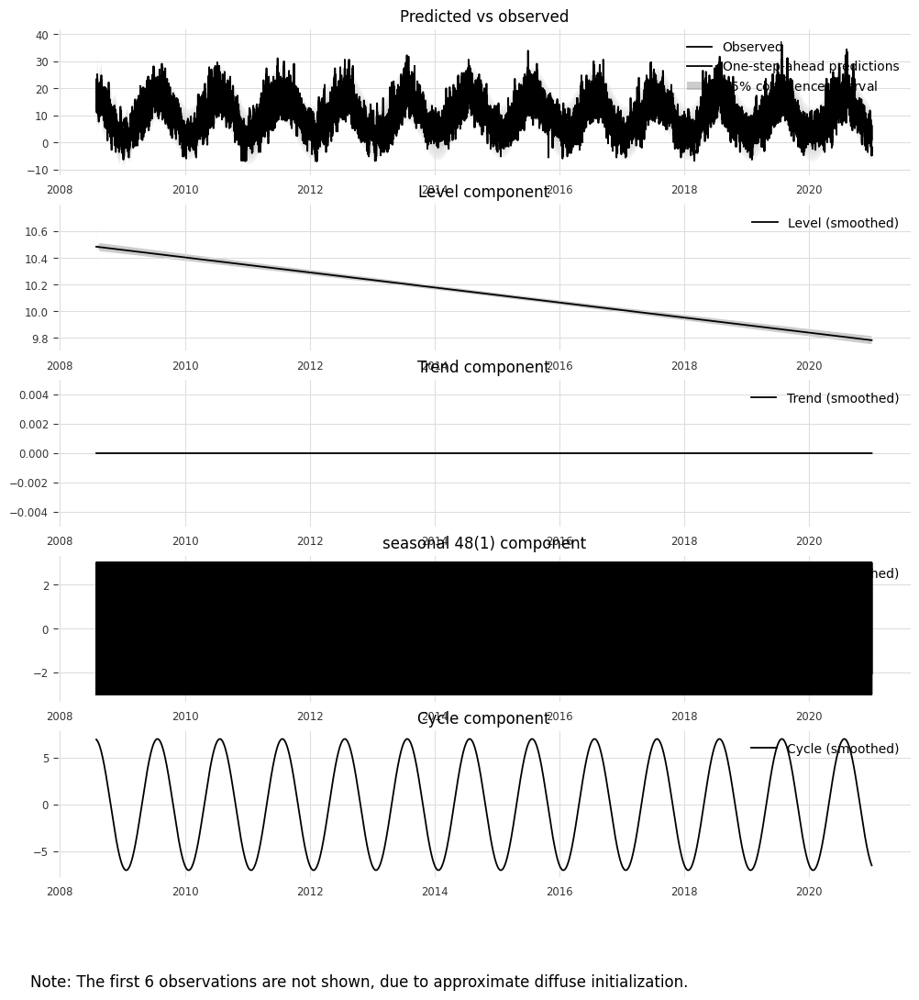

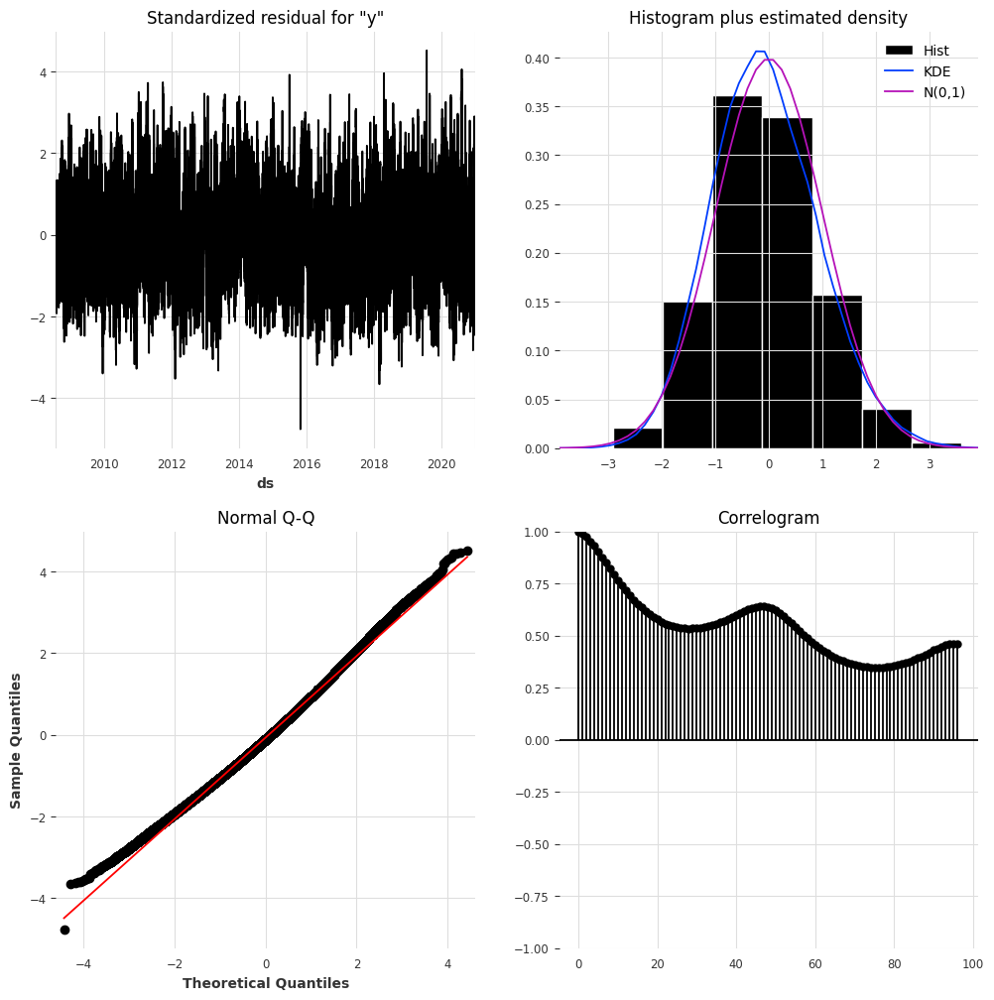


Out-of-sample mean absolute error (MAE): 2.99
Out-of-sample root mean squared error (RMSE): 3.73


In [ ]:
uc_params = {# exog  = df[['humidity','dew.point','pressure','wind.speed.mean.x','wind.speed.mean.y']].dropna(),
             #'exog': train_df[['humidity','dew.point','irradiance']].interpolate(method='slinear'),
             #exog = data[['dew.point']].interpolate(method='linear'),
             # level = 'deterministic constant',
             'level': 'deterministic trend',
             'cycle': True,
             # irregular = True,
             #'autoregressive': 1,
             'cycle_period_bounds': (17531, 17533),
             'stochastic_freq_seasonal': [False],
             'freq_seasonal': [{'period':    48,
                                'harmonics':  1}]}

res_f = get_uc_model(train_df, uc_params)
check_uc_model(res_f, valid_df)

                          Unobserved Components Results                           
Dep. Variable:                  dew.point   No. Observations:               217692
Model:                deterministic trend   Log Likelihood             -568981.330
                   + freq_seasonal(48(2))   AIC                        1137966.660
                                  + cycle   BIC                        1137987.242
Date:                    Thu, 03 Aug 2023   HQIC                       1137972.696
Time:                            21:23:36                                         
Sample:                        08-01-2008                                         
                             - 12-31-2020                                         
Covariance Type:                      opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/structural.py:1738: RuntimeWarning: invalid value encountered in sqrt
  std_errors = np.sqrt(component_bunch['%s_cov' % which])


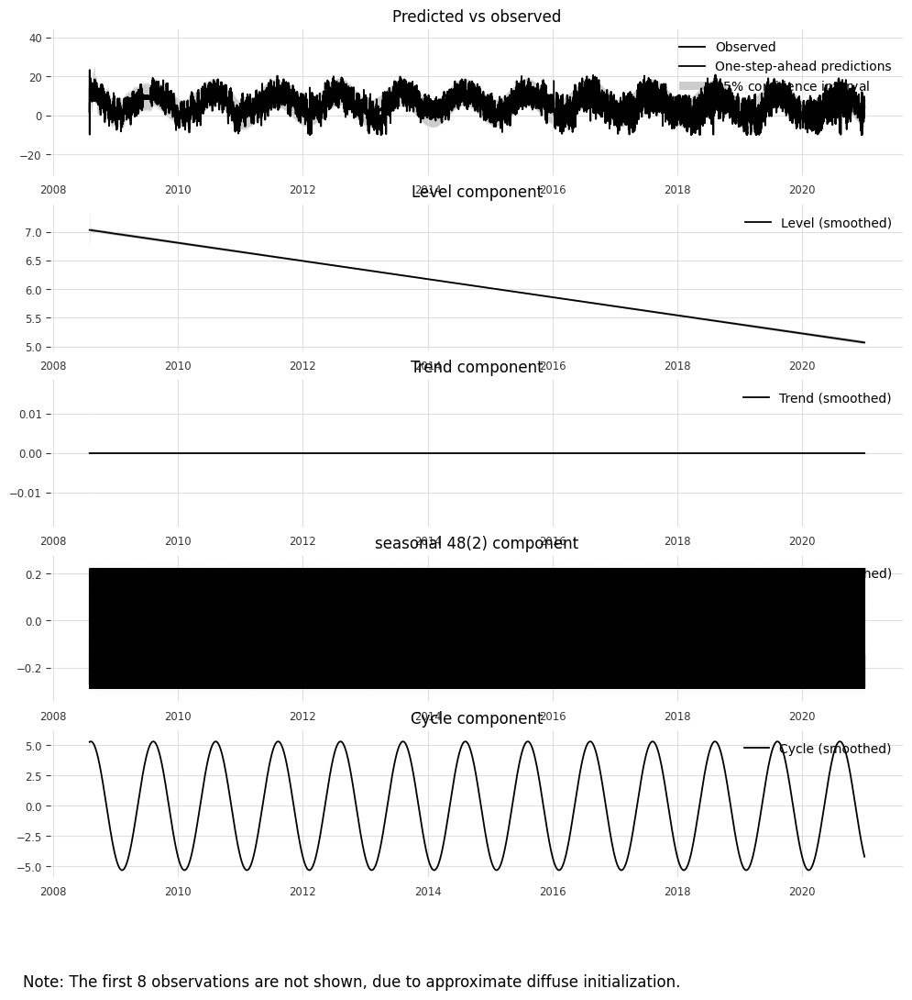

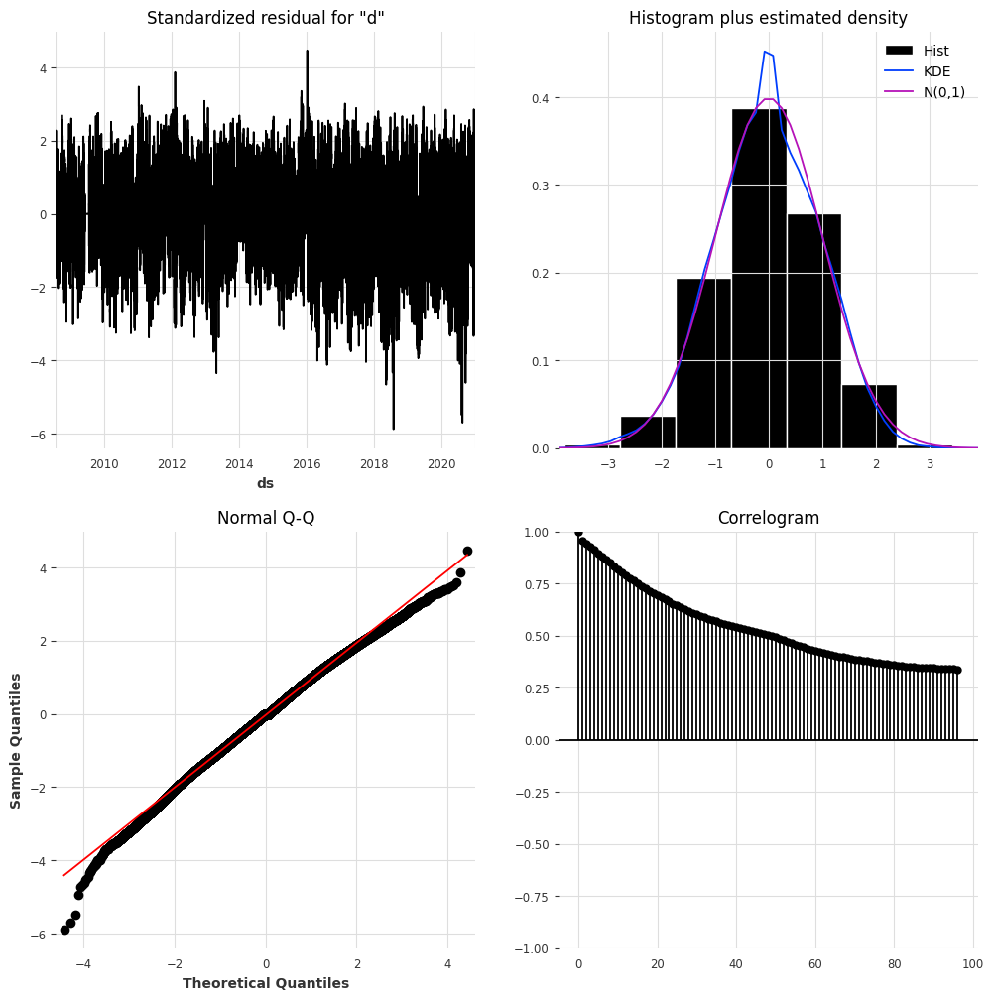


Out-of-sample mean absolute error (MAE): 5.46
Out-of-sample root mean squared error (RMSE): 6.87


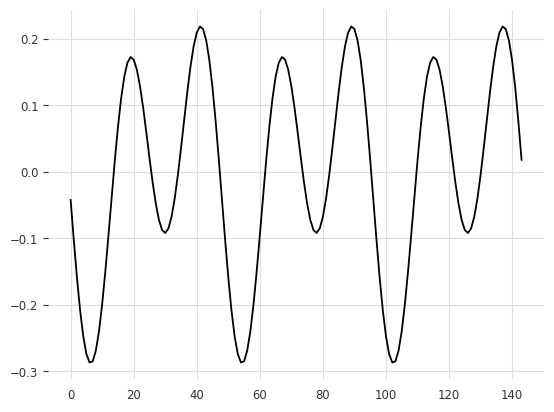

In [ ]:
uc_params = {# exog  = df[['humidity','dew.point','pressure','wind.speed.mean.x','wind.speed.mean.y']].dropna(),
             # exog = train_df[['humidity','dew.point']].interpolate(method='slinear'),
             # 'exog': train_df[['dew.point_des']].interpolate(method='linear'),
             # level = 'deterministic constant',
             'level': 'deterministic trend',
             'cycle': True,
             # irregular = True,
             # 'autoregressive': 1,
             'cycle_period_bounds': (17531, 17533),
             'stochastic_freq_seasonal': [False],
             'freq_seasonal': [{'period':    48,
                                'harmonics':  2}]}

res_f = get_uc_model(train_df, uc_params, 'dew.point')
check_uc_model(res_f, valid_df)

plt.plot(res_f.freq_seasonal[0]['smoothed'][:144])
plt.show()

                          Unobserved Components Results                           
Dep. Variable:                   humidity   No. Observations:               217692
Model:                deterministic trend   Log Likelihood             -843011.483
                   + freq_seasonal(48(1))   AIC                        1686026.967
                                  + cycle   BIC                        1686047.548
Date:                    Thu, 03 Aug 2023   HQIC                       1686033.002
Time:                            21:20:34                                         
Sample:                        08-01-2008                                         
                             - 12-31-2020                                         
Covariance Type:                      opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/structural.py:1738: RuntimeWarning: invalid value encountered in sqrt
  std_errors = np.sqrt(component_bunch['%s_cov' % which])


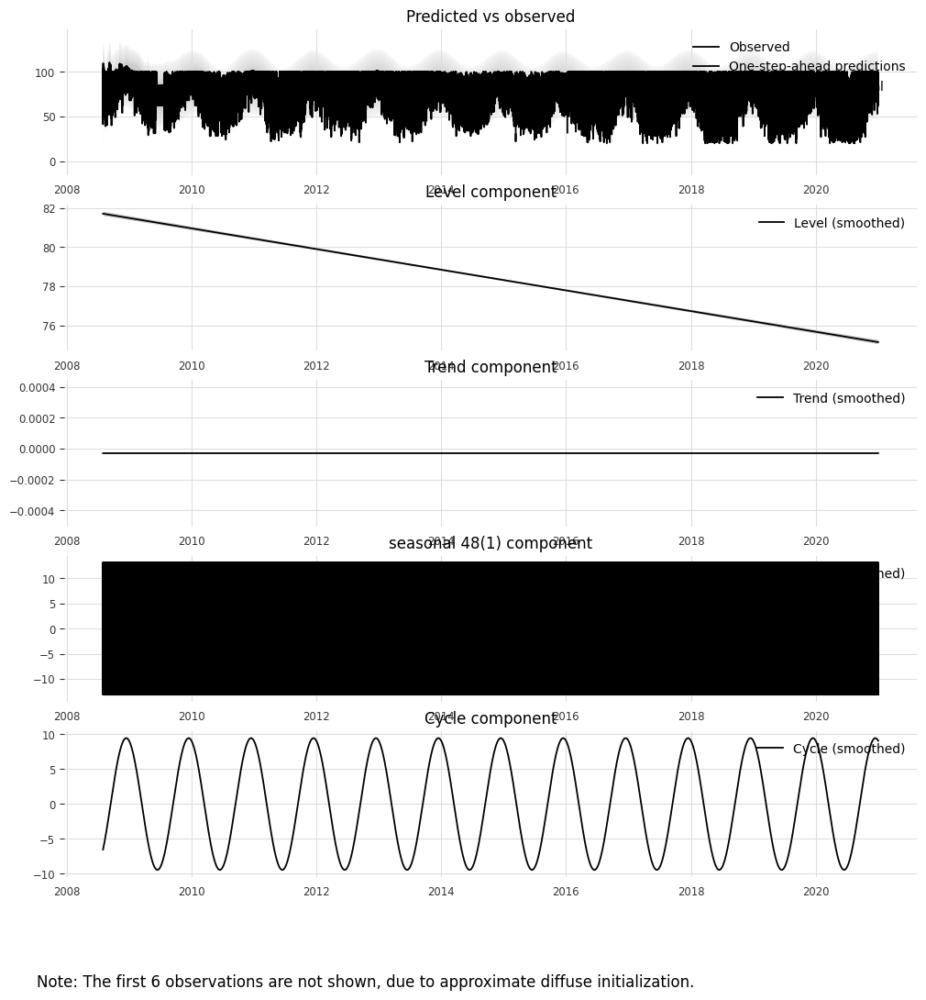

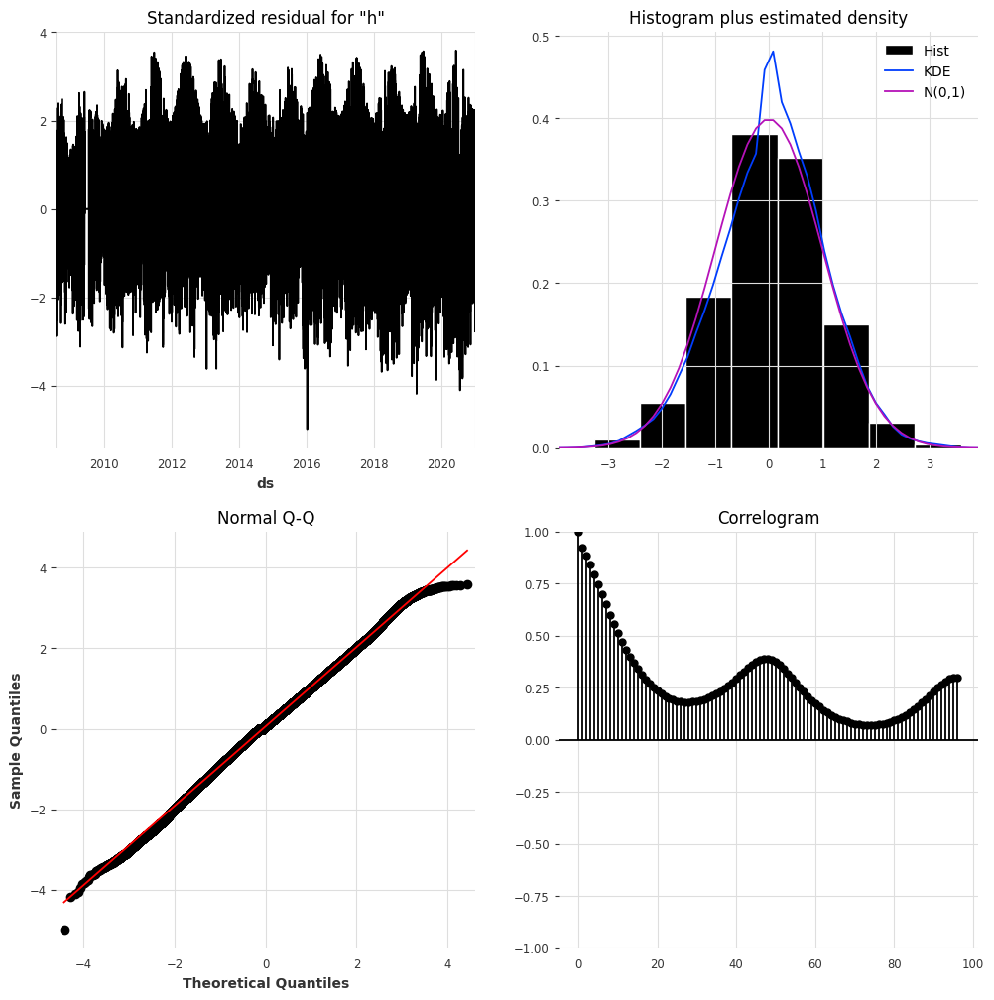


Out-of-sample mean absolute error (MAE): 65.04
Out-of-sample root mean squared error (RMSE): 66.85


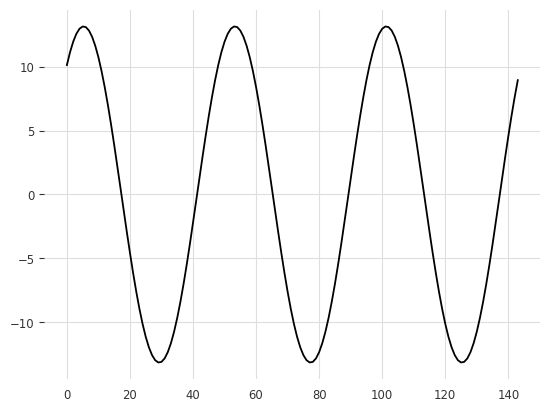

In [ ]:
uc_params = {# exog  = df[['humidity','dew.point','pressure','wind.speed.mean.x','wind.speed.mean.y']].dropna(),
             # exog = train_df[['humidity','dew.point']].interpolate(method='slinear'),
             # 'exog': train_df[['dew.point_des']].interpolate(method='linear'),
             # level = 'deterministic constant',
             'level': 'deterministic trend',
             'cycle': True,
             # irregular = True,
             # 'autoregressive': 1,
             'cycle_period_bounds': (17531, 17533),
             'stochastic_freq_seasonal': [False],
             'freq_seasonal': [{'period':    48,
                                'harmonics':  1}]}

res_f = get_uc_model(train_df, uc_params, 'humidity')
check_uc_model(res_f, valid_df)

plt.plot(res_f.freq_seasonal[0]['smoothed'][:144])
plt.show()

<ipython-input-15-f5983affcb97>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_press_df['log_pressure'] = np.log(train_press_df['pressure'])


                          Unobserved Components Results                           
Dep. Variable:                   pressure   No. Observations:                87648
Model:                deterministic trend   Log Likelihood             -338229.536
                   + freq_seasonal(48(2))   AIC                         676463.072
                                  + cycle   BIC                         676481.834
Date:                    Tue, 10 Oct 2023   HQIC                        676468.800
Time:                            20:33:37                                         
Sample:                        01-01-2010                                         
                             - 12-31-2014                                         
Covariance Type:                      opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/statespace/structural.py:1738: RuntimeWarning: invalid value encountered in sqrt
  std_errors = np.sqrt(component_bunch['%s_cov' % which])


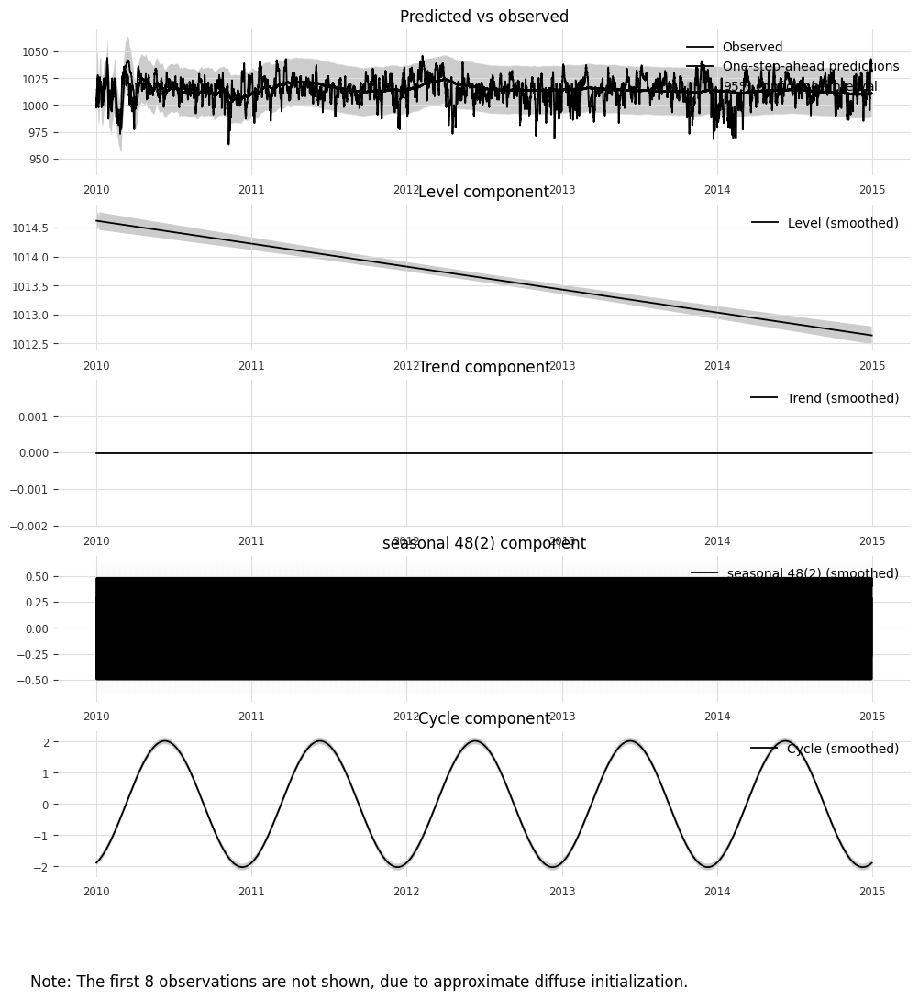

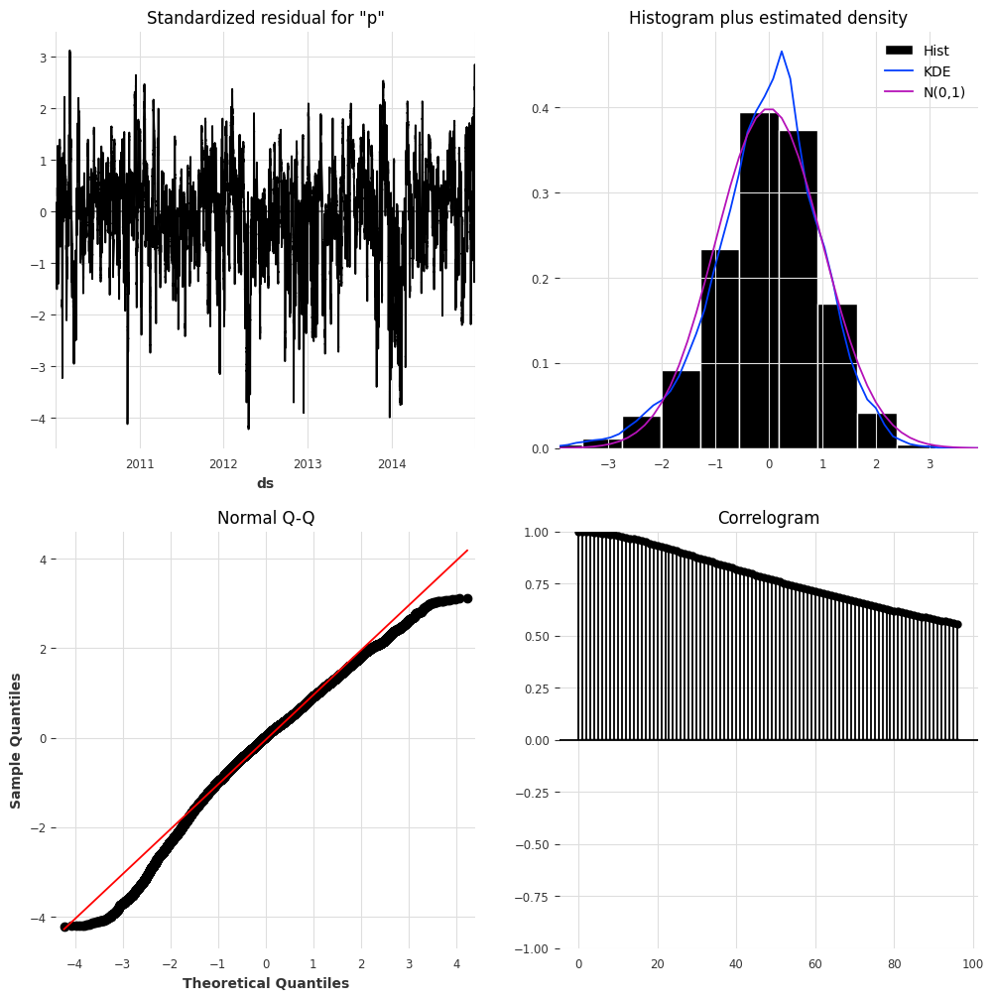


Out-of-sample mean absolute error (MAE): 1003.16
Out-of-sample root mean squared error (RMSE): 1003.18


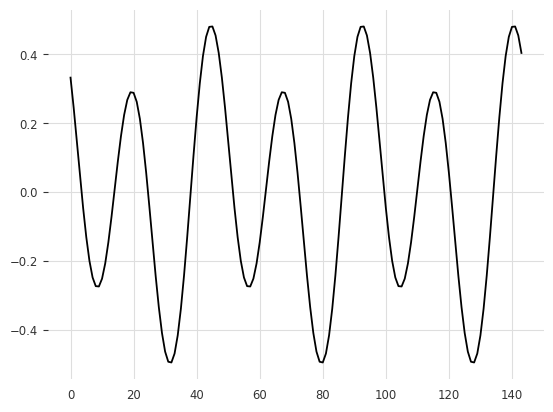

In [ ]:
uc_params = {# exog  = df[['humidity','dew.point','pressure','wind.speed.mean.x','wind.speed.mean.y']].dropna(),
             # exog = train_df[['humidity','dew.point']].interpolate(method='slinear'),
             # 'exog': train_df[['dew.point_des']].interpolate(method='linear'),
             # level = 'deterministic constant',
             'level': 'deterministic trend',
             #'level': 'smooth trend',
             #'level': 'local linear trend',
             'cycle': True,
             # irregular = True,
             # 'autoregressive': 1,
             'cycle_period_bounds': (17531, 17533),
             'stochastic_freq_seasonal': [False],
             'freq_seasonal': [{'period':    48,
                                'harmonics':  2}]}

train_press_df = train_df[(train_df.index.year >= 2010) & (train_df.index.year < 2015)]
train_press_df['log_pressure'] = np.log(train_press_df['pressure'])
res_f = get_uc_model(train_press_df, uc_params, 'pressure')
check_uc_model(res_f, valid_df)

plt.plot(res_f.freq_seasonal[0]['smoothed'][:144])
plt.show()



The UCM for temperature may be worthwhile considering as an advanced baseline if additional regressors (`exog` parameter) are included.

---

### Feature Engineering

Feature engineering, or feature extraction, transforms raw data into features for forecasting.  It includes the following packages and approaches:

 * catch22
 * tsfeatures
 * bivariate
   * numpy
   * scipy
   * statsmodels
   * distances
   * kernels
   * dynamic time warping?
 * multi-variate?


#### catch22

[catch22](https://github.com/DynamicsAndNeuralSystems/catch22) is a collection of 22 time-series features which were selected based on their *classification* performance across a collection of 93 real-world time-series classification problems.

 * [pycatch22](https://github.com/DynamicsAndNeuralSystems/pycatch22)
 * [short feature descriptions](https://github.com/DynamicsAndNeuralSystems/catch22/wiki/Feature-Descriptions)
 * [detailed descriptions with visual depictions of the behavior of features](https://feature-based-time-series-analys.gitbook.io/catch22-features/)

The `get_feature_selection_scores` function calculates [F-statistic tests](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.f_regression.html), [Pearson correlation](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.r_regression.html) and [mutual information](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.mutual_info_regression.html#sklearn.feature_selection.mutual_info_regression) between the calculated features and the target variable.
These tests assume a linear model.  This is not optimal.
Don't draw any hasty conclusions from these scores.

Lags considered:
 * [6, 12, 24, 48, 96]

Features considered:
 * `y_des`
 * `dew.point_des`
 * `humidity`

`pressure` has some long sequences of single values which produce many NAs. A better deseasonalised `pressure` feature would be worthwhile trying.

catch22 installation is straight-forward:

In [ ]:
!pip install pycatch22

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 kB 1.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pycatch22: filename=pycatch22-0.4.4-cp310-cp310-linux_x86_64.whl size=113403 sha256=c07d840e6e5c1f257b8299a9fcb690d91d6bf06dbdb93bee57aeef8a6fc13427
  Stored in directory: /root/.cache/pip/wheels/10/67/84/cdce1a956aa218fd5ce5b5fa6773219f42780b1fac77889c57
Successfully built pycatch22


In [ ]:
from google.colab import files
from pycatch22 import catch22_all, DN_HistogramMode_5, DN_HistogramMode_10, \
                      CO_f1ecac, CO_FirstMin_ac, CO_HistogramAMI_even_2_5, \
                      CO_trev_1_num, MD_hrv_classic_pnn40, \
                      SB_BinaryStats_mean_longstretch1, \
                      SB_TransitionMatrix_3ac_sumdiagcov, \
                      PD_PeriodicityWang_th0_01, \
                      CO_Embed2_Dist_tau_d_expfit_meandiff, \
                      IN_AutoMutualInfoStats_40_gaussian_fmmi, \
                      FC_LocalSimple_mean1_tauresrat, \
                      DN_OutlierInclude_p_001_mdrmd, \
                      DN_OutlierInclude_n_001_mdrmd, \
                      SP_Summaries_welch_rect_area_5_1, \
                      SB_BinaryStats_diff_longstretch0, \
                      SB_MotifThree_quantile_hh, \
                      SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1, \
                      SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1, \
                      SP_Summaries_welch_rect_centroid, \
                      FC_LocalSimple_mean3_stderr


def c22_call(ser, func):
  '''The pd.Series.to_list() call is necessary.
     Otherwise rol.apply(how) may work.
     Also, np.ndarray.tolist() is necessary.
     Otherwise c22 returns null exception.
     Or, maybe rol.apply(lambda shenanigans with AGGS array)'''
  # return func(data.loc[ser.index, feat_col].to_list())
  return func(ser.tolist())


def get_rolling_catch22_features(data, feat_cols, windows, AGGS, verbose=False):
  '''Probably can't add norm and scale options due to compute time issues'''

  aggs_l = []

  for feat_col in feat_cols:
    print(feat_col)
    for window in windows:
      print('\t', window)

      if feat_col == 'humidity':
        continue
      elif window == 24 and feat_col == 'pressure':
        continue

      rol = data[feat_col].shift(1).rolling(window=window, min_periods=1,)

      for how in AGGS:
        start_time = timeit.default_timer()
        if verbose:
          print('\t\t', how.__name__, end='')

        c22args = {'func': how}

        agg_ = rol.apply(c22_call, kwargs=c22args, raw=True)
        agg = agg_.copy()
        agg = agg.rename(f'{feat_col}_window_{window}_{how.__name__}')
        aggs_l.append(agg)

        if verbose:
          print('\t', round(timeit.default_timer() - start_time, 2))

  aggs = pd.concat(aggs_l, axis=1)
  aggs = drop_problem_cols(aggs, window)
  aggs = drop_cols_correlated_with_feat_cols(aggs, data[feat_cols])

  return aggs


# feat_cols = [Y_COL]
# windows = [48]
#
# many problems with humidity and train_df - do not use humidity feature
windows = [6, 12, 24, 48, 96]
feat_cols = [Y_COL, 'dew.point_des', 'pressure']
c22_aggs = [DN_HistogramMode_5, DN_HistogramMode_10, CO_f1ecac, \
            CO_FirstMin_ac, CO_HistogramAMI_even_2_5, \
            CO_trev_1_num, MD_hrv_classic_pnn40, \
            SB_BinaryStats_mean_longstretch1, \
            SB_TransitionMatrix_3ac_sumdiagcov, PD_PeriodicityWang_th0_01, \
            CO_Embed2_Dist_tau_d_expfit_meandiff, \
            IN_AutoMutualInfoStats_40_gaussian_fmmi, \
            FC_LocalSimple_mean1_tauresrat, DN_OutlierInclude_p_001_mdrmd, \
            DN_OutlierInclude_n_001_mdrmd, SP_Summaries_welch_rect_area_5_1, \
            SB_BinaryStats_diff_longstretch0, SB_MotifThree_quantile_hh, \
            SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1, \
            SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1, \
            SP_Summaries_welch_rect_centroid, FC_LocalSimple_mean3_stderr]
params_c22 = {'windows':    windows,
              'feat_cols':  feat_cols,
              'aggs':       c22_aggs,
              'agg_func':   get_rolling_catch22_features,
              'verbose':    True,
              'dataset':    'valid',
              'regenerate': True,
              'feat_name':  'catch22_',
              'date_str':   '.2022.09.20',
             }

train_df_c22, valid_df_c22, test_df_c22 = get_features(train_df,
                                                       valid_df,
                                                       test_df,
                                                       params_c22)


##############################################################################
# 17m for all 22 catch22 functions on valid_df, test_df & train_df
# 238 features added - approx. 10,000 NAs
#
# windows = [6, 12, 24, 48, 96]
# feat_cols = [Y_COL, 'dew.point_des', 'pressure']
# c22_aggs = [DN_HistogramMode_5, DN_HistogramMode_10, CO_f1ecac, \
#             CO_FirstMin_ac, CO_HistogramAMI_even_2_5, \
#             CO_trev_1_num, MD_hrv_classic_pnn40, \
#             SB_BinaryStats_mean_longstretch1, \
#             SB_TransitionMatrix_3ac_sumdiagcov, PD_PeriodicityWang_th0_01, \
#             CO_Embed2_Dist_tau_d_expfit_meandiff, \
#             IN_AutoMutualInfoStats_40_gaussian_fmmi, \
#             FC_LocalSimple_mean1_tauresrat, DN_OutlierInclude_p_001_mdrmd, \
#             DN_OutlierInclude_n_001_mdrmd, SP_Summaries_welch_rect_area_5_1, \
#             SB_BinaryStats_diff_longstretch0, SB_MotifThree_quantile_hh, \
#             SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1, \
#             SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1, \
#             SP_Summaries_welch_rect_centroid, FC_LocalSimple_mean3_stderr]
# params = {'windows':    windows,
#           'feat_cols':  feat_cols,
#           'aggs':       c22_aggs,
#           'agg_func':   get_rolling_catch22_features,
#           'verbose':    True,
#           'dataset':    'valid',
#           'regenerate': True,
#           'feat_name':  'catch22_',
#           'date_str':   '.2022.09.20', }

dataset: valid
y_des
	 6
		 DN_HistogramMode_5	 0.02
		 DN_HistogramMode_10	 0.02
		 CO_f1ecac	 0.05
		 CO_FirstMin_ac	 0.04
		 CO_HistogramAMI_even_2_5	 0.03
		 CO_trev_1_num	 0.02
		 MD_hrv_classic_pnn40	 0.02
		 SB_BinaryStats_mean_longstretch1	 0.02
		 SB_TransitionMatrix_3ac_sumdiagcov	 0.05
		 PD_PeriodicityWang_th0_01	 0.08
		 CO_Embed2_Dist_tau_d_expfit_meandiff	 0.05
		 IN_AutoMutualInfoStats_40_gaussian_fmmi	 0.02
		 FC_LocalSimple_mean1_tauresrat	 0.07
		 DN_OutlierInclude_p_001_mdrmd	 0.22
		 DN_OutlierInclude_n_001_mdrmd	 0.23
		 SP_Summaries_welch_rect_area_5_1	 0.03
		 SB_BinaryStats_diff_longstretch0	 0.02
		 SB_MotifThree_quantile_hh	 0.05
		 SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1	 0.04
		 SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1	 0.04
		 SP_Summaries_welch_rect_centroid	 0.03
		 FC_LocalSimple_mean3_stderr	 0.02
	 12
		 DN_HistogramMode_5	 0.02
		 DN_HistogramMode_10	 0.02
		 CO_f1ecac	 0.08
		 CO_FirstMin_ac	 0.08
		 CO_HistogramAMI_even_2_5	 0.04
		 CO_trev_1_num

y_des_window_6_DN_HistogramMode_5                                  6
y_des_window_6_DN_HistogramMode_10                                 6
y_des_window_6_CO_f1ecac                                           1
y_des_window_6_CO_FirstMin_ac                                      1
y_des_window_6_CO_HistogramAMI_even_2_5                            6
                                                                  ..
pressure_window_96_SB_BinaryStats_diff_longstretch0               96
pressure_window_96_SB_MotifThree_quantile_hh                      96
pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1    96
pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1         96
pressure_window_96_FC_LocalSimple_mean3_stderr                    96
Length: 273, dtype: int64

before: (17520, 101)
after:  (17520, 342)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,pressure_window_96_IN_AutoMutualInfoStats_40_gaussian_fmmi,pressure_window_96_FC_LocalSimple_mean1_tauresrat,pressure_window_96_DN_OutlierInclude_p_001_mdrmd,pressure_window_96_DN_OutlierInclude_n_001_mdrmd,pressure_window_96_SB_BinaryStats_diff_longstretch0,pressure_window_96_SB_MotifThree_quantile_hh,pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1,pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1,pressure_window_96_FC_LocalSimple_mean3_stderr
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,6.701169,21.0,0.083333,0.770833,-0.739583,1.0,1.192184,0.742857,0.800000,0.018153
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,6.694799,22.0,0.083333,0.770833,-0.739583,1.0,1.192184,0.342857,0.657143,0.018173
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,6.687961,23.0,0.083333,0.760417,-0.739583,1.0,1.192184,0.257143,0.742857,0.018192


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,pressure_window_96_IN_AutoMutualInfoStats_40_gaussian_fmmi,pressure_window_96_FC_LocalSimple_mean1_tauresrat,pressure_window_96_DN_OutlierInclude_p_001_mdrmd,pressure_window_96_DN_OutlierInclude_n_001_mdrmd,pressure_window_96_SB_BinaryStats_diff_longstretch0,pressure_window_96_SB_MotifThree_quantile_hh,pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1,pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1,pressure_window_96_FC_LocalSimple_mean3_stderr
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000
mean,9.281890,77.230799,4.846913,1015.876169,6.923438,1.504128,3.407074,188.993795,-1.135328e+00,-8.490206e-01,...,1.902405,21.261938,0.122527,0.027798,-0.009647,2.855372,1.280915,0.724067,0.642819,0.218272
std,6.502144,17.352865,5.696639,11.912355,0.011765,1.069925,3.632411,92.104902,3.718511e+00,2.994325e+00,...,1.280721,10.564567,0.241659,0.631038,0.657057,2.133515,0.144785,0.169244,0.148174,0.131636
min,-6.000000,6.000000,-11.164754,968.000000,6.875232,0.000000,0.000000,0.000000,-2.030000e+01,-1.670000e+01,...,0.169735,1.000000,0.021739,-0.968750,-0.968750,1.000000,0.409459,0.171429,0.171429,0.017555
25%,4.400000,67.000000,0.500000,1008.000000,6.915723,0.547723,0.300000,135.000000,-2.474874e+00,-2.192031e+00,...,0.928739,13.000000,0.029412,-0.625000,-0.687500,2.000000,1.198935,0.742857,0.600000,0.126996
50%,9.200000,81.000000,5.042608,1017.000000,6.924612,1.516575,2.300000,225.000000,-2.204364e-16,0.000000e+00,...,1.638105,19.000000,0.033333,0.046875,-0.031250,2.000000,1.281776,0.771429,0.600000,0.183118
75%,13.600000,90.000000,9.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,1.086381e-01,1.200154e-15,...,2.581534,29.000000,0.047619,0.677083,0.677083,3.000000,1.369512,0.828571,0.771429,0.270601
max,29.600000,100.000000,19.100000,1044.000000,6.950815,4.857983,23.600000,360.000000,1.393000e+01,1.336432e+01,...,7.561041,40.000000,1.761905,0.989583,0.989583,19.000000,1.738877,0.828571,0.828571,0.876091


dataset: test
y_des
	 6
		 DN_HistogramMode_5	 0.02
		 DN_HistogramMode_10	 0.02
		 CO_f1ecac	 0.04
		 CO_FirstMin_ac	 0.04
		 CO_HistogramAMI_even_2_5	 0.03
		 CO_trev_1_num	 0.02
		 MD_hrv_classic_pnn40	 0.02
		 SB_BinaryStats_mean_longstretch1	 0.02
		 SB_TransitionMatrix_3ac_sumdiagcov	 0.06
		 PD_PeriodicityWang_th0_01	 0.07
		 CO_Embed2_Dist_tau_d_expfit_meandiff	 0.05
		 IN_AutoMutualInfoStats_40_gaussian_fmmi	 0.02
		 FC_LocalSimple_mean1_tauresrat	 0.07
		 DN_OutlierInclude_p_001_mdrmd	 0.22
		 DN_OutlierInclude_n_001_mdrmd	 0.22
		 SP_Summaries_welch_rect_area_5_1	 0.03
		 SB_BinaryStats_diff_longstretch0	 0.02
		 SB_MotifThree_quantile_hh	 0.05
		 SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1	 0.04
		 SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1	 0.04
		 SP_Summaries_welch_rect_centroid	 0.03
		 FC_LocalSimple_mean3_stderr	 0.02
	 12
		 DN_HistogramMode_5	 0.02
		 DN_HistogramMode_10	 0.02
		 CO_f1ecac	 0.07
		 CO_FirstMin_ac	 0.08
		 CO_HistogramAMI_even_2_5	 0.04
		 CO_trev_1_num	

y_des_window_6_DN_HistogramMode_5                                  6
y_des_window_6_DN_HistogramMode_10                                 6
y_des_window_6_CO_f1ecac                                           1
y_des_window_6_CO_FirstMin_ac                                      1
y_des_window_6_CO_HistogramAMI_even_2_5                            6
                                                                  ..
pressure_window_96_SB_BinaryStats_diff_longstretch0               96
pressure_window_96_SB_MotifThree_quantile_hh                      96
pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1    96
pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1         96
pressure_window_96_FC_LocalSimple_mean3_stderr                    96
Length: 269, dtype: int64

before: (17520, 101)
after:  (17520, 339)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,pressure_window_96_IN_AutoMutualInfoStats_40_gaussian_fmmi,pressure_window_96_FC_LocalSimple_mean1_tauresrat,pressure_window_96_DN_OutlierInclude_p_001_mdrmd,pressure_window_96_DN_OutlierInclude_n_001_mdrmd,pressure_window_96_SB_BinaryStats_diff_longstretch0,pressure_window_96_SB_MotifThree_quantile_hh,pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1,pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1,pressure_window_96_FC_LocalSimple_mean3_stderr
ds,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2022-01-01 00:00:00,12.264746,77.723545,1.101641,1010.123241,6.917828,2.586705,6.691045,228.358209,-4.446008,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 00:30:00,2022-01-01 00:30:00,12.243743,77.701246,1.087427,1010.134727,6.917839,2.582230,6.667910,228.283582,-4.437123,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 01:00:00,2022-01-01 01:00:00,12.179704,77.643168,0.997640,1010.139485,6.917844,2.577746,6.644776,228.208955,-4.428185,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 01:30:00,2022-01-01 01:30:00,12.183168,77.707848,0.985036,1010.145117,6.917849,2.573255,6.621642,228.134328,-4.419194,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 02:00:00,2022-01-01 02:00:00,12.486018,78.047152,0.994765,1010.154533,6.917859,2.568756,6.598507,228.059701,-4.410151,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 21:30:00,2022-12-31 21:30:00,9.600000,80.000000,6.300000,998.000000,6.905753,3.255764,10.600000,225.000000,-7.495332,...,1.715038,13.0,0.857143,-0.833333,-0.333333,6.0,1.397056,0.828571,0.628571,0.250056
2022-12-31 22:00:00,2022-12-31 22:00:00,10.000000,88.000000,8.100000,998.000000,6.905753,2.792848,7.800000,225.000000,-5.515433,...,1.687879,12.0,0.857143,-0.843750,-0.354167,6.0,1.397056,0.828571,0.628571,0.254932
2022-12-31 22:30:00,2022-12-31 22:30:00,10.000000,80.000000,6.700000,999.000000,6.906755,2.792848,7.800000,225.000000,-5.515433,...,1.660068,12.0,0.857143,-0.854167,-0.375000,6.0,1.397056,0.828571,0.428571,0.258937


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,pressure_window_96_IN_AutoMutualInfoStats_40_gaussian_fmmi,pressure_window_96_FC_LocalSimple_mean1_tauresrat,pressure_window_96_DN_OutlierInclude_p_001_mdrmd,pressure_window_96_DN_OutlierInclude_n_001_mdrmd,pressure_window_96_SB_BinaryStats_diff_longstretch0,pressure_window_96_SB_MotifThree_quantile_hh,pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1,pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1,pressure_window_96_FC_LocalSimple_mean3_stderr
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000,17424.000000
mean,10.353362,73.017219,4.954191,1016.348593,6.923912,1.465774,3.337407,192.530252,-1.554355e+00,-7.198013e-01,...,1.922879,22.360652,0.122717,0.013376,0.011945,2.813648,1.282898,0.721306,0.643129,0.216603
std,6.910328,19.511345,4.929823,11.078868,0.010928,1.090404,3.661180,83.349452,3.540169e+00,3.012650e+00,...,1.198135,10.144594,0.247356,0.627697,0.637799,1.814884,0.144080,0.172229,0.151705,0.121903
min,-7.144690,5.000000,-10.000000,972.000000,6.879356,0.000000,0.000000,0.000000,-2.480000e+01,-2.241528e+01,...,0.201131,1.000000,0.021739,-0.968750,-0.968750,1.000000,0.174882,0.171429,0.171429,0.033509
25%,5.600000,60.000000,1.600000,1009.000000,6.916715,0.447214,0.200000,135.000000,-3.200000e+00,-1.697056e+00,...,0.935196,14.000000,0.030303,-0.635417,-0.656250,2.000000,1.211603,0.742857,0.600000,0.127552
50%,10.000000,77.000000,5.100000,1017.000000,6.924612,1.449138,2.100000,224.888060,-8.633760e-16,0.000000e+00,...,1.727743,20.000000,0.034483,0.020833,0.010417,2.000000,1.281037,0.771429,0.628571,0.183338
75%,15.000000,88.000000,8.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,0.000000e+00,1.212400e-15,...,2.613274,30.000000,0.047619,0.666667,0.677083,3.000000,1.363484,0.828571,0.771429,0.276143
max,37.200000,100.000000,19.100000,1047.000000,6.953684,5.630275,31.700000,350.000000,1.202082e+01,1.250000e+01,...,7.028398,40.000000,1.687500,0.989583,0.989583,16.000000,1.709574,0.828571,0.828571,0.873157


dataset: train
y_des
	 6
		 DN_HistogramMode_5	 0.22
		 DN_HistogramMode_10	 0.23
		 CO_f1ecac	 0.53
		 CO_FirstMin_ac	 0.53
		 CO_HistogramAMI_even_2_5	 0.37
		 CO_trev_1_num	 0.24
		 MD_hrv_classic_pnn40	 0.2
		 SB_BinaryStats_mean_longstretch1	 0.21
		 SB_TransitionMatrix_3ac_sumdiagcov	 0.67
		 PD_PeriodicityWang_th0_01	 0.88
		 CO_Embed2_Dist_tau_d_expfit_meandiff	 0.58
		 IN_AutoMutualInfoStats_40_gaussian_fmmi	 0.24
		 FC_LocalSimple_mean1_tauresrat	 0.84
		 DN_OutlierInclude_p_001_mdrmd	 2.7
		 DN_OutlierInclude_n_001_mdrmd	 2.72
		 SP_Summaries_welch_rect_area_5_1	 0.38
		 SB_BinaryStats_diff_longstretch0	 0.21
		 SB_MotifThree_quantile_hh	 0.61
		 SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1	 0.5
		 SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1	 0.5
		 SP_Summaries_welch_rect_centroid	 0.4
		 FC_LocalSimple_mean3_stderr	 0.21
	 12
		 DN_HistogramMode_5	 0.26
		 DN_HistogramMode_10	 0.26
		 CO_f1ecac	 0.91
		 CO_FirstMin_ac	 0.92
		 CO_HistogramAMI_even_2_5	 0.48
		 CO_trev_1_num	 0.3

y_des_window_6_DN_HistogramMode_5                                  6
y_des_window_6_DN_HistogramMode_10                                 6
y_des_window_6_CO_f1ecac                                           1
y_des_window_6_CO_FirstMin_ac                                      1
y_des_window_6_CO_HistogramAMI_even_2_5                            6
                                                                  ..
pressure_window_96_SB_BinaryStats_diff_longstretch0               96
pressure_window_96_SB_MotifThree_quantile_hh                      96
pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1    96
pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1         96
pressure_window_96_FC_LocalSimple_mean3_stderr                    96
Length: 275, dtype: int64

before: (217728, 101)
after:  (217728, 344)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,pressure_window_96_IN_AutoMutualInfoStats_40_gaussian_fmmi,pressure_window_96_FC_LocalSimple_mean1_tauresrat,pressure_window_96_DN_OutlierInclude_p_001_mdrmd,pressure_window_96_DN_OutlierInclude_n_001_mdrmd,pressure_window_96_SB_BinaryStats_diff_longstretch0,pressure_window_96_SB_MotifThree_quantile_hh,pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1,pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1,pressure_window_96_FC_LocalSimple_mean3_stderr
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,1.467958,23.0,0.027027,0.875000,-0.875000,2.0,1.183658,0.800000,0.714286,0.157978
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,1.454712,23.0,0.027778,0.864583,-0.822917,2.0,1.186736,0.828571,0.714286,0.156453
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,1.455243,23.0,0.028571,0.854167,-0.833333,2.0,1.189123,0.828571,0.742857,0.158742


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,pressure_window_96_IN_AutoMutualInfoStats_40_gaussian_fmmi,pressure_window_96_FC_LocalSimple_mean1_tauresrat,pressure_window_96_DN_OutlierInclude_p_001_mdrmd,pressure_window_96_DN_OutlierInclude_n_001_mdrmd,pressure_window_96_SB_BinaryStats_diff_longstretch0,pressure_window_96_SB_MotifThree_quantile_hh,pressure_window_96_SC_FluctAnal_2_rsrangefit_50_1_logi_prop_r1,pressure_window_96_SC_FluctAnal_2_dfa_50_1_2_logi_prop_r1,pressure_window_96_FC_LocalSimple_mean3_stderr
count,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,...,217632.000000,217632.000000,217632.000000,217632.000000,217632.000000,217632.000000,217632.000000,217632.000000,217632.000000,217632.000000
mean,10.156650,78.661830,5.994144,1014.171124,6.921757,1.844258,4.456375,195.205732,-1.735383e+00,-1.281071,...,1.973568,22.654614,0.133175,0.006363,0.016422,3.078150,1.277174,0.722324,0.640589,0.214594
std,6.480187,17.333778,5.109794,11.959898,0.011831,1.027176,4.017316,83.012687,4.105561e+00,3.806552,...,1.239775,10.212451,0.253351,0.622331,0.638146,2.972918,0.149373,0.174330,0.149444,0.126431
min,-7.073291,5.000000,-10.000000,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-29.200000,...,0.002606,1.000000,0.020408,-0.968750,-0.968750,1.000000,0.000000,0.171429,0.171429,0.016946
25%,5.200000,68.000000,2.100000,1007.000000,6.914731,1.095445,1.200000,135.000000,-3.889087e+00,-3.394113,...,1.014493,15.000000,0.030303,-0.625000,-0.645833,2.000000,1.205202,0.742857,0.600000,0.127026
50%,9.600000,83.000000,6.100000,1015.000000,6.922644,1.870829,3.500000,225.000000,-2.828427e-01,0.000000,...,1.727780,20.000000,0.035714,0.000000,0.031250,2.000000,1.281776,0.771429,0.600000,0.184052
75%,14.500000,92.000000,9.800000,1022.000000,6.929517,2.569047,6.600000,270.000000,1.836970e-16,0.070711,...,2.679687,30.000000,0.050000,0.645833,0.666667,3.000000,1.361066,0.828571,0.771429,0.262928
max,36.100000,100.000000,20.900000,1060.000000,6.966024,5.403702,29.200000,360.000000,2.050610e+01,22.407196,...,9.162058,40.000000,1.750000,0.989583,0.989583,94.000000,1.895619,0.828571,0.828571,1.055851


,r_test,f_test,mi
dew.point_des,0.290590,0.192751,0.034956
y_des_window_24_DN_OutlierInclude_p_001_mdrmd,0.153530,0.034420,0.008972
y_des_window_96_DN_OutlierInclude_p_001_mdrmd,0.148211,0.031775,0.011863
y_des_window_24_DN_OutlierInclude_n_001_mdrmd,-0.145903,0.030671,0.007535
y_des_window_96_CO_Embed2_Dist_tau_d_expfit_meandiff,0.144504,0.030014,0.020638
y_des_window_96_DN_OutlierInclude_n_001_mdrmd,-0.136976,0.026640,0.010952
y_des_window_12_DN_OutlierInclude_p_001_mdrmd,0.135357,0.025948,0.005889
y_des_window_12_DN_OutlierInclude_n_001_mdrmd,-0.132837,0.024894,0.006222
y_des_window_48_CO_Embed2_Dist_tau_d_expfit_meandiff,0.122531,0.020867,0.010048
dew.point_des_window_96_DN_OutlierInclude_n_001_mdrmd,-0.116010,0.018543,0.006937


df shape:  (252768, 76)
train shape:    (217728, 101)
valid shape:    (17520, 101)
test shape:     (17520, 101)
df shape:  (252768, 76)
train shape:    (217728, 345)
valid shape:    (17520, 342)
test shape:     (17520, 339)
df shape:  (252768, 76)
train shape:    (217728, 339)
valid shape:    (17520, 339)
test shape:     (17520, 339)

train_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 50.197
mean after feature redundancy:  17.135



,before,after,diff
rows,217728,217728,0
cols,101,339,238
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,12,8709,8697
rows_with_nas,1,105,104
cols_with_nas,12,250,238
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.393
mean after feature redundancy:  16.768



,before,after,diff
rows,17520,17520,0
cols,101,339,238
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,8701,8697
rows_with_nas,1,105,104
cols_with_nas,4,242,238
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



test_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.329
mean after feature redundancy:  16.728



,before,after,diff
rows,17520,17520,0
cols,101,339,238
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,8539,8535
rows_with_nas,1,96,95
cols_with_nas,4,242,238
single_value_cols,5,5,0
low_var_rows,0,0,0
low_var_cols,15,15,0


WARN: train_sanity != valid_sanity


,before,after,diff
total_nas,12,8709,8697
cols_with_nas,12,250,238
total_nas,4,8701,8697
cols_with_nas,4,242,238


WARN: train_sanity != test_sanity


,before,after,diff
total_nas,12,8709,8697
rows_with_nas,1,105,104
cols_with_nas,12,250,238
single_value_cols,4,4,0
low_var_cols,16,16,0
total_nas,4,8539,8535
rows_with_nas,1,96,95
cols_with_nas,4,242,238
single_value_cols,5,5,0
low_var_cols,15,15,0


WARN: test_sanity != valid_sanity


,before,after,diff
total_nas,4,8539,8535
rows_with_nas,1,96,95
single_value_cols,5,5,0
low_var_cols,15,15,0
total_nas,4,8701,8697
rows_with_nas,1,105,104
single_value_cols,4,4,0
low_var_cols,16,16,0


aaa

238 additional features were added in approximately 17 minutes (approx. 8,700 NAs).

---

#### tsfeatures

[Python implementation](https://github.com/Nixtla/tsfeatures) of the [R package tsfeatures](https://github.com/robjhyndman/tsfeatures) (originally by [Hyndman](https://robjhyndman.com/) and co).

List of available features:

| Features        |                 |               |
|:----------------|:----------------|:--------------|
| acf_features    | heterogeneity   | series_length |
| arch_stat       | holt_parameters | sparsity      |
| count_entropy   | hurst           | stability     |
| crossing_points | hw_parameters   | stl_features  |
| entropy         | intervals       | unitroot_kpss |
| flat_spots      | lumpiness       | unitroot_pp   |
| frequency       | nonlinearity    |               |
| guerrero        | pacf_features   |               |

[Description of features](http://pkg.robjhyndman.com/tsfeatures/articles/tsfeatures.html#list-of-features).


Features considered:
 * `y_des`
 * `dew.point_des`
 * `humidity`

`pressure` has some long sequences of single values which produce many NAs.
A better deseasonalised `pressure` feature would be worthwhile trying.

Lags considered:
 * [6, 12, 24, 48]


In [ ]:
!pip install tsfeatures

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 916.4/916.4 kB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.8/233.8 kB 20.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.6/3.6 MB 67.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.1/48.1 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.1/42.1 MB 41.3 MB/s eta 0:00:00
  Created wheel for antropy: filename=antropy-0.1.6-py3-none-any.whl size=16878 sha256=aa4bc5031f8a1e8e02030a07f7ac5e2474ce3f34d2fc757656f5c1f4f7a80532
  Stored in directory: /root/.cache/pip/wheels/98/22/06/e91d7bb213c7133d5e2eb34258623e1e19928d5f05e1ee6812
  Created wheel for supersmoother: filename=supersmoother-0.4-py3-none-any.whl size=16145 sha256=92ea261523d2247171421b5dc65ecab0180dbe3ca6fc10a53e1dfcafe4d198b7
 

In [ ]:


from google.colab import files
from tsfeatures import entropy, unitroot_kpss, unitroot_pp, stability,     \
                       sparsity, nonlinearity, lumpiness, hurst, guerrero, \
                       flat_spots, crossing_points, arch_stat, \
                       holt_parameters, acf_features, heterogeneity, \
                       hw_parameters, intervals, pacf_features, stl_features
from scipy.signal import periodogram, welch
from multiprocessing import Pool, cpu_count
from numba import jit


# NOTE: Tried using functools.partial to create 4 spectral_moment functions
#       Problems with missing __name__ attribute with partial functions :-(
#       Additionally, there are alternatives to using signal.welch -
#       FFT for one - there pros and cons should be considered
# @jit(forceobj=True)
def spectral_moment_1(y):
    f, Pxx_den = welch(y)
    sm = 0
    n = len(f)

    for i in range(0, n):
        sm += Pxx_den[i] * f[i]

    return sm


# @jit(forceobj=True)
def spectral_moment_2(y):
    sm = 0
    order = 2
    f, Pxx_den = welch(y)
    n = len(f)

    for i in range(0, n):
        sm += Pxx_den[i] * f[i] ** order

    return sm


# @jit(forceobj=True)
def spectral_moment_3(y):
    sm = 0
    order = 3
    f, Pxx_den = welch(y)
    n = len(f)

    for i in range(0, n):
        sm += Pxx_den[i] * f[i] ** order

    return sm


# @jit(forceobj=True)
def spectral_moment_4(y):
    sm = 0
    order = 4
    f, Pxx_den = welch(y)
    n = len(f)

    for i in range(0, n):
        sm += Pxx_den[i] * f[i] ** order

    return sm


# TOO SLOW - DO NOT USE!
# Use spectral_moment_{1,2,3,4} instead
# @jit(forceobj=True)
#def spectral_moments(y):
#    sm_1 = sm_2 = sm_3 = sm_4 = 0
#    f, Pxx_den = welch(y)
#    n = len(f)
#
#    for i in range(0, n):
#        sm_1 += Pxx_den[i] * f[i] ** 1
#        sm_2 += Pxx_den[i] * f[i] ** 2
#        sm_3 += Pxx_den[i] * f[i] ** 3
#        sm_4 += Pxx_den[i] * f[i] ** 4
#
#    return {'1': sm_1, '2': sm_2, '3': sm_3, '4': sm_4}


@jit
def peak2peak(y):
    return np.ptp(y)


@jit
def peak_location(y):
    return np.argmax(y)


@jit
def trough_location(y):
    return np.argmin(y)


@jit(forceobj=True)
def spectral_entropy(x, freq = 1):
    """
    Getting normalized Shannon entropy of power spectral density.
    PSD is calculated using scipy's periodogram.

    Args:
        x: The univariate time series array in the form of 1d numpy array.
        freq: int; Frequency for calculating the PSD via scipy periodogram.
              Default value is 1.

    Returns:
        Normalized Shannon entropy.
    """

    # calculate periodogram
    _, psd = periodogram(x, freq)

    # calculate shannon entropy of normalized psd
    psd_norm = psd / np.sum(psd)
    entropy = np.nansum(psd_norm * np.log2(psd_norm))

    return -(entropy / np.log2(psd_norm.size))


@jit(forceobj=True)
def std1st_der(x):
    """
    Calculating std1st_der: the standard deviation of the first derivative of the time series.
    Reference: https://cran.r-project.org/web/packages/tsfeatures/vignettes/tsfeatures.html

    Args:
        x: The univariate time series array in the form of 1d numpy array.

    Returns:
        The standard deviation of the first derivative of the time series.
    """

    std1st_der = np.std(np.gradient(x))
    return std1st_der


@jit(nopython=True)
def histogram_mode(x, nbins = 10):
    """
    Measures the mode of the data vector using histograms with a given number of bins.
    Reference: https://cran.r-project.org/web/packages/tsfeatures/vignettes/tsfeatures.html

    Args:
        x: The univariate time series array in the form of 1d numpy array.
        nbins: int; Number of bins to get the histograms. Default value is 10.

    Returns:
        Mode of the data vector using histograms.
    """

    cnt, val = np.histogram(x, bins=nbins)
    return val[cnt.argmax()]


@jit(nopython=True)
def binarize_mean(x):
    """
    Converts time series array into a binarized version.
    Time-series values above its mean are given 1, and those below the mean are 0.
    Return the average value of the binarized vector.
    Reference: https://cran.r-project.org/web/packages/tsfeatures/vignettes/tsfeatures.html

    Args:
        x: The univariate time series array in the form of 1d numpy array.

    Returns:
        The binarized version of time series array.
    """

    return np.mean(np.asarray(x) > np.mean(x))


@jit
def zero_proportion(x):
  return np.count_nonzero(x == 0) / len(x)


# \@jit Fails :-(
@jit(nopython=True)
def binned_entropy(x, max_bins=30):
    hist, _ = np.histogram(x, bins=max_bins)
    probs = hist / len(x)
    # binned_entropy = - sum(p * np.math.log(p) for p in probs if p != 0)
    binned_entropy = 0.0
    for p in probs:
      if p != 0:
        binned_entropy += p * np.math.log(p)

    return - binned_entropy


def tsf_call(ser, func, data, feat_col):
    '''
    agg = pd.DataFrame(list(pd.Series(data[feat_col].shift(1).rolling(window=window, min_periods=1,)).apply(func)))
    works for single value and multi-value functions returning dicts :-)
    no need for tsf_call functions
    must rename columns and set index
    '''
    tsf_dict = func(ser)
    return list(tsf_dict.values())[0]


def tsf_call_mv(ser, func, data, feat_col, window, agg):
    '''Last line adapted from https://stackoverflow.com/a/62717384/100129

    agg = pd.DataFrame(list(pd.Series(data[feat_col].shift(1).rolling(window=window, min_periods=1,)).apply(func)))
    works for single value and multi-value functions returning dicts :-)
    no need for tsf_call functions
    must rename columns and set index
    '''

    tsf_dict = func(data.loc[ser.index, feat_col])

    tsf_cols = [feat_col + '_window_' + str(window) + '_' + func.__name__ +
                  '_' + tsf_key for tsf_key in tsf_dict.keys()]

    agg.loc[ser.index, tsf_cols] = list(tsf_dict.values())

    return 1


def get_tsf_agg(*args):
    (data, rol, feat_col, window, verbose, how) = args

    if verbose:
      print('\t\t', how.__name__)

    mv_funcs = ['acf_features', 'heterogeneity', 'holt_parameters',
                'hw_parameters', 'intervals', 'pacf_features', 'stl_features']
    np_funcs = ['binned_entropy', 'spectral_moment', 'spectral_moment_1',
                'spectral_moment_2', 'spectral_moment_3', 'spectral_moment_4',
                'peak2peak',
                'peak_location', 'trough_location', 'spectral_entropy',
                'std1st_der', 'histogram_mode', 'binarize_mean',
                'zero_proportion']

    tsfargs = {'func':     how,
               'data':     data,
               'feat_col': feat_col,
              #'window':   window
              }

    if how.__name__ in mv_funcs:
        agg = pd.DataFrame(index=data.index)
        tsfargs['agg']    = agg
        tsfargs['window'] = window
        rol.apply(tsf_call_mv, kwargs=tsfargs, raw=False)
    elif how.__name__ in np_funcs:
        agg = rol.apply(how, raw=True)
        tsfargs['window'] = window
        feat_name = get_tsf_feat_name(tsfargs)
        agg = agg.rename(feat_name)
    else:
        agg = rol.apply(tsf_call, kwargs=tsfargs, raw=True)
        tsfargs['window'] = window
        feat_name = get_tsf_feat_name(tsfargs)
        agg = agg.rename(feat_name)

    return agg


def get_tsf_feat_name(tsfargs):
    feat_col = tsfargs['feat_col']
    window   = tsfargs['window']
    how      = tsfargs['func']

    feat_name = f'{feat_col}_window_{window}_{how.__name__}'

    return feat_name


def get_rolling_tsfeatures(data, feat_cols, windows, AGGS, shifts = None, verbose=False):
  aggs_l = []

  pool_args = []

  for feat_col in feat_cols:
    if verbose:
      print(feat_col)

    for window in windows:
      if verbose:
        print('\twindow =', window)

      rol = data[feat_col].shift(1).rolling(window=window, min_periods=1,)

      start_time = timeit.default_timer()

      N_CORES = cpu_count()
      num_cores = np.min([N_CORES, len(AGGS)])
      pool = Pool(num_cores)

      #pool_args = []
      for agg in AGGS:
        pool_args.append([data, rol, feat_col, window, verbose, agg])

      # approx 10m 30s - pool.starmap_async very similar runtime
      # 22m 41s without multiprocessing
      # aggs = pd.concat([aggs, pool.starmap(get_tsf_agg, tuple(pool_args))], axis=1)
      # aggs = pd.concat(pool.starmap(get_tsf_agg, tuple(pool_args)), axis=1)
      # aggs_l.append(pool.starmap(get_tsf_agg, tuple(pool_args)))
      #aggs_l.append(pd.concat(pool.starmap(get_tsf_agg, tuple(pool_args)), axis=1))
      #pool.close()
      #pool.join()

      #if verbose:
      #  print('\t', round(timeit.default_timer() - start_time, 2))

  aggs_l.append(pd.concat(pool.starmap(get_tsf_agg, tuple(pool_args)), axis=1))
  pool.close()
  pool.join()

  aggs = pd.concat(aggs_l, axis=1)
  aggs_nas = aggs.isna().sum().sum()
  print('aggs_nas:', aggs_nas)
  aggs = drop_problem_cols(aggs, window, drop_cor=False)

  # WARN: shifted features will be highly correlated with underlying features!
  for agg_name in aggs.columns:
    for shift_ in shifts:
      new_name = agg_name + '_shift_' + str(shift_)
      # if verbose:
      #   print('\t', new_name)

      aggs[new_name] = aggs[agg_name].shift(shift_)

  aggs_nas = aggs.isna().sum().sum()
  print('aggs_nas:', aggs_nas)

  aggs = drop_cols_correlated_with_feat_cols(aggs, data[feat_cols])

  return aggs


# windows  = [24, 48]
# feat_cols = [Y_COL, 'dew.point_des']
# windows = [6, 12, 24, 48]
# feat_cols = [Y_COL, 'dew.point_des', 'humidity',]
windows = [12, 18, 24, 30, 36, 42, 48, 54, 60, 96]
shifts  = [6, 12, 24, 48, 60, 96]
feat_cols = [Y_COL]  #, 'dew.point_des']
# tsf_aggs = [unitroot_kpss, entropy]  # fast and usually included after filtering
# functions roughly ordered by runtime
# hurst, guerrero, holt_parameters are too slow
# sparsity, crossing_points did not work up to window = 144
# stability, lumpiness work with window >= 24
tsf_aggs = [intervals,
            #acf_features,
            pacf_features,
            #stl_features,
            #hw_parameters, arch_stat, heterogeneity,
            #nonlinearity,
            #unitroot_pp, lumpiness,
            ## spectral_moment_1, spectral_moment_2,
            ## spectral_moment_3, spectral_moment_4,
            #flat_spots, stability, entropy,
            #binned_entropy,
            #unitroot_kpss,
            #peak2peak,
            #peak_location, trough_location, spectral_entropy, std1st_der,
            #histogram_mode, binarize_mean, zero_proportion
            ]
params_tsf = {'windows':    windows,
              'shifts':     shifts,
              'feat_cols':  feat_cols,
              'aggs':       tsf_aggs,
              'agg_func':   get_rolling_tsfeatures,
              'verbose':    True,
              'dataset':    'valid',
              'regenerate': True,
              'feat_name':  'tsfeatures_',
              'date_str':   '.2022.09.20',
             }

train_df_tsf, valid_df_tsf, test_df_tsf = get_features(train_df,
                                                       valid_df,
                                                       test_df,
                                                       params_tsf)


##############################################################################
# 3 hrs - added approx 193 features - 2,790 NAs
#
# windows = [6, 12, 24, 48]
# feat_cols = [Y_COL, 'dew.point_des', 'humidity_des']
# tsf_aggs = [intervals, acf_features, pacf_features, stl_features,
#             hw_parameters, arch_stat, heterogeneity,
#             nonlinearity,
#             unitroot_pp, lumpiness,
#             spectral_moment_1, spectral_moment_2,
#             spectral_moment_3, spectral_moment_4,
#             flat_spots, stability, entropy,
#             binned_entropy,
#             unitroot_kpss,
#             peak2peak,]
# params = {'windows':    windows,
#           'feat_cols':  feat_cols,
#           'aggs':       tsf_aggs,
#           'agg_func':   get_rolling_tsfeatures,
#           'verbose':    True,
#           'dataset':    'valid',
#           'regenerate': True,
#           'feat_name':  'tsfeatures_',
#           'date_str':   '.2022.09.20', }

dataset: valid
y_des
	window = 12
	window = 18
	window = 24
	window = 30
	window = 36
	window = 42
	window = 48
	window = 54
	window = 60
	window = 96
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 pacf_features
		 intervals
		 intervals
		 pacf_features
		 pacf_features
		 intervals
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
aggs_nas: 175200
columns with null values:


y_des_window_12_intervals_intervals_mean      0
y_des_window_12_pacf_features_x_pacf5         0
y_des_window_12_pacf_features_diff1x_pacf5    0
y_des_window_12_pacf_features_diff2x_pacf5    0
y_des_window_18_intervals_intervals_mean      0
y_des_window_18_pacf_features_x_pacf5         0
y_des_window_18_pacf_features_diff1x_pacf5    0
y_des_window_18_pacf_features_diff2x_pacf5    0
y_des_window_24_intervals_intervals_mean      0
y_des_window_24_pacf_features_x_pacf5         0
y_des_window_24_pacf_features_diff1x_pacf5    0
y_des_window_24_pacf_features_diff2x_pacf5    0
y_des_window_30_intervals_intervals_mean      0
y_des_window_30_pacf_features_x_pacf5         0
y_des_window_30_pacf_features_diff1x_pacf5    0
y_des_window_30_pacf_features_diff2x_pacf5    0
y_des_window_36_intervals_intervals_mean      0
y_des_window_36_pacf_features_x_pacf5         0
y_des_window_36_pacf_features_diff1x_pacf5    0
y_des_window_36_pacf_features_diff2x_pacf5    0
y_des_window_42_intervals_intervals_mean

aggs_nas: 9840
before: (17520, 101)
after:  (17520, 381)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,y_des_window_96_pacf_features_diff1x_pacf5_shift_24,y_des_window_96_pacf_features_diff1x_pacf5_shift_48,y_des_window_96_pacf_features_diff1x_pacf5_shift_60,y_des_window_96_pacf_features_diff1x_pacf5_shift_96,y_des_window_96_pacf_features_diff2x_pacf5_shift_6,y_des_window_96_pacf_features_diff2x_pacf5_shift_12,y_des_window_96_pacf_features_diff2x_pacf5_shift_24,y_des_window_96_pacf_features_diff2x_pacf5_shift_48,y_des_window_96_pacf_features_diff2x_pacf5_shift_60,y_des_window_96_pacf_features_diff2x_pacf5_shift_96
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,0.259958,0.259958,0.259958,0.266428,0.280012,0.280012,0.280012,0.280012,0.280012,0.279994
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,0.259958,0.259958,0.259958,0.265630,0.280012,0.280012,0.280012,0.280012,0.280012,0.279570
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,0.259958,0.259958,0.259958,0.266544,0.280012,0.280012,0.280012,0.280012,0.280012,0.280082


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,y_des_window_96_pacf_features_diff1x_pacf5_shift_24,y_des_window_96_pacf_features_diff1x_pacf5_shift_48,y_des_window_96_pacf_features_diff1x_pacf5_shift_60,y_des_window_96_pacf_features_diff1x_pacf5_shift_96,y_des_window_96_pacf_features_diff2x_pacf5_shift_6,y_des_window_96_pacf_features_diff2x_pacf5_shift_12,y_des_window_96_pacf_features_diff2x_pacf5_shift_24,y_des_window_96_pacf_features_diff2x_pacf5_shift_48,y_des_window_96_pacf_features_diff2x_pacf5_shift_60,y_des_window_96_pacf_features_diff2x_pacf5_shift_96
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17496.000000,17472.000000,17460.000000,17424.000000,17514.000000,17508.000000,17496.000000,17472.000000,17460.000000,17424.000000
mean,9.281890,77.230799,4.846913,1015.876169,6.923438,1.504128,3.407074,188.993795,-1.135328e+00,-8.490206e-01,...,0.156158,0.156015,0.155944,0.155729,0.467069,0.467133,0.467261,0.467518,0.467647,0.468035
std,6.502144,17.352865,5.696639,11.912355,0.011765,1.069925,3.632411,92.104902,3.718511e+00,2.994325e+00,...,0.143507,0.143554,0.143577,0.143648,0.130994,0.130970,0.130924,0.130829,0.130782,0.130638
min,-6.000000,6.000000,-11.164754,968.000000,6.875232,0.000000,0.000000,0.000000,-2.030000e+01,-1.670000e+01,...,0.000988,0.000988,0.000988,0.000988,0.012372,0.012372,0.012372,0.012372,0.012372,0.012372
25%,4.400000,67.000000,0.500000,1008.000000,6.915723,0.547723,0.300000,135.000000,-2.474874e+00,-2.192031e+00,...,0.062168,0.062120,0.062078,0.061983,0.368108,0.368215,0.368415,0.368915,0.369190,0.369775
50%,9.200000,81.000000,5.042608,1017.000000,6.924612,1.516575,2.300000,225.000000,-2.204364e-16,0.000000e+00,...,0.115991,0.115753,0.115693,0.115408,0.460564,0.460639,0.460750,0.460944,0.461000,0.461353
75%,13.600000,90.000000,9.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,1.086381e-01,1.200154e-15,...,0.199333,0.198693,0.198449,0.197766,0.559777,0.559791,0.559882,0.560016,0.560094,0.560220
max,29.600000,100.000000,19.100000,1044.000000,6.950815,4.857983,23.600000,360.000000,1.393000e+01,1.336432e+01,...,1.066100,1.066100,1.066100,1.066100,0.946489,0.946489,0.946489,0.946489,0.946489,0.946489


dataset: train
y_des
	window = 12
	window = 18
	window = 24
	window = 30
	window = 36
	window = 42
	window = 48
	window = 54
	window = 60
	window = 96
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
		 intervals
		 pacf_features
aggs_nas: 2177280
columns with null values:


y_des_window_12_intervals_intervals_mean      0
y_des_window_12_pacf_features_x_pacf5         0
y_des_window_12_pacf_features_diff1x_pacf5    0
y_des_window_12_pacf_features_diff2x_pacf5    0
y_des_window_18_intervals_intervals_mean      0
y_des_window_18_pacf_features_x_pacf5         0
y_des_window_18_pacf_features_diff1x_pacf5    0
y_des_window_18_pacf_features_diff2x_pacf5    0
y_des_window_24_intervals_intervals_mean      0
y_des_window_24_pacf_features_x_pacf5         0
y_des_window_24_pacf_features_diff1x_pacf5    0
y_des_window_24_pacf_features_diff2x_pacf5    0
y_des_window_30_intervals_intervals_mean      0
y_des_window_30_pacf_features_x_pacf5         0
y_des_window_30_pacf_features_diff1x_pacf5    0
y_des_window_30_pacf_features_diff2x_pacf5    0
y_des_window_36_intervals_intervals_mean      0
y_des_window_36_pacf_features_x_pacf5         0
y_des_window_36_pacf_features_diff1x_pacf5    0
y_des_window_36_pacf_features_diff2x_pacf5    0
y_des_window_42_intervals_intervals_mean

aggs_nas: 9840
before: (217728, 101)
after:  (217728, 381)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,y_des_window_96_pacf_features_diff1x_pacf5_shift_24,y_des_window_96_pacf_features_diff1x_pacf5_shift_48,y_des_window_96_pacf_features_diff1x_pacf5_shift_60,y_des_window_96_pacf_features_diff1x_pacf5_shift_96,y_des_window_96_pacf_features_diff2x_pacf5_shift_6,y_des_window_96_pacf_features_diff2x_pacf5_shift_12,y_des_window_96_pacf_features_diff2x_pacf5_shift_24,y_des_window_96_pacf_features_diff2x_pacf5_shift_48,y_des_window_96_pacf_features_diff2x_pacf5_shift_60,y_des_window_96_pacf_features_diff2x_pacf5_shift_96
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,0.096665,0.096665,0.096665,0.105398,0.434767,0.434767,0.434767,0.434767,0.434767,0.452294
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.096665,0.096665,0.096665,0.100220,0.434767,0.434767,0.434767,0.434767,0.434767,0.400392
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.096665,0.096665,0.096665,0.094038,0.434767,0.434767,0.434767,0.434767,0.434767,0.448795


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,y_des_window_96_pacf_features_diff1x_pacf5_shift_24,y_des_window_96_pacf_features_diff1x_pacf5_shift_48,y_des_window_96_pacf_features_diff1x_pacf5_shift_60,y_des_window_96_pacf_features_diff1x_pacf5_shift_96,y_des_window_96_pacf_features_diff2x_pacf5_shift_6,y_des_window_96_pacf_features_diff2x_pacf5_shift_12,y_des_window_96_pacf_features_diff2x_pacf5_shift_24,y_des_window_96_pacf_features_diff2x_pacf5_shift_48,y_des_window_96_pacf_features_diff2x_pacf5_shift_60,y_des_window_96_pacf_features_diff2x_pacf5_shift_96
count,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,...,217704.000000,217680.000000,217668.000000,217632.000000,217722.000000,217716.000000,217704.000000,217680.000000,217668.000000,217632.000000
mean,10.156650,78.661830,5.994144,1014.171124,6.921757,1.844258,4.456375,195.205732,-1.735383e+00,-1.281071,...,0.162016,0.162023,0.162027,0.162038,0.462082,0.462083,0.462084,0.462087,0.462089,0.462093
std,6.480187,17.333778,5.109794,11.959898,0.011831,1.027176,4.017316,83.012687,4.105561e+00,3.806552,...,0.119018,0.119023,0.119025,0.119032,0.134939,0.134941,0.134945,0.134952,0.134955,0.134966
min,-7.073291,5.000000,-10.000000,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-29.200000,...,0.000917,0.000917,0.000917,0.000917,0.000586,0.000586,0.000586,0.000586,0.000586,0.000586
25%,5.200000,68.000000,2.100000,1007.000000,6.914731,1.095445,1.200000,135.000000,-3.889087e+00,-3.394113,...,0.074582,0.074578,0.074575,0.074572,0.366763,0.366762,0.366761,0.366749,0.366746,0.366732
50%,9.600000,83.000000,6.100000,1015.000000,6.922644,1.870829,3.500000,225.000000,-2.828427e-01,0.000000,...,0.129926,0.129945,0.129953,0.129979,0.451135,0.451144,0.451154,0.451182,0.451198,0.451229
75%,14.500000,92.000000,9.800000,1022.000000,6.929517,2.569047,6.600000,270.000000,1.836970e-16,0.070711,...,0.218482,0.218494,0.218496,0.218519,0.546355,0.546359,0.546365,0.546372,0.546387,0.546399
max,36.100000,100.000000,20.900000,1060.000000,6.966024,5.403702,29.200000,360.000000,2.050610e+01,22.407196,...,0.995611,0.995611,0.995611,0.995611,1.032808,1.032808,1.032808,1.032808,1.032808,1.032808


,r_test,f_test,mi
y_des_window_12_intervals_intervals_mean_shift_6,0.016744,0.042116,0.031968
y_des_window_18_intervals_intervals_mean_shift_6,0.016476,0.036154,0.025177
y_des_window_24_intervals_intervals_mean_shift_12,0.016417,0.035039,0.023729
y_des_window_18_intervals_intervals_mean_shift_12,0.016310,0.033137,0.023794
y_des_window_30_intervals_intervals_mean_shift_12,0.016129,0.030285,0.020659
y_des_window_24_intervals_intervals_mean_shift_6,0.015962,0.027996,0.020079
y_des_window_36_intervals_intervals_mean_shift_12,0.015719,0.025116,0.018098
y_des_window_12_intervals_intervals_mean,0.015683,0.024736,0.019622
y_des_window_36_intervals_intervals_mean_shift_24,0.015575,0.023625,0.017581
y_des_window_42_intervals_intervals_mean_shift_24,0.015546,0.023345,0.017199


df shape:  (252768, 76)
train shape:    (217728, 101)
valid shape:    (17520, 101)
test shape:     (17520, 101)
df shape:  (252768, 76)
train shape:    (217728, 382)
valid shape:    (17520, 381)
test shape:     (17520, 381)
df shape:  (252768, 76)
train shape:    (217728, 381)
valid shape:    (17520, 381)
test shape:     (17520, 381)
ERROR: valid_df == test_df!
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: valid_df == test_df!
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
ERROR: Overlap between valid_df, test_df indices!
valid_df.index: 2021-12-31 23:30:00 - 2021-12-31 23:30:00
test_

,before,after,diff
rows,217728,217728,0
cols,101,381,280
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,12,9852,9840
rows_with_nas,1,96,95
cols_with_nas,12,252,240
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.393
mean after feature redundancy:  1.257



,before,after,diff
rows,17520,17520,0
cols,101,381,280
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,9844,9840
rows_with_nas,1,96,95
cols_with_nas,4,244,240
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



test_df
before.index.equals(after.index): False
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): False

before[common_cols].equals(after[common_cols]): False
redundancy before > after: True
mean before feature redundancy: 49.329
mean after feature redundancy:  1.257



,before,after,diff
rows,17520,17520,0
cols,101,381,280
missing_rows,0,17520,17520
missing_cols,0,0,0
total_nas,4,9844,9840
rows_with_nas,1,96,95
cols_with_nas,4,244,240
single_value_cols,5,4,-1
low_var_rows,0,0,0
low_var_cols,15,16,1


WARN: train_sanity != valid_sanity


,before,after,diff
total_nas,12,9852,9840
cols_with_nas,12,252,240
total_nas,4,9844,9840
cols_with_nas,4,244,240


WARN: train_sanity != test_sanity


,before,after,diff
total_nas,12,9852,9840
cols_with_nas,12,252,240
single_value_cols,4,4,0
low_var_cols,16,16,0
missing_rows,0,17520,17520
total_nas,4,9844,9840
cols_with_nas,4,244,240
single_value_cols,5,4,-1
low_var_cols,15,16,1


WARN: test_sanity != valid_sanity


,before,after,diff
missing_rows,0,17520,17520
single_value_cols,5,4,-1
low_var_cols,15,16,1
single_value_cols,4,4,0
low_var_cols,16,16,0



193 additional features were added in approximately 3 hours.

---

#### Bivariate features

Features from catch22 and tsfeatures are derived from single variables.  Features can also be extracted from two or more variables.  Here I consider only two variables.
Initially based on, https://towardsdatascience.com/a-step-by-step-guide-to-feature-engineering-for-multivariate-time-series-162ccf232e2f,
by Vitor Cerqueira, but greatly expanded.

Bivariate feature types considered here include:
correlations, distances, dynamic time warping, cross power spectral density moments and custom features.

correlations:
 * Pearson - np_corr custom function using [np.corrcoef](https://numpy.org/doc/stable/reference/generated/numpy.corrcoef.html)
 * ccf
   * [cross-correlation from statsmodels](https://www.statsmodels.org/stable/generated/statsmodels.tsa.stattools.ccf.html)
 * ccovf
   * [cross covariance from statsmodels](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.ccovf.html)

distances:
 * [energy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.energy_distance.html)
 * [wasserstein](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.wasserstein_distance.html) aka earth mover's distance

dynamic time warping:
 * [dynamic time warping](https://en.wikipedia.org/wiki/Dynamic_time_warping)
 * [dtaidistance](https://github.com/wannesm/dtaidistance)
   * Time series distances: Dynamic Time Warping (fast DTW implementation in C)

cross power spectral density moments:
 * [what is cross spectral density](https://resources.system-analysis.cadence.com/blog/msa2021-what-is-cross-spectral-density-and-when-should-you-use-it)
 * [csd from scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.csd.html)
   * cross spectral density is a spectrum
 * tells you how two signals are roughly correlated in time through their respective power spectra
 * only considering first moment (corresponds to the mean) for now
 * TODO consider higher moments

custom features:
 * seasonal_strength
   * [seasonal strength in Forecasting Principles and Practice](https://otexts.com/fpp2/seasonal-strength.html)
 * signaltonoise
   * [signal-to-noise statistic](https://en.wikipedia.org/wiki/Signal-to-noise_statistic)
   * difference in mean of features over sum of standard deviations
   * not to be confused with signal to noise ratio

The [numba](https://numba.readthedocs.io/en/stable/) [jit decorator](https://numba.readthedocs.io/en/stable/user/jit.html) is used to compile the signal_strength, signaltonoise and np_corr custom functions.  This greatly reduces their run time.

Additional pairwise distance measures from sklearn are calculated in the next sub-section.

Features considered:
 * all bivariate combinations from
   * `y_des`
   * `dew.point_des`
   * `humidity_des`
 * an improved version of `pressure_des` could be worth including

Lags considered:
 * [6, 12, 24, 48]

Bivariate functions considered:
 * signaltonoise
 * seasonalstrength
 * np_corr
 * ccf
 * ccovf
 * energy_distance
 * wasserstein_distance
 * csd_moment
 * dtw_dist

In [ ]:
!pip install dtaidistance

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 14.5 MB/s eta 0:00:00


In [ ]:
from scipy.signal import csd
from scipy.stats import pearsonr, spearmanr, kendalltau, energy_distance, \
                        wasserstein_distance
from statsmodels.tsa.stattools import ccf, ccovf
from dtaidistance import dtw
from numba import jit


def dtw_dist(x, y):
    '''Dynamic time warping distance

    dtw.distance_fast call means cannot be used with numba :-(

    https://github.com/wannesm/dtaidistance
    '''

    # distance_fast requires an array as input with the double type
    s1 = np.array(x, dtype=np.double)
    s2 = np.array(y, dtype=np.double)

    return dtw.distance_fast(s1, s2, use_pruning=True)


# TODO: Consider higher moments
def csd_moment(x, y, order=1):
    '''Cross power spectral density, Pxy, using Welch's method

    csd call means cannot be used with numba :-(

    https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.csd.html
    '''

    f, Pxy_den = csd(x, y, nperseg=len(x))
    csd_ = 0
    n = len(f)

    for i in range(0, n):
        csd_ += Pxy_den[i] * f[i] ** order

    return np.abs(csd_)


@jit
def signaltonoise(arr, min_window=6):
    '''Not to be confused with signal to noise ratio'''
    a = arr[:, 0]
    b = arr[:, 1]

    if len(arr) < min_window:
        return np.nan
    else:
        return np.abs(np.mean(a) - np.mean(b)) / (np.std(a) + np.std(b))


@jit
def seasonal_strength(arr, min_window=6):
  '''res_var - residual variable, seas_var - seasonal
  https://otexts.com/fpp2/seasonal-strength.html
  '''
  res_var  = arr[:, 0]
  seas_var = arr[:, 1]

  if len(arr) < min_window:
    return np.nan
  else:
    return 1 - np.var(res_var) / (np.var(seas_var + res_var))


@jit
def np_corr(arr):
    '''...'''
    a = arr[:, 0]
    b = arr[:, 1]
    return np.corrcoef(a, b)[0, 1]


def biv_call(ser, func, data, col1, col2):
    '''
    agg = pd.DataFrame(list(pd.Series(data[feat_col].shift(1).rolling(window=window, min_periods=1,)).apply(func)))
    works for single value and multi-value functions returning dicts :-)
    no need for tsf_call functions
    must rename columns and set index
    '''
    return func(data.loc[ser.index, col1], data.loc[ser.index, col2])


# TODO: Investigate taking min, max, range, mean, std ... instead of first element
def biv_call_cc(ser, func, data, col1, col2):
    '''
    agg = pd.DataFrame(list(pd.Series(data[feat_col].shift(1).rolling(window=window, min_periods=1,)).apply(func)))
    works for single value and multi-value functions returning dicts :-)
    no need for tsf_call functions
    must rename columns and set index
    '''
    return func(data.loc[ser.index, col1], data.loc[ser.index, col2])[0]


def biv_call_sci_stats(ser, func, data, col1, col2, window, agg):
    '''Last line adapted from https://stackoverflow.com/a/62717384/100129

    agg = pd.DataFrame(list(pd.Series(data[feat_col].shift(1).rolling(window=window, min_periods=1,)).apply(func)))
    works for single value and multi-value functions returning dicts :-)
    no need for tsf_call functions
    must rename columns and set index
    '''
    biv_vals = func(data.loc[ser.index, col1], data.loc[ser.index, col2])
    biv_cols = [col1 + '_' + col2 + '_window_' + str(window) + '_' + func.__name__]
    agg.loc[ser.index, biv_cols] = biv_vals.statistic
    return 1


def get_rolling_bivariate_features(data, feat_cols, windows, AGGS, verbose=False):

  stats_cc  = ['ccf', 'ccovf']
  sci_stats = ['pearsonr', 'spearmanr', 'kendalltau']
  np_numba  = ['signaltonoise', 'seasonal_strength', 'np_corr']
  col_combs = list(itertools.combinations(feat_cols, 2))
  aggs = pd.DataFrame(index=data.index)

  for col1, col2 in col_combs:
    if verbose:
      print(col1, '-', col2, end='')

    for window in windows:
      if verbose:
        print('\t', window)

      # Should use data[[col1, col2]]... but
      # if use data[col1]... then can rougly HALVE run time but
      # must adapt biv_call... functions to use
      # func(data.loc[ser.index, col1], data.loc[ser.index, col2]) and
      # use agg = agg.rename(...) instead of agg = agg[col1].rename(...)
      # rol = data[[col1, col2]].shift(1).rolling(window=window, min_periods=1)
      rol = data[col1].shift(1).rolling(window=window, min_periods=1)

      for how in AGGS:
        if (col1 == 'irradiance' or col2 == 'irradiance') and \
           how.__name__ == 'pearsonr':
          continue

        if verbose:
          print('\t\t', how.__name__, end='')

        bivargs = {'func': how, 'data': data, 'col1': col1, 'col2': col2}
        start_time = timeit.default_timer()

        if how.__name__ in sci_stats:
          agg = pd.DataFrame(index=data.index)
          bivargs['window'] = window
          bivargs['agg'] = agg
          rol.apply(biv_call_sci_stats, kwargs=bivargs, raw=False)
        # elif how.__name__ in stats_cc or how.__name__ in sci_sig:
        elif how.__name__ in stats_cc:
          agg = rol.apply(biv_call_cc, kwargs=bivargs)
          agg = agg.rename(f'{col1}_{col2}_window_{window}_{how.__name__}_0')
          # agg = agg[col1].rename(f'{col1}_{col2}_window_{window}_{how.__name__}_0')
        elif how.__name__ in np_numba:
          # WARN: Do not overwrite rol here - use rol_numba instead
          rol_numba = data[[col1, col2]].shift(1).rolling(window=window, min_periods=1, method='table')
          agg = rol_numba.apply(how, engine='numba', raw=True)
          agg = agg[col1].rename(f'{col1}_{col2}_window_{window}_{how.__name__}')
        else:
          agg = rol.apply(biv_call, kwargs=bivargs)
          agg = agg.rename(f'{col1}_{col2}_window_{window}_{how.__name__}')
          # agg = agg[col1].rename(f'{col1}_{col2}_window_{window}_{how.__name__}')

        aggs = aggs.join(agg)
        if verbose:
          print('\t', round(timeit.default_timer() - start_time, 2))


  # TODO Move this immediately after the deseasonalisation
  # bivariate eg feat_col - seas_col
  for feat_col in feat_cols:
    if '_des' in feat_col:
      if verbose:
        print(feat_col, end='')

      how = seasonal_strength
      seas_col = feat_col.replace('_des', '_yhat')
      bivargs = {'func': how, 'data': data, 'col1': feat_col, 'col2': seas_col}

      for window in windows:
        # Division by zero with signal_strength when window =  6 on valid_df
        # Division by zero with signal_strength when window = 12,24 on train_df
        if window < 48:
          continue

        if verbose:
          print('\t', window, '\t', how.__name__, end='')

        start_time = timeit.default_timer()

        rol = data[[feat_col, seas_col]].shift(1).rolling(window=window, min_periods=1, method='table')
        agg = rol.apply(how, raw=True, engine='numba')

        agg = agg[feat_col].rename(f'{feat_col}_window_{window}_{how.__name__}')
        aggs = aggs.join(agg)

        if verbose:
          print('\t', round(timeit.default_timer() - start_time, 2))


  aggs = drop_problem_cols(aggs, window)
  aggs = drop_cols_correlated_with_feat_cols(aggs, data[feat_cols])

  return aggs


# Division by zero with signal_strength when window =  6 on valid_df
# Division by zero with signal_strength when window = 12 on train_df
# windows = [6, 12, 24, 48]
# feat_cols = [Y_COL, 'dew.point_des', 'humidity_des', 'pressure',
#              'irradiance']
# feat_cols = ['pressure_des', 'humidity_des']
feat_cols = [Y_COL, 'dew.point_des', 'humidity', 'pressure']
windows = [6, 12, 24, 48]
feat_cols = [Y_COL, 'dew.point_des']
windows = [48]
biv_aggs = [signaltonoise,
            np_corr,
            ccf, ccovf,
            energy_distance,
            wasserstein_distance,
            # spearmanr, kendalltau
            csd_moment,
            dtw_dist,
           ]
# biv_aggs = [signaltonoise]
params_biv = {'windows':    windows,
              'feat_cols':  feat_cols,
              'aggs':       biv_aggs,
              'agg_func':   get_rolling_bivariate_features,
              'verbose':    True,
              'dataset':    'valid',
              'regenerate': True,
              'feat_name':  'bivariate_',
              'date_str':   '.2022.09.20',
             }

train_df_biv, valid_df_biv, test_df_biv = get_features(train_df,
                                                       valid_df,
                                                       test_df,
                                                       params_biv)


##############################################################################
# approx 7 hours - added 62 features (1,506 NAs)
#
# feat_cols = [Y_COL, 'dew.point_des', 'humidity_des']#, 'irradiance']
# windows = [6, 12, 24, 48]
# biv_aggs = [signaltonoise,
#             np_corr,
#             ccf, ccovf,
#             energy_distance,
#             wasserstein_distance,
#             # spearmanr, kendalltau
#             csd_moment,
#             dtw_dist,]
# params = {'windows':    windows,
#           'feat_cols':  feat_cols,
#           'aggs':       biv_aggs,
#           'agg_func':   get_rolling_bivariate_features,
#           'verbose':    True,
#           'dataset':    'valid',
#           'regenerate': True,
#           'feat_name':  'bivariate_',
#           'date_str':   '.2022.09.20',}

dataset: valid
y_des - dew.point_des	 48
		 signaltonoise	 5.51
		 np_corr	 12.98
		 ccf	 25.65
		 ccovf	 23.73
		 energy_distance	 20.92
		 wasserstein_distance	 21.02
		 csd_moment	 26.68
		 dtw_dist	 20.02
y_des	 48 	 seasonal_strength	 2.11
dew.point_des	 48 	 seasonal_strength	 0.03
columns with null values:


y_des_dew.point_des_window_48_signaltonoise      48
y_des_dew.point_des_window_48_np_corr            48
y_des_dew.point_des_window_48_ccovf_0             1
y_des_dew.point_des_window_48_energy_distance     1
y_des_dew.point_des_window_48_csd_moment          1
y_des_dew.point_des_window_48_dtw_dist            1
y_des_window_48_seasonal_strength                48
dew.point_des_window_48_seasonal_strength        48
dtype: int64

before: (17520, 101)
after:  (17520, 109)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_des_diff_1,y_des_shadow,y_des_dew.point_des_window_48_signaltonoise,y_des_dew.point_des_window_48_np_corr,y_des_dew.point_des_window_48_ccovf_0,y_des_dew.point_des_window_48_energy_distance,y_des_dew.point_des_window_48_csd_moment,y_des_dew.point_des_window_48_dtw_dist,y_des_window_48_seasonal_strength,dew.point_des_window_48_seasonal_strength
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,NaN,0.971351,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,0.001069,1.044396,NaN,NaN,-0.016289,0.567179,0.008144,0.608325,NaN,NaN
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,-0.000898,-1.531652,NaN,NaN,0.018957,0.406077,0.035155,0.532760,NaN,NaN
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,0.000093,-3.691253,NaN,NaN,0.039429,0.305254,0.028832,0.532771,NaN,NaN
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,0.001078,-4.099667,NaN,NaN,0.048757,0.272584,0.027267,0.567793,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,-0.000040,-4.978017,4.828265,0.555550,0.276425,4.066096,0.393796,65.688398,-3.757786,-0.082120
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,-0.000015,-3.045539,4.837859,0.544795,0.266673,4.065837,0.356449,65.655362,-3.658334,-0.131136
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,0.000014,5.319574,4.854558,0.526167,0.253549,4.066589,0.316381,65.639993,-3.559249,-0.191178


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_des_diff_1,y_des_shadow,y_des_dew.point_des_window_48_signaltonoise,y_des_dew.point_des_window_48_np_corr,y_des_dew.point_des_window_48_ccovf_0,y_des_dew.point_des_window_48_energy_distance,y_des_dew.point_des_window_48_csd_moment,y_des_dew.point_des_window_48_dtw_dist,y_des_window_48_seasonal_strength,dew.point_des_window_48_seasonal_strength
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,1.751900e+04,17520.000000,17472.000000,17472.000000,17519.000000,17519.000000,17519.000000,17519.000000,17472.000000,17472.000000
mean,9.281890,77.230799,4.846913,1015.876169,6.923438,1.504128,3.407074,188.993795,-1.135328e+00,-8.490206e-01,...,1.716182e-07,-0.855508,0.578937,0.148462,0.619339,1.075681,2.207978,13.711514,-0.989014,-0.016710
std,6.502144,17.352865,5.696639,11.912355,0.011765,1.069925,3.632411,92.104902,3.718511e+00,2.994325e+00,...,5.126484e-04,3.651553,0.655794,0.442133,2.205820,0.677943,2.048490,9.261963,8.538259,0.196755
min,-6.000000,6.000000,-11.164754,968.000000,6.875232,0.000000,0.000000,0.000000,-2.030000e+01,-1.670000e+01,...,-2.872287e-03,-9.967023,0.000008,-0.912437,-15.410345,0.106440,0.004687,0.532760,-225.392919,-2.646059
25%,4.400000,67.000000,0.500000,1008.000000,6.915723,0.547723,0.300000,135.000000,-2.474874e+00,-2.192031e+00,...,-7.501821e-05,-3.448224,0.171587,-0.197964,-0.359538,0.582771,0.828814,7.959920,-0.111169,-0.034018
50%,9.200000,81.000000,5.042608,1017.000000,6.924612,1.516575,2.300000,225.000000,-2.204364e-16,0.000000e+00,...,2.059139e-06,-1.195697,0.392831,0.150848,0.239855,0.897744,1.557890,11.163982,0.652825,0.008637
75%,13.600000,90.000000,9.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,1.086381e-01,1.200154e-15,...,8.317860e-05,1.403691,0.744779,0.525838,1.218898,1.390030,2.878497,16.219518,0.791867,0.045183
max,29.600000,100.000000,19.100000,1044.000000,6.950815,4.857983,23.600000,360.000000,1.393000e+01,1.336432e+01,...,3.050001e-03,13.030489,7.371749,0.975957,16.320214,4.352112,19.530504,77.344122,0.967574,0.294065


dataset: test
y_des - dew.point_des	 48
		 signaltonoise	 0.03
		 np_corr	 0.06
		 ccf	 25.27
		 ccovf	 23.58
		 energy_distance	 20.92
		 wasserstein_distance	 20.78
		 csd_moment	 26.47
		 dtw_dist	 20.25
y_des	 48 	 seasonal_strength	 0.03
dew.point_des	 48 	 seasonal_strength	 0.03
columns with null values:


y_des_dew.point_des_window_48_signaltonoise      48
y_des_dew.point_des_window_48_np_corr            48
y_des_dew.point_des_window_48_ccovf_0             1
y_des_dew.point_des_window_48_energy_distance     1
y_des_dew.point_des_window_48_csd_moment          1
y_des_dew.point_des_window_48_dtw_dist            1
y_des_window_48_seasonal_strength                48
dew.point_des_window_48_seasonal_strength        48
dtype: int64

before: (17520, 101)
after:  (17520, 109)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_des_diff_1,y_des_shadow,y_des_dew.point_des_window_48_signaltonoise,y_des_dew.point_des_window_48_np_corr,y_des_dew.point_des_window_48_ccovf_0,y_des_dew.point_des_window_48_energy_distance,y_des_dew.point_des_window_48_csd_moment,y_des_dew.point_des_window_48_dtw_dist,y_des_window_48_seasonal_strength,dew.point_des_window_48_seasonal_strength
ds,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2022-01-01 00:00:00,12.264746,77.723545,1.101641,1010.123241,6.917828,2.586705,6.691045,228.358209,-4.446008,...,NaN,3.789159,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2022-01-01 00:30:00,2022-01-01 00:30:00,12.243743,77.701246,1.087427,1010.134727,6.917839,2.582230,6.667910,228.283582,-4.437123,...,0.000093,-2.518875,NaN,NaN,0.001023,4.664893,0.000512,15.442887,NaN,NaN
2022-01-01 01:00:00,2022-01-01 01:00:00,12.179704,77.643168,0.997640,1010.139485,6.917844,2.577746,6.644776,228.208955,-4.428185,...,0.000096,-0.711748,NaN,NaN,-0.000041,4.673437,0.001012,19.008540,NaN,NaN
2022-01-01 01:30:00,2022-01-01 01:30:00,12.183168,77.707848,0.985036,1010.145117,6.917849,2.573255,6.621642,228.134328,-4.419194,...,0.000099,4.292921,NaN,NaN,0.000967,4.679587,0.000800,22.060071,NaN,NaN
2022-01-01 02:00:00,2022-01-01 02:00:00,12.486018,78.047152,0.994765,1010.154533,6.917859,2.568756,6.598507,228.059701,-4.410151,...,0.000100,-4.635890,NaN,NaN,0.008157,4.685519,0.003978,24.918241,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 21:30:00,2022-12-31 21:30:00,9.600000,80.000000,6.300000,998.000000,6.905753,3.255764,10.600000,225.000000,-7.495332,...,-0.000054,1.406594,0.024119,-0.192213,-0.587639,0.379168,1.112753,10.595624,0.132285,-0.026398
2022-12-31 22:00:00,2022-12-31 22:00:00,10.000000,88.000000,8.100000,998.000000,6.905753,2.792848,7.800000,225.000000,-5.515433,...,-0.000029,-8.493405,0.030207,-0.224233,-0.616357,0.336766,1.494345,8.449624,0.114268,-0.021967
2022-12-31 22:30:00,2022-12-31 22:30:00,10.000000,80.000000,6.700000,999.000000,6.906755,2.792848,7.800000,225.000000,-5.515433,...,0.000985,1.733442,0.048570,-0.246015,-0.705944,0.285683,1.833721,8.204330,0.080281,-0.012703


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_des_diff_1,y_des_shadow,y_des_dew.point_des_window_48_signaltonoise,y_des_dew.point_des_window_48_np_corr,y_des_dew.point_des_window_48_ccovf_0,y_des_dew.point_des_window_48_energy_distance,y_des_dew.point_des_window_48_csd_moment,y_des_dew.point_des_window_48_dtw_dist,y_des_window_48_seasonal_strength,dew.point_des_window_48_seasonal_strength
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,1.751900e+04,17520.000000,17472.000000,17472.000000,17519.000000,17519.000000,17519.000000,17519.000000,17472.000000,17472.000000
mean,10.353362,73.017219,4.954191,1016.348593,6.923912,1.465774,3.337407,192.530252,-1.554355e+00,-7.198013e-01,...,-5.746954e-07,0.215965,0.478093,0.099519,0.386032,1.042767,2.689079,14.290733,-0.184510,-0.004456
std,6.910328,19.511345,4.929823,11.078868,0.010928,1.090404,3.661180,83.349452,3.540169e+00,3.012650e+00,...,5.256549e-04,3.666873,0.430726,0.433839,2.430205,0.664741,2.520186,10.194143,3.437210,0.095484
min,-7.144690,5.000000,-10.000000,972.000000,6.879356,0.000000,0.000000,0.000000,-2.480000e+01,-2.241528e+01,...,-2.869540e-03,-13.657702,0.000042,-0.893915,-15.907347,0.109791,0.000512,2.596810,-79.983619,-2.615189
25%,5.600000,60.000000,1.600000,1009.000000,6.916715,0.447214,0.200000,135.000000,-3.200000e+00,-1.697056e+00,...,-7.558254e-05,-2.031283,0.169266,-0.257302,-0.618057,0.562404,0.986359,8.314070,0.374813,-0.033746
50%,10.000000,77.000000,5.100000,1017.000000,6.924612,1.449138,2.100000,224.888060,-8.633760e-16,0.000000e+00,...,1.943140e-06,0.245049,0.381757,0.096622,0.184512,0.879520,1.918013,11.649928,0.696716,0.003865
75%,15.000000,88.000000,8.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,0.000000e+00,1.212400e-15,...,8.309651e-05,2.517552,0.666751,0.462341,1.147795,1.359810,3.464220,16.158458,0.803737,0.037319
max,37.200000,100.000000,19.100000,1047.000000,6.953684,5.630275,31.700000,350.000000,1.202082e+01,1.250000e+01,...,3.011340e-03,16.327042,3.654667,0.974520,27.892830,4.844482,23.032466,97.858961,0.963729,0.200648


dataset: train
y_des - dew.point_des	 48
		 signaltonoise	 0.32
		 np_corr	 0.68
		 ccf	 318.31
		 ccovf	 296.35
		 energy_distance	 263.55
		 wasserstein_distance	 261.82
		 csd_moment	 332.95
		 dtw_dist	 256.5
y_des	 48 	 seasonal_strength	 0.32
dew.point_des	 48 	 seasonal_strength	 0.32
columns with null values:


y_des_dew.point_des_window_48_signaltonoise      48
y_des_dew.point_des_window_48_np_corr            48
y_des_dew.point_des_window_48_ccovf_0             1
y_des_dew.point_des_window_48_energy_distance     1
y_des_dew.point_des_window_48_csd_moment          1
y_des_dew.point_des_window_48_dtw_dist            1
y_des_window_48_seasonal_strength                48
dew.point_des_window_48_seasonal_strength        48
dtype: int64

before: (217728, 101)
after:  (217728, 109)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,pressure_des_diff_1,y_des_shadow,y_des_dew.point_des_window_48_signaltonoise,y_des_dew.point_des_window_48_np_corr,y_des_dew.point_des_window_48_ccovf_0,y_des_dew.point_des_window_48_energy_distance,y_des_dew.point_des_window_48_csd_moment,y_des_dew.point_des_window_48_dtw_dist,y_des_window_48_seasonal_strength,dew.point_des_window_48_seasonal_strength
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,NaN,4.924077,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,-0.002939,-2.448755,NaN,NaN,-0.008466,5.126607,0.004233,18.746568,NaN,NaN
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,-0.002771,9.761315,NaN,NaN,0.006721,5.094316,0.013932,22.782429,NaN,NaN
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,-0.002956,-7.825849,NaN,NaN,0.006976,5.093852,0.014662,26.268707,NaN,NaN
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,-0.002732,-1.301150,NaN,NaN,0.004832,5.101305,0.007364,29.441854,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,-0.026675,-5.103213,0.714365,-0.285265,-0.533701,1.221284,1.871155,9.169372,-2.136788,0.025859
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,-0.025686,0.232046,0.715950,-0.302083,-0.496224,1.251400,1.792211,9.154194,-2.137433,0.018023
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,-0.025686,-0.612445,0.738356,-0.286957,-0.530366,1.256920,1.702560,9.136731,-2.102149,0.024124


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,pressure_des_diff_1,y_des_shadow,y_des_dew.point_des_window_48_signaltonoise,y_des_dew.point_des_window_48_np_corr,y_des_dew.point_des_window_48_ccovf_0,y_des_dew.point_des_window_48_energy_distance,y_des_dew.point_des_window_48_csd_moment,y_des_dew.point_des_window_48_dtw_dist,y_des_window_48_seasonal_strength,dew.point_des_window_48_seasonal_strength
count,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,...,2.177270e+05,217728.000000,2.176800e+05,217680.000000,217727.000000,217727.000000,217727.000000,217727.000000,217680.000000,217680.000000
mean,10.156650,78.661830,5.994144,1014.171124,6.921757,1.844258,4.456375,195.205732,-1.735383e+00,-1.281071,...,-1.233054e-07,0.002838,6.216189e-01,0.191073,0.794924,1.133659,2.276355,13.986256,-0.574989,-0.024769
std,6.480187,17.333778,5.109794,11.959898,0.011831,1.027176,4.017316,83.012687,4.105561e+00,3.806552,...,1.661479e-02,3.591006,7.305962e-01,0.465495,2.261619,0.674090,2.875788,10.000171,12.928591,0.398097
min,-7.073291,5.000000,-10.000000,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-29.200000,...,-7.512252e-02,-16.389085,6.568294e-07,-0.948908,-12.210865,0.086997,0.002153,1.670813,-2731.346776,-22.716591
25%,5.200000,68.000000,2.100000,1007.000000,6.914731,1.095445,1.200000,135.000000,-3.889087e+00,-3.394113,...,-9.851793e-03,-2.456008,2.029102e-01,-0.177530,-0.270766,0.658928,0.821723,7.815683,0.001330,-0.043789
50%,9.600000,83.000000,6.100000,1015.000000,6.922644,1.870829,3.500000,225.000000,-2.828427e-01,0.000000,...,0.000000e+00,-0.157816,4.376968e-01,0.218059,0.326755,0.980663,1.538188,11.547830,0.654339,0.007394
75%,14.500000,92.000000,9.800000,1022.000000,6.929517,2.569047,6.600000,270.000000,1.836970e-16,0.070711,...,9.864244e-03,2.332100,8.017579e-01,0.592111,1.391464,1.449564,2.860363,16.943979,0.784186,0.054866
max,36.100000,100.000000,20.900000,1060.000000,6.966024,5.403702,29.200000,360.000000,2.050610e+01,22.407196,...,8.386246e-02,15.143781,1.506159e+01,0.991382,29.201620,5.444365,188.394480,110.030714,0.974765,0.495473


,r_test,f_test,mi
dew.point_des,4.835211,0.868132,0.314610
humidity,-1.821727,0.073776,0.057725
y_des_dew.point_des_window_48_signaltonoise,-0.793624,0.013287,0.064668
y_des_window_48_seasonal_strength,-0.716964,0.010820,0.081038
pressure,-0.645193,0.008746,0.110790
y_des_dew.point_des_window_48_ccovf_0,0.524733,0.005770,0.067724
irradiance,0.468531,0.004595,0.009584
y_des_dew.point_des_window_48_energy_distance,-0.458996,0.004409,0.077300
dew.point_des_window_48_seasonal_strength,-0.437106,0.003997,0.057760
y_des_dew.point_des_window_48_csd_moment,0.362178,0.002741,0.029480


df shape:  (252768, 76)
train shape:    (217728, 101)
valid shape:    (17520, 101)
test shape:     (17520, 101)
df shape:  (252768, 76)
train shape:    (217728, 110)
valid shape:    (17520, 109)
test shape:     (17520, 109)
df shape:  (252768, 76)
train shape:    (217728, 109)
valid shape:    (17520, 109)
test shape:     (17520, 109)

train_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 50.197
mean after feature redundancy:  46.68



,before,after,diff
rows,217728,217728,0
cols,101,109,8
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,12,208,196
rows_with_nas,1,48,47
cols_with_nas,12,20,8
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.393
mean after feature redundancy:  45.94



,before,after,diff
rows,17520,17520,0
cols,101,109,8
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,200,196
rows_with_nas,1,48,47
cols_with_nas,4,12,8
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



test_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.329
mean after feature redundancy:  45.877



,before,after,diff
rows,17520,17520,0
cols,101,109,8
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,200,196
rows_with_nas,1,48,47
cols_with_nas,4,12,8
single_value_cols,5,5,0
low_var_rows,0,0,0
low_var_cols,15,15,0


WARN: train_sanity != valid_sanity


,before,after,diff
total_nas,12,208,196
cols_with_nas,12,20,8
total_nas,4,200,196
cols_with_nas,4,12,8


WARN: train_sanity != test_sanity


,before,after,diff
total_nas,12,208,196
cols_with_nas,12,20,8
single_value_cols,4,4,0
low_var_cols,16,16,0
total_nas,4,200,196
cols_with_nas,4,12,8
single_value_cols,5,5,0
low_var_cols,15,15,0


WARN: test_sanity != valid_sanity


,before,after,diff
single_value_cols,5,5,0
low_var_cols,15,15,0
single_value_cols,4,4,0
low_var_cols,16,16,0



62 additional features (1,506 NAs) were added in approximately 7 hours.

**TODO** consider adding later

 * acovf [autocovariance from statsmodels](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.acovf.html)

---

#### Bivariate features - sklearn distances and kernels

[sklearn](https://scikit-learn.org/stable/) provides [pairwise distances](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html#sklearn.metrics.pairwise_distances) and [pairwise kernels](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise.pairwise_kernels.html#sklearn.metrics.pairwise.pairwise_kernels):

 * [pairwise metrics](https://scikit-learn.org/stable/modules/metrics.html)
 * [kernel approximation](https://scikit-learn.org/stable/modules/kernel_approximation.html)

The [joblib](https://joblib.readthedocs.io/en/latest/index.html) package is used to run some feature calculations in [parrallel](https://joblib.readthedocs.io/en/latest/parallel.html).  This reduces run time but not as much as I hoped.

Pre-processing functions transform raw features into a representation that may be more suitable for forecasting.

Pre-processing considered:
 * Z-score (mean and deviation scaling)

[Min max scaling](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html#sklearn.preprocessing.MinMaxScaler) is implemented but not used.
Earlier experiments with Box-Cox transformations were not beneficial.

Distances considered:
 * euclidean
 * canberra
 * cosine
 * hamming
 * sqeuclidean

Kernels considered:
 * linear
 * rbf
 * sigmoid
 * poly - 2 and 3

Features considered:
 * all bivariate combinations from
    * `y_des`
    * `humidity`
    * `dew.point_des`
    * `pressure`
 * an improved version of `pressure_des` could be worth including


In [ ]:
from scipy.stats import zscore
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics.pairwise import pairwise_kernels
from sklearn.metrics import pairwise_distances
from joblib import Parallel, delayed
from multiprocessing import cpu_count


def get_bivariate_poly_kern(x, Y, deg, verbose=False):
  print('\t poly_', deg, sep='', end='')

  N_CORES = cpu_count()
  bs = int(np.ceil(len(x) / N_CORES))

  start_time = timeit.default_timer()

  poly_vals = Parallel(n_jobs=N_CORES, batch_size=bs, pre_dispatch='all', verbose=0)(
                       delayed(pairwise_kernels)(x[i].reshape(-1, 1),
                                                 Y[i].reshape(-1, 1),
                                                 metric='poly',
                                                 degree=deg)
                       for i in range(len(x))
  )

  if verbose:
    print('\t', round(timeit.default_timer() - start_time, 2))

  return np.concatenate(poly_vals, axis=1)[0]


def get_bivariate_feature_name(x_col, y_col, func, scale, z_score):
  fn = f'{y_col}_{x_col}'

  if scale is True:
    fn += f'_scaled'
  elif z_score is True:
    fn += f'_zscore'

  fn += f'_{func}'

  return fn


def get_scaled_values(X, col, scale, z_score):
  if scale is True:
    scaler = MinMaxScaler()
    vals = scaler.fit_transform(X[[col]])
  elif z_score is True:
    vals = zscore(X[col])
  else:
    vals = X[col].values

  return vals


def get_bivariate_dists_kerns(data, x_cols, aggs,
                              y_col=Y_COL,
                              scale=False, z_score=False,
                              verbose=True):

  colnames = [y_col, *x_cols]
  X = data[colnames].dropna()
  col_combs = list(itertools.combinations(colnames, 2))
  feat_set = {}

  all_dists = ['euclidean', 'l2', 'l1', 'manhattan', 'cityblock', 'canberra',
              'chebyshev', 'correlation', 'cosine', 'hamming', 'minkowski',
              'sqeuclidean']
  all_kerns = ['linear', 'poly', 'rbf', 'laplacian', 'sigmoid'] #, 'cosine']

  pw_dists = [agg for agg in aggs if agg in all_dists]
  pw_kerns = [agg for agg in aggs if agg in all_kerns]

  for col1, col2 in col_combs:
    if verbose:
      print(col1, '-', col2)
    Y = get_scaled_values(X, col1, scale, z_score)
    x = get_scaled_values(X, col2, scale, z_score)

    for pw_dist in pw_dists:
      start_time = timeit.default_timer()
      if verbose:
        print('\t', pw_dist, end='')

      # slightly faster than for loop
      # slower than cdist but it OOM crashes :-(
      N_CORES = cpu_count()
      bs = int(np.ceil(len(x) / N_CORES))
      dist_vals = Parallel(n_jobs=N_CORES, batch_size=bs, pre_dispatch='all', verbose=0)(
                             delayed(pairwise_distances)(x[i].reshape(-1, 1),
                                                         Y[i].reshape(-1, 1),
                                                         metric=pw_dist)
                             for i in range(len(x))
      )

      feat_name = get_bivariate_feature_name(col2, col1, pw_dist, scale, z_score)
      feat_set[feat_name] = np.concatenate(dist_vals, axis=1)[0]

      if verbose:
        print('\t', round(timeit.default_timer() - start_time, 2))

    for pw_kern in pw_kerns:
      if pw_kern == 'poly':
        feat_name = get_bivariate_feature_name(col2, col1, pw_kern + '_2', scale, z_score)
        feat_set[feat_name] = get_bivariate_poly_kern(x, Y, 2, verbose)
        feat_name = get_bivariate_feature_name(col2, col1, pw_kern + '_3', scale, z_score)
        feat_set[feat_name] = get_bivariate_poly_kern(x, Y, 3, verbose)
      else:
        start_time = timeit.default_timer()
        if verbose:
          print('\t', pw_kern, end='')

        kern_vals = Parallel(n_jobs=N_CORES, batch_size=bs, pre_dispatch='all', verbose=0)(
                             delayed(pairwise_kernels)(x[i].reshape(-1, 1),
                                                       Y[i].reshape(-1, 1),
                                                       metric=pw_kern)
                             for i in range(len(x))
        )

        feat_name = get_bivariate_feature_name(col2, col1, pw_kern, scale, z_score)
        feat_set[feat_name] = np.concatenate(kern_vals, axis=1)[0]

        if verbose:
          print('\t', round(timeit.default_timer() - start_time, 2))

  bivar_feats = pd.DataFrame(feat_set, index=X.index)
  del feat_set

  bivar_feats = drop_problem_cols(bivar_feats, 0)
  bivar_feats = drop_cols_correlated_with_feat_cols(bivar_feats, data[colnames])

  return bivar_feats


# pw_dists = ['cityblock', 'cosine', 'euclidean', 'l1', 'l2', 'manhattan']
# pw_dists = ['euclidean', 'l2', 'l1', 'manhattan', 'cityblock', 'canberra',
#             'chebyshev', 'correlation', 'cosine', 'hamming', 'minkowski',
#             'sqeuclidean']
# pw_kerns = ['linear', 'poly', 'rbf', 'laplacian', 'sigmoid', 'cosine']
# pw_dists = ['cosine',]
# pw_kerns = ['rbf',]
# feat_cols = ['humidity_des']
pw_dists  = ['euclidean',	'canberra',	'cosine',	'hamming', 'sqeuclidean']
pw_kerns  = ['linear',	'rbf', 'sigmoid', 'poly']
feat_cols = ['humidity', 'dew.point_des', 'pressure']
params_pair = {'windows':    [],
               'feat_cols':  feat_cols,
               'aggs':       pw_dists + pw_kerns,
               'agg_func':   get_bivariate_dists_kerns,
               'scale':      False,
               'z_score':    True,
               'verbose':    True,
               'dataset':    'valid',
               'regenerate': True,
               'feat_name':  'pairwise_',
               'date_str':   '.2022.09.20',
              }

train_df_pair, valid_df_pair, test_df_pair = get_features(train_df,
                                                          valid_df,
                                                          test_df,
                                                          params_pair)


##############################################################################
# approx 22 mins - added 53 features (0 NAs)
#
# pw_dists  = ['euclidean',	'canberra',	'cosine',	'hamming', 'sqeuclidean']
# pw_kerns  = ['linear',	'rbf', 'sigmoid', 'poly']
# feat_cols = ['humidity', 'dew.point_des', 'pressure']
# params = {'windows':    [],
#           'feat_cols':  feat_cols,
#           'aggs':       pw_dists + pw_kerns,
#           'agg_func':   get_bivariate_dists_kerns,
#           'scale':      False,
#           'z_score':    True,
#           'verbose':    True,
#           'dataset':    'valid',
#           'regenerate': True,
#           'feat_name':  'pairwise_',
#           'date_str':   '.2022.09.20', }

dataset: valid
y_des - humidity
	 euclidean	 2.69
	 canberra	 1.4
	 cosine	 2.0
	 hamming	 1.31
	 sqeuclidean	 1.66
	 linear	 1.45
	 rbf	 1.95
	 sigmoid	 1.38
	 poly_2	 1.71
	 poly_3	 1.35
y_des - dew.point_des
	 euclidean	 1.38
	 canberra	 1.37
	 cosine	 2.49
	 hamming	 1.37
	 sqeuclidean	 1.49
	 linear	 1.75
	 rbf	 1.81
	 sigmoid	 1.37
	 poly_2	 1.33
	 poly_3	 1.35
y_des - pressure
	 euclidean	 1.75
	 canberra	 1.36
	 cosine	 2.24
	 hamming	 1.43
	 sqeuclidean	 1.69
	 linear	 1.3
	 rbf	 1.82
	 sigmoid	 1.56
	 poly_2	 1.35
	 poly_3	 1.36
humidity - dew.point_des
	 euclidean	 1.44
	 canberra	 1.53
	 cosine	 2.62
	 hamming	 1.29
	 sqeuclidean	 1.39
	 linear	 1.54
	 rbf	 1.72
	 sigmoid	 1.35
	 poly_2	 1.31
	 poly_3	 1.64
humidity - pressure
	 euclidean	 1.41
	 canberra	 1.5
	 cosine	 1.92
	 hamming	 1.66
	 sqeuclidean	 1.32
	 linear	 1.28
	 rbf	 1.81
	 sigmoid	 1.33
	 poly_2	 1.97
	 poly_3	 1.54
dew.point_des - pressure
	 euclidean	 1.48
	 canberra	 1.32
	 cosine	 2.25
	 hamming	 1.31
	 

y_des_humidity_zscore_euclidean              0
y_des_humidity_zscore_canberra               0
y_des_humidity_zscore_cosine                 0
y_des_humidity_zscore_sqeuclidean            0
y_des_humidity_zscore_linear                 0
y_des_humidity_zscore_rbf                    0
y_des_humidity_zscore_sigmoid                0
y_des_humidity_zscore_poly_2                 0
y_des_humidity_zscore_poly_3                 0
y_des_dew.point_des_zscore_euclidean         0
y_des_dew.point_des_zscore_canberra          0
y_des_dew.point_des_zscore_cosine            0
y_des_dew.point_des_zscore_sqeuclidean       0
y_des_dew.point_des_zscore_linear            0
y_des_dew.point_des_zscore_rbf               0
y_des_dew.point_des_zscore_sigmoid           0
y_des_dew.point_des_zscore_poly_2            0
y_des_dew.point_des_zscore_poly_3            0
y_des_pressure_zscore_euclidean              0
y_des_pressure_zscore_canberra               0
y_des_pressure_zscore_cosine                 0
y_des_pressur

before: (17520, 101)
after:  (17520, 154)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,humidity_pressure_zscore_poly_3,dew.point_des_pressure_zscore_euclidean,dew.point_des_pressure_zscore_canberra,dew.point_des_pressure_zscore_cosine,dew.point_des_pressure_zscore_sqeuclidean,dew.point_des_pressure_zscore_linear,dew.point_des_pressure_zscore_rbf,dew.point_des_pressure_zscore_sigmoid,dew.point_des_pressure_zscore_poly_2,dew.point_des_pressure_zscore_poly_3
ds,,,,,,,,,,,,,,,,,,,,,
2021-01-01 00:00:00,2021-01-01 00:00:00,-4.800000,98.000000,-5.100000,1007.000000,6.914731,0.447214,0.200000,270.000000,-3.673940e-17,...,0.001264,0.977299,0.396054,0.0,0.955113,1.283468,0.384769,0.979434,5.214227,11.906523
2021-01-01 00:30:00,2021-01-01 00:30:00,-4.800000,94.000000,-5.600000,1008.000000,6.915723,0.316228,0.100000,270.000000,-1.836970e-17,...,0.047056,1.185895,0.472791,0.0,1.406348,1.221288,0.245037,0.976742,4.934119,10.960099
2021-01-01 01:00:00,2021-01-01 01:00:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.547723,0.300000,270.000000,-5.510911e-17,...,0.000011,0.867806,0.368011,0.0,0.753087,1.201880,0.470911,0.975833,4.848276,10.675324
2021-01-01 01:30:00,2021-01-01 01:30:00,-4.800000,100.000000,-4.800000,1007.000000,6.914731,0.316228,0.100000,270.000000,-1.836970e-17,...,0.000011,0.854036,0.364299,0.0,0.729377,1.191620,0.482209,0.975338,4.803197,10.526781
2021-01-01 02:00:00,2021-01-01 02:00:00,-4.800000,99.000000,-4.900000,1008.000000,6.915723,0.000000,0.000000,270.000000,-0.000000e+00,...,0.004957,0.952609,0.418729,0.0,0.907464,1.067040,0.403546,0.968470,4.272655,8.831748
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-31 21:30:00,2021-12-31 21:30:00,12.438743,76.824022,1.414153,1010.049436,6.917755,2.608968,6.806716,228.731343,-4.489646e+00,...,1.034796,0.517655,1.000000,2.0,0.267967,-0.013944,0.764933,0.755675,0.972306,0.958747
2021-12-31 22:00:00,2021-12-31 22:00:00,12.473437,76.215531,1.363846,1010.064737,6.917770,2.604531,6.783582,228.656716,-4.481024e+00,...,1.088101,0.507832,1.000000,2.0,0.257894,-0.009742,0.772677,0.757472,0.980610,0.971057
2021-12-31 22:30:00,2021-12-31 22:30:00,12.440330,76.236801,1.361175,1010.082097,6.917787,2.600086,6.760448,228.582090,-4.472349e+00,...,1.085939,0.512697,1.000000,2.0,0.262858,-0.012788,0.768851,0.756171,0.974587,0.962124


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,humidity_pressure_zscore_poly_3,dew.point_des_pressure_zscore_euclidean,dew.point_des_pressure_zscore_canberra,dew.point_des_pressure_zscore_cosine,dew.point_des_pressure_zscore_sqeuclidean,dew.point_des_pressure_zscore_linear,dew.point_des_pressure_zscore_rbf,dew.point_des_pressure_zscore_sigmoid,dew.point_des_pressure_zscore_poly_2,dew.point_des_pressure_zscore_poly_3
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,17520.000000,1.752000e+04,17520.000000,1.752000e+04,17520.000000
mean,9.281890,77.230799,4.846913,1015.876169,6.923438,1.504128,3.407074,188.993795,-1.135328e+00,-8.490206e-01,...,2.670096,1.149942,0.725249,0.961073,2.117740e+00,-0.058870,4.464257e-01,0.596156,1.819498e+00,2.655062
std,6.502144,17.352865,5.696639,11.912355,0.011765,1.069925,3.632411,92.104902,3.718511e+00,2.994325e+00,...,7.807082,0.891862,0.334218,0.999271,3.107077e+00,0.966346,3.622634e-01,0.476575,2.262461e+00,8.004611
min,-6.000000,6.000000,-11.164754,968.000000,6.875232,0.000000,0.000000,0.000000,-2.030000e+01,-1.670000e+01,...,-45.709775,0.000024,0.000067,0.000000,5.790320e-10,-5.342933,5.225554e-13,-0.999662,1.530042e-07,-81.912367
25%,4.400000,67.000000,0.500000,1008.000000,6.915723,0.547723,0.300000,135.000000,-2.474874e+00,-2.192031e+00,...,0.136360,0.463509,0.432478,0.000000,2.148408e-01,-0.347293,7.247860e-02,0.573489,6.138511e-01,0.278070
50%,9.200000,81.000000,5.042608,1017.000000,6.924612,1.516575,2.300000,225.000000,-2.204364e-16,0.000000e+00,...,0.914623,0.948631,0.968789,0.000000,8.999016e-01,0.007047,4.066097e-01,0.764538,1.071768e+00,1.021290
75%,13.600000,90.000000,9.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,1.086381e-01,1.200154e-15,...,2.076492,1.620020,1.000000,2.000000,2.624464e+00,0.366908,8.066699e-01,0.877986,2.092488e+00,2.553982
max,29.600000,100.000000,19.100000,1044.000000,6.950815,4.857983,23.600000,360.000000,1.393000e+01,1.336432e+01,...,130.139948,5.317899,1.000000,2.000000,2.828005e+01,4.590822,1.000000e+00,0.999972,3.125729e+01,174.753969


dataset: test
y_des - humidity
	 euclidean	 1.4
	 canberra	 1.4
	 cosine	 2.01
	 hamming	 1.68
	 sqeuclidean	 1.34
	 linear	 1.42
	 rbf	 1.91
	 sigmoid	 1.76
	 poly_2	 1.35
	 poly_3	 1.4
y_des - dew.point_des
	 euclidean	 1.34
	 canberra	 1.72
	 cosine	 1.98
	 hamming	 1.47
	 sqeuclidean	 1.46
	 linear	 1.7
	 rbf	 1.83
	 sigmoid	 1.3
	 poly_2	 1.34
	 poly_3	 1.71
y_des - pressure
	 euclidean	 1.43
	 canberra	 1.26
	 cosine	 2.31
	 hamming	 1.86
	 sqeuclidean	 1.31
	 linear	 1.27
	 rbf	 2.1
	 sigmoid	 1.32
	 poly_2	 1.38
	 poly_3	 1.42
humidity - dew.point_des
	 euclidean	 1.47
	 canberra	 1.75
	 cosine	 2.17
	 hamming	 1.3
	 sqeuclidean	 1.59
	 linear	 1.3
	 rbf	 1.77
	 sigmoid	 1.42
	 poly_2	 1.6
	 poly_3	 1.49
humidity - pressure
	 euclidean	 1.63
	 canberra	 1.34
	 cosine	 2.3
	 hamming	 1.38
	 sqeuclidean	 1.33
	 linear	 1.32
	 rbf	 1.93
	 sigmoid	 1.42
	 poly_2	 1.55
	 poly_3	 1.5
dew.point_des - pressure
	 euclidean	 1.78
	 canberra	 1.29
	 cosine	 2.08
	 hamming	 1.3
	 sqeuclide

y_des_humidity_zscore_euclidean              0
y_des_humidity_zscore_canberra               0
y_des_humidity_zscore_cosine                 0
y_des_humidity_zscore_sqeuclidean            0
y_des_humidity_zscore_linear                 0
y_des_humidity_zscore_rbf                    0
y_des_humidity_zscore_sigmoid                0
y_des_humidity_zscore_poly_2                 0
y_des_humidity_zscore_poly_3                 0
y_des_dew.point_des_zscore_euclidean         0
y_des_dew.point_des_zscore_canberra          0
y_des_dew.point_des_zscore_cosine            0
y_des_dew.point_des_zscore_sqeuclidean       0
y_des_dew.point_des_zscore_linear            0
y_des_dew.point_des_zscore_rbf               0
y_des_dew.point_des_zscore_sigmoid           0
y_des_dew.point_des_zscore_poly_2            0
y_des_dew.point_des_zscore_poly_3            0
y_des_pressure_zscore_euclidean              0
y_des_pressure_zscore_canberra               0
y_des_pressure_zscore_cosine                 0
y_des_pressur

before: (17520, 101)
after:  (17520, 155)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,humidity_pressure_zscore_poly_3,dew.point_des_pressure_zscore_euclidean,dew.point_des_pressure_zscore_canberra,dew.point_des_pressure_zscore_cosine,dew.point_des_pressure_zscore_sqeuclidean,dew.point_des_pressure_zscore_linear,dew.point_des_pressure_zscore_rbf,dew.point_des_pressure_zscore_sigmoid,dew.point_des_pressure_zscore_poly_2,dew.point_des_pressure_zscore_poly_3
ds,,,,,,,,,,,,,,,,,,,,,
2022-01-01 00:00:00,2022-01-01 00:00:00,12.264746,77.723545,1.101641,1010.123241,6.917828,2.586705,6.691045,228.358209,-4.446008,...,0.645989,0.517820,0.854438,0.0,0.268138,0.024786,0.764802,0.771809,1.050185,1.076215
2022-01-01 00:30:00,2022-01-01 00:30:00,12.243743,77.701246,1.087427,1010.134727,6.917839,2.582230,6.667910,228.283582,-4.437123,...,0.647989,0.526044,0.883011,0.0,0.276722,0.019546,0.758265,0.769681,1.039473,1.059791
2022-01-01 01:00:00,2022-01-01 01:00:00,12.179704,77.643168,0.997640,1010.139485,6.917844,2.577746,6.644776,228.208955,-4.428185,...,0.651976,0.514542,0.848543,0.0,0.264753,0.025737,0.767395,0.772193,1.052136,1.079214
2022-01-01 01:30:00,2022-01-01 01:30:00,12.183168,77.707848,0.985036,1010.145117,6.917849,2.573255,6.621642,228.134328,-4.419194,...,0.648069,0.524434,0.880703,0.0,0.275032,0.019889,0.759548,0.769821,1.040174,1.060862
2022-01-01 02:00:00,2022-01-01 02:00:00,12.486018,78.047152,0.994765,1010.154533,6.917859,2.568756,6.598507,228.059701,-4.410151,...,0.626918,0.539343,0.931726,0.0,0.290891,0.011048,0.747597,0.766195,1.022219,1.033512
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 21:30:00,2022-12-31 21:30:00,9.600000,80.000000,6.300000,998.000000,6.905753,3.255764,10.600000,225.000000,-7.495332,...,0.067542,3.014567,1.000000,2.0,9.087613,-2.249719,0.000113,-0.848205,1.561798,-1.951809
2022-12-31 22:00:00,2022-12-31 22:00:00,10.000000,88.000000,8.100000,998.000000,6.905753,2.792848,7.800000,225.000000,-5.515433,...,-0.020091,3.520756,1.000000,2.0,12.395722,-3.088083,0.000004,-0.969750,4.360090,-9.104230
2022-12-31 22:30:00,2022-12-31 22:30:00,10.000000,80.000000,6.700000,999.000000,6.906755,2.792848,7.800000,225.000000,-5.515433,...,0.084924,3.048096,1.000000,2.0,9.290892,-2.320966,0.000092,-0.867024,1.744952,-2.305022


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,humidity_pressure_zscore_poly_3,dew.point_des_pressure_zscore_euclidean,dew.point_des_pressure_zscore_canberra,dew.point_des_pressure_zscore_cosine,dew.point_des_pressure_zscore_sqeuclidean,dew.point_des_pressure_zscore_linear,dew.point_des_pressure_zscore_rbf,dew.point_des_pressure_zscore_sigmoid,dew.point_des_pressure_zscore_poly_2,dew.point_des_pressure_zscore_poly_3
count,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,1.752000e+04,...,17520.000000,17520.000000,17520.000000,17520.000000,1.752000e+04,17520.000000,1.752000e+04,17520.000000,1.752000e+04,17520.000000
mean,10.353362,73.017219,4.954191,1016.348593,6.923912,1.465774,3.337407,192.530252,-1.554355e+00,-7.198013e-01,...,2.529381,1.264330,0.781825,1.172374,2.429724e+00,-0.214862,3.966377e-01,0.527622,1.474389e+00,1.765854
std,6.910328,19.511345,4.929823,11.078868,0.010928,1.090404,3.661180,83.349452,3.540169e+00,3.012650e+00,...,9.280784,0.911725,0.318551,0.985060,3.213785e+00,0.926280,3.661525e-01,0.480139,2.231448e+00,8.608445
min,-7.144690,5.000000,-10.000000,972.000000,6.879356,0.000000,0.000000,0.000000,-2.480000e+01,-2.241528e+01,...,-138.623096,0.000115,0.000052,0.000000,1.323309e-08,-7.089470,4.003591e-20,-0.999990,4.468216e-09,-225.807522
25%,5.600000,60.000000,1.600000,1009.000000,6.916715,0.447214,0.200000,135.000000,-3.200000e+00,-1.697056e+00,...,0.086587,0.526084,0.560722,0.000000,2.767646e-01,-0.567413,3.401718e-02,0.407481,3.617010e-01,0.080950
50%,10.000000,77.000000,5.100000,1017.000000,6.924612,1.449138,2.100000,224.888060,-8.633760e-16,0.000000e+00,...,0.867680,1.114195,1.000000,2.000000,1.241432e+00,-0.071886,2.889703e-01,0.729713,9.373632e-01,0.799473
75%,15.000000,88.000000,8.600000,1024.000000,6.931472,2.323790,5.400000,270.000000,0.000000e+00,1.212400e-15,...,1.951588,1.838720,1.000000,2.000000,3.380890e+00,0.159584,7.582330e-01,0.820904,1.485267e+00,1.559217
max,37.200000,100.000000,19.100000,1047.000000,6.953684,5.630275,31.700000,350.000000,1.202082e+01,1.250000e+01,...,225.627968,6.683151,1.000000,2.000000,4.466451e+01,4.486464,1.000000e+00,0.999966,3.708164e+01,165.149614


dataset: train
y_des - humidity
	 euclidean	 18.55
	 canberra	 16.89
	 cosine	 25.1
	 hamming	 16.54
	 sqeuclidean	 16.01
	 linear	 15.49
	 rbf	 22.31
	 sigmoid	 16.15
	 poly_2	 15.61
	 poly_3	 16.63
y_des - dew.point_des
	 euclidean	 18.13
	 canberra	 16.36
	 cosine	 25.98
	 hamming	 15.4
	 sqeuclidean	 16.17
	 linear	 16.96
	 rbf	 22.35
	 sigmoid	 16.62
	 poly_2	 17.01
	 poly_3	 17.29
y_des - pressure
	 euclidean	 17.39
	 canberra	 17.12
	 cosine	 25.15
	 hamming	 16.18
	 sqeuclidean	 16.54
	 linear	 16.46
	 rbf	 22.31
	 sigmoid	 16.62
	 poly_2	 16.44
	 poly_3	 16.49
humidity - dew.point_des
	 euclidean	 18.83
	 canberra	 16.84
	 cosine	 25.37
	 hamming	 16.19
	 sqeuclidean	 15.93
	 linear	 15.73
	 rbf	 22.45
	 sigmoid	 17.16
	 poly_2	 16.53
	 poly_3	 15.67
humidity - pressure
	 euclidean	 17.61
	 canberra	 16.75
	 cosine	 25.37
	 hamming	 16.69
	 sqeuclidean	 15.97
	 linear	 15.75
	 rbf	 22.5
	 sigmoid	 16.59
	 poly_2	 16.92
	 poly_3	 15.87
dew.point_des - pressure
	 euclidean	 17.8

y_des_humidity_zscore_euclidean              0
y_des_humidity_zscore_canberra               0
y_des_humidity_zscore_cosine                 0
y_des_humidity_zscore_sqeuclidean            0
y_des_humidity_zscore_linear                 0
y_des_humidity_zscore_rbf                    0
y_des_humidity_zscore_sigmoid                0
y_des_humidity_zscore_poly_2                 0
y_des_humidity_zscore_poly_3                 0
y_des_dew.point_des_zscore_euclidean         0
y_des_dew.point_des_zscore_canberra          0
y_des_dew.point_des_zscore_cosine            0
y_des_dew.point_des_zscore_sqeuclidean       0
y_des_dew.point_des_zscore_linear            0
y_des_dew.point_des_zscore_rbf               0
y_des_dew.point_des_zscore_sigmoid           0
y_des_dew.point_des_zscore_poly_2            0
y_des_dew.point_des_zscore_poly_3            0
y_des_pressure_zscore_euclidean              0
y_des_pressure_zscore_canberra               0
y_des_pressure_zscore_cosine                 0
y_des_pressur

before: (217728, 101)
after:  (217728, 155)


,ds,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,...,humidity_pressure_zscore_poly_3,dew.point_des_pressure_zscore_euclidean,dew.point_des_pressure_zscore_canberra,dew.point_des_pressure_zscore_cosine,dew.point_des_pressure_zscore_sqeuclidean,dew.point_des_pressure_zscore_linear,dew.point_des_pressure_zscore_rbf,dew.point_des_pressure_zscore_sigmoid,dew.point_des_pressure_zscore_poly_2,dew.point_des_pressure_zscore_poly_3
ds,,,,,,,,,,,,,,,,,,,,,
2008-08-01 00:00:00,2008-08-01 00:00:00,20.0,89.221997,1.610001,1009.926805,6.917633,1.897367,3.6,225.0,-2.545584e+00,...,0.481518,2.378372,0.770165,0.0,5.656652,0.969976,0.003494,0.961844,3.880807,7.645099
2008-08-01 00:30:00,2008-08-01 00:30:00,19.5,88.290807,1.657847,1009.931495,6.917638,1.897367,3.6,225.0,-2.545584e+00,...,0.517937,2.352931,0.768453,0.0,5.536286,0.959747,0.003941,0.961071,3.840610,7.526626
2008-08-01 01:00:00,2008-08-01 01:00:00,19.1,85.755790,1.432873,1010.092861,6.917798,1.897367,3.6,225.0,-2.545584e+00,...,0.637044,2.414079,0.779724,0.0,5.827777,0.939468,0.002945,0.959492,3.761537,7.295381
2008-08-01 01:30:00,2008-08-01 01:30:00,19.1,85.572379,1.397409,1009.902342,6.917609,1.897367,3.6,225.0,-2.545584e+00,...,0.630972,2.394287,0.770328,0.0,5.732608,0.981977,0.003239,0.962732,3.928235,7.785673
2008-08-01 02:00:00,2008-08-01 02:00:00,19.1,84.345642,1.278219,1010.133476,6.917838,1.897367,3.6,225.0,-2.545584e+00,...,0.703306,2.433347,0.782793,0.0,5.921177,0.935470,0.002682,0.959173,3.746046,7.250362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 21:30:00,2020-12-31 21:30:00,-2.8,96.000000,-3.300000,1006.000000,6.913737,0.000000,0.0,270.0,-0.000000e+00,...,0.031739,0.872775,0.389771,0.0,0.761736,1.063068,0.466855,0.968223,4.256251,8.780936
2020-12-31 22:00:00,2020-12-31 22:00:00,-3.2,100.000000,-3.200000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.017960,0.923953,0.435180,0.0,0.853689,0.913520,0.425841,0.957380,3.661558,7.006465
2020-12-31 22:30:00,2020-12-31 22:30:00,-3.6,100.000000,-3.600000,1007.000000,6.914731,0.000000,0.0,270.0,-0.000000e+00,...,0.017960,1.025727,0.461017,0.0,1.052116,0.974544,0.349198,0.962184,3.898822,7.698395


,y,humidity,dew.point,pressure,pressure.log,wind.speed.mean.sqrt,wind.speed.mean,wind.bearing.mean,wind.speed.mean.x,wind.speed.mean.y,...,humidity_pressure_zscore_poly_3,dew.point_des_pressure_zscore_euclidean,dew.point_des_pressure_zscore_canberra,dew.point_des_pressure_zscore_cosine,dew.point_des_pressure_zscore_sqeuclidean,dew.point_des_pressure_zscore_linear,dew.point_des_pressure_zscore_rbf,dew.point_des_pressure_zscore_sigmoid,dew.point_des_pressure_zscore_poly_2,dew.point_des_pressure_zscore_poly_3
count,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,...,217728.000000,217728.000000,217728.000000,217728.000000,2.177280e+05,217728.000000,2.177280e+05,217728.000000,2.177280e+05,217728.000000
mean,10.156650,78.661830,5.994144,1014.171124,6.921757,1.844258,4.456375,195.205732,-1.735383e+00,-1.281071,...,2.442968,1.193875,0.752743,1.076040,2.202682e+00,-0.101341,4.218308e-01,0.577722,1.695494e+00,2.558900
std,6.480187,17.333778,5.109794,11.959898,0.011831,1.027176,4.017316,83.012687,4.105561e+00,3.806552,...,39.581894,0.881674,0.327544,0.997107,3.027080e+00,0.942290,3.643379e-01,0.462978,2.655392e+00,13.557989
min,-7.073291,5.000000,-10.000000,950.000000,6.856462,0.000000,0.000000,0.000000,-2.880000e+01,-29.200000,...,-2034.220966,0.000008,0.000005,0.000000,7.206026e-11,-13.504308,1.038326e-27,-1.000000,2.237794e-11,-1955.144982
25%,5.200000,68.000000,2.100000,1007.000000,6.914731,1.095445,1.200000,135.000000,-3.889087e+00,-3.394113,...,0.152084,0.490365,0.493823,0.000000,2.404575e-01,-0.431086,5.087760e-02,0.514561,4.829342e-01,0.184136
50%,9.600000,83.000000,6.100000,1015.000000,6.922644,1.870829,3.500000,225.000000,-2.828427e-01,0.000000,...,0.928322,1.023837,1.000000,2.000000,1.048243e+00,-0.023006,3.505532e-01,0.751762,9.967521e-01,0.932559
75%,14.500000,92.000000,9.800000,1022.000000,6.929517,2.569047,6.600000,270.000000,1.836970e-16,0.070711,...,2.143616,1.725785,1.000000,2.000000,2.978333e+00,0.283286,7.862681e-01,0.857358,1.795153e+00,2.113343
max,36.100000,100.000000,20.900000,1060.000000,6.966024,5.403702,29.200000,360.000000,2.050610e+01,22.407196,...,8877.549837,7.882397,1.000000,2.000000,6.213219e+01,8.361363,1.000000e+00,1.000000,1.563577e+02,820.384206


,r_test,f_test,mi
dew.point_des,0.795533,0.525996,0.014695
y_des_humidity_zscore_poly_2,0.354394,0.064189,0.038652
humidity,-0.299727,0.044700,0.002636
y_des_humidity_zscore_cosine,-0.252214,0.031050,0.001673
humidity_dew.point_des_zscore_sigmoid,0.227704,0.025094,0.008807
y_des_humidity_zscore_rbf,0.221565,0.023712,0.038868
humidity_dew.point_des_zscore_cosine,-0.218823,0.023109,0.002411
y_des_humidity_zscore_canberra,-0.215436,0.022376,0.017401
y_des_pressure_zscore_rbf,0.206528,0.020508,0.043186
y_des_humidity_zscore_sigmoid,0.199618,0.019121,0.055376


df shape:  (252768, 76)
train shape:    (217728, 101)
valid shape:    (17520, 101)
test shape:     (17520, 101)
df shape:  (252768, 76)
train shape:    (217728, 156)
valid shape:    (17520, 154)
test shape:     (17520, 155)
df shape:  (252768, 76)
train shape:    (217728, 154)
valid shape:    (17520, 154)
test shape:     (17520, 154)

train_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 50.197
mean after feature redundancy:  33.375



,before,after,diff
rows,217728,217728,0
cols,101,154,53
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,12,12,0
rows_with_nas,1,1,0
cols_with_nas,12,12,0
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



valid_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.393
mean after feature redundancy:  32.847



,before,after,diff
rows,17520,17520,0
cols,101,154,53
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,4,0
rows_with_nas,1,1,0
cols_with_nas,4,4,0
single_value_cols,4,4,0
low_var_rows,0,0,0
low_var_cols,16,16,0



test_df
before.index.equals(after.index): True
before.index.freq == after.index.freq: True
before[common_cols].dtypes == after[common_cols].dtypes: True
before[common_cols].describe() == after[common_cols].describe(): True

before[common_cols].equals(after[common_cols]): True
redundancy before > after: True
mean before feature redundancy: 49.329
mean after feature redundancy:  32.793



,before,after,diff
rows,17520,17520,0
cols,101,154,53
missing_rows,0,0,0
missing_cols,0,0,0
total_nas,4,4,0
rows_with_nas,1,1,0
cols_with_nas,4,4,0
single_value_cols,5,5,0
low_var_rows,0,0,0
low_var_cols,15,15,0


WARN: train_sanity != valid_sanity


,before,after,diff


WARN: train_sanity != test_sanity


,before,after,diff
low_var_cols,16,16,0
single_value_cols,5,5,0
low_var_cols,15,15,0


WARN: test_sanity != valid_sanity


,before,after,diff
single_value_cols,5,5,0
low_var_cols,15,15,0
low_var_cols,16,16,0



53 additional features were added in approximately 22 minutes (0 NAs).

**TODO** It may be worthwhile comparing the [paired_distances](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise.paired_distances.html#sklearn.metrics.pairwise.paired_distances) function from sklearn against the [pairwise_distances](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.pairwise_distances.html#sklearn.metrics.pairwise_distances) function used above.
`paired_distances` computes the paired distances between X and Y and `pairwise_distances` compute the distance matrix from vector arrays X and Y.

**TODO** Compare zscore and min-max scaling.  Potentially expand scaling usage to other feature engineering work.

---

**TODO**
 * Combine features sets
 * Save train, valid and test data sets

...

---


## Exploratory Data Analysis

### Stationarity Tests

It is worthwhile looking at the stationarity of these time series after decomposition.

A stationary time series should have mean, variance and autocorrelation that do not change over time.  This means a flat series, without trend, constant variance, constant autocorrelation structure and no periodic fluctuations (seasonalities).

In [ ]:
def adf_test(timeseries, NLAGS):
    timeseries = timeseries.dropna()

    if NLAGS is not None:
      dftest = adfuller(timeseries, maxlag = NLAGS)
    else:
      dftest = adfuller(timeseries, autolag="AIC")

    dfoutput = pd.Series(
        dftest[0:4],
        index=["Test Statistic",
               "p-value",
               "#Lags Used",
               "Number of Observations Used",
        ],
    )

    print("Results of Dickey-Fuller Test:")
    for key, value in dftest[4].items():
        dfoutput["Critical Value (%s)" % key] = value

    print(dfoutput)


def kpss_test(timeseries, NLAGS):
    timeseries = timeseries.dropna()

    if NLAGS is not None:
      kpsstest = kpss(timeseries, regression="c", nlags=NLAGS)
    else:
      kpsstest = kpss(timeseries, regression="c", nlags="auto")

    kpss_output = pd.Series(
        kpsstest[0:3], index=["Test Statistic", "p-value", "Lags Used"]
    )

    print("\nResults of KPSS Test:")
    for key, value in kpsstest[3].items():
        kpss_output["Critical Value (%s)" % key] = value

    print(kpss_output)


def stationarity_tests(df, var, NLAGS=None):
    print(var)
    adf_test(df[var], NLAGS)
    kpss_test(df[var], NLAGS)
    print('\n')


for var in ['y', 'dew.point', 'humidity', 'pressure', 'wind.speed.mean.sqrt',
            'wind.speed.mean.sqrt.x', 'wind.speed.mean.sqrt.y', 'irradiance',
            'za', 'ground_hf']:
    stationarity_tests(train_df, var)
    if var in ['y', 'dew.point', 'humidity', 'pressure']:
        stationarity_tests(train_df, var + '_des')

y
Results of Dickey-Fuller Test:
Test Statistic                -1.246244e+01
p-value                        3.382492e-23
#Lags Used                     8.100000e+01
Number of Observations Used    2.027200e+05
Critical Value (1%)           -3.430382e+00
Critical Value (5%)           -2.861554e+00
Critical Value (10%)          -2.566778e+00
dtype: float64

Results of KPSS Test:
Test Statistic             0.265393
p-value                    0.100000
Lags Used                253.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


y_des


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -25.510439
p-value                             0.000000
#Lags Used                         81.000000
Number of Observations Used    202720.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             0.937891
p-value                    0.010000
Lags Used                249.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


dew.point


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                -1.614733e+01
p-value                        4.608384e-29
#Lags Used                     8.100000e+01
Number of Observations Used    2.027200e+05
Critical Value (1%)           -3.430382e+00
Critical Value (5%)           -2.861554e+00
Critical Value (10%)          -2.566778e+00
dtype: float64

Results of KPSS Test:
Test Statistic             0.905521
p-value                    0.010000
Lags Used                259.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


dew.point_des


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -27.512099
p-value                             0.000000
#Lags Used                         78.000000
Number of Observations Used    202723.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             5.225052
p-value                    0.010000
Lags Used                255.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


humidity


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -24.086489
p-value                             0.000000
#Lags Used                         81.000000
Number of Observations Used    202720.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             5.577756
p-value                    0.010000
Lags Used                223.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


humidity_des


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -31.442805
p-value                             0.000000
#Lags Used                         81.000000
Number of Observations Used    202720.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             7.546051
p-value                    0.010000
Lags Used                229.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


pressure


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -22.782033
p-value                             0.000000
#Lags Used                         81.000000
Number of Observations Used    202720.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             1.142082
p-value                    0.010000
Lags Used                261.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


pressure_des


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -23.218175
p-value                             0.000000
#Lags Used                         73.000000
Number of Observations Used    202728.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             1.013013
p-value                    0.010000
Lags Used                261.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


wind.speed.mean.sqrt


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -29.664451
p-value                             0.000000
#Lags Used                         81.000000
Number of Observations Used    202720.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             7.618542
p-value                    0.010000
Lags Used                242.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


wind.speed.mean.sqrt.x


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -27.106664
p-value                             0.000000
#Lags Used                         80.000000
Number of Observations Used    202721.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             0.24806
p-value                    0.10000
Lags Used                253.00000
Critical Value (10%)       0.34700
Critical Value (5%)        0.46300
Critical Value (2.5%)      0.57400
Critical Value (1%)        0.73900
dtype: float64


wind.speed.mean.sqrt.y


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                    -31.458860
p-value                             0.000000
#Lags Used                         81.000000
Number of Observations Used    202720.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             0.142982
p-value                    0.100000
Lags Used                245.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


irradiance


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                     -4.739043
p-value                             0.000071
#Lags Used                         79.000000
Number of Observations Used    202722.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             0.91193
p-value                    0.01000
Lags Used                169.00000
Critical Value (10%)       0.34700
Critical Value (5%)        0.46300
Critical Value (2.5%)      0.57400
Critical Value (1%)        0.73900
dtype: float64


za


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                     -5.242964
p-value                             0.000007
#Lags Used                         80.000000
Number of Observations Used    202721.000000
Critical Value (1%)                -3.430382
Critical Value (5%)                -2.861554
Critical Value (10%)               -2.566778
dtype: float64

Results of KPSS Test:
Test Statistic             0.819517
p-value                    0.010000
Lags Used                197.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64


ground_hf


/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2018: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  warnings.warn(


Results of Dickey-Fuller Test:
Test Statistic                -1.246244e+01
p-value                        3.382492e-23
#Lags Used                     8.100000e+01
Number of Observations Used    2.027200e+05
Critical Value (1%)           -3.430382e+00
Critical Value (5%)           -2.861554e+00
Critical Value (10%)          -2.566778e+00
dtype: float64

Results of KPSS Test:
Test Statistic             0.265393
p-value                    0.100000
Lags Used                253.000000
Critical Value (10%)       0.347000
Critical Value (5%)        0.463000
Critical Value (2.5%)      0.574000
Critical Value (1%)        0.739000
dtype: float64




/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/stattools.py:2022: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warnings.warn(


The relevant [statsmodels docs](https://www.statsmodels.org/dev/examples/notebooks/generated/stationarity_detrending_adf_kpss.html) explain the [ADF](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.adfuller.html) and [KPSS](https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.kpss.html) tests plus provide help with interpretation of the p-values.

ADF:
 * <u>Null hypothesis</u>: the dataset is non-stationary and therefore differencing must be carried out.
 * <u>Alternative hypothesis</u>: the dataset has no unit root and is therefore stationary.
 * If the null hypothesis failed to be rejected, this test may provide evidence that the series is non-stationary.

KPSS:
 * <u>Null hypothesis</u>: the series is trend stationary.
 * <u>Alternative hypothesis</u>: the series is not stationary.
 * The null and alternate hypothesis for the KPSS test are opposite that of the ADF test.

A Bonferroni-corrected p-value threshold of 0.005 (0.05 / 10) is used.


|   Feature       | ADF      | KPSS |   Result   |
|-----------------|----------|------|------------|
| y               | 3.35e-23 | 0.1  | Stationary |
| y_des           | 0.0      | 0.01 | Stationary |
| dew.point       | 4.6e-29  | 0.01 | Stationary |
| dew.point_des   | 0.0      | 0.01 | Stationary |
| humidity        | 0.0      | 0.01 | Stationary |
| humidity_des    | 0.0      | 0.01 | Stationary |
| pressure        | 0.0      | 0.01 | Stationary |
| pressure_des    | 0.0      | 0.01 | Stationary |
|wind.speed.mean.x| 0.0      | 0.1  | Stationary |
|wind.speed.mean.y| 0.0      | 0.1  | Stationary |
| irradiance      | 0.0      | 0.01 | Stationary |
| zenith angle    | 0.0      | 0.01 | Stationary |
|ground heat flux | 3.35e-23 | 0.1  | Stationary |

For all features tested, the ADF null hypothesis is rejected and the KPSS null hypothesis is accepted at the Bonferroni-corrected p-value threshold.
All of the features were stationary before and after transformation.


---

### Plot Correlogram

Plot clustered heatmap of correlations to find potential relationships between features and to understand the strength of these relationships:

**TODO** Update correlogram

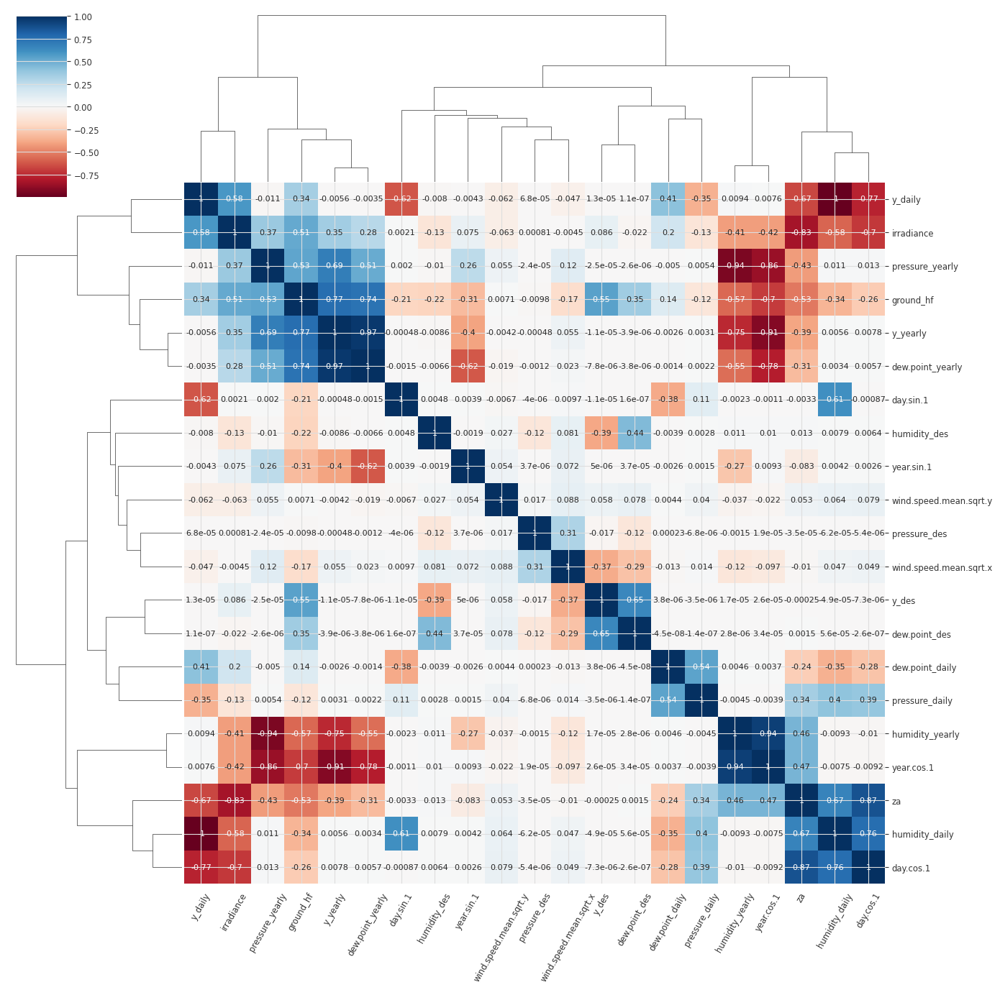

In [ ]:
train_df_red = train_df[['y_daily', 'y_yearly', 'y_des',
                         'humidity_daily', 'humidity_yearly', 'humidity_des',
                         'dew.point_daily', 'dew.point_yearly', 'dew.point_des',
                         'pressure_daily', 'pressure_yearly', 'pressure_des',
                         'wind.speed.mean.sqrt.x', 'wind.speed.mean.sqrt.y',
                         'irradiance', 'za', 'ground_hf',
                         'day.sin.1', 'day.cos.1', 'year.sin.1', 'year.cos.1']]

g = sns.clustermap(train_df_red.corr(),
                   method = "complete",
                   cmap   = 'RdBu',
                   annot  = True,
                   figsize=(14, 14),
                   annot_kws = {"size": 8})
plt.setp(g.ax_heatmap.get_xticklabels(), rotation=60)
plt.show()

There is strong correlation between:
 * `y_yearly` and `dew.point_yearly`
 * `y_yearly` and `pressure_yearly`
 * `humidity_yearly` and `year.cos.1`

There is also some correlation between:
 * `y_des` and `dew.point_des`
 * `humidity_daily` and `day.cos.1`
 * `irradiance` and `y_daily`

**TODO** List negative correlation cases

---

### Granger Causality Tests

Calculate Granger causality:

What and why - Granger causality

Issues with Granger causality:
 * non-linear relationships
 * does not account for confounders

In [ ]:
def grangers_causation_matrix(data, y_cols, x_cols, test='ssr_chi2test', maxlag=6, verbose=False):
    """Check Granger Causality of all possible combinations of the Time series.

    The rows are the response variable, columns are predictors.  The values in the table
    are the P-Values.  P-Values lesser than the significance level (0.05), implies
    the Null Hypothesis that the coefficients of the corresponding past values is
    zero, that is, the X does not cause Y can be rejected.

    data      : pandas dataframe containing the time series variables
    variables : list containing names of the time series variables.

    From https://www.machinelearningplus.com/time-series/vector-autoregression-examples-python/
    """

    gcm = pd.DataFrame(np.zeros((len(y_cols), len(x_cols))), columns=x_cols, index=y_cols)

    data_diff = pd.DataFrame()
    for c in gcm.columns:
      y = np.diff(data[c])[1:]
      data_diff[c] = y

    for c in gcm.columns:
      for r in gcm.index:
        test_result = grangercausalitytests(data_diff[[r, c]], maxlag, verbose=False)

        if type(maxlag) == int:
          p_values = [round(test_result[i + 1][0][test][1], 4) for i in range(maxlag)]

          if verbose: print(f'Y = {r}, X = {c}, P Values = {p_values}')

        elif type(maxlag) == list:
          p_values = round(test_result[maxlag[0]][0][test][1], 4)

        gcm.loc[r, c] = np.min(p_values)

    gcm.columns = [var + '_x' for var in x_cols]
    gcm.index   = [var + '_y' for var in y_cols]

    return gcm


gcm_y_cols = ['y_des']
gcm_x_cols = ['y_des', 'humidity_des', 'dew.point_des', 'pressure_des',
              'irradiance', 'za', 'ground_hf', 'wind.speed.mean.sqrt.x',
              'wind.speed.mean.sqrt.y', 'y_shadow']

max_lags = 6
print('\nmaxlags:', max_lags, '(up to and including)')
gcm = grangers_causation_matrix(train_df.dropna(),
                                gcm_y_cols,
                                gcm_x_cols,
                                test='ssr_ftest', maxlag=max_lags, verbose=True)
#display(gcm)

max_lags = 12
print('\nmaxlags:', max_lags, '(only)')
gcm = grangers_causation_matrix(train_df.dropna(),
                                gcm_y_cols,
                                gcm_x_cols,
                                test='ssr_chi2test', maxlag=[max_lags])
display(gcm)

max_lags = 24
print('\nmaxlags:', max_lags, '(only)')
gcm = grangers_causation_matrix(train_df.dropna(),
                                gcm_y_cols,
                                gcm_x_cols,
                                test='ssr_chi2test', maxlag=[max_lags])
display(gcm)

max_lags = 36
print('\nmaxlags:', max_lags, '(only)')
gcm = grangers_causation_matrix(train_df.dropna(),
                                gcm_y_cols,
                                gcm_x_cols,
                                test='ssr_chi2test', maxlag=[max_lags])
display(gcm)

max_lags = 48
print('\nmaxlags:', max_lags, '(only)')
gcm = grangers_causation_matrix(train_df.dropna(),
                                gcm_y_cols,
                                gcm_x_cols,
                                test='ssr_chi2test', maxlag=[max_lags])
display(gcm)


maxlags: 6 (up to and including)
Y = y_des, X = y_des, P Values = [1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
Y = y_des, X = humidity_des, P Values = [0.605, 0.0, 0.0, 0.0, 0.0, 0.0]
Y = y_des, X = dew.point_des, P Values = [0.9478, 0.0, 0.0, 0.0, 0.0, 0.0]
Y = y_des, X = pressure_des, P Values = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Y = y_des, X = irradiance, P Values = [0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
Y = y_des, X = za, P Values = [0.0002, 0.0003, 0.0001, 0.0, 0.0, 0.0001]
Y = y_des, X = ground_hf, P Values = [0.3554, 0.1743, 0.1579, 0.2446, 0.2275, 0.3102]
Y = y_des, X = wind.speed.mean.sqrt.x, P Values = [0.1427, 0.0, 0.0, 0.0, 0.0001, 0.0001]
Y = y_des, X = wind.speed.mean.sqrt.y, P Values = [0.9956, 0.0552, 0.0005, 0.0, 0.0, 0.0]
Y = y_des, X = y_shadow, P Values = [0.1618, 0.3561, 0.493, 0.5155, 0.1832, 0.1608]

maxlags: 12 (only)


,y_des_x,humidity_des_x,dew.point_des_x,pressure_des_x,irradiance_x,za_x,ground_hf_x,wind.speed.mean.sqrt.x_x,wind.speed.mean.sqrt.y_x,y_shadow_x
y_des_y,1.0,0.0,0.0,0.0,0.0,0.0001,0.4788,0.0,0.0,0.0089



maxlags: 24 (only)


,y_des_x,humidity_des_x,dew.point_des_x,pressure_des_x,irradiance_x,za_x,ground_hf_x,wind.speed.mean.sqrt.x_x,wind.speed.mean.sqrt.y_x,y_shadow_x
y_des_y,1.0,0.0,0.0,0.0,0.0,0.0,0.6622,0.0,0.0,0.0074



maxlags: 36 (only)


,y_des_x,humidity_des_x,dew.point_des_x,pressure_des_x,irradiance_x,za_x,ground_hf_x,wind.speed.mean.sqrt.x_x,wind.speed.mean.sqrt.y_x,y_shadow_x
y_des_y,1.0,0.0,0.0,0.0,0.0,0.0,0.4225,0.0,0.0,0.0567



maxlags: 48 (only)


,y_des_x,humidity_des_x,dew.point_des_x,pressure_des_x,irradiance_x,za_x,ground_hf_x,wind.speed.mean.sqrt.x_x,wind.speed.mean.sqrt.y_x,y_shadow_x
y_des_y,1.0,0.0,0.0,0.0,0.0,0.0,0.0002,0.0,0.0,0.0806


...

The [understanding output from statsmodels grangercausalitytests](https://stackoverflow.com/questions/51772493/understanding-output-from-statsmodels-grangercausalitytests) stackoverflow question is helpful.

---

### Normalise Data

Features do not need to be scaled for gradient boosting methods. Nonetheless, it can often be a
useful sanity check.

The [violin plot](https://en.wikipedia.org/wiki/Violin_plot) shows the distribution of features.

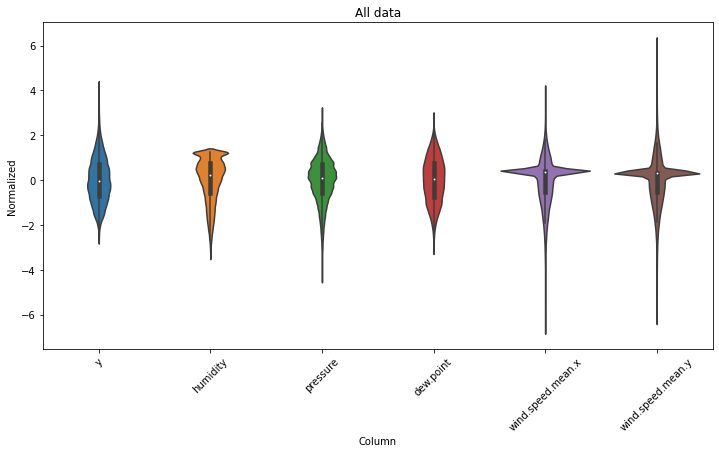

In [ ]:
def inv_transform(scaler, data, colName, colNames):
    """An inverse scaler for use in model validation section

    For later use in plot_forecasts, plot_horizon_metrics and check_residuals

    See https://stackoverflow.com/a/62170887/100129"""

    dummy = pd.DataFrame(np.zeros((len(data), len(colNames))), columns=colNames)
    dummy[colName] = data
    dummy = pd.DataFrame(scaler.inverse_transform(dummy), columns=colNames)

    return dummy[colName].values


cols = ['y', 'humidity', 'pressure', 'dew.point', 'wind.speed.mean.x',
        'wind.speed.mean.y']
train_df_norm = train_df.loc[:, cols]
scaler = StandardScaler()
scaler.fit(train_df_norm)

train_df_norm = scaler.transform(train_df_norm)
# valid_df[valid_df.columns] = scaler.transform(valid_df[valid_df.columns] )
# test_df[test_df.columns]   = scaler.transform(test_df[test_df.columns] )

#df_std = scaler.transform(df)
df_std = pd.DataFrame(train_df_norm)
df_std = df_std.melt(var_name = 'Column', value_name = 'Normalized')

plt.figure(figsize=(12, 6))
ax = sns.violinplot(x = 'Column', y = 'Normalized', data = df_std)
ax.set_xticklabels(cols, rotation = 45)
ax.set_title('All data');

Some features have long tails but there are no glaring errors.

---

...

...

---


## Conclusion

The best/worst results from the feature engineering ...

How and why are they similar/different?

...

The conclusion is separated into the following sections:
 1. What worked
 2. What didn't work
 3. Rejected ideas
 4. Future work

The commit history for
 * [gradient_boosting.ipynb](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/commits/main/notebooks/gradient_boosting.ipynb)
 * [tsfresh_feature_engineering.ipynb](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/tsfresh_feature_engineering.ipynb)
 * [feature_engineering.ipynb](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/feature_engineering.ipynb)

provides details for some of the points summarised below.

**Note** There are some TODOs scattered throughout the main text.

---

1. What worked:
   * switching to forecasting deseasonalised temperature instead of temperature
      * and adding yearly, daily and trend component to forecast
   * adding solar future covariate features
      * irradiance - beneficial
      * zenith angle - beneficial
      * azimuth angle - beneficial
      * sinusoidal and spline-based time components - not beneficial
      * daily and yearly temperature decomposition components - not beneficial
   * plotting temperature, humidity, dew point and pressure in [phase space](https://en.wikipedia.org/wiki/Phase_space)
     * interactive plotly express [scatter3d](https://plotly.com/python-api-reference/generated/plotly.express.scatter_3d.html) plots worked very well
     * still some obvious outliers present :-(  
     * otherwise, these features look periodic and deterministic
     * nothing obviously chaotic, such as the lobe switching seen in the [Lorenz attractor](https://en.wikipedia.org/wiki/Lorenz_system)
     * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/91b5927df436246c96f05ed414e64b8ef4478716/notebooks/gradient_boosting.ipynb)
   * missing data annotation
     * particularly `missing` feature for plots
     * and `mi_filled` (multiple imputation filled) feature for models
        * perhaps this indicates the multiple imputation is problematic
     * `hist_average` (historic average) also appeared in a few models
        * again this may indicate problems
     * this is less of an issue after most recent data cleaning
   * decomposing temperature and dew.point
      * into constant mean, daily seasonality, yearly seasonality plus residuals
      * prophet is overkill for this and too slow
         * could be replaced with some Fourier terms and scipy optimisation code
   * decomposing temperature, humidity and dew.point with [UnobservedComponents](https://www.statsmodels.org/dev/generated/statsmodels.tsa.statespace.structural.UnobservedComponents.html)
      * note that it supports additive seasonality only
      * this worked well but I didn't use it
      * it was probably fast enough but almost exceeded available RAM on Colab
         * **update** switching to method='powell' appears to fix this
      * see last [relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/ddc35e3c8fcb91da49d8b24df240e3e484029ea1/notebooks/gradient_boosting.ipynb)
      * see also
         * [Detrending, Stylized Facts and the Business Cycle](https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_structural_harvey_jaeger.html)
         * [Seasonality in time series data](https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_seasonal.html)
   * Fourier-based seasonal decomposition
      * *daily* autocorrelation plots comparing `y` with `y_des` and `dew.point` with `dew.point_des` indicate remaining seasonality
      * possibly some winter versus summer daily variation remains
        * neither prophet or [statsmodels UCM](https://www.statsmodels.org/dev/examples/notebooks/generated/statespace_structural_harvey_jaeger.html) multi-seasonal decompositions capture this seasonal variation
      * Fourier-based daily and yearly decomposition including phase and amplitude changes on averaged data managed to capture increased variation in summer but less so in winter
        * yielding the deseasonalised `y_des_fft` and `dew.point_des_fft` features
        * lightgbm models built with `y_des_fft` and `dew.point_des_fft` produced results which are statistically indistinguishable from models built with `y_des` and `dew.point_des`
        * Fourier-based decomposition was much faster than Prophet decomposition
        * despite the longer run time I decided to use only the Prophet decomposition due to it's relative simplicity
        * Fourier-based decomposition across the entire time series (non-averaged data) gave poor results
          * bad qq plot and other diagnostics
          * this approach also requires constantly updating the decomposition before forecasting to avoid data leakage
        * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/84e6804e1fd8666cccd7b92ae5d8766ff4e49457/notebooks/gradient_boosting.ipynb)






---

2. What didn't work:
   * plotting Takens's embedding
     * [Takens's theorem](https://en.wikipedia.org/wiki/Takens%27s_theorem)
     * no insight gained
     * didn't try to optimise delay setting
     * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/91b5927df436246c96f05ed414e64b8ef4478716/notebooks/gradient_boosting.ipynb)
   * spline-based time components
   * higher frequency sinusoidal time components
   * phase-shifted sinusoidal time components
   * unsurprisingly, given the above, [darts future cyclic encoders](https://unit8co.github.io/darts/generated_api/darts.dataprocessing.encoders.encoders.html)
      * [last relevant commit](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/5db169d82ed04e316da8bb30e757ceaa4aade027/notebooks/gradient_boosting.ipynb)
   * calculated features
      * mixing ratio and absolute humidity - not beneficial
         * both have high correlation with dew point
            * absolute humidity 0.962
            * mixing ratio 0.96
      * vapour pressure - not beneficial
      * vapour pressure deficit - not beneficial
      * air density - not beneficial
      * water vapour concentration - not beneficial
      * specific humidity - not beneficial
      * potential temperature - not beneficial
   * smoothing `humidity` with simple moving average
   * tsfresh features
      * some subset of these features may be useful
      * tsfresh feature extraction was ran early on in the process
      * it is probably worthwhile re-examining these features
      * [last commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/cdad6453bc00978ec96ce6eb3283ff2ac467dec6/notebooks/gradient_boosting.ipynb)
      * see also:
         * tsfresh sub-section in Future Work section below
         * Conclusion in the [tsfresh_feature_engineering.ipynb](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/main/notebooks/tsfresh_feature_engineering.ipynb) notebook
   * simple rolling statistical features
      * rolling min, max, mean, standard deviation, skew and kurtosis over 12 and 48 step windows
      * mercifully fast to compute though
   * [shap.Explainer](https://shap.readthedocs.io/en/latest/generated/shap.Explainer.html) with lightgbm model ran out of RAM and crashed after running for 2 hours
   * mixup
      * darts TimeSeries requires `freq` be specified
      * won't work with irregularly time spaced mixup data augmentation
      * should work between years or days though
   * seasonal decomposition
     * `humidity`, `pressure`, `wind.x` and `wind.y`
        * using simple additive daily mean plus residuals
        * still surprised I couldn't generate a decent `pressure` decomposition
     * `pressure`
       * EMD - empirical mode decomposition
         * Similar to the Fourier transform, empirical mode decomposition (EMD) can be used to decompose signals into a finite number of components
         * [Empirical mode decomposition](https://en.wikipedia.org/wiki/Hilbert%E2%80%93Huang_transform)
         * [EMD-signal package](https://github.com/laszukdawid/PyEMD)
         * Disappointing results for `pressure`  
         * The components (IMFs or intrinsic mode functions) seem highly irregular
         * Perhaps it is necessary to average the annual measurements first or scale and center the data or tune some hyperparameter or there are tricks unknown to me
           * See this paper: [New insights and best practices for the successful use of Empirical Mode Decomposition, Iterative Filtering and derived algorithms](https://www.nature.com/articles/s41598-020-72193-2)
         * Wind speed may have been a better choice to decompose because it is nonstationary and nonlinear which EMD is designed to work with
         * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/4af704125f5e7c33d83d4a30d222ceea1c0ad95b/notebooks/gradient_boosting.ipynb)

       * SSA - singular spectral analysis
         * [Singular spectrum analysis](https://en.wikipedia.org/wiki/Singular_spectrum_analysis) (SSA) can help with the decomposition of time series  
         * Implemented in the [pyts package](https://pyts.readthedocs.io/)
         * Used the [SingularSpectrumAnalysis](https://pyts.readthedocs.io/en/stable/generated/pyts.decomposition.SingularSpectrumAnalysis.html#pyts.decomposition.SingularSpectrumAnalysis) function to decompose `pressure`
         * Again, disappointing results for `pressure`
         * The components (SSAs) seem highly irregular
         * Perhaps it is necessary to average the annual measurements first or scale and center the data or tune some hyperparameter or there are tricks unknown to me
         * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/4af704125f5e7c33d83d4a30d222ceea1c0ad95b/notebooks/gradient_boosting.ipynb)

       * statsmodels STL and MSTL
         * The [statsmodels package](https://www.statsmodels.org/) has two LOESS (locally estimated scatterplot smoothing) based functions to extract smooth estimates of three components (season, trend and residuals)
           * [STL - Season-Trend decomposition using LOESS](https://www.statsmodels.org/devel/generated/statsmodels.tsa.seasonal.STL.html)
           * [MSTL - Season-Trend decomposition using LOESS for multiple seasonalities](https://www.statsmodels.org/dev/generated/statsmodels.tsa.seasonal.MSTL.html)
         * first STL run and MSTL run
           * I tried seasonal decomposition with MSTL once and STL once
              * MSTL was horrendously slow due to the long annual seasonality (17,532)
           * Again, disappointing results for `pressure`
           * The trend and seasonal components seem irregular
           * Perhaps it is necessary to average the annual measurements first and/or more hyperparameter tuning is required
           * [last relevant commit before removal of MSTL run and first STL run](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/4af704125f5e7c33d83d4a30d222ceea1c0ad95b/notebooks/gradient_boosting.ipynb)
        * second STL run
          * this [notebook example](https://www.statsmodels.org/dev/examples/notebooks/generated/stl_decomposition.html#Performance) shows using the trend to capture a cycle and the seasonality to capture a sinusoidal pattern with some amplitude change
          * I created an annual temperature average series but the trend was still irregualr
          * unfortunately no alpha smoothing parameter to tune and no window length parameter to tune
          * exponential smoothing did not help smooth the irregularity in the annual cycle
          * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/80d906b2b32f7ca010728866b6869d9aa1cc77da/notebooks/gradient_boosting.ipynb)

   * adding ground heat flux
      * may have high feature importance due to being co-linear with `y` target variable
      * for simplicity I ignored daily and yearly ground reservoir temperature variations
      * along with solar irradiance it is part of the radiative flux balance equation at the surface of the earth
      * see
         * [surface energy balance](https://en.wikipedia.org/wiki/Earth%27s_energy_budget)
         * my [ParametricWeatherModel](https://github.com/makeyourownmaker/ParametricWeatherModel) repository
         * [lecture notes summary](http://www.met.reading.ac.uk/~swrhgnrj/teaching/MT23E/mt23e_notes.pdf) including daily ground reservoir temperature variations
   * wind features
      * none of the wind features were beneficial
      * wind is caused by differences in atmospheric pressure
         * I presume this is a process that is downstream from temperature changes
      * autocorrelation plots indicated
         * relatively weak short term seasonality
         * almost no long term seasonality - similar to `pressure`
         * `wind.speed.max` has slightly stronger seasonality than `wind.speed.mean`
         * wind `x` components had stronger seasonality than the `y` components
   * declination angle
      * [from solarpy](https://github.com/aqreed/solarpy/blob/master/examples/g_eq-of-time_declination.ipynb)
      * not useful in lightgbm models
   * adding climate indices from NOAA
      * North atlantic oscillation - `nao-monthly` monthly and `nao-daily` daily
      * Multivariate ENSO Index (`mei`)
      * neither feature proved beneficial
      * complex non-linear interactions between climate indices
      * if one or more are leading indicators then leading by how much?
        * almost certainly varys
   * multi-dimensional similarity between years
      * calculated using both [Procrustes](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.procrustes.html#scipy.spatial.procrustes) and [Hausdorff](https://docs.scipy.org/doc/scipy/reference/generated/scipy.spatial.distance.directed_hausdorff.html) methods
      * also included color-coded rmse between annual temperature distributions
      * lightgbm feature selections (after Boruta exclusions)
      * worked without problem but not that insightful
      * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/bc454abb2f7864233f92afa2191cc2a9ade85412/notebooks/gradient_boosting.ipynb)
   * range blending from [Forecasting with gradient boosted trees: augmentation, tuning, and cross-validation strategies: Winning solution to the M5 Uncertainty competition](https://www.sciencedirect.com/science/article/pii/S0169207021002090)
      * with temperature, dew point and relative humidity approximation formulas
      * assumed zero wind change
      * [Compute dew point from relative humidity & temperature](https://carnotcycle.wordpress.com/2017/08/01/compute-dewpoint-temperature-from-rh-t/)
      * early experiments didn't show any improvement
      * possibly worth revisiting
      * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/c50fa6bcbc54a0bead735f948a10772e8f56a882/notebooks/gradient_boosting.ipynb)
   * rainfall and sunshine observations
      * previously excluded due to noise
      * sunshine had too many missing values to be useful
      * rainfall did not prove useful in lightgbm models
         * sum of rainfall over previous 6, 12, 24, 48 hours slightly better
   * [atmospheric transmittance](https://www.sciencedirect.com/topics/earth-and-planetary-sciences/transmittance) heuristic feature
      * see implementation in `add_transmit_heuristic_feature` function
      * based on Table 1 and Equation 10 from
         * [Estimating Hourly Incoming Solar Radiation from Limited Meteorological Data by Kurt Spokas, Frank Forcella](https://www.jstor.org/stable/4539375?seq=2)
         * based on the concept that wet and dry days affect solar radiation through influences on cloud cover
         * **a good proxy variable for cloud cover could potentially be an extremely valuable addition**
         * see [Earth's energy budget](https://en.wikipedia.org/wiki/Earth%27s_energy_budget) for cloud cover contribution to climate
      * small simple decision tree but parameters probably need tuning for Cambridge UK
      * showed some promise
      * care should be taken when adding heuristics and approximations like this
         * the uncertainty they add may outweigh any benefits
         * parameterisation schemes like this are always a bit questionable
      * the diffuse radiation approximation in the same article may or may not have been a better choice to implement
   * data from NASA POWER project
      * [Prediction of Worldwide Energy Resources](https://power.larc.nasa.gov/)
      * download code based on [nasa-power-api](https://github.com/kdmayer/nasa-power-api)
      * hourly data - resampled and linearly interpolated to every 30 mins
      * good correlations for temperature, pressure (0.96, 0.97) and reasonable correlations for dew point and humidity (0.8, 0.82)
         * NASA POWER may be useful for filling missing values
      * data from 2008 to 2020 inclusive were downloaded and prepended to existing data
      * `pressure` had to be converted to appropriate units
      * tested with both lightgbm and TiDE models
         * no future covariates were used
      * neither model benefited from NASA POWER data
      * may have been worthwhile building model on only NASA POWER data then testing on Cambridge `valid_df`
      * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/d9ec66ac70a948d73569bddb7a3265854139d131/notebooks/gradient_boosting.ipynb)
   * time series mixup
      * time series specific mixup
         * based on [mixup: Beyond Empirical Risk Minimization](https://arxiv.org/abs/1710.09412)
      * original data is shifted back by one year and mixup is ran between existing data and shifted data
      * `ts_mixup(train_df, alpha=0.5, factor=5, time_diff=17532)`
         * 1.2 million rows including the original `train_df`
      * `dew_point_approx` function is used to ensure consistency between `y`, `dew.point` & `humidity`
         * `pressure` would benefit from being made consistent with `y`, `dew.point` and `humidity`
         * not currently aware of an appropriate approximation
      * was not helpful with 48 step-ahead lightgbm model
         * no future covariates used
         * perhaps additional new rows are largely redundant :-(
         * the mixup method is most benficial when used on mini-batches with a deep learning architecture
           * the so-called 'input' mixup used here is very likely less effective
      * [last relevant commit before removal](https://github.com/makeyourownmaker/CambridgeTemperatureNotebooks/blob/cc42a69c85f065643c577b72960700bd2d36c47a/notebooks/gradient_boosting.ipynb)



---

3. Rejected ideas:
   * [calculating wind chill index](https://en.wikipedia.org/wiki/Wind_chill#North_American_and_United_Kingdom_wind_chill_index)
      * makes sense for electricity load forecasting but not for temperature forecasting

---

4. Future work:
   * data processing
      * rename wind `x` and `y` components
         * use cardinal compass directions instead
      * improve imputation
         * [missForest](https://github.com/stekhoven/missForest) seems to [perform reasonably well](https://arxiv.org/pdf/2309.09968.pdf)
            * [see table 3](https://arxiv.org/pdf/2309.09968.pdf)
            * should be straight-forward to setup :-)
         * see also the [hyperimpute](https://github.com/vanderschaarlab/hyperimpute) framework
            * supports missForest and other methods
         * alternatively, just use KNN
      * double check units used in following calculated values
         * potential temperature
         * saturation water vapor pressure
         * actual water vapor pressure
         * specific humidity
         * water vapor concentration
         * air density
         * compare by rerunning calculations on [Jena weather data](https://www.bgc-jena.mpg.de/wetter/)
         * [Documentation of the Jena weather station](https://www.bgc-jena.mpg.de/wetter/Weatherstation.pdf)
      * focus on data leakage
         * cleaning based imputation model(s) built on train set years
         * remove Dec 31st 2017, 2018, 2019 or similar
         * consider removing duplicates across train, test, valid splits
         * see also: Leakage and the Reproducibility Crisis in ML-based Science
            * [paper](https://arxiv.org/pdf/2207.07048.pdf)
            * [web site](https://reproducible.cs.princeton.edu/)
   * use the temperature, dew point and relative humidity approximations to fill missing values instead of imputation, historic values etc
      * could improve multiple imputation and historic averages issues
      * [Compute dew point from relative humidity & temperature](https://carnotcycle.wordpress.com/2017/08/01/compute-dewpoint-temperature-from-rh-t/)
         * ensure calculated dew point does not exceed temperature
      * very few cases where this could be useful
         * most missing values occur with missing values from other features
      * alternatively, use approximations to find outliers
      * worth bearing in mind for the future
   * seasonal components
      * build some models using the UCM decompositions
      * transform `humidity` before decomposition
         * relative humidity is both right and left censored
         * explore transformations
            * [logit](https://en.wikipedia.org/wiki/Logit) "pulls" data into central regions
      * alternatively decompose calculated absolute humidity values
         * the raw calculated absolute humidity did not prove to be beneficial but perhaps a decomposed version would be better
      * decompose `pressure`, `humidity`
        * [prophet decompositions](https://facebook.github.io/prophet/docs/seasonality,_holiday_effects,_and_regressors.html) of temperature and `dew.point` are worthwhile but may not be ideal
        * [wavelets](https://en.wikipedia.org/wiki/Daubechies_wavelet), [VMD](https://github.com/vrcarva/vmdpy) etc
           * check method assumptions etc
           * check [dsatools](https://github.com/MVRonkin/dsatools) for python implementations
        * probably not [ICA](https://en.wikipedia.org/wiki/Independent_component_analysis) which has strong independence assumptions which may not apply to daily and yearly seasonality extraction
      * decompose temperature, dew point and humidity together
        * [DMD - Dynamic mode decomposition](https://en.wikipedia.org/wiki/Dynamic_mode_decomposition)
          * specifically [multi-resolution DMD](https://humaticlabs.com/blog/mrdmd-python/)
          * [PyDMD - Python Dynamic Mode Decomposition package](https://github.com/PyDMD/PyDMD)
            * [multi-resolution DMD tutorial](https://pydmd.github.io/PyDMD/tutorial3mrdmd.html)
          * necessary to average annual measurements?
          * scale and center data
          * restrict number of modes to 2 (annual and daily) if possible
   * check denoising
      * for example [total variation denoising for signals](https://contrib.scikit-learn.org/lightning/auto_examples/plot_1d_total_variation.html)
        * note, not total variation for images
        * unlike moving averages total variation acts as an [edge-preserving filter](https://en.wikipedia.org/wiki/Edge-preserving_smoothing)
        * see also [1D-MCTV-Denoising](https://github.com/MrCredulous/1D-MCTV-Denoising)
        * many other methods to choose between
   * variable selection
      * calculate [Shapley values](https://en.wikipedia.org/wiki/Shapley_value) for each feature
      * on a subset of the training data to reduce compute time
         * hope to avoid earlier mentioned shap.Explainer problems
      * [Using causal discovery for feature selection in multivariate numerical time series](https://link.springer.com/article/10.1007/s10994-014-5460-1)
         * Uses Granger causality tests to identify causal features and effective sliding window sizes (lag selection) in multivariate numerical time series
         * potentially a fair bit of effort to implement
   * observation selection
      * approximate the 'value' of each observation using 'data Shapley values'
      * again compute time could be a problem
      * [Data Shapley: equitable valuation of data for machine learning](http://proceedings.mlr.press/v97/ghorbani19c/ghorbani19c.pdf)
        * [Adrian Colyer's summary](https://blog.acolyer.org/2019/07/15/data-shapley/)
      * alternatively, consider exluding some of the older data
          * some of this data was gathered with older sensors now replaced
   * feature engineering/extraction
      * try approximating cloud cover
        * using shortwave radiation flux
           * from [NOAA GFS](https://www.ncei.noaa.gov/products/weather-climate-models/global-forecast)?
              * [https://github.com/jagoosw/getgfs](https://github.com/jagoosw/getgfs) works well but only for the real-time server
              * [https://github.com/albertotb/get-gfs](https://github.com/albertotb/get-gfs) historic data back to August 2019
              * data back to 2015-01-01 [https://rda.ucar.edu/datasets/ds084.1/](https://rda.ucar.edu/datasets/ds084.1/)
              * [historic GFS data](https://www.ncei.noaa.gov/data/global-forecast-system/access/)
                 * various resolutions and timelines
                 * multiple file locations
                 * evolving set of features
                 * start with most recently updated data
                 * situation normal ...
           * availability timeline?
           * is this an observation or a calculated value?
           * how much confidence should be placed in it?
        * combined with equations from [Evaluation of Clear-Sky Incoming Radiation Estimating Equations Typically Used in Remote Sensing Evapotranspiration Algorithms](https://www.mdpi.com/2072-4292/5/10/4735/htm)
           * clear-sky only :-(
             * possibly worth exploring the [clear sky detection](https://pvlib-python.readthedocs.io/en/v0.10.2/user_guide/clearsky.html#detect-clearsky) provided by the python [pvlib package](https://pvlib-python.readthedocs.io/) - requires global horizontal irradiance
        * check what [pirateweather](http://pirateweather.net/en/latest/#historic-data) is using
        * not a perfect proxy
           * doesn't work at night
           * there are other factors that can impact shortwave radiation other than cloud cover
      * [pvlib](https://pvlib-python.readthedocs.io/) calculations
        * [precipitable water approximation](https://pvlib-python.readthedocs.io/en/v0.10.2/reference/generated/pvlib.atmosphere.gueymard94_pw.html#pvlib.atmosphere.gueymard94_pw)
        * clear sky [global horizontal irradiance, direct normal irradiance and diffuse horizontal](https://pvlib-python.readthedocs.io/en/v0.10.2/reference/generated/pvlib.clearsky.ineichen.html#pvlib.clearsky.ineichen)
        * also clear sky detection mentioned above
      * tsfresh
        * explore feature selection with recursive elimination and/or recursive addition
           * or [Minimum Redundancy Maximum Relevance (mRMR)](https://en.wikipedia.org/wiki/Minimum_redundancy_feature_selection)
           * [python implementation](https://github.com/smazzanti/mrmr)
        * try shorter and longer lagged windows - 12, 24, 96, 144
        * consider repeating on a subset of non-seasonal, non-cyclic decomposed time series
      * investigate [cesium features](http://cesium-ml.org/docs/feature_table.html)
      * try [pyts](https://pyts.readthedocs.io/)
         * specifically the [transformations](https://pyts.readthedocs.io/en/stable/modules/transformation.html)
           * [shapelets](https://pyts.readthedocs.io/en/stable/generated/pyts.transformation.ShapeletTransform.html)
           * [ROCKET](https://pyts.readthedocs.io/en/stable/generated/pyts.transformation.ROCKET.html)

      * check entropy and complexity features from [antropy](https://github.com/raphaelvallat/antropy)
         * this should already be installed as a dependency of tsfeatures
      * [seglearn](https://dmbee.github.io/seglearn/index.html)
         * segmentation, feature extraction, feature processing
      * [MatrixProfile](https://matrixprofile.org/)
         * data structure and associated algorithms that helps solve the dual problem of anomaly detection and motif discovery
         * [python interface](https://github.com/TDAmeritrade/stumpy)
         * possible long run times but there is a GPU version
      * [ROCKET](https://github.com/angus924/rocket)
         * random convolutions
         * variants include [MINIROCKET](https://github.com/angus924/minirocket) and [HYDRA](https://github.com/angus924/hydra)
         * [ROCKET also available in pyts](https://pyts.readthedocs.io/en/stable/generated/pyts.transformation.ROCKET.html)
      * signature transform
         * [The signature method in machine learning](https://github.com/kormilitzin/the-signature-method-in-machine-learning)
         * extracts information about order and area (which represents all possible nonlinear effects)
         * can support multi-dimensional sequence data
         * have not seen a good benchmark for this method but apparently does well at character recognition
         * lead lag and other time based path embeddings are also interesting
           * see figures 3 and 4 from [Signature Methods in Machine Learning](https://arxiv.org/pdf/2206.14674.pdf)
         * can't imagine it replacing Fourier basis for periodic signals
           * may have utility for higher entropy data sets
         * packages: [esig](https://pypi.org/project/esig/), [signatory](https://github.com/patrick-kidger/signatory), [iisignature](https://github.com/bottler/iisignature)
      * consider numpy peak finding functions
         * [find_peaks](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html)
         * [peak_widths](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.peak_widths.html#scipy.signal.peak_widths)
         * [peak_prominences](https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.peak_prominences.html#scipy.signal.peak_prominences)
      * explore time series changepoint detection methods
         * [bayesian_changepoint_detection](https://github.com/hildensia/bayesian_changepoint_detection/)
            * includes [multi-variate support](https://github.com/hildensia/bayesian_changepoint_detection/blob/master/Multivariate_Example.ipynb)
         * or [Bayesian online changepoint detection](https://github.com/gwgundersen/bocd/)
      * anomoly detection
         * Time series Outlier Detection [TODS](https://github.com/datamllab/tods)
         * [TODS docs](https://tods-doc.github.io/)
         * based on very comprehensive [PyOD](https://pyod.readthedocs.io/en/latest/) package
      * explore transformations
         * Fourier
         * wavelets
            * including the cross-wavelet transform
               * method that characterizes the interaction between the wavelet transform of two individual time-series
            * [aprovecharLab/spectrograms.ipynb](https://gist.github.com/aprovecharLab/7654032c64370672b933559f887afd56) - May be easiest starting point
            * [R - WaveletComp package](https://cran.r-project.org/web/packages/WaveletComp/index.html) - More comprehensive
               * see also: [WaveletComp Guided Tour](http://www.hs-stat.com/projects/WaveletComp/WaveletComp_guided_tour.pdf)
               * particularly section 6 - weather and radiation
            * [PyCWT: spectral analysis using wavelets in Python](https://pycwt.readthedocs.io/en/latest/) - [reportedly](https://stackoverflow.com/questions/73057727/python-tools-for-cross-wavelet-transform) has issues?
      * see also [sktime transformations](https://www.sktime.net/en/latest/api_reference/transformations.html)
      * multivariate features
        * some of the previously used bivariate features are still applicable
          * eg distances/correlations between last 24 hours and the 24 hours before that
        * multivariate correlations and distances
          * Multiscale Graph Correlation test statistic
          * [multiscale_graphcorr in scipy](https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.multiscale_graphcorr.html#scipy.stats.multiscale_graphcorr)
          * [hyppo package](https://github.com/neurodata/hyppo) for multivariate hypothesis testing
          * [time series tutorial](https://github.com/neurodata/hyppo/blob/main/tutorials/time_series.py)
          * see paper for details: Shen, C., Priebe, C.E., & Vogelstein, J. T. (2019). From distance correlation to multiscale graph correlation. Journal of the American Statistical Association.
        * [Non-linear time related feature interactions with kernels](https://scikit-learn.org/stable/auto_examples/applications/plot_cyclical_feature_engineering.html#modeling-non-linear-feature-interactions-with-kernels)
          * modeling all pairwise and higher interactions will create a large number of features which can cause overfitting and computational tractability issues
          * in number of training examples, storage and computational cost required to solve the kernel method is quadratic and cubic respectively
          * the [Nyström method](https://en.wikipedia.org/wiki/Low-rank_matrix_approximations#Nystr%C3%B6m_approximation) can compute an approximate kernel expansion for feature interactions
          * other [kernel approximations](https://scikit-learn.org/stable/modules/kernel_approximation.html) may also be applicable
            * the [RBFSampler](https://scikit-learn.org/stable/modules/kernel_approximation.html#radial-basis-function-kernel) in particular
          * see also this [sklearn notebook on kernel approximation](https://scikit-learn.org/stable/auto_examples/miscellaneous/plot_kernel_approximation.html#sphx-glr-auto-examples-miscellaneous-plot-kernel-approximation-py)
      * some redundancy between all these feature engineering/extraction packages
         * diminishing returns will set in, if they haven't already!
      * [tsflex](https://github.com/predict-idlab/tsflex)
         * convenient looking package for time series feature extraction and processing
         * may make using above feature extraction packages more convenient
            * flexible feature calculations - one-to-many, many-to-one etc
            * supports multi-processing
            * memory efficient
         * [see tsflex docs](https://predict-idlab.github.io/tsflex/)
   * use lightgbm to generate new features for use with other forecast methods
      * first introduced by facebook in [Practical Lessons from Predicting Clicks on Ads at
Facebook](http://quinonero.net/Publications/predicting-clicks-facebook.pdf)
      * effectively uses lightgbm as a feature transform, or an embedding if you prefer
      * each element of the new feature vector corresponds to a leaf node from one of the trees in the boosting model
      * the length of the new feature vector is equal to the sum of the number of leaf nodes contained in all trees in the boosting model
      * you can use `predict(..., pred_leaf=True`), or similar option, to get the leaf_Index of each sample on each tree
      * then one-hot encode the result
      * see also: [The principle and practice of RF, GBDT and Xgboost constructing new features](https://blog.csdn.net/anshuai_aw1/article/details/82983997)
   * data augmentation
      * probably best when combined with equation approximations for temperature, dew point & relative humidity
      * python packages
        * [tsaug](https://github.com/arundo/tsaug)
        * [time_series_augmentation](https://github.com/uchidalab/time_series_augmentation)
        * [Data-Augmentation-For-Wearable-Sensor-Data](https://github.com/terryum/Data-Augmentation-For-Wearable-Sensor-Data)
      * [Bagging Exponential Smoothing Methods using STL Decomposition and Box-Cox Transformation](https://citeseerx.ist.psu.edu/viewdoc/download?doi=10.1.1.450.5986&rep=rep1&type=pdf)
        * Hyndman et al
        * Interesting approach and not much work with decomposition experiments above
      * randomly apply
        * randomly swap 2 observation rows
        * randomly delete observation rows
        * randomly insert observation rows
        * randomly replace observation rows with similar rows
        * cutout, cutmix, mixup
   



---

## Metadata

Python and Jupyter versions plus modules imported and their version strings.
This is the poor man's python equivalent of R's sessionInfo().

Code for imported modules and versions adapted from this stackoverflow answer.
There are simpler alternatives, such as watermark, but they all require installation.

In [ ]:
import sys
import IPython

print("Python version:")
print(sys.executable)
print(sys.version)
print("\nIPython version:")
print(IPython.__version__)

Python version:
/usr/bin/python3
3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]

IPython version:
5.5.0


In [ ]:
import pkg_resources
import types

def get_imports():
    for name, val in globals().items():
        if isinstance(val, types.ModuleType):
            # Split ensures you get root package,
            # not just imported function
            name = val.__name__.split(".")[0]

        elif isinstance(val, type):
            name = val.__module__.split(".")[0]

        # Some packages are weird and have different
        # imported names vs. system/pip names.  Unfortunately,
        # there is no systematic way to get pip names from
        # a package's imported name.  You'll have to add
        # exceptions to this list manually!
        poorly_named_packages = {
            "PIL":       "Pillow",
            "sklearn":   "scikit-learn",
        }
        if name in poorly_named_packages.keys():
            name = poorly_named_packages[name]

        yield name

imports = list(set(get_imports()))

# The only way I found to get the version of the root package
# from only the name of the package is to cross-check the names
# of installed packages vs. imported packages
requirements = []
for m in pkg_resources.working_set:
    if m.project_name in imports and m.project_name != "pip":
        requirements.append((m.project_name, m.version))

reqs = pd.DataFrame(requirements, columns = ['name', 'version'])
print("Imported modules:")
reqs.style.hide_index()

Imported modules:


name,version
seaborn,0.11.2
scikit-learn,1.0.2
pandas,1.3.5
numpy,1.21.6
matplotlib,3.2.2
keras,2.10.0


In [ ]:
!lscpu

Architecture:        x86_64
CPU op-mode(s):      32-bit, 64-bit
Byte Order:          Little Endian
CPU(s):              2
On-line CPU(s) list: 0,1
Thread(s) per core:  2
Core(s) per socket:  1
Socket(s):           1
NUMA node(s):        1
Vendor ID:           GenuineIntel
CPU family:          6
Model:               85
Model name:          Intel(R) Xeon(R) CPU @ 2.00GHz
Stepping:            3
CPU MHz:             2000.178
BogoMIPS:            4000.35
Hypervisor vendor:   KVM
Virtualization type: full
L1d cache:           32K
L1i cache:           32K
L2 cache:            1024K
L3 cache:            39424K
NUMA node0 CPU(s):   0,1
Flags:               fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ss ht syscall nx pdpe1gb rdtscp lm constant_tsc rep_good nopl xtopology nonstop_tsc cpuid tsc_known_freq pni pclmulqdq ssse3 fma cx16 pcid sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm abm 3dnowprefetch invpcid_si

In [ ]:
!date

Sat Jun 18 14:10:54 UTC 2022


---


## Archival

Archive code, markdown, history and formatted notebooks.

Assumes all pdf, html, latex etc dependencies are installed.

**WARNING** Will overwrite existing files.

Notebook name is hardcoded below because the alternative is ghastly globs of unreliable javascript or external ipython libraries I'd prefer to avoid installing :-(

In [ ]:
from time import sleep

notebook = "gradient_boosting.ipynb"
# !jupyter nbconvert --to script {notebook}
# !jupyter nbconvert --execute --to html {notebook}
# !jupyter nbconvert --execute --to pdf {notebook}
# !jupyter nbconvert --to pdf {notebook}

%rm history.txt
%history -f history.txt

!jupyter nbconvert --to python {notebook}
sleep(5)
!jupyter nbconvert --to markdown {notebook}
sleep(5)
!jupyter nbconvert --to html {notebook}